This code is designed for data collect from Nikon JOBS, name the sample as "Rep_D6_087.nd2", have 3 channel, DAPI, GFP, Dsred in z stacks.

In [1]:
# =============================================================================
# Cell 1: Import Libraries and Check CUDA Availability
# =============================================================================
import os
import re
import gc
import torch
import numpy as np
import tifffile
import pandas as pd
from nd2reader import ND2Reader
from tqdm import tqdm
from cellpose import models

# Check if CUDA is available
cuda_available = torch.cuda.is_available()
print(f"CUDA Available: {cuda_available}")
if cuda_available:
    gpu_name = torch.cuda.get_device_name(0)
    print(f"GPU Name: {gpu_name}")
else:
    print("No GPU detected or CUDA is not available.")

CUDA Available: True
GPU Name: NVIDIA GeForce RTX 4090


In [2]:
# check the iamge file for example
import os
from nd2reader import ND2Reader

def check_nd2_info(nd2_path):
    """
    Opens an ND2 file and prints image information including:
      - Detected axes
      - Image dimensions (shape)
      - Channel names (if available)
      - Additional metadata
    """
    try:
        with ND2Reader(nd2_path) as img:
            print(f"\nProcessing ND2 File: {os.path.basename(nd2_path)}")
            print("Detected Axes:", img.axes)
            print("Image Shape:", img.shape)
            
            channels = img.metadata.get('channels')
            if channels:
                print("Channels:", channels)
            else:
                print("No channel information available in metadata.")
            
            # Print additional metadata keys and values
            print("Additional Metadata:")
            for key, value in img.metadata.items():
                print(f"  {key}: {value}")
    except Exception as e:
        print(f"Error processing {nd2_path}: {e}")

# Specify the ND2 file you want to inspect
nd2_file_path = r"A:\_Ongoing\20250329_Rep\Act_A1_001.nd2"
check_nd2_info(nd2_file_path)



Processing ND2 File: Act_A1_001.nd2
Detected Axes: ['x', 'y', 'c', 't', 'z']
Image Shape: (7, 900, 600)
Channels: ['40x 405', '40x 561', '40x 488']
Additional Metadata:
  height: 900
  width: 600
  date: 2025-03-31 09:22:21
  fields_of_view: [0]
  frames: [0]
  z_levels: range(0, 7)
  z_coordinates: [4914.220000000008, 4914.840000000008, 4915.420000000008, 4916.040000000008, 4916.600000000009, 4917.240000000008, 4917.840000000008]
  total_images_per_channel: 7
  channels: ['40x 405', '40x 561', '40x 488']
  pixel_microns: 0.273400847258364
  num_frames: 1
  experiment: {'description': '', 'loops': []}
  events: []


In [3]:
# =============================================================================
# Configuration: Define Channel Names (Edit these if channel names change)
# =============================================================================
CHANNEL_DAPI  = '40x 405'   # Used for cell mask generation
CHANNEL_DsRed = '40x 561'
CHANNEL_GFP   = '40x 488'

In [58]:
# =============================================================================
# Function: Convert ND2 to TIFF for a Given Channel
# =============================================================================
def convert_nd2_to_tiff_channel(nd2_path, tiff_output_dir, channel_name):
    """
    Converts an ND2 file to TIFF files by performing a maximum intensity projection
    over the z-axis for the specified channel.
    
    Parameters:
      nd2_path: Path to the input ND2 file.
      tiff_output_dir: Directory where the TIFF files will be saved.
      channel_name: Name of the channel to extract.
    """
    try:
        with ND2Reader(nd2_path) as img:
            print(f"\nProcessing ND2 file: {os.path.basename(nd2_path)}")
            print("Detected Axes:", img.axes)
            print("Detected Shape:", img.shape)
            
            channels = img.metadata.get('channels')
            if channels is None:
                raise ValueError("No channel information found in ND2 metadata.")
            print("Channels in file:", channels)
            
            if channel_name in channels:
                channel_index = channels.index(channel_name)
                print(f"Using channel '{channel_name}' at index {channel_index}.")
            else:
                print(f"Channel '{channel_name}' not found in {nd2_path}. Skipping conversion for this channel.")
                return
            
            img.default_coords['c'] = channel_index

            # Setup iteration: if a time axis exists, iterate over it and bundle z,y,x.
            if 't' in img.axes and img.sizes.get('t', 1) > 1:
                img.iter_axes = 't'
                img.bundle_axes = 'zyx'
            else:
                img.iter_axes = ''
                img.bundle_axes = 'zyx'
                
            # For each time frame (or single image), perform a max projection along z.
            for idx, frame in enumerate(img):
                max_proj = np.max(frame, axis=0)
                base_name = os.path.splitext(os.path.basename(nd2_path))[0]
                if 't' in img.axes and img.sizes.get('t', 1) > 1:
                    tiff_filename = f"{base_name}_t{idx}.tiff"
                else:
                    tiff_filename = f"{base_name}.tiff"
                tiff_path = os.path.join(tiff_output_dir, tiff_filename)
                tifffile.imwrite(tiff_path, max_proj)
                print(f"Saved TIFF: {tiff_path}")
    except Exception as e:
        print(f"Error converting {nd2_path} for channel {channel_name} to TIFF: {e}")

# =============================================================================
# Function: Generate Cell Mask Using Cellpose (Using DAPI Channel)
# =============================================================================
def generate_cellmask(tiff_path, mask_path, model):
    """
    Generates a cell mask from the given TIFF image (typically DAPI) using Cellpose and saves the mask.
    
    Parameters:
      tiff_path: Path to the TIFF image used for mask generation.
      mask_path: Output path for the generated mask TIFF.
      model: An instance of the Cellpose model.
    """
    try:
        img = tifffile.imread(tiff_path)
        # If the image is 3D (a stack), average over the first axis to obtain a 2D image.
        if img.ndim == 3:
            img = img.mean(axis=0)
        elif img.ndim > 3:
            raise ValueError(f"Unexpected number of dimensions ({img.ndim}) in image: {tiff_path}")

        img_min, img_max = np.min(img), np.max(img)
        dynamic_range = img_max - img_min
        if dynamic_range == 0:
            print(f"Warning: Image {tiff_path} has zero dynamic range. Skipping mask generation.")
            return
        
        img = img.astype(np.float32)
        img = (img - img_min) / dynamic_range

        if not np.isfinite(img).all():
            print(f"Warning: Image {tiff_path} contains non-finite values after normalization. Skipping.")
            return

        # Run Cellpose (adjust parameters such as diameter if needed)
        masks, flows, styles, diams = model.eval(
            img,
            diameter=100,
            flow_threshold=0.4,
            cellprob_threshold=0.0,
            channels=[0, 0]
        )
        tifffile.imwrite(mask_path, masks.astype(np.uint16))
        print(f"Saved cell mask: {mask_path}")
    except Exception as e:
        print(f"Error generating mask for {tiff_path}: {e}")
    finally:
        gc.collect()
        if torch.cuda.is_available():
            torch.cuda.empty_cache()

# =============================================================================
# Function: Calculate Cell-Level Intensities
# =============================================================================
def calculate_intensities(tiff_files, tiff_dirs, mask_dir, output_csv):
    """
    For each TIFF file, calculates the average intensity per cell (using the generated mask)
    for both GFP and DsRed channels and saves the data to a CSV file.
    
    Parameters:
      tiff_files: List of TIFF filenames (assumed to be identical for GFP and DsRed channels).
      tiff_dirs: Dictionary with keys "GFP" and "DsRed" mapping to their respective TIFF directories.
      mask_dir: Directory where the cell masks are stored.
      output_csv: Path for the output CSV file.
    """
    data = []
    for tiff_file in tqdm(tiff_files, desc="Calculating Intensities"):
        gfp_path = os.path.join(tiff_dirs["GFP"], tiff_file)
        dsred_path = os.path.join(tiff_dirs["DsRed"], tiff_file)
        mask_filename = os.path.splitext(tiff_file)[0] + "_mask.tiff"
        mask_path = os.path.join(mask_dir, mask_filename)
        
        if not os.path.exists(gfp_path):
            print(f"GFP image {gfp_path} not found. Skipping.")
            continue
        if not os.path.exists(dsred_path):
            print(f"DsRed image {dsred_path} not found. Skipping.")
            continue
        if not os.path.exists(mask_path):
            print(f"Mask image {mask_path} not found. Skipping.")
            continue
        
        gfp_img = tifffile.imread(gfp_path)
        dsred_img = tifffile.imread(dsred_path)
        mask_img = tifffile.imread(mask_path)
        
        mask_indices = np.unique(mask_img)
        mask_indices = mask_indices[mask_indices != 0]  # Exclude background
        
        for idx in mask_indices:
            cell_mask = (mask_img == idx)
            avg_gfp = np.mean(gfp_img[cell_mask])
            avg_dsred = np.mean(dsred_img[cell_mask])
            data.append({
                "File Name": tiff_file,
                "Mask Index": idx,
                "Average GFP Intensity": avg_gfp,
                "Average DsRed Intensity": avg_dsred
            })
    
    df = pd.DataFrame(data)
    df.to_csv(output_csv, index=False)
    print(f"Cell-level intensity data saved to {output_csv}")

# =============================================================================
# Helper Function: Extract Group, Sample, and Repeat Information
# =============================================================================
def extract_info_from_filename(filename):
    """
    Extracts group (Act/Rep), sample, and repeat information from the filename.
    It first removes any time suffix (e.g., _t0) if present.
    
    Expected filename formats include:
      - 'Act_01_002.nd2'
      - 'Rep_A1_001.nd2'
    """
    base = re.sub(r'_t\d+', '', os.path.splitext(filename)[0])
    pattern = re.compile(r'^(Act|Rep)_([A-Za-z0-9]+)_(\d{3})', re.IGNORECASE)
    m = pattern.search(base)
    if m:
        return m.group(1), m.group(2), m.group(3)
    else:
        return 'Unknown', 'Unknown', 'Unknown'

# =============================================================================
# Runnable Step 1: ND2-to-TIFF Conversion for Each Channel
# =============================================================================
def run_conversion(nd2_dir, dapi_tiff_dir, dsred_tiff_dir, gfp_tiff_dir):
    """
    Converts all ND2 files in the given directory into TIFF images for the DAPI, DsRed, and GFP channels.
    
    Parameters:
      nd2_dir: Directory containing ND2 files.
      dapi_tiff_dir: Output directory for the DAPI TIFF images.
      dsred_tiff_dir: Output directory for the DsRed TIFF images.
      gfp_tiff_dir: Output directory for the GFP TIFF images.
    """
    nd2_files = [f for f in os.listdir(nd2_dir) if f.lower().endswith('.nd2')]
    if not nd2_files:
        print("No ND2 files found in", nd2_dir)
        return
    print(f"Found {len(nd2_files)} ND2 file(s) for conversion.")
    for nd2_file in nd2_files:
        nd2_path = os.path.join(nd2_dir, nd2_file)
        print(f"\n--- Processing: {nd2_file} ---")
        # Convert DAPI channel (for cell mask generation)
        convert_nd2_to_tiff_channel(nd2_path, dapi_tiff_dir, CHANNEL_DAPI)
        # Convert DsRed and GFP channels (for intensity analysis)
        convert_nd2_to_tiff_channel(nd2_path, dsred_tiff_dir, CHANNEL_DsRed)
        convert_nd2_to_tiff_channel(nd2_path, gfp_tiff_dir, CHANNEL_GFP)

# code to analysis

In [ ]:
# =============================================================================
# Set Up Directories and Run Conversion
# =============================================================================
nd2_dir       = r"A:\_Ongoing\20250329_Rep"
output_dir    = os.path.join(nd2_dir, "Output")
dapi_tiff_dir = os.path.join(output_dir, "DAPI_TIFF")
dsred_tiff_dir= os.path.join(output_dir, "DsRed_TIFF")
gfp_tiff_dir  = os.path.join(output_dir, "GFP_TIFF")
mask_dir      = os.path.join(output_dir, "mask_100")

# Create output directories if they don't exist
os.makedirs(output_dir, exist_ok=True)
os.makedirs(dapi_tiff_dir, exist_ok=True)
os.makedirs(dsred_tiff_dir, exist_ok=True)
os.makedirs(gfp_tiff_dir, exist_ok=True)
os.makedirs(mask_dir, exist_ok=True)

# Run ND2-to-TIFF conversion
run_conversion(nd2_dir, dapi_tiff_dir, dsred_tiff_dir, gfp_tiff_dir)

Found 3600 ND2 file(s) for conversion.

--- Processing: Act_A1_001.nd2 ---

Processing ND2 file: Act_A1_001.nd2
Detected Axes: ['x', 'y', 'c', 't', 'z']
Detected Shape: (7, 900, 600)
Channels in file: ['40x 405', '40x 561', '40x 488']
Using channel '40x 405' at index 0.
Saved TIFF: A:\_Ongoing\20250329_Rep\Output\DAPI_TIFF\Act_A1_001.tiff

Processing ND2 file: Act_A1_001.nd2
Detected Axes: ['x', 'y', 'c', 't', 'z']
Detected Shape: (7, 900, 600)
Channels in file: ['40x 405', '40x 561', '40x 488']
Using channel '40x 561' at index 1.
Saved TIFF: A:\_Ongoing\20250329_Rep\Output\DsRed_TIFF\Act_A1_001.tiff

Processing ND2 file: Act_A1_001.nd2
Detected Axes: ['x', 'y', 'c', 't', 'z']
Detected Shape: (7, 900, 600)
Channels in file: ['40x 405', '40x 561', '40x 488']
Using channel '40x 488' at index 2.
Saved TIFF: A:\_Ongoing\20250329_Rep\Output\GFP_TIFF\Act_A1_001.tiff

--- Processing: Act_A1_002.nd2 ---

Processing ND2 file: Act_A1_002.nd2
Detected Axes: ['x', 'y', 'c', 't', 'z']
Detected Shap

In [ ]:
# =============================================================================
# Runnable Step 2: Cell Mask Generation Using DAPI Channel
# =============================================================================
def run_mask_generation(dapi_tiff_dir, mask_dir, model):
    """
    Generates cell masks from DAPI channel TIFF images using Cellpose.
    
    Parameters:
      dapi_tiff_dir: Directory containing DAPI TIFF images (for cell mask generation).
      mask_dir: Directory where the generated mask images will be saved.
      model: An initialized Cellpose model.
    """
    # Filter out TIFF files that are not masks already
    dapi_tiff_files = [f for f in os.listdir(dapi_tiff_dir)
                       if f.lower().endswith(('.tiff', '.tif')) and '_mask' not in f]
    
    if not dapi_tiff_files:
        print("No DAPI TIFF files found in", dapi_tiff_dir)
        return
    
    print(f"Generating cell masks for {len(dapi_tiff_files)} DAPI TIFF file(s)...")
    for tiff_file in tqdm(dapi_tiff_files, desc="Generating Masks"):
        tiff_path = os.path.join(dapi_tiff_dir, tiff_file)
        mask_filename = os.path.splitext(tiff_file)[0] + "_mask.tiff"
        mask_path = os.path.join(mask_dir, mask_filename)
        generate_cellmask(tiff_path, mask_path, model)
    
    print("Cell mask generation completed.")

# =============================================================================
# Initialize the Cellpose Model and Run Mask Generation
# =============================================================================
print("\n=== Cell Mask Generation ===")
try:
    model = models.Cellpose(gpu=torch.cuda.is_available(), model_type="cyto3")
    print("Cellpose model initialized.")
except Exception as e:
    print("Error initializing Cellpose model:", e)
    print("Falling back to CPU mode with cyto2.")
    model = models.Cellpose(gpu=False, model_type="cyto2")

# Run mask generation using the DAPI channel TIFF images
run_mask_generation(dapi_tiff_dir, mask_dir, model)



=== Cell Mask Generation ===
Cellpose model initialized.
Generating cell masks for 3600 DAPI TIFF file(s)...


Generating Masks:   0%|          | 1/3600 [00:00<53:11,  1.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_001_mask.tiff


Generating Masks:   0%|          | 2/3600 [00:01<41:42,  1.44it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_002_mask.tiff


Generating Masks:   0%|          | 3/3600 [00:02<38:34,  1.55it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_003_mask.tiff


Generating Masks:   0%|          | 4/3600 [00:02<40:46,  1.47it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_004_mask.tiff


Generating Masks:   0%|          | 5/3600 [00:03<38:52,  1.54it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_005_mask.tiff


Generating Masks:   0%|          | 6/3600 [00:03<38:34,  1.55it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_006_mask.tiff


Generating Masks:   0%|          | 7/3600 [00:04<37:10,  1.61it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_007_mask.tiff


Generating Masks:   0%|          | 8/3600 [00:05<37:17,  1.61it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_008_mask.tiff


Generating Masks:   0%|          | 9/3600 [00:05<37:44,  1.59it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_009_mask.tiff


Generating Masks:   0%|          | 10/3600 [00:06<38:26,  1.56it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_010_mask.tiff


Generating Masks:   0%|          | 11/3600 [00:07<38:12,  1.57it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_011_mask.tiff


Generating Masks:   0%|          | 12/3600 [00:07<38:19,  1.56it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_012_mask.tiff


Generating Masks:   0%|          | 13/3600 [00:08<37:56,  1.58it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_013_mask.tiff


Generating Masks:   0%|          | 14/3600 [00:09<37:36,  1.59it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_014_mask.tiff


Generating Masks:   0%|          | 15/3600 [00:09<38:05,  1.57it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_015_mask.tiff


Generating Masks:   0%|          | 16/3600 [00:10<38:52,  1.54it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_016_mask.tiff


Generating Masks:   0%|          | 17/3600 [00:10<37:58,  1.57it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_017_mask.tiff


Generating Masks:   0%|          | 18/3600 [00:11<37:49,  1.58it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_018_mask.tiff


Generating Masks:   1%|          | 19/3600 [00:12<37:35,  1.59it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_019_mask.tiff


Generating Masks:   1%|          | 20/3600 [00:12<37:09,  1.61it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_020_mask.tiff


Generating Masks:   1%|          | 21/3600 [00:13<36:59,  1.61it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_021_mask.tiff


Generating Masks:   1%|          | 22/3600 [00:14<36:44,  1.62it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_022_mask.tiff


Generating Masks:   1%|          | 23/3600 [00:14<36:26,  1.64it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_023_mask.tiff


Generating Masks:   1%|          | 24/3600 [00:15<36:38,  1.63it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_024_mask.tiff


Generating Masks:   1%|          | 25/3600 [00:15<36:15,  1.64it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_025_mask.tiff


Generating Masks:   1%|          | 26/3600 [00:16<36:07,  1.65it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_026_mask.tiff


Generating Masks:   1%|          | 27/3600 [00:17<36:18,  1.64it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_027_mask.tiff


Generating Masks:   1%|          | 28/3600 [00:17<36:08,  1.65it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_028_mask.tiff


Generating Masks:   1%|          | 29/3600 [00:18<36:06,  1.65it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_029_mask.tiff


Generating Masks:   1%|          | 30/3600 [00:18<37:35,  1.58it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_030_mask.tiff


Generating Masks:   1%|          | 31/3600 [00:19<37:41,  1.58it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_031_mask.tiff


Generating Masks:   1%|          | 32/3600 [00:20<37:28,  1.59it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_032_mask.tiff


Generating Masks:   1%|          | 33/3600 [00:20<37:58,  1.57it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_033_mask.tiff


Generating Masks:   1%|          | 34/3600 [00:21<38:31,  1.54it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_034_mask.tiff


Generating Masks:   1%|          | 35/3600 [00:22<37:17,  1.59it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_035_mask.tiff


Generating Masks:   1%|          | 36/3600 [00:22<36:14,  1.64it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_036_mask.tiff


Generating Masks:   1%|          | 37/3600 [00:23<36:39,  1.62it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_037_mask.tiff


Generating Masks:   1%|          | 38/3600 [00:23<36:57,  1.61it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_038_mask.tiff


Generating Masks:   1%|          | 39/3600 [00:24<38:16,  1.55it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_none\Act_A1_039_mask.tiff


Generating Masks:   1%|          | 39/3600 [00:25<38:36,  1.54it/s]


KeyboardInterrupt: 

In [51]:
import os
import numpy as np
import tifffile
from skimage.measure import regionprops
from tqdm import tqdm

# -----------------------------
# SET UP DIRECTORIES
# -----------------------------
output_dir = os.path.join(nd2_dir, "Output")
mask_dir = os.path.join(output_dir, "mask_100")  # Original mask folder
new_mask_dir = os.path.join(output_dir, "mask_filtered")  # New folder for filtered masks
os.makedirs(new_mask_dir, exist_ok=True)

# -----------------------------
# FILTER PARAMETERS
# -----------------------------
size_threshold = 2000      # Remove objects with area < 1500 pixels
length_threshold = 180     # Remove objects with major axis length > 180

# -----------------------------
# PROCESS EACH MASK FILE
# -----------------------------
mask_files = [f for f in os.listdir(mask_dir) if f.lower().endswith(('.tif', '.tiff'))]

for mask_file in tqdm(mask_files, desc="Filtering masks"):
    mask_path = os.path.join(mask_dir, mask_file)
    new_mask_path = os.path.join(new_mask_dir, mask_file)
    try:
        # Read the mask image
        mask_img = tifffile.imread(mask_path)
        
        # Create a copy for filtering
        filtered_mask = mask_img.copy()
        
        # Compute properties of each object in the mask
        for region in regionprops(mask_img):
            # Filter out objects that are too small or too elongated
            if region.area < size_threshold or region.major_axis_length > length_threshold:
                filtered_mask[mask_img == region.label] = 0
        
        # Save the filtered mask
        tifffile.imwrite(new_mask_path, filtered_mask.astype(np.uint16))
        print(f"Saved filtered mask: {new_mask_path}")
        
    except Exception as e:
        print(f"Error processing {mask_file}: {e}")


Filtering masks:   0%|          | 13/3600 [00:00<00:29, 122.46it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_011_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:   1%|          | 39/3600 [00:00<00:29, 120.04it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_036_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:   2%|▏         | 65/3600 [00:00<00:29, 118.68it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A1_060_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:   3%|▎         | 113/3600 [00:00<00:23, 147.68it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_013_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:   4%|▎         | 132/3600 [00:00<00:21, 159.80it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_049_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:   5%|▍         | 166/3600 [00:01<00:21, 159.57it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A2_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_009_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:   6%|▌         | 200/3600 [00:01<00:21, 157.37it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_042_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:   6%|▋         | 232/3600 [00:01<00:23, 146.20it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A3_071_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:   7%|▋         | 261/3600 [00:01<00:25, 131.68it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_023_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:   8%|▊         | 275/3600 [00:01<00:26, 127.85it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_047_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:   9%|▉         | 318/3600 [00:02<00:24, 136.41it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A4_073_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:   9%|▉         | 334/3600 [00:02<00:22, 142.26it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_029_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  11%|█         | 384/3600 [00:02<00:21, 150.62it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A5_060_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  11%|█         | 401/3600 [00:02<00:20, 156.01it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_020_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  12%|█▏        | 432/3600 [00:03<00:21, 147.82it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_A6_050_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  13%|█▎        | 467/3600 [00:03<00:21, 144.13it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_011_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  14%|█▍        | 496/3600 [00:03<00:23, 130.08it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_037_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  15%|█▍        | 523/3600 [00:03<00:25, 122.80it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B1_063_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  15%|█▌        | 555/3600 [00:03<00:21, 141.18it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_014_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  16%|█▋        | 589/3600 [00:04<00:19, 152.93it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_051_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  17%|█▋        | 620/3600 [00:04<00:21, 140.09it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B2_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_007_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  18%|█▊        | 635/3600 [00:04<00:22, 134.18it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_031_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  18%|█▊        | 663/3600 [00:04<00:22, 128.64it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_055_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  19%|█▉        | 691/3600 [00:04<00:22, 130.46it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B3_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_008_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  20%|██        | 720/3600 [00:05<00:21, 133.36it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_034_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  21%|██        | 748/3600 [00:05<00:22, 126.79it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_062_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  22%|██▏       | 780/3600 [00:05<00:19, 141.80it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B4_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_009_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  22%|██▏       | 798/3600 [00:05<00:18, 150.21it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_041_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  23%|██▎       | 831/3600 [00:05<00:18, 148.63it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B5_073_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  24%|██▍       | 864/3600 [00:06<00:17, 153.37it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_028_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  25%|██▍       | 895/3600 [00:06<00:19, 142.17it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_B6_060_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  26%|██▌       | 925/3600 [00:06<00:19, 137.79it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_015_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  27%|██▋       | 958/3600 [00:06<00:17, 148.20it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_043_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  28%|██▊       | 994/3600 [00:07<00:16, 161.21it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C1_075_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  28%|██▊       | 1011/3600 [00:07<00:17, 149.54it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_034_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  29%|██▉       | 1049/3600 [00:07<00:15, 163.45it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C2_065_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  30%|███       | 1082/3600 [00:07<00:17, 143.38it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_024_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  31%|███       | 1112/3600 [00:07<00:17, 140.25it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_051_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  32%|███▏      | 1144/3600 [00:08<00:17, 142.59it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C3_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_003_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  33%|███▎      | 1177/3600 [00:08<00:15, 151.56it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_035_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  34%|███▎      | 1210/3600 [00:08<00:15, 154.54it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C4_071_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  34%|███▍      | 1242/3600 [00:08<00:15, 147.87it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_030_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  35%|███▌      | 1275/3600 [00:08<00:14, 157.17it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C5_060_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  36%|███▋      | 1307/3600 [00:09<00:15, 146.89it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_022_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  37%|███▋      | 1337/3600 [00:09<00:16, 134.25it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_050_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  38%|███▊      | 1366/3600 [00:09<00:16, 137.37it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_C6_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_001_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  39%|███▉      | 1396/3600 [00:09<00:15, 142.21it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_031_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  40%|███▉      | 1428/3600 [00:10<00:14, 149.17it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D1_060_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  40%|████      | 1443/3600 [00:10<00:15, 140.61it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_017_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  41%|████      | 1472/3600 [00:10<00:16, 126.39it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_041_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  42%|████▏     | 1498/3600 [00:10<00:16, 125.55it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D2_067_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  42%|████▏     | 1525/3600 [00:10<00:16, 128.44it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_018_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  43%|████▎     | 1551/3600 [00:11<00:16, 126.26it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_047_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  44%|████▍     | 1578/3600 [00:11<00:15, 126.41it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D3_075_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  45%|████▍     | 1608/3600 [00:11<00:14, 134.51it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_029_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  45%|████▌     | 1637/3600 [00:11<00:14, 136.98it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D4_058_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  46%|████▋     | 1665/3600 [00:11<00:14, 134.63it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_011_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  47%|████▋     | 1693/3600 [00:12<00:14, 128.91it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_038_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  48%|████▊     | 1721/3600 [00:12<00:14, 132.07it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D5_065_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  49%|████▊     | 1749/3600 [00:12<00:13, 132.95it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_020_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  49%|████▉     | 1776/3600 [00:12<00:14, 126.51it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_046_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  50%|█████     | 1804/3600 [00:12<00:14, 126.45it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Act_D6_074_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  51%|█████     | 1829/3600 [00:13<00:16, 105.05it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_022_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  51%|█████     | 1840/3600 [00:13<00:18, 97.26it/s] 

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_040_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  52%|█████▏    | 1860/3600 [00:13<00:19, 91.41it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_055_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  52%|█████▏    | 1881/3600 [00:13<00:18, 92.61it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A1_074_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  53%|█████▎    | 1894/3600 [00:13<00:16, 100.54it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_017_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  54%|█████▎    | 1930/3600 [00:14<00:15, 109.13it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_042_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  54%|█████▍    | 1944/3600 [00:14<00:14, 116.11it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A2_066_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  55%|█████▍    | 1968/3600 [00:14<00:15, 108.76it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_016_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  55%|█████▌    | 1991/3600 [00:14<00:15, 105.06it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_038_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  56%|█████▌    | 2016/3600 [00:15<00:14, 106.61it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_060_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  56%|█████▋    | 2027/3600 [00:15<00:15, 100.64it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A3_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_006_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  57%|█████▋    | 2048/3600 [00:15<00:17, 87.69it/s] 

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_023_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  57%|█████▋    | 2066/3600 [00:15<00:18, 84.19it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_040_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  58%|█████▊    | 2084/3600 [00:15<00:18, 81.83it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_057_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  58%|█████▊    | 2102/3600 [00:16<00:18, 79.25it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A4_073_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  59%|█████▉    | 2115/3600 [00:16<00:16, 91.08it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_013_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  59%|█████▉    | 2137/3600 [00:16<00:15, 96.64it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_036_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  60%|██████    | 2161/3600 [00:16<00:13, 108.08it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_057_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  61%|██████    | 2184/3600 [00:16<00:13, 108.65it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A5_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_006_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  61%|██████▏   | 2207/3600 [00:17<00:13, 105.20it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_028_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  62%|██████▏   | 2229/3600 [00:17<00:14, 96.73it/s] 

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_052_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  62%|██████▎   | 2250/3600 [00:17<00:13, 97.88it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_A6_069_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  63%|██████▎   | 2270/3600 [00:17<00:14, 94.83it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_016_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  64%|██████▍   | 2296/3600 [00:17<00:12, 108.65it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_038_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  64%|██████▍   | 2318/3600 [00:18<00:12, 98.75it/s] 

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_062_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  65%|██████▌   | 2342/3600 [00:18<00:11, 109.20it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B1_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_007_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  65%|██████▌   | 2355/3600 [00:18<00:11, 112.65it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_031_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  66%|██████▌   | 2378/3600 [00:18<00:12, 97.07it/s] 

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_052_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  67%|██████▋   | 2399/3600 [00:19<00:12, 98.69it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B2_071_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  67%|██████▋   | 2419/3600 [00:19<00:12, 92.41it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_016_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  68%|██████▊   | 2438/3600 [00:19<00:13, 86.40it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_033_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  68%|██████▊   | 2447/3600 [00:19<00:13, 83.72it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_049_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  69%|██████▊   | 2474/3600 [00:19<00:13, 83.78it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_066_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  69%|██████▉   | 2483/3600 [00:20<00:13, 84.34it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B3_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_010_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  70%|██████▉   | 2502/3600 [00:20<00:12, 86.00it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_026_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  70%|███████   | 2523/3600 [00:20<00:12, 87.37it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_046_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  71%|███████   | 2545/3600 [00:20<00:10, 96.41it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B4_063_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  71%|███████▏  | 2573/3600 [00:20<00:08, 115.96it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_012_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  72%|███████▏  | 2602/3600 [00:21<00:08, 115.73it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_044_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  73%|███████▎  | 2629/3600 [00:21<00:07, 122.98it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B5_069_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  74%|███████▎  | 2654/3600 [00:21<00:08, 115.16it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_021_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  74%|███████▍  | 2677/3600 [00:21<00:08, 106.53it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_044_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  75%|███████▍  | 2691/3600 [00:21<00:08, 112.44it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_B6_063_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  75%|███████▌  | 2715/3600 [00:22<00:08, 104.01it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_012_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  76%|███████▌  | 2737/3600 [00:22<00:08, 104.25it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_033_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  77%|███████▋  | 2760/3600 [00:22<00:08, 101.92it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_053_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  77%|███████▋  | 2789/3600 [00:22<00:06, 120.92it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C1_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_004_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  78%|███████▊  | 2816/3600 [00:23<00:06, 121.97it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_031_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  79%|███████▉  | 2841/3600 [00:23<00:06, 115.19it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_058_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  79%|███████▉  | 2854/3600 [00:23<00:06, 117.57it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C2_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_009_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  80%|███████▉  | 2879/3600 [00:23<00:06, 108.84it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_026_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  81%|████████  | 2904/3600 [00:23<00:06, 106.92it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_051_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  81%|████████▏ | 2926/3600 [00:24<00:06, 96.92it/s] 

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C3_070_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  82%|████████▏ | 2950/3600 [00:24<00:06, 102.86it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_016_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  82%|████████▏ | 2961/3600 [00:24<00:06, 98.39it/s] 

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_039_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  83%|████████▎ | 2981/3600 [00:24<00:06, 90.67it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_056_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  84%|████████▍ | 3017/3600 [00:25<00:05, 109.37it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C4_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_002_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  84%|████████▍ | 3031/3600 [00:25<00:04, 113.85it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_028_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  85%|████████▍ | 3057/3600 [00:25<00:04, 119.36it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_052_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  86%|████████▌ | 3083/3600 [00:25<00:04, 111.43it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C5_075_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  86%|████████▋ | 3110/3600 [00:25<00:04, 117.18it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_026_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  87%|████████▋ | 3134/3600 [00:26<00:04, 108.73it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_052_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  88%|████████▊ | 3165/3600 [00:26<00:03, 128.02it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_C6_074_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  89%|████████▊ | 3191/3600 [00:26<00:03, 120.22it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_031_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  89%|████████▉ | 3204/3600 [00:26<00:03, 118.01it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_057_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  90%|████████▉ | 3227/3600 [00:26<00:03, 100.15it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D1_075_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  90%|█████████ | 3248/3600 [00:27<00:03, 89.42it/s] 

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_019_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  90%|█████████ | 3258/3600 [00:27<00:04, 84.40it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_034_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  91%|█████████ | 3276/3600 [00:27<00:03, 82.04it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_050_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  92%|█████████▏| 3297/3600 [00:27<00:03, 92.30it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D2_067_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  92%|█████████▏| 3319/3600 [00:27<00:02, 99.58it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_014_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  93%|█████████▎| 3342/3600 [00:28<00:02, 105.54it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_038_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  93%|█████████▎| 3364/3600 [00:28<00:02, 95.28it/s] 

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_061_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  94%|█████████▍| 3385/3600 [00:28<00:02, 95.57it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D3_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_004_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  95%|█████████▍| 3406/3600 [00:28<00:01, 97.76it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_025_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  95%|█████████▌| 3427/3600 [00:29<00:01, 93.60it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_045_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  96%|█████████▌| 3438/3600 [00:29<00:01, 96.90it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_063_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  96%|█████████▌| 3461/3600 [00:29<00:01, 94.30it/s] 

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D4_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_010_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  97%|█████████▋| 3482/3600 [00:29<00:01, 93.68it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_029_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  97%|█████████▋| 3502/3600 [00:29<00:01, 86.31it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_047_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  98%|█████████▊| 3520/3600 [00:30<00:00, 81.83it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_065_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  98%|█████████▊| 3529/3600 [00:30<00:00, 81.13it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D5_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_006_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  99%|█████████▊| 3547/3600 [00:30<00:00, 83.09it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_021_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks:  99%|█████████▉| 3567/3600 [00:30<00:00, 87.43it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_039_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks: 100%|█████████▉| 3586/3600 [00:30<00:00, 85.82it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_059_mask.tiff
Saved filtered mask: A:\_Ongoing

Filtering masks: 100%|██████████| 3600/3600 [00:31<00:00, 115.95it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered\Rep_D6_075_mask.tiff


# cellpose checing visulize

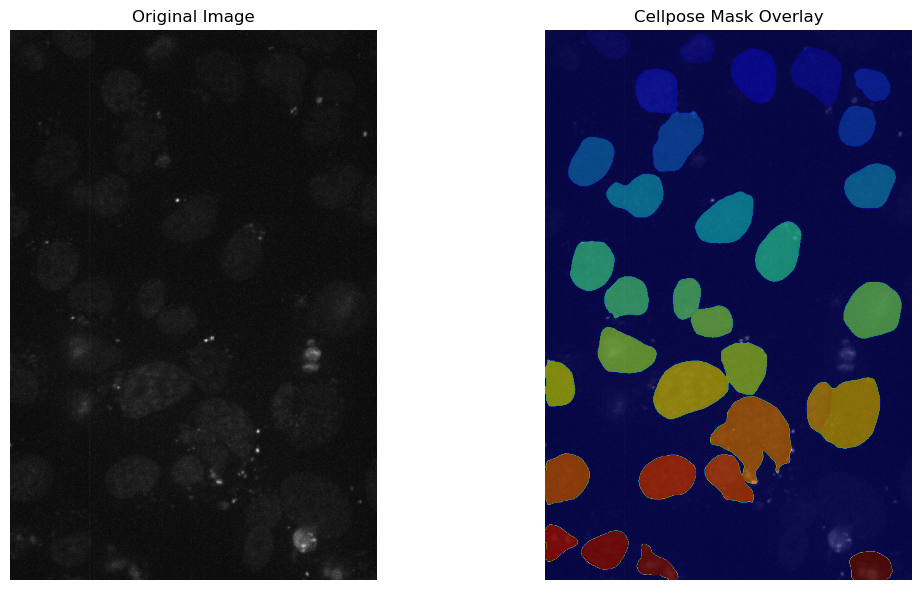

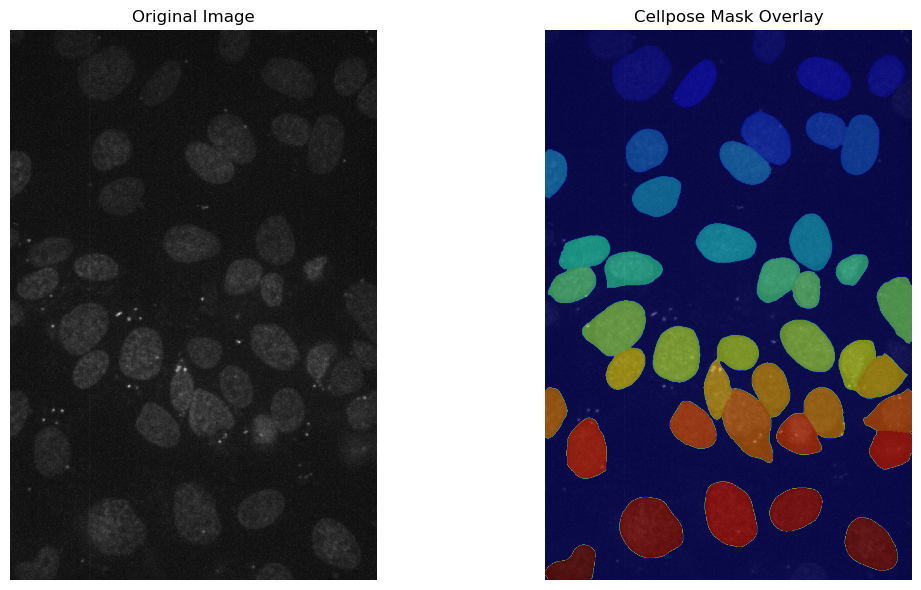

In [19]:
import random
import os
import tifffile
import matplotlib.pyplot as plt
import numpy as np

def visualize_random_samples(image_dir, mask_dir, num_samples=5, seed=None):
    """
    Randomly selects and visualizes TIFF images with their corresponding Cellpose masks.
    
    Parameters:
      image_dir (str): Directory containing the original TIFF images (e.g., DAPI images used for mask generation).
      mask_dir (str): Directory containing the Cellpose mask TIFFs.
      num_samples (int): Number of random samples to visualize.
      seed (int, optional): Seed for reproducibility.
    """
    # Set seed for reproducibility if provided
    if seed is not None:
        random.seed(seed)
    
    # Get list of TIFF files (exclude mask files)
    image_files = [f for f in os.listdir(image_dir) 
                   if f.lower().endswith(('.tiff', '.tif')) and '_mask' not in f]
    
    if not image_files:
        print(f"No TIFF files found in {image_dir}.")
        return
    
    # Adjust number of samples if there are fewer files than requested
    num_samples = min(num_samples, len(image_files))
    samples = random.sample(image_files, num_samples)
    
    for img_file in samples:
        img_path = os.path.join(image_dir, img_file)
        mask_filename = os.path.splitext(img_file)[0] + "_mask.tiff"
        mask_path = os.path.join(mask_dir, mask_filename)
        
        # Check if the corresponding mask file exists
        if not os.path.exists(mask_path):
            print(f"Mask file {mask_filename} does not exist. Skipping {img_file}.")
            continue
        
        try:
            img = tifffile.imread(img_path)
            mask = tifffile.imread(mask_path)
            
            # If the image has multiple channels, average them to get a grayscale representation
            if img.ndim == 3:
                img_display = img.mean(axis=0)
            else:
                img_display = img
            
            # Normalize the image for display purposes
            img_display = img_display.astype(np.float32)
            img_display -= img_display.min()
            if img_display.max() != 0:
                img_display /= img_display.max()
            
            plt.figure(figsize=(12, 6))
            
            # Display the original image
            plt.subplot(1, 2, 1)
            plt.imshow(img_display, cmap='gray')
            plt.title('Original Image')
            plt.axis('off')
            
            # Display the mask overlay on the original image
            plt.subplot(1, 2, 2)
            plt.imshow(img_display, cmap='gray')
            plt.imshow(mask, cmap='jet', alpha=0.5)  # Overlay mask with transparency
            plt.title('Cellpose Mask Overlay')
            plt.axis('off')
            
            plt.tight_layout()
            plt.show()
            
        except Exception as e:
            print(f"Error visualizing {img_file}: {e}")

# =============================================================================
# Example Usage
# =============================================================================
# Define the directories for DAPI images (used for mask generation) and the generated masks.
dapi_image_dir = dapi_tiff_dir
mask_output_dir = new_mask_dir

# Visualize random samples (e.g., 2 samples, with a seed for reproducibility)
visualize_random_samples(dapi_image_dir, mask_output_dir, num_samples=2, seed=33223)


# autosclae the tiff image for better screen show

In [52]:
import os
import numpy as np
import tifffile
from tqdm import tqdm

def autoscale_to_8bit(image, percentile=99):
    """
    Autoscale a 16-bit image to 8-bit using the 99th percentile as the maximum.
    
    Parameters:
      image (np.ndarray): The input image (assumed to be 16-bit).
      percentile (float): The percentile to use for the maximum intensity.
      
    Returns:
      np.ndarray: The rescaled 8-bit image.
    """
    # Compute the minimum and the desired maximum (99th percentile)
    img_min = np.min(image)
    img_p99 = np.percentile(image, percentile)
    
    # Prevent division by zero in case the image is flat
    if img_p99 - img_min == 0:
        scaled = np.zeros_like(image, dtype=np.uint8)
    else:
        # Scale intensities so that values below img_min map to 0 and
        # values at or above img_p99 are capped at 1 (then multiplied by 255).
        scaled = (image - img_min) / (img_p99 - img_min)
        # Clip values above 1 (if any) to 1.
        scaled[scaled > 1] = 1
        scaled = (scaled * 255).astype(np.uint8)
    return scaled

def regenerate_for_viewing(channel_dirs, output_forimage_dir, percentile=99):
    """
    Processes images from each channel directory by autoscaling them from 16-bit to 8-bit,
    using the given percentile as the maximum intensity. The processed images are saved
    in subdirectories under the output_forimage_dir.
    
    Parameters:
      channel_dirs (dict): Dictionary with keys as channel names (e.g., 'DAPI', 'GFP', 'DsRed')
                           and values as the directories containing the original 16-bit images.
      output_forimage_dir (str): Path to the output "forimage" folder.
      percentile (float): Percentile to use for scaling (default is 99).
    """
    # Create the output forimage directory if it doesn't exist.
    os.makedirs(output_forimage_dir, exist_ok=True)
    
    for channel, input_dir in channel_dirs.items():
        # Create a subfolder for the channel
        channel_out_dir = os.path.join(output_forimage_dir, channel)
        os.makedirs(channel_out_dir, exist_ok=True)
        
        # List TIFF files in the input directory (ignore any mask files)
        image_files = [f for f in os.listdir(input_dir)
                       if f.lower().endswith(('.tiff', '.tif')) and '_mask' not in f]
        
        for img_file in tqdm(image_files, desc=f"Processing {channel} images"):
            input_path = os.path.join(input_dir, img_file)
            output_path = os.path.join(channel_out_dir, img_file)
            try:
                img = tifffile.imread(input_path)
                
                # If the image is 3D (e.g., a z-stack), average over the first axis to obtain a 2D image.
                if img.ndim == 3:
                    img = img.mean(axis=0)
                
                # Apply autoscaling to 8-bit.
                scaled_img = autoscale_to_8bit(img, percentile)
                tifffile.imwrite(output_path, scaled_img)
            except Exception as e:
                print(f"Error processing {input_path}: {e}")

# =============================================================================
# Example Usage
# =============================================================================
# Set your output directory (update this path as needed)
output_dir = r"A:\_Ongoing\20250329_Rep\Output"

# Create the forimage folder under the output directory
output_forimage_dir = os.path.join(output_dir, "forimage")

# Define the directories for each channel (these should be the original 16-bit images)
channel_dirs = {
    "DAPI": dapi_tiff_dir,    # Path to DAPI TIFF images (from your earlier code)
    "GFP": gfp_tiff_dir,      # Path to GFP TIFF images
    "DsRed": dsred_tiff_dir   # Path to DsRed TIFF images
}

# Regenerate the easier-to-view 8-bit images
regenerate_for_viewing(channel_dirs, output_forimage_dir, percentile=99)


Processing DsRed images: 100%|██████████| 3600/3600 [00:27<00:00, 132.15it/s]


# filter out dead cell (uneven DsRed intensity)

In [53]:
import os
import numpy as np
import tifffile
from skimage.measure import regionprops
from tqdm import tqdm

def filter_dead_cells_by_dsred(mask_input_dir, dsred_dir, output_mask_dead_dir, cv_threshold=0.5):
    """
    Filters out cell masks that likely represent dead cells based on uneven DsRed intensity.
    For each cell region in the mask, we compute the coefficient of variation (CV) of its DsRed intensities.
    If the CV exceeds the specified threshold, that cell is removed from the mask.
    
    Parameters:
      mask_input_dir (str): Directory containing the input mask TIFF files (e.g., from previous filtering).
      dsred_dir (str): Directory containing the DsRed channel TIFF images.
      output_mask_dead_dir (str): Directory where the new masks with dead cells filtered out will be saved.
      cv_threshold (float): Threshold for the coefficient of variation. Regions with CV above this value are removed.
    """
    os.makedirs(output_mask_dead_dir, exist_ok=True)
    
    # List mask files (assuming TIFF files)
    mask_files = [f for f in os.listdir(mask_input_dir) if f.lower().endswith(('.tif', '.tiff'))]
    
    for mask_file in tqdm(mask_files, desc="Filtering dead cells"):
        mask_path = os.path.join(mask_input_dir, mask_file)
        # Assume the corresponding DsRed image has the same base name without '_mask'
        base_name = os.path.splitext(mask_file)[0].replace('_mask', '')
        dsred_filename = base_name + os.path.splitext(mask_file)[1]
        dsred_path = os.path.join(dsred_dir, dsred_filename)
        
        if not os.path.exists(dsred_path):
            print(f"DsRed image for {mask_file} not found in {dsred_dir}. Skipping.")
            continue
        
        try:
            mask_img = tifffile.imread(mask_path)
            dsred_img = tifffile.imread(dsred_path)
            
            # Copy the mask to modify it
            filtered_mask = mask_img.copy()
            
            # Compute properties for each region in the mask, using the DsRed image as the intensity image.
            props = regionprops(mask_img, intensity_image=dsred_img)
            for region in props:
                # Get intensity values from the DsRed channel for the current cell region.
                coords = region.coords
                cell_intensities = dsred_img[coords[:, 0], coords[:, 1]]
                mean_intensity = np.mean(cell_intensities)
                std_intensity = np.std(cell_intensities)
                cv = std_intensity / mean_intensity if mean_intensity > 0 else 0
                
                # If the variation is too high, consider it a dead cell and remove it.
                if cv > cv_threshold:
                    filtered_mask[mask_img == region.label] = 0
            
            # Save the new filtered mask to the designated folder.
            output_path = os.path.join(output_mask_dead_dir, mask_file)
            tifffile.imwrite(output_path, filtered_mask.astype(np.uint16))
            print(f"Saved filtered mask: {output_path}")
        except Exception as e:
            print(f"Error processing {mask_file}: {e}")

# =============================================================================
# Example Usage
# =============================================================================
# Assuming your output directory and previously filtered mask folder are defined:
# (Update these paths as needed.)
output_dir = r"A:\_Ongoing\20250329_Rep\Output"
mask_input_dir = os.path.join(output_dir, "mask_filtered")  # Input masks (after initial filtering)
dsred_tiff_dir = r"A:\_Ongoing\20250329_Rep\Output\DsRed_TIFF"  # DsRed channel images (or update accordingly)
output_mask_dead_dir = os.path.join(output_dir, "mask_filtered_dead")  # New folder for final masks

# Run the filtering function with a CV threshold of 0.5 (adjust if needed)
filter_dead_cells_by_dsred(mask_input_dir, dsred_tiff_dir, output_mask_dead_dir, cv_threshold=0.37)


Filtering dead cells:   0%|          | 8/3600 [00:00<00:47, 75.12it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   1%|          | 24/3600 [00:00<00:49, 71.82it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   1%|          | 40/3600 [00:00<00:48, 73.92it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   2%|▏         | 56/3600 [00:00<00:48, 73.62it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   2%|▏         | 72/3600 [00:00<00:47, 74.31it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A1_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   2%|▎         | 90/3600 [00:01<00:43, 80.59it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   3%|▎         | 108/3600 [00:01<00:41, 84.62it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   4%|▎         | 128/3600 [00:01<00:38, 89.11it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   4%|▍         | 146/3600 [00:01<00:38, 89.28it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A2_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   5%|▍         | 164/3600 [00:02<00:39, 87.18it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   5%|▌         | 182/3600 [00:02<00:39, 85.93it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   6%|▌         | 200/3600 [00:02<00:40, 84.87it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   6%|▌         | 218/3600 [00:02<00:40, 83.04it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A3_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   7%|▋         | 236/3600 [00:02<00:42, 80.02it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   7%|▋         | 253/3600 [00:03<00:43, 77.43it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   7%|▋         | 269/3600 [00:03<00:43, 76.11it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   8%|▊         | 285/3600 [00:03<00:43, 76.78it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   8%|▊         | 301/3600 [00:03<00:42, 77.48it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A4_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   9%|▉         | 319/3600 [00:03<00:39, 82.14it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:   9%|▉         | 338/3600 [00:04<00:39, 82.81it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  10%|▉         | 356/3600 [00:04<00:38, 83.72it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  10%|█         | 374/3600 [00:04<00:37, 86.00it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A5_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  11%|█         | 392/3600 [00:04<00:38, 83.01it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  11%|█▏        | 410/3600 [00:05<00:38, 83.22it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  12%|█▏        | 428/3600 [00:05<00:39, 81.05it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  12%|█▏        | 447/3600 [00:05<00:37, 85.16it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_A6_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  13%|█▎        | 465/3600 [00:05<00:38, 81.47it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  13%|█▎        | 474/3600 [00:05<00:39, 78.94it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  14%|█▎        | 490/3600 [00:06<00:40, 76.53it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  14%|█▍        | 506/3600 [00:06<00:41, 73.95it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  14%|█▍        | 522/3600 [00:06<00:42, 71.88it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B1_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  15%|█▍        | 539/3600 [00:06<00:39, 77.23it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  16%|█▌        | 558/3600 [00:06<00:36, 82.99it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  16%|█▌        | 576/3600 [00:07<00:35, 84.06it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  16%|█▋        | 594/3600 [00:07<00:36, 82.89it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  17%|█▋        | 612/3600 [00:07<00:37, 79.78it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B2_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  17%|█▋        | 629/3600 [00:07<00:38, 76.87it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  18%|█▊        | 645/3600 [00:08<00:39, 74.97it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  18%|█▊        | 661/3600 [00:08<00:38, 75.58it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  19%|█▉        | 677/3600 [00:08<00:38, 76.54it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B3_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  19%|█▉        | 693/3600 [00:08<00:37, 77.33it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  20%|█▉        | 710/3600 [00:08<00:36, 79.36it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  20%|██        | 728/3600 [00:09<00:35, 81.59it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  21%|██        | 745/3600 [00:09<00:36, 78.40it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  21%|██        | 762/3600 [00:09<00:35, 79.32it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B4_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  21%|██▏       | 771/3600 [00:09<00:35, 80.72it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  22%|██▏       | 791/3600 [00:09<00:32, 86.58it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  22%|██▏       | 809/3600 [00:10<00:32, 85.66it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  23%|██▎       | 827/3600 [00:10<00:33, 83.06it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B5_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  23%|██▎       | 845/3600 [00:10<00:33, 83.24it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  24%|██▍       | 863/3600 [00:10<00:32, 85.25it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  24%|██▍       | 881/3600 [00:10<00:33, 81.64it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  25%|██▍       | 899/3600 [00:11<00:32, 82.54it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_B6_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  25%|██▌       | 917/3600 [00:11<00:33, 80.54it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  26%|██▌       | 935/3600 [00:11<00:32, 81.70it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  26%|██▋       | 953/3600 [00:11<00:31, 84.60it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  27%|██▋       | 971/3600 [00:12<00:32, 81.83it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  28%|██▊       | 990/3600 [00:12<00:30, 85.32it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C1_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  28%|██▊       | 999/3600 [00:12<00:30, 85.88it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  28%|██▊       | 1018/3600 [00:12<00:30, 85.22it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  29%|██▉       | 1046/3600 [00:12<00:29, 87.37it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  29%|██▉       | 1055/3600 [00:12<00:29, 87.56it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C2_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  30%|██▉       | 1073/3600 [00:13<00:30, 84.00it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  30%|███       | 1091/3600 [00:13<00:30, 81.14it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  31%|███       | 1109/3600 [00:13<00:30, 80.36it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  31%|███▏      | 1127/3600 [00:13<00:30, 80.09it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C3_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  32%|███▏      | 1145/3600 [00:14<00:30, 81.75it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  32%|███▏      | 1163/3600 [00:14<00:29, 83.55it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  33%|███▎      | 1172/3600 [00:14<00:29, 83.53it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  33%|███▎      | 1190/3600 [00:14<00:28, 83.14it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  34%|███▎      | 1208/3600 [00:14<00:28, 85.05it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C4_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  34%|███▍      | 1227/3600 [00:15<00:27, 85.75it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  35%|███▍      | 1245/3600 [00:15<00:28, 82.50it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  35%|███▌      | 1263/3600 [00:15<00:28, 81.39it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  36%|███▌      | 1281/3600 [00:15<00:27, 84.37it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C5_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  36%|███▌      | 1299/3600 [00:15<00:27, 82.19it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  37%|███▋      | 1317/3600 [00:16<00:29, 78.47it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  37%|███▋      | 1333/3600 [00:16<00:29, 77.04it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  38%|███▊      | 1350/3600 [00:16<00:28, 77.91it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_C6_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  38%|███▊      | 1368/3600 [00:16<00:27, 80.80it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  38%|███▊      | 1377/3600 [00:16<00:27, 81.32it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  39%|███▉      | 1395/3600 [00:17<00:26, 82.03it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  39%|███▉      | 1413/3600 [00:17<00:25, 84.31it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  40%|███▉      | 1431/3600 [00:17<00:25, 83.81it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D1_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  40%|████      | 1449/3600 [00:17<00:27, 79.23it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  41%|████      | 1465/3600 [00:18<00:28, 74.03it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  41%|████      | 1482/3600 [00:18<00:27, 76.35it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  42%|████▏     | 1498/3600 [00:18<00:27, 75.13it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D2_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  42%|████▏     | 1514/3600 [00:18<00:28, 74.34it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  42%|████▏     | 1523/3600 [00:18<00:27, 76.33it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  43%|████▎     | 1539/3600 [00:19<00:26, 76.44it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  43%|████▎     | 1555/3600 [00:19<00:26, 77.51it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  44%|████▍     | 1580/3600 [00:19<00:25, 79.06it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D3_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  44%|████▍     | 1589/3600 [00:19<00:25, 79.17it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  45%|████▍     | 1607/3600 [00:19<00:24, 80.95it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  45%|████▌     | 1625/3600 [00:20<00:24, 80.51it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  46%|████▌     | 1643/3600 [00:20<00:23, 82.34it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D4_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  46%|████▌     | 1661/3600 [00:20<00:23, 83.60it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  47%|████▋     | 1679/3600 [00:20<00:23, 81.58it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  47%|████▋     | 1697/3600 [00:20<00:23, 80.83it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  48%|████▊     | 1715/3600 [00:21<00:23, 80.97it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  48%|████▊     | 1733/3600 [00:21<00:22, 81.65it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D5_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  49%|████▊     | 1751/3600 [00:21<00:22, 83.06it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  49%|████▉     | 1769/3600 [00:21<00:22, 81.52it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  50%|████▉     | 1787/3600 [00:22<00:22, 80.14it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  50%|████▉     | 1796/3600 [00:22<00:22, 81.13it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Act_D6_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  50%|█████     | 1814/3600 [00:22<00:22, 77.72it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  51%|█████     | 1830/3600 [00:22<00:23, 74.43it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  51%|█████▏    | 1846/3600 [00:22<00:24, 71.66it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  52%|█████▏    | 1862/3600 [00:23<00:24, 71.81it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  52%|█████▏    | 1870/3600 [00:23<00:24, 69.90it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A1_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  52%|█████▏    | 1887/3600 [00:23<00:22, 75.26it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  53%|█████▎    | 1911/3600 [00:23<00:21, 77.59it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  53%|█████▎    | 1919/3600 [00:23<00:21, 76.98it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  54%|█████▍    | 1936/3600 [00:24<00:21, 78.46it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  54%|█████▍    | 1954/3600 [00:24<00:20, 78.69it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A2_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  55%|█████▍    | 1970/3600 [00:24<00:21, 76.99it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  55%|█████▌    | 1986/3600 [00:24<00:21, 76.24it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  56%|█████▌    | 2003/3600 [00:24<00:20, 79.16it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  56%|█████▌    | 2019/3600 [00:25<00:20, 75.88it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A3_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  57%|█████▋    | 2035/3600 [00:25<00:21, 72.03it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  57%|█████▋    | 2051/3600 [00:25<00:22, 69.12it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  57%|█████▋    | 2065/3600 [00:25<00:22, 68.47it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  58%|█████▊    | 2079/3600 [00:26<00:22, 68.26it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  58%|█████▊    | 2093/3600 [00:26<00:22, 67.00it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  59%|█████▊    | 2109/3600 [00:26<00:21, 70.68it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A4_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  59%|█████▉    | 2126/3600 [00:26<00:20, 73.18it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  60%|█████▉    | 2142/3600 [00:26<00:20, 71.98it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  60%|█████▉    | 2159/3600 [00:27<00:18, 76.44it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  60%|██████    | 2175/3600 [00:27<00:18, 77.72it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A5_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  61%|██████    | 2191/3600 [00:27<00:18, 74.96it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  61%|██████▏   | 2207/3600 [00:27<00:18, 75.73it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  62%|██████▏   | 2215/3600 [00:27<00:18, 75.52it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  62%|██████▏   | 2231/3600 [00:28<00:18, 72.55it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  62%|██████▏   | 2247/3600 [00:28<00:18, 73.64it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_A6_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  63%|██████▎   | 2263/3600 [00:28<00:17, 74.56it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  63%|██████▎   | 2279/3600 [00:28<00:17, 75.64it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  64%|██████▍   | 2298/3600 [00:28<00:16, 78.38it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  64%|██████▍   | 2314/3600 [00:29<00:17, 74.44it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  65%|██████▍   | 2330/3600 [00:29<00:16, 75.44it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B1_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  65%|██████▌   | 2347/3600 [00:29<00:16, 75.78it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  66%|██████▌   | 2364/3600 [00:29<00:16, 77.00it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  66%|██████▌   | 2380/3600 [00:30<00:16, 73.76it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  67%|██████▋   | 2396/3600 [00:30<00:16, 74.53it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B2_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  67%|██████▋   | 2412/3600 [00:30<00:16, 72.26it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  67%|██████▋   | 2428/3600 [00:30<00:16, 71.20it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  68%|██████▊   | 2443/3600 [00:30<00:16, 68.69it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  68%|██████▊   | 2457/3600 [00:31<00:16, 67.93it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  68%|██████▊   | 2465/3600 [00:31<00:16, 69.15it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  69%|██████▉   | 2486/3600 [00:31<00:16, 69.37it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B3_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  69%|██████▉   | 2493/3600 [00:31<00:16, 68.80it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  70%|██████▉   | 2509/3600 [00:31<00:15, 72.29it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  70%|███████   | 2525/3600 [00:32<00:15, 71.11it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  71%|███████   | 2541/3600 [00:32<00:15, 70.49it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  71%|███████   | 2558/3600 [00:32<00:13, 75.77it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B4_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  72%|███████▏  | 2577/3600 [00:32<00:12, 81.97it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  72%|███████▏  | 2595/3600 [00:32<00:12, 82.76it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  73%|███████▎  | 2613/3600 [00:33<00:12, 80.04it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  73%|███████▎  | 2632/3600 [00:33<00:11, 81.15it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B5_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  74%|███████▎  | 2649/3600 [00:33<00:12, 78.34it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  74%|███████▍  | 2665/3600 [00:33<00:12, 74.86it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  74%|███████▍  | 2682/3600 [00:34<00:11, 77.55it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  75%|███████▍  | 2699/3600 [00:34<00:11, 77.87it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_B6_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  75%|███████▌  | 2715/3600 [00:34<00:11, 76.09it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  76%|███████▌  | 2731/3600 [00:34<00:11, 75.60it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  76%|███████▋  | 2747/3600 [00:34<00:11, 71.33it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  77%|███████▋  | 2765/3600 [00:35<00:10, 77.15it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  77%|███████▋  | 2783/3600 [00:35<00:10, 80.72it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C1_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  78%|███████▊  | 2801/3600 [00:35<00:09, 80.50it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  78%|███████▊  | 2819/3600 [00:35<00:09, 80.48it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  79%|███████▊  | 2828/3600 [00:35<00:09, 78.64it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  79%|███████▉  | 2846/3600 [00:36<00:09, 82.39it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C2_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  80%|███████▉  | 2864/3600 [00:36<00:09, 75.34it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  80%|████████  | 2881/3600 [00:36<00:09, 77.46it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  80%|████████  | 2897/3600 [00:36<00:09, 75.91it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  81%|████████  | 2905/3600 [00:36<00:09, 74.56it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  81%|████████  | 2921/3600 [00:37<00:09, 72.85it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C3_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  82%|████████▏ | 2938/3600 [00:37<00:08, 75.75it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  82%|████████▏ | 2954/3600 [00:37<00:08, 74.52it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  82%|████████▎ | 2970/3600 [00:37<00:08, 70.58it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  83%|████████▎ | 2986/3600 [00:38<00:08, 71.07it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  83%|████████▎ | 3002/3600 [00:38<00:08, 73.68it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C4_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  84%|████████▍ | 3020/3600 [00:38<00:07, 79.36it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  84%|████████▍ | 3038/3600 [00:38<00:07, 78.02it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  85%|████████▍ | 3056/3600 [00:38<00:06, 82.16it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  85%|████████▌ | 3065/3600 [00:39<00:07, 74.05it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  86%|████████▌ | 3082/3600 [00:39<00:06, 77.07it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C5_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  86%|████████▌ | 3100/3600 [00:39<00:06, 81.08it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  87%|████████▋ | 3118/3600 [00:39<00:06, 78.69it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  87%|████████▋ | 3135/3600 [00:40<00:06, 76.49it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  88%|████████▊ | 3154/3600 [00:40<00:05, 83.09it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_C6_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  88%|████████▊ | 3172/3600 [00:40<00:05, 81.48it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  89%|████████▊ | 3190/3600 [00:40<00:05, 79.02it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  89%|████████▉ | 3199/3600 [00:40<00:04, 81.35it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  89%|████████▉ | 3216/3600 [00:41<00:05, 76.17it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  90%|████████▉ | 3232/3600 [00:41<00:05, 72.87it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D1_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  90%|█████████ | 3248/3600 [00:41<00:04, 70.82it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  91%|█████████ | 3264/3600 [00:41<00:04, 69.98it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_026_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_027_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_028_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  91%|█████████ | 3272/3600 [00:41<00:04, 69.38it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_043_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  91%|█████████▏| 3288/3600 [00:42<00:04, 71.32it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_057_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_058_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_059_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  92%|█████████▏| 3305/3600 [00:42<00:03, 74.81it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_072_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_073_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D2_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  92%|█████████▏| 3322/3600 [00:42<00:03, 77.61it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_012_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_013_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_014_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  93%|█████████▎| 3339/3600 [00:42<00:03, 78.50it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  93%|█████████▎| 3355/3600 [00:42<00:03, 75.56it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  94%|█████████▎| 3371/3600 [00:43<00:03, 72.19it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  94%|█████████▍| 3387/3600 [00:43<00:02, 72.62it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D3_075_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  95%|█████████▍| 3403/3600 [00:43<00:02, 71.65it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_015_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  95%|█████████▍| 3411/3600 [00:43<00:02, 72.26it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_029_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_030_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  95%|█████████▌| 3435/3600 [00:44<00:02, 74.40it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_044_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_045_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  96%|█████████▌| 3443/3600 [00:44<00:02, 75.27it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D4_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  96%|█████████▌| 3459/3600 [00:44<00:01, 73.65it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_001_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  97%|█████████▋| 3475/3600 [00:44<00:01, 74.36it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  97%|█████████▋| 3491/3600 [00:44<00:01, 73.12it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_041_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_042_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  97%|█████████▋| 3507/3600 [00:45<00:01, 70.93it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_056_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  98%|█████████▊| 3523/3600 [00:45<00:01, 69.37it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_070_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D5_071_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  98%|█████████▊| 3537/3600 [00:45<00:00, 67.51it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_002_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_003_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_004_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_005_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_006_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_007_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_008_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_009_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_010_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_011_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  99%|█████████▊| 3552/3600 [00:45<00:00, 68.18it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_016_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_017_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_018_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_019_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_020_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_021_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_022_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_023_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_024_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_025_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells:  99%|█████████▉| 3567/3600 [00:45<00:00, 68.47it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_031_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_032_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_033_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_034_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_035_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_036_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_037_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_038_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_039_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_040_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells: 100%|█████████▉| 3583/3600 [00:46<00:00, 69.13it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_046_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_047_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_048_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_049_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_050_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_051_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_052_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_053_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_054_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_055_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells: 100%|█████████▉| 3598/3600 [00:46<00:00, 69.34it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_060_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_061_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_062_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_063_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_064_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_065_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_066_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_067_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_068_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_069_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dea

Filtering dead cells: 100%|██████████| 3600/3600 [00:46<00:00, 77.60it/s]

Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_074_mask.tiff
Saved filtered mask: A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead\Rep_D6_075_mask.tiff


# after autoscle, after dead cell filer, put all channel together

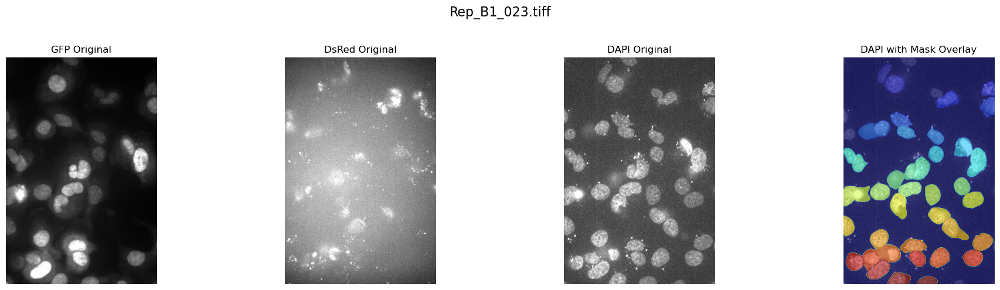

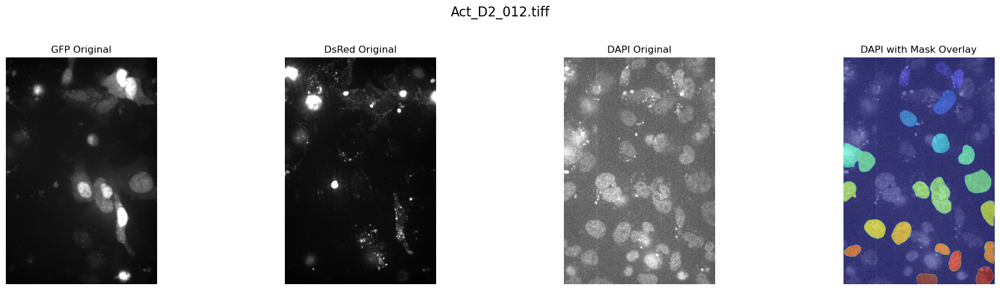

In [75]:
import random
import os
import tifffile
import matplotlib.pyplot as plt
import numpy as np

def visualize_random_samples_all_channels(gfp_dir, dsred_dir, dapi_dir, mask_dir, num_samples=5, seed=None):
    """
    Randomly selects and visualizes TIFF images for three channels along with a mask overlay.
    
    The layout is as follows (left to right):
      - GFP original
      - DsRed original
      - DAPI original
      - DAPI with mask overlay
    
    Parameters:
      gfp_dir (str): Directory containing the GFP channel TIFF images.
      dsred_dir (str): Directory containing the DsRed channel TIFF images.
      dapi_dir (str): Directory containing the DAPI channel TIFF images.
      mask_dir (str): Directory containing the DAPI mask TIFFs.
      num_samples (int): Number of random samples to visualize.
      seed (int, optional): Seed for reproducibility.
    """
    # Use the DAPI channel as reference for file names
    image_files = [f for f in os.listdir(dapi_dir) 
                   if f.lower().endswith(('.tiff', '.tif')) and '_mask' not in f]
    
    if not image_files:
        print(f"No TIFF files found in {dapi_dir}.")
        return
    
    if seed is not None:
        random.seed(seed)
    num_samples = min(num_samples, len(image_files))
    samples = random.sample(image_files, num_samples)
    
    for img_file in samples:
        base_name = os.path.splitext(img_file)[0]
        mask_filename = base_name + "_mask.tiff"
        mask_path = os.path.join(mask_dir, mask_filename)
        
        if not os.path.exists(mask_path):
            print(f"Mask file {mask_filename} does not exist. Skipping {img_file}.")
            continue
        
        try:
            # Build file paths for each channel
            gfp_path = os.path.join(gfp_dir, img_file)
            dsred_path = os.path.join(dsred_dir, img_file)
            dapi_path = os.path.join(dapi_dir, img_file)
            
            # Check if all required files exist
            if not (os.path.exists(gfp_path) and os.path.exists(dsred_path) and os.path.exists(dapi_path)):
                print(f"One or more channel images missing for {img_file}. Skipping.")
                continue
            
            # Load images and mask
            gfp_img = tifffile.imread(gfp_path)
            dsred_img = tifffile.imread(dsred_path)
            dapi_img = tifffile.imread(dapi_path)
            mask = tifffile.imread(mask_path)
            
            # Function to normalize image for display
            def normalize_image(img):
                if img.ndim == 3:
                    img_disp = img.mean(axis=0)
                else:
                    img_disp = img
                img_disp = img_disp.astype(np.float32)
                img_disp -= img_disp.min()
                if img_disp.max() != 0:
                    img_disp /= img_disp.max()
                return img_disp
            
            gfp_disp = normalize_image(gfp_img)
            dsred_disp = normalize_image(dsred_img)
            dapi_disp = normalize_image(dapi_img)
            
            # Create a figure with 4 subplots
            plt.figure(figsize=(20, 5))
            plt.suptitle(img_file, fontsize=16)
            
            # Panel 1: GFP original
            ax1 = plt.subplot(1, 4, 1)
            ax1.imshow(gfp_disp, cmap='gray')
            ax1.set_title('GFP Original')
            ax1.axis('off')
            
            # Panel 2: DsRed original
            ax2 = plt.subplot(1, 4, 2)
            ax2.imshow(dsred_disp, cmap='gray')
            ax2.set_title('DsRed Original')
            ax2.axis('off')
            
            # Panel 3: DAPI original
            ax3 = plt.subplot(1, 4, 3)
            ax3.imshow(dapi_disp, cmap='gray')
            ax3.set_title('DAPI Original')
            ax3.axis('off')
            
            # Panel 4: DAPI with mask overlay
            ax4 = plt.subplot(1, 4, 4)
            ax4.imshow(dapi_disp, cmap='gray')
            ax4.imshow(mask, cmap='jet', alpha=0.5)  # Overlay the mask
            ax4.set_title('DAPI with Mask Overlay')
            ax4.axis('off')
            
            plt.tight_layout(rect=[0, 0, 1, 0.95])
            plt.show()
            
        except Exception as e:
            print(f"Error visualizing {img_file}: {e}")

# =============================================================================
# Example Usage
# =============================================================================
# Define directories for each channel (update these paths as needed)

gfp_tiff_dir = r"A:\_Ongoing\20250329_Rep\Output\forimage\GFP"
dsred_tiff_dir = r"A:\_Ongoing\20250329_Rep\Output\forimage\DsRed"
dapi_tiff_dir = r"A:\_Ongoing\20250329_Rep\Output\forimage\DAPI"
mask_output_dir = r"A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead"

# Visualize random samples (e.g., 2 samples, with a seed for reproducibility)
visualize_random_samples_all_channels(gfp_tiff_dir, dsred_tiff_dir, dapi_tiff_dir, mask_output_dir, num_samples=2, seed=333)



# try to mask cell mask by DsRed channel

In [59]:
# =============================================================================
# Runnable Step 2: Cell Mask Generation Using DAPI Channel
# =============================================================================
def run_mask_generation(dapi_tiff_dir, mask_dir, model):
    """
    Generates cell masks from DAPI channel TIFF images using Cellpose.
    
    Parameters:
      dapi_tiff_dir: Directory containing DAPI TIFF images (for cell mask generation).
      mask_dir: Directory where the generated mask images will be saved.
      model: An initialized Cellpose model.
    """
    # Filter out TIFF files that are not masks already
    dapi_tiff_files = [f for f in os.listdir(dapi_tiff_dir)
                       if f.lower().endswith(('.tiff', '.tif')) and '_mask' not in f]
    
    if not dapi_tiff_files:
        print("No DAPI TIFF files found in", dapi_tiff_dir)
        return
    
    print(f"Generating cell masks for {len(dapi_tiff_files)} DAPI TIFF file(s)...")
    for tiff_file in tqdm(dapi_tiff_files, desc="Generating Masks"):
        tiff_path = os.path.join(dapi_tiff_dir, tiff_file)
        mask_filename = os.path.splitext(tiff_file)[0] + "_mask.tiff"
        mask_path = os.path.join(mask_dir, mask_filename)
        generate_cellmask(tiff_path, mask_path, model)
    
    print("Cell mask generation completed.")

# =============================================================================
# Initialize the Cellpose Model and Run Mask Generation
# =============================================================================
print("\n=== Cell Mask Generation ===")
try:
    model = models.Cellpose(gpu=torch.cuda.is_available(), model_type="cyto3")
    print("Cellpose model initialized.")
except Exception as e:
    print("Error initializing Cellpose model:", e)
    print("Falling back to CPU mode with cyto2.")
    model = models.Cellpose(gpu=False, model_type="cyto2")

dsred_tiff_dir = r"A:\_Ongoing\20250329_Rep\Output\forimage\DsRed"
Dsredmask_dir = r"A:\_Ongoing\20250329_Rep\Output\mask_DsRed"
# Run mask generation using the DAPI channel TIFF images
run_mask_generation(dsred_tiff_dir, Dsredmask_dir, model)


=== Cell Mask Generation ===
Cellpose model initialized.
Generating cell masks for 3600 DAPI TIFF file(s)...


Generating Masks:   0%|          | 1/3600 [00:00<29:54,  2.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_001_mask.tiff


Generating Masks:   0%|          | 2/3600 [00:00<23:44,  2.53it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_002_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_003_mask.tiff


Generating Masks:   0%|          | 4/3600 [00:01<20:15,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_004_mask.tiff


Generating Masks:   0%|          | 5/3600 [00:01<20:29,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_005_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_006_mask.tiff


Generating Masks:   0%|          | 7/3600 [00:02<19:01,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_007_mask.tiff


Generating Masks:   0%|          | 8/3600 [00:02<20:40,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_008_mask.tiff


Generating Masks:   0%|          | 9/3600 [00:03<20:36,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_009_mask.tiff


Generating Masks:   0%|          | 10/3600 [00:03<20:21,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_010_mask.tiff


Generating Masks:   0%|          | 11/3600 [00:03<19:32,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_011_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_012_mask.tiff


Generating Masks:   0%|          | 13/3600 [00:04<18:46,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_013_mask.tiff


Generating Masks:   0%|          | 14/3600 [00:04<18:49,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_014_mask.tiff


Generating Masks:   0%|          | 15/3600 [00:04<18:54,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_015_mask.tiff


Generating Masks:   0%|          | 16/3600 [00:05<18:48,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_016_mask.tiff


Generating Masks:   0%|          | 17/3600 [00:05<19:06,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_017_mask.tiff


Generating Masks:   0%|          | 18/3600 [00:05<19:07,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_018_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_019_mask.tiff


Generating Masks:   1%|          | 20/3600 [00:06<19:03,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_020_mask.tiff


Generating Masks:   1%|          | 21/3600 [00:06<18:58,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_021_mask.tiff


Generating Masks:   1%|          | 22/3600 [00:07<19:35,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_022_mask.tiff


Generating Masks:   1%|          | 23/3600 [00:07<20:12,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_023_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_024_mask.tiff


Generating Masks:   1%|          | 25/3600 [00:08<19:10,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_025_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_026_mask.tiff


Generating Masks:   1%|          | 27/3600 [00:08<18:54,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_027_mask.tiff


Generating Masks:   1%|          | 28/3600 [00:09<19:05,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_028_mask.tiff


Generating Masks:   1%|          | 29/3600 [00:09<19:01,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_029_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_030_mask.tiff


Generating Masks:   1%|          | 31/3600 [00:10<19:22,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_031_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_032_mask.tiff


Generating Masks:   1%|          | 33/3600 [00:10<18:50,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_033_mask.tiff


Generating Masks:   1%|          | 34/3600 [00:11<19:11,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_034_mask.tiff


Generating Masks:   1%|          | 35/3600 [00:11<19:25,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_035_mask.tiff


Generating Masks:   1%|          | 36/3600 [00:11<19:29,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_036_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_037_mask.tiff


Generating Masks:   1%|          | 38/3600 [00:12<19:00,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_038_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_039_mask.tiff


Generating Masks:   1%|          | 40/3600 [00:13<19:01,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_040_mask.tiff


Generating Masks:   1%|          | 41/3600 [00:13<19:02,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_041_mask.tiff


Generating Masks:   1%|          | 42/3600 [00:13<19:18,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_042_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_043_mask.tiff


Generating Masks:   1%|          | 44/3600 [00:14<19:08,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_044_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_045_mask.tiff


Generating Masks:   1%|▏         | 46/3600 [00:14<18:52,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_046_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_047_mask.tiff


Generating Masks:   1%|▏         | 48/3600 [00:15<18:43,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_048_mask.tiff


Generating Masks:   1%|▏         | 49/3600 [00:15<18:58,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_049_mask.tiff


Generating Masks:   1%|▏         | 50/3600 [00:16<19:25,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_050_mask.tiff


Generating Masks:   1%|▏         | 51/3600 [00:16<20:59,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_051_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_052_mask.tiff


Generating Masks:   1%|▏         | 53/3600 [00:17<18:48,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_053_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_054_mask.tiff


Generating Masks:   2%|▏         | 55/3600 [00:17<18:53,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_055_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_056_mask.tiff


Generating Masks:   2%|▏         | 57/3600 [00:18<18:11,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_057_mask.tiff


Generating Masks:   2%|▏         | 58/3600 [00:18<19:33,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_058_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_059_mask.tiff


Generating Masks:   2%|▏         | 60/3600 [00:19<20:03,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_060_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_061_mask.tiff


Generating Masks:   2%|▏         | 62/3600 [00:20<19:46,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_062_mask.tiff


Generating Masks:   2%|▏         | 63/3600 [00:20<20:21,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_063_mask.tiff


Generating Masks:   2%|▏         | 64/3600 [00:20<20:10,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_064_mask.tiff


Generating Masks:   2%|▏         | 65/3600 [00:21<20:54,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_065_mask.tiff


Generating Masks:   2%|▏         | 66/3600 [00:21<20:31,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_066_mask.tiff


Generating Masks:   2%|▏         | 67/3600 [00:21<20:35,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_067_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_068_mask.tiff


Generating Masks:   2%|▏         | 69/3600 [00:22<19:18,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_069_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_070_mask.tiff


Generating Masks:   2%|▏         | 71/3600 [00:23<19:11,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_071_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_072_mask.tiff


Generating Masks:   2%|▏         | 73/3600 [00:23<18:45,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_073_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_074_mask.tiff


Generating Masks:   2%|▏         | 75/3600 [00:24<18:14,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A1_075_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_001_mask.tiff


Generating Masks:   2%|▏         | 77/3600 [00:25<17:55,  3.28it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_002_mask.tiff


Generating Masks:   2%|▏         | 78/3600 [00:25<17:56,  3.27it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_003_mask.tiff


Generating Masks:   2%|▏         | 79/3600 [00:25<18:30,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_004_mask.tiff


Generating Masks:   2%|▏         | 80/3600 [00:26<18:49,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_005_mask.tiff


Generating Masks:   2%|▏         | 81/3600 [00:26<18:35,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_006_mask.tiff


Generating Masks:   2%|▏         | 82/3600 [00:26<18:56,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_007_mask.tiff


Generating Masks:   2%|▏         | 83/3600 [00:27<19:23,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_008_mask.tiff


Generating Masks:   2%|▏         | 84/3600 [00:27<19:32,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_009_mask.tiff


Generating Masks:   2%|▏         | 85/3600 [00:27<20:02,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_010_mask.tiff


Generating Masks:   2%|▏         | 86/3600 [00:28<20:36,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_011_mask.tiff


Generating Masks:   2%|▏         | 87/3600 [00:28<20:01,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_012_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_013_mask.tiff


Generating Masks:   2%|▏         | 89/3600 [00:28<18:40,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_014_mask.tiff


Generating Masks:   2%|▎         | 90/3600 [00:29<18:40,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_015_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_016_mask.tiff


Generating Masks:   3%|▎         | 92/3600 [00:29<17:49,  3.28it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_017_mask.tiff


Generating Masks:   3%|▎         | 93/3600 [00:30<18:20,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_018_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_019_mask.tiff


Generating Masks:   3%|▎         | 95/3600 [00:30<18:28,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_020_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_021_mask.tiff


Generating Masks:   3%|▎         | 97/3600 [00:31<18:05,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_022_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_023_mask.tiff


Generating Masks:   3%|▎         | 99/3600 [00:32<18:30,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_024_mask.tiff


Generating Masks:   3%|▎         | 100/3600 [00:32<18:55,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_025_mask.tiff


Generating Masks:   3%|▎         | 101/3600 [00:32<19:05,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_026_mask.tiff


Generating Masks:   3%|▎         | 102/3600 [00:33<19:36,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_027_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_028_mask.tiff


Generating Masks:   3%|▎         | 104/3600 [00:33<19:03,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_029_mask.tiff


Generating Masks:   3%|▎         | 105/3600 [00:34<19:02,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_030_mask.tiff


Generating Masks:   3%|▎         | 106/3600 [00:34<19:11,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_031_mask.tiff


Generating Masks:   3%|▎         | 107/3600 [00:34<19:23,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_032_mask.tiff


Generating Masks:   3%|▎         | 108/3600 [00:35<19:36,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_033_mask.tiff


Generating Masks:   3%|▎         | 109/3600 [00:35<19:49,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_034_mask.tiff


Generating Masks:   3%|▎         | 110/3600 [00:35<19:52,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_035_mask.tiff


Generating Masks:   3%|▎         | 111/3600 [00:36<19:11,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_036_mask.tiff


Generating Masks:   3%|▎         | 112/3600 [00:36<19:20,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_037_mask.tiff


Generating Masks:   3%|▎         | 113/3600 [00:36<19:09,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_038_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_039_mask.tiff


Generating Masks:   3%|▎         | 115/3600 [00:37<18:27,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_040_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_041_mask.tiff


Generating Masks:   3%|▎         | 117/3600 [00:37<17:37,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_042_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_043_mask.tiff


Generating Masks:   3%|▎         | 119/3600 [00:38<17:39,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_044_mask.tiff


Generating Masks:   3%|▎         | 120/3600 [00:38<17:49,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_045_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_046_mask.tiff


Generating Masks:   3%|▎         | 122/3600 [00:39<17:58,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_047_mask.tiff


Generating Masks:   3%|▎         | 123/3600 [00:39<18:11,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_048_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_049_mask.tiff


Generating Masks:   3%|▎         | 125/3600 [00:40<17:56,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_050_mask.tiff


Generating Masks:   4%|▎         | 126/3600 [00:40<18:07,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_051_mask.tiff


Generating Masks:   4%|▎         | 127/3600 [00:41<18:51,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_052_mask.tiff


Generating Masks:   4%|▎         | 128/3600 [00:41<18:50,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_053_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_054_mask.tiff


Generating Masks:   4%|▎         | 130/3600 [00:42<18:23,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_055_mask.tiff


Generating Masks:   4%|▎         | 131/3600 [00:42<18:37,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_056_mask.tiff


Generating Masks:   4%|▎         | 132/3600 [00:42<18:52,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_057_mask.tiff


Generating Masks:   4%|▎         | 133/3600 [00:43<18:56,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_058_mask.tiff


Generating Masks:   4%|▎         | 134/3600 [00:43<19:09,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_059_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_060_mask.tiff


Generating Masks:   4%|▍         | 136/3600 [00:44<19:12,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_061_mask.tiff


Generating Masks:   4%|▍         | 137/3600 [00:44<19:10,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_062_mask.tiff


Generating Masks:   4%|▍         | 138/3600 [00:44<20:12,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_063_mask.tiff


Generating Masks:   4%|▍         | 139/3600 [00:45<20:31,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_064_mask.tiff


Generating Masks:   4%|▍         | 140/3600 [00:45<20:23,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_065_mask.tiff


Generating Masks:   4%|▍         | 141/3600 [00:45<21:02,  2.74it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_066_mask.tiff


Generating Masks:   4%|▍         | 142/3600 [00:46<20:50,  2.77it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_067_mask.tiff


Generating Masks:   4%|▍         | 143/3600 [00:46<20:06,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_068_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_069_mask.tiff


Generating Masks:   4%|▍         | 145/3600 [00:47<18:52,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_070_mask.tiff


Generating Masks:   4%|▍         | 146/3600 [00:47<19:19,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_071_mask.tiff


Generating Masks:   4%|▍         | 147/3600 [00:47<18:57,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_072_mask.tiff


Generating Masks:   4%|▍         | 148/3600 [00:48<18:49,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_073_mask.tiff


Generating Masks:   4%|▍         | 149/3600 [00:48<18:46,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_074_mask.tiff


Generating Masks:   4%|▍         | 150/3600 [00:48<19:06,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A2_075_mask.tiff


Generating Masks:   4%|▍         | 151/3600 [00:49<18:46,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_001_mask.tiff


Generating Masks:   4%|▍         | 152/3600 [00:49<19:06,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_002_mask.tiff


Generating Masks:   4%|▍         | 153/3600 [00:49<18:45,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_003_mask.tiff


Generating Masks:   4%|▍         | 154/3600 [00:50<18:53,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_004_mask.tiff


Generating Masks:   4%|▍         | 155/3600 [00:50<18:22,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_005_mask.tiff


Generating Masks:   4%|▍         | 156/3600 [00:50<19:04,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_006_mask.tiff


Generating Masks:   4%|▍         | 157/3600 [00:51<19:47,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_007_mask.tiff


Generating Masks:   4%|▍         | 158/3600 [00:51<20:24,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_008_mask.tiff


Generating Masks:   4%|▍         | 159/3600 [00:51<20:11,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_009_mask.tiff


Generating Masks:   4%|▍         | 160/3600 [00:52<20:12,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_010_mask.tiff


Generating Masks:   4%|▍         | 161/3600 [00:52<19:28,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_011_mask.tiff


Generating Masks:   4%|▍         | 162/3600 [00:52<19:42,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_012_mask.tiff


Generating Masks:   5%|▍         | 163/3600 [00:53<19:45,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_013_mask.tiff


Generating Masks:   5%|▍         | 164/3600 [00:53<19:37,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_014_mask.tiff


Generating Masks:   5%|▍         | 165/3600 [00:53<19:38,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_015_mask.tiff


Generating Masks:   5%|▍         | 166/3600 [00:54<19:20,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_016_mask.tiff


Generating Masks:   5%|▍         | 167/3600 [00:54<19:11,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_017_mask.tiff


Generating Masks:   5%|▍         | 168/3600 [00:54<18:53,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_018_mask.tiff


Generating Masks:   5%|▍         | 169/3600 [00:55<18:40,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_019_mask.tiff


Generating Masks:   5%|▍         | 170/3600 [00:55<18:22,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_020_mask.tiff


Generating Masks:   5%|▍         | 171/3600 [00:55<18:42,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_021_mask.tiff


Generating Masks:   5%|▍         | 172/3600 [00:56<19:09,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_022_mask.tiff


Generating Masks:   5%|▍         | 173/3600 [00:56<18:56,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_023_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_024_mask.tiff


Generating Masks:   5%|▍         | 175/3600 [00:57<18:25,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_025_mask.tiff


Generating Masks:   5%|▍         | 176/3600 [00:57<18:21,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_026_mask.tiff


Generating Masks:   5%|▍         | 177/3600 [00:57<18:35,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_027_mask.tiff


Generating Masks:   5%|▍         | 178/3600 [00:58<19:04,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_028_mask.tiff


Generating Masks:   5%|▍         | 179/3600 [00:58<19:18,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_029_mask.tiff


Generating Masks:   5%|▌         | 180/3600 [00:58<19:16,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_030_mask.tiff


Generating Masks:   5%|▌         | 181/3600 [00:59<19:44,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_031_mask.tiff


Generating Masks:   5%|▌         | 182/3600 [00:59<20:08,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_032_mask.tiff


Generating Masks:   5%|▌         | 183/3600 [00:59<20:03,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_033_mask.tiff


Generating Masks:   5%|▌         | 184/3600 [01:00<20:01,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_034_mask.tiff


Generating Masks:   5%|▌         | 185/3600 [01:00<19:40,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_035_mask.tiff


Generating Masks:   5%|▌         | 186/3600 [01:01<19:43,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_036_mask.tiff


Generating Masks:   5%|▌         | 187/3600 [01:01<19:36,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_037_mask.tiff


Generating Masks:   5%|▌         | 188/3600 [01:01<19:42,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_038_mask.tiff


Generating Masks:   5%|▌         | 189/3600 [01:02<19:50,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_039_mask.tiff


Generating Masks:   5%|▌         | 190/3600 [01:02<19:31,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_040_mask.tiff


Generating Masks:   5%|▌         | 191/3600 [01:02<19:19,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_041_mask.tiff


Generating Masks:   5%|▌         | 192/3600 [01:03<19:04,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_042_mask.tiff


Generating Masks:   5%|▌         | 193/3600 [01:03<19:32,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_043_mask.tiff


Generating Masks:   5%|▌         | 194/3600 [01:03<19:24,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_044_mask.tiff


Generating Masks:   5%|▌         | 195/3600 [01:04<19:04,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_045_mask.tiff


Generating Masks:   5%|▌         | 196/3600 [01:04<19:10,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_046_mask.tiff


Generating Masks:   5%|▌         | 197/3600 [01:04<19:11,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_047_mask.tiff


Generating Masks:   6%|▌         | 198/3600 [01:05<18:54,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_048_mask.tiff


Generating Masks:   6%|▌         | 199/3600 [01:05<19:05,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_049_mask.tiff


Generating Masks:   6%|▌         | 200/3600 [01:05<18:52,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_050_mask.tiff


Generating Masks:   6%|▌         | 201/3600 [01:06<19:28,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_051_mask.tiff


Generating Masks:   6%|▌         | 202/3600 [01:06<20:01,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_052_mask.tiff


Generating Masks:   6%|▌         | 203/3600 [01:06<19:54,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_053_mask.tiff


Generating Masks:   6%|▌         | 204/3600 [01:07<21:36,  2.62it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_054_mask.tiff


Generating Masks:   6%|▌         | 205/3600 [01:07<20:41,  2.73it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_055_mask.tiff


Generating Masks:   6%|▌         | 206/3600 [01:07<20:18,  2.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_056_mask.tiff


Generating Masks:   6%|▌         | 207/3600 [01:08<20:40,  2.74it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_057_mask.tiff


Generating Masks:   6%|▌         | 208/3600 [01:08<19:47,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_058_mask.tiff


Generating Masks:   6%|▌         | 209/3600 [01:08<19:42,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_059_mask.tiff


Generating Masks:   6%|▌         | 210/3600 [01:09<19:23,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_060_mask.tiff


Generating Masks:   6%|▌         | 211/3600 [01:09<19:21,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_061_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_062_mask.tiff


Generating Masks:   6%|▌         | 213/3600 [01:10<18:32,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_063_mask.tiff


Generating Masks:   6%|▌         | 214/3600 [01:10<18:37,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_064_mask.tiff


Generating Masks:   6%|▌         | 215/3600 [01:10<18:26,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_065_mask.tiff


Generating Masks:   6%|▌         | 216/3600 [01:11<18:35,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_066_mask.tiff


Generating Masks:   6%|▌         | 217/3600 [01:11<18:32,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_067_mask.tiff


Generating Masks:   6%|▌         | 218/3600 [01:11<18:53,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_068_mask.tiff


Generating Masks:   6%|▌         | 219/3600 [01:12<18:43,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_069_mask.tiff


Generating Masks:   6%|▌         | 220/3600 [01:12<19:17,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_070_mask.tiff


Generating Masks:   6%|▌         | 221/3600 [01:13<19:34,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_071_mask.tiff


Generating Masks:   6%|▌         | 222/3600 [01:13<19:11,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_072_mask.tiff


Generating Masks:   6%|▌         | 223/3600 [01:13<18:53,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_073_mask.tiff


Generating Masks:   6%|▌         | 224/3600 [01:13<18:47,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_074_mask.tiff


Generating Masks:   6%|▋         | 225/3600 [01:14<18:46,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A3_075_mask.tiff


Generating Masks:   6%|▋         | 226/3600 [01:14<18:36,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_001_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_002_mask.tiff


Generating Masks:   6%|▋         | 228/3600 [01:15<17:41,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_003_mask.tiff


Generating Masks:   6%|▋         | 229/3600 [01:15<18:43,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_004_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_005_mask.tiff


Generating Masks:   6%|▋         | 231/3600 [01:16<18:42,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_006_mask.tiff


Generating Masks:   6%|▋         | 232/3600 [01:16<18:40,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_007_mask.tiff


Generating Masks:   6%|▋         | 233/3600 [01:16<18:55,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_008_mask.tiff


Generating Masks:   6%|▋         | 234/3600 [01:17<18:37,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_009_mask.tiff


Generating Masks:   7%|▋         | 235/3600 [01:17<18:32,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_010_mask.tiff


Generating Masks:   7%|▋         | 236/3600 [01:17<18:52,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_011_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_012_mask.tiff


Generating Masks:   7%|▋         | 238/3600 [01:18<19:00,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_013_mask.tiff


Generating Masks:   7%|▋         | 239/3600 [01:18<18:59,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_014_mask.tiff


Generating Masks:   7%|▋         | 240/3600 [01:19<19:26,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_015_mask.tiff


Generating Masks:   7%|▋         | 241/3600 [01:19<18:54,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_016_mask.tiff


Generating Masks:   7%|▋         | 242/3600 [01:19<18:22,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_017_mask.tiff


Generating Masks:   7%|▋         | 243/3600 [01:20<18:31,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_018_mask.tiff


Generating Masks:   7%|▋         | 244/3600 [01:20<18:21,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_019_mask.tiff


Generating Masks:   7%|▋         | 245/3600 [01:20<18:28,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_020_mask.tiff


Generating Masks:   7%|▋         | 246/3600 [01:21<18:23,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_021_mask.tiff


Generating Masks:   7%|▋         | 247/3600 [01:21<18:21,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_022_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_023_mask.tiff


Generating Masks:   7%|▋         | 249/3600 [01:22<17:40,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_024_mask.tiff


Generating Masks:   7%|▋         | 250/3600 [01:22<17:35,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_025_mask.tiff


Generating Masks:   7%|▋         | 251/3600 [01:22<17:44,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_026_mask.tiff


Generating Masks:   7%|▋         | 252/3600 [01:23<18:27,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_027_mask.tiff


Generating Masks:   7%|▋         | 253/3600 [01:23<18:43,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_028_mask.tiff


Generating Masks:   7%|▋         | 254/3600 [01:23<18:51,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_029_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_030_mask.tiff


Generating Masks:   7%|▋         | 256/3600 [01:24<18:16,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_031_mask.tiff


Generating Masks:   7%|▋         | 257/3600 [01:24<18:30,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_032_mask.tiff


Generating Masks:   7%|▋         | 258/3600 [01:25<18:25,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_033_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_034_mask.tiff


Generating Masks:   7%|▋         | 260/3600 [01:25<18:17,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_035_mask.tiff


Generating Masks:   7%|▋         | 261/3600 [01:26<18:14,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_036_mask.tiff


Generating Masks:   7%|▋         | 262/3600 [01:26<17:59,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_037_mask.tiff


Generating Masks:   7%|▋         | 263/3600 [01:26<18:40,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_038_mask.tiff


Generating Masks:   7%|▋         | 264/3600 [01:27<18:33,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_039_mask.tiff


Generating Masks:   7%|▋         | 265/3600 [01:27<19:56,  2.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_040_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_041_mask.tiff


Generating Masks:   7%|▋         | 267/3600 [01:28<18:43,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_042_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_043_mask.tiff


Generating Masks:   7%|▋         | 269/3600 [01:28<18:06,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_044_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_045_mask.tiff


Generating Masks:   8%|▊         | 271/3600 [01:29<17:46,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_046_mask.tiff


Generating Masks:   8%|▊         | 272/3600 [01:29<17:53,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_047_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_048_mask.tiff


Generating Masks:   8%|▊         | 274/3600 [01:30<18:12,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_049_mask.tiff


Generating Masks:   8%|▊         | 275/3600 [01:30<17:59,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_050_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_051_mask.tiff


Generating Masks:   8%|▊         | 277/3600 [01:31<17:20,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_052_mask.tiff


Generating Masks:   8%|▊         | 278/3600 [01:31<17:42,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_053_mask.tiff


Generating Masks:   8%|▊         | 279/3600 [01:32<17:39,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_054_mask.tiff


Generating Masks:   8%|▊         | 280/3600 [01:32<17:41,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_055_mask.tiff


Generating Masks:   8%|▊         | 281/3600 [01:32<17:38,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_056_mask.tiff


Generating Masks:   8%|▊         | 282/3600 [01:33<18:09,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_057_mask.tiff


Generating Masks:   8%|▊         | 283/3600 [01:33<18:05,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_058_mask.tiff


Generating Masks:   8%|▊         | 284/3600 [01:33<18:07,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_059_mask.tiff


Generating Masks:   8%|▊         | 285/3600 [01:34<17:51,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_060_mask.tiff


Generating Masks:   8%|▊         | 286/3600 [01:34<18:04,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_061_mask.tiff


Generating Masks:   8%|▊         | 287/3600 [01:34<18:07,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_062_mask.tiff


Generating Masks:   8%|▊         | 288/3600 [01:35<18:21,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_063_mask.tiff


Generating Masks:   8%|▊         | 289/3600 [01:35<18:15,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_064_mask.tiff


Generating Masks:   8%|▊         | 290/3600 [01:35<18:10,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_065_mask.tiff


Generating Masks:   8%|▊         | 291/3600 [01:35<18:13,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_066_mask.tiff


Generating Masks:   8%|▊         | 292/3600 [01:36<18:26,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_067_mask.tiff


Generating Masks:   8%|▊         | 293/3600 [01:36<18:33,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_068_mask.tiff


Generating Masks:   8%|▊         | 294/3600 [01:37<18:28,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_069_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_070_mask.tiff


Generating Masks:   8%|▊         | 296/3600 [01:37<17:18,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_071_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_072_mask.tiff


Generating Masks:   8%|▊         | 298/3600 [01:38<16:56,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_073_mask.tiff


Generating Masks:   8%|▊         | 299/3600 [01:38<17:08,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_074_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A4_075_mask.tiff


Generating Masks:   8%|▊         | 301/3600 [01:39<17:32,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_001_mask.tiff


Generating Masks:   8%|▊         | 302/3600 [01:39<17:45,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_002_mask.tiff


Generating Masks:   8%|▊         | 303/3600 [01:39<17:42,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_003_mask.tiff


Generating Masks:   8%|▊         | 304/3600 [01:40<18:51,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_004_mask.tiff


Generating Masks:   8%|▊         | 305/3600 [01:40<18:22,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_005_mask.tiff


Generating Masks:   8%|▊         | 306/3600 [01:40<18:28,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_006_mask.tiff


Generating Masks:   9%|▊         | 307/3600 [01:41<17:58,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_007_mask.tiff


Generating Masks:   9%|▊         | 308/3600 [01:41<17:58,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_008_mask.tiff


Generating Masks:   9%|▊         | 309/3600 [01:41<17:44,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_009_mask.tiff


Generating Masks:   9%|▊         | 310/3600 [01:42<17:54,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_010_mask.tiff


Generating Masks:   9%|▊         | 311/3600 [01:42<19:17,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_011_mask.tiff


Generating Masks:   9%|▊         | 312/3600 [01:42<19:08,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_012_mask.tiff


Generating Masks:   9%|▊         | 313/3600 [01:43<19:00,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_013_mask.tiff


Generating Masks:   9%|▊         | 314/3600 [01:43<18:56,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_014_mask.tiff


Generating Masks:   9%|▉         | 315/3600 [01:43<19:27,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_015_mask.tiff


Generating Masks:   9%|▉         | 316/3600 [01:44<18:50,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_016_mask.tiff


Generating Masks:   9%|▉         | 317/3600 [01:44<18:16,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_017_mask.tiff


Generating Masks:   9%|▉         | 318/3600 [01:44<17:56,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_018_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_019_mask.tiff


Generating Masks:   9%|▉         | 320/3600 [01:45<17:23,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_020_mask.tiff


Generating Masks:   9%|▉         | 321/3600 [01:45<17:17,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_021_mask.tiff


Generating Masks:   9%|▉         | 322/3600 [01:46<17:42,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_022_mask.tiff


Generating Masks:   9%|▉         | 323/3600 [01:46<17:58,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_023_mask.tiff


Generating Masks:   9%|▉         | 324/3600 [01:46<18:24,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_024_mask.tiff


Generating Masks:   9%|▉         | 325/3600 [01:47<18:45,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_025_mask.tiff


Generating Masks:   9%|▉         | 326/3600 [01:47<19:00,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_026_mask.tiff


Generating Masks:   9%|▉         | 327/3600 [01:47<18:47,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_027_mask.tiff


Generating Masks:   9%|▉         | 328/3600 [01:48<18:39,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_028_mask.tiff


Generating Masks:   9%|▉         | 329/3600 [01:48<19:06,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_029_mask.tiff


Generating Masks:   9%|▉         | 330/3600 [01:48<18:50,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_030_mask.tiff


Generating Masks:   9%|▉         | 331/3600 [01:49<18:36,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_031_mask.tiff


Generating Masks:   9%|▉         | 332/3600 [01:49<18:31,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_032_mask.tiff


Generating Masks:   9%|▉         | 333/3600 [01:49<18:14,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_033_mask.tiff


Generating Masks:   9%|▉         | 334/3600 [01:50<18:21,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_034_mask.tiff


Generating Masks:   9%|▉         | 335/3600 [01:50<18:56,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_035_mask.tiff


Generating Masks:   9%|▉         | 336/3600 [01:51<18:55,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_036_mask.tiff


Generating Masks:   9%|▉         | 337/3600 [01:51<19:08,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_037_mask.tiff


Generating Masks:   9%|▉         | 338/3600 [01:51<18:47,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_038_mask.tiff


Generating Masks:   9%|▉         | 339/3600 [01:52<18:55,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_039_mask.tiff


Generating Masks:   9%|▉         | 340/3600 [01:52<19:01,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_040_mask.tiff


Generating Masks:   9%|▉         | 341/3600 [01:52<18:41,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_041_mask.tiff


Generating Masks:  10%|▉         | 342/3600 [01:53<19:13,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_042_mask.tiff


Generating Masks:  10%|▉         | 343/3600 [01:53<18:44,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_043_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_044_mask.tiff


Generating Masks:  10%|▉         | 345/3600 [01:54<18:07,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_045_mask.tiff


Generating Masks:  10%|▉         | 346/3600 [01:54<17:49,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_046_mask.tiff


Generating Masks:  10%|▉         | 347/3600 [01:54<18:20,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_047_mask.tiff


Generating Masks:  10%|▉         | 348/3600 [01:55<18:29,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_048_mask.tiff


Generating Masks:  10%|▉         | 349/3600 [01:55<18:59,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_049_mask.tiff


Generating Masks:  10%|▉         | 350/3600 [01:55<19:16,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_050_mask.tiff


Generating Masks:  10%|▉         | 351/3600 [01:56<19:22,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_051_mask.tiff


Generating Masks:  10%|▉         | 352/3600 [01:56<18:52,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_052_mask.tiff


Generating Masks:  10%|▉         | 353/3600 [01:56<19:10,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_053_mask.tiff


Generating Masks:  10%|▉         | 354/3600 [01:57<19:11,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_054_mask.tiff


Generating Masks:  10%|▉         | 355/3600 [01:57<18:39,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_055_mask.tiff


Generating Masks:  10%|▉         | 356/3600 [01:57<19:02,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_056_mask.tiff


Generating Masks:  10%|▉         | 357/3600 [01:58<18:40,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_057_mask.tiff


Generating Masks:  10%|▉         | 358/3600 [01:58<18:39,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_058_mask.tiff


Generating Masks:  10%|▉         | 359/3600 [01:59<18:41,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_059_mask.tiff


Generating Masks:  10%|█         | 360/3600 [01:59<18:20,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_060_mask.tiff


Generating Masks:  10%|█         | 361/3600 [01:59<18:17,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_061_mask.tiff


Generating Masks:  10%|█         | 362/3600 [02:00<18:40,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_062_mask.tiff


Generating Masks:  10%|█         | 363/3600 [02:00<18:58,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_063_mask.tiff


Generating Masks:  10%|█         | 364/3600 [02:00<18:56,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_064_mask.tiff


Generating Masks:  10%|█         | 365/3600 [02:01<18:51,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_065_mask.tiff


Generating Masks:  10%|█         | 366/3600 [02:01<18:29,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_066_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_067_mask.tiff


Generating Masks:  10%|█         | 368/3600 [02:02<17:42,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_068_mask.tiff


Generating Masks:  10%|█         | 369/3600 [02:02<18:02,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_069_mask.tiff


Generating Masks:  10%|█         | 370/3600 [02:02<18:03,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_070_mask.tiff


Generating Masks:  10%|█         | 371/3600 [02:03<18:10,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_071_mask.tiff


Generating Masks:  10%|█         | 372/3600 [02:03<18:11,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_072_mask.tiff


Generating Masks:  10%|█         | 373/3600 [02:03<18:00,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_073_mask.tiff


Generating Masks:  10%|█         | 374/3600 [02:04<18:50,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_074_mask.tiff


Generating Masks:  10%|█         | 375/3600 [02:04<18:51,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A5_075_mask.tiff


Generating Masks:  10%|█         | 376/3600 [02:04<18:38,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_001_mask.tiff


Generating Masks:  10%|█         | 377/3600 [02:05<18:15,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_002_mask.tiff


Generating Masks:  10%|█         | 378/3600 [02:05<18:14,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_003_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_004_mask.tiff


Generating Masks:  11%|█         | 380/3600 [02:06<18:32,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_005_mask.tiff


Generating Masks:  11%|█         | 381/3600 [02:06<18:06,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_006_mask.tiff


Generating Masks:  11%|█         | 382/3600 [02:06<17:51,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_007_mask.tiff


Generating Masks:  11%|█         | 383/3600 [02:07<17:53,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_008_mask.tiff


Generating Masks:  11%|█         | 384/3600 [02:07<17:49,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_009_mask.tiff


Generating Masks:  11%|█         | 385/3600 [02:07<17:38,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_010_mask.tiff


Generating Masks:  11%|█         | 386/3600 [02:08<17:26,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_011_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_012_mask.tiff


Generating Masks:  11%|█         | 388/3600 [02:08<17:16,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_013_mask.tiff


Generating Masks:  11%|█         | 389/3600 [02:09<17:20,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_014_mask.tiff


Generating Masks:  11%|█         | 390/3600 [02:09<17:34,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_015_mask.tiff


Generating Masks:  11%|█         | 391/3600 [02:09<17:45,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_016_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_017_mask.tiff


Generating Masks:  11%|█         | 393/3600 [02:10<17:25,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_018_mask.tiff


Generating Masks:  11%|█         | 394/3600 [02:10<17:07,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_019_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_020_mask.tiff


Generating Masks:  11%|█         | 396/3600 [02:11<17:02,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_021_mask.tiff


Generating Masks:  11%|█         | 397/3600 [02:11<16:59,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_022_mask.tiff


Generating Masks:  11%|█         | 398/3600 [02:11<17:15,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_023_mask.tiff


Generating Masks:  11%|█         | 399/3600 [02:12<17:24,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_024_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_025_mask.tiff


Generating Masks:  11%|█         | 401/3600 [02:12<17:08,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_026_mask.tiff


Generating Masks:  11%|█         | 402/3600 [02:13<17:02,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_027_mask.tiff


Generating Masks:  11%|█         | 403/3600 [02:13<17:02,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_028_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_029_mask.tiff


Generating Masks:  11%|█▏        | 405/3600 [02:14<17:26,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_030_mask.tiff


Generating Masks:  11%|█▏        | 406/3600 [02:14<17:14,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_031_mask.tiff


Generating Masks:  11%|█▏        | 407/3600 [02:14<17:52,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_032_mask.tiff


Generating Masks:  11%|█▏        | 408/3600 [02:15<17:52,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_033_mask.tiff


Generating Masks:  11%|█▏        | 409/3600 [02:15<17:57,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_034_mask.tiff


Generating Masks:  11%|█▏        | 410/3600 [02:15<18:42,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_035_mask.tiff


Generating Masks:  11%|█▏        | 411/3600 [02:16<18:28,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_036_mask.tiff


Generating Masks:  11%|█▏        | 412/3600 [02:16<19:24,  2.74it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_037_mask.tiff


Generating Masks:  11%|█▏        | 413/3600 [02:17<18:51,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_038_mask.tiff


Generating Masks:  12%|█▏        | 414/3600 [02:17<19:03,  2.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_039_mask.tiff


Generating Masks:  12%|█▏        | 415/3600 [02:17<18:44,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_040_mask.tiff


Generating Masks:  12%|█▏        | 416/3600 [02:18<18:13,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_041_mask.tiff


Generating Masks:  12%|█▏        | 417/3600 [02:18<17:59,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_042_mask.tiff


Generating Masks:  12%|█▏        | 418/3600 [02:18<17:55,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_043_mask.tiff


Generating Masks:  12%|█▏        | 419/3600 [02:19<17:29,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_044_mask.tiff


Generating Masks:  12%|█▏        | 420/3600 [02:19<17:41,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_045_mask.tiff


Generating Masks:  12%|█▏        | 421/3600 [02:19<17:50,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_046_mask.tiff


Generating Masks:  12%|█▏        | 422/3600 [02:20<18:18,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_047_mask.tiff


Generating Masks:  12%|█▏        | 423/3600 [02:20<18:22,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_048_mask.tiff


Generating Masks:  12%|█▏        | 424/3600 [02:20<18:04,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_049_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_050_mask.tiff


Generating Masks:  12%|█▏        | 426/3600 [02:21<17:47,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_051_mask.tiff


Generating Masks:  12%|█▏        | 427/3600 [02:21<17:56,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_052_mask.tiff


Generating Masks:  12%|█▏        | 428/3600 [02:22<18:09,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_053_mask.tiff


Generating Masks:  12%|█▏        | 429/3600 [02:22<18:18,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_054_mask.tiff


Generating Masks:  12%|█▏        | 430/3600 [02:22<17:52,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_055_mask.tiff


Generating Masks:  12%|█▏        | 431/3600 [02:23<18:24,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_056_mask.tiff


Generating Masks:  12%|█▏        | 432/3600 [02:23<18:30,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_057_mask.tiff


Generating Masks:  12%|█▏        | 433/3600 [02:23<18:49,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_058_mask.tiff


Generating Masks:  12%|█▏        | 434/3600 [02:24<18:49,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_059_mask.tiff


Generating Masks:  12%|█▏        | 435/3600 [02:24<18:30,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_060_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_061_mask.tiff


Generating Masks:  12%|█▏        | 437/3600 [02:25<17:43,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_062_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_063_mask.tiff


Generating Masks:  12%|█▏        | 439/3600 [02:25<17:32,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_064_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_065_mask.tiff


Generating Masks:  12%|█▏        | 441/3600 [02:26<17:01,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_066_mask.tiff


Generating Masks:  12%|█▏        | 442/3600 [02:26<16:55,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_067_mask.tiff


Generating Masks:  12%|█▏        | 443/3600 [02:27<17:00,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_068_mask.tiff


Generating Masks:  12%|█▏        | 444/3600 [02:27<16:59,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_069_mask.tiff


Generating Masks:  12%|█▏        | 445/3600 [02:27<17:11,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_070_mask.tiff


Generating Masks:  12%|█▏        | 446/3600 [02:28<17:10,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_071_mask.tiff


Generating Masks:  12%|█▏        | 447/3600 [02:28<16:56,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_072_mask.tiff


Generating Masks:  12%|█▏        | 448/3600 [02:28<16:56,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_073_mask.tiff


Generating Masks:  12%|█▏        | 449/3600 [02:29<18:14,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_074_mask.tiff


Generating Masks:  12%|█▎        | 450/3600 [02:29<18:14,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_A6_075_mask.tiff


Generating Masks:  13%|█▎        | 451/3600 [02:29<17:46,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_001_mask.tiff


Generating Masks:  13%|█▎        | 452/3600 [02:30<17:55,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_002_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_003_mask.tiff


Generating Masks:  13%|█▎        | 454/3600 [02:30<17:58,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_004_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_005_mask.tiff


Generating Masks:  13%|█▎        | 457/3600 [02:31<15:15,  3.43it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_006_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_007_mask.tiff


Generating Masks:  13%|█▎        | 458/3600 [02:32<15:52,  3.30it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_008_mask.tiff


Generating Masks:  13%|█▎        | 459/3600 [02:32<17:00,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_009_mask.tiff


Generating Masks:  13%|█▎        | 460/3600 [02:32<17:52,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_010_mask.tiff


Generating Masks:  13%|█▎        | 461/3600 [02:33<17:31,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_011_mask.tiff


Generating Masks:  13%|█▎        | 462/3600 [02:33<17:45,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_012_mask.tiff


Generating Masks:  13%|█▎        | 463/3600 [02:33<17:41,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_013_mask.tiff


Generating Masks:  13%|█▎        | 464/3600 [02:34<17:48,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_014_mask.tiff


Generating Masks:  13%|█▎        | 465/3600 [02:34<17:34,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_015_mask.tiff


Generating Masks:  13%|█▎        | 466/3600 [02:34<17:32,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_016_mask.tiff


Generating Masks:  13%|█▎        | 467/3600 [02:35<17:30,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_017_mask.tiff


Generating Masks:  13%|█▎        | 468/3600 [02:35<17:27,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_018_mask.tiff


Generating Masks:  13%|█▎        | 469/3600 [02:35<17:08,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_019_mask.tiff


Generating Masks:  13%|█▎        | 470/3600 [02:36<17:15,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_020_mask.tiff


Generating Masks:  13%|█▎        | 471/3600 [02:36<17:09,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_021_mask.tiff


Generating Masks:  13%|█▎        | 472/3600 [02:36<17:02,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_022_mask.tiff


Generating Masks:  13%|█▎        | 473/3600 [02:37<16:57,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_023_mask.tiff


Generating Masks:  13%|█▎        | 474/3600 [02:37<17:09,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_024_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_025_mask.tiff


Generating Masks:  13%|█▎        | 476/3600 [02:38<16:44,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_026_mask.tiff


Generating Masks:  13%|█▎        | 477/3600 [02:38<17:00,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_027_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_028_mask.tiff


Generating Masks:  13%|█▎        | 479/3600 [02:39<16:43,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_029_mask.tiff


Generating Masks:  13%|█▎        | 480/3600 [02:39<17:03,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_030_mask.tiff


Generating Masks:  13%|█▎        | 481/3600 [02:39<17:29,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_031_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_032_mask.tiff


Generating Masks:  13%|█▎        | 483/3600 [02:40<16:57,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_033_mask.tiff


Generating Masks:  13%|█▎        | 484/3600 [02:40<17:19,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_034_mask.tiff


Generating Masks:  13%|█▎        | 485/3600 [02:41<17:16,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_035_mask.tiff


Generating Masks:  14%|█▎        | 486/3600 [02:41<17:06,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_036_mask.tiff


Generating Masks:  14%|█▎        | 487/3600 [02:41<17:16,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_037_mask.tiff


Generating Masks:  14%|█▎        | 488/3600 [02:42<17:43,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_038_mask.tiff


Generating Masks:  14%|█▎        | 489/3600 [02:42<17:40,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_039_mask.tiff


Generating Masks:  14%|█▎        | 490/3600 [02:42<17:59,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_040_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_041_mask.tiff


Generating Masks:  14%|█▎        | 492/3600 [02:43<17:14,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_042_mask.tiff


Generating Masks:  14%|█▎        | 493/3600 [02:43<16:52,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_043_mask.tiff


Generating Masks:  14%|█▎        | 494/3600 [02:44<16:54,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_044_mask.tiff


Generating Masks:  14%|█▍        | 495/3600 [02:44<17:11,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_045_mask.tiff


Generating Masks:  14%|█▍        | 496/3600 [02:44<17:15,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_046_mask.tiff


Generating Masks:  14%|█▍        | 497/3600 [02:45<17:47,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_047_mask.tiff


Generating Masks:  14%|█▍        | 498/3600 [02:45<17:48,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_048_mask.tiff


Generating Masks:  14%|█▍        | 499/3600 [02:45<17:46,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_049_mask.tiff


Generating Masks:  14%|█▍        | 500/3600 [02:46<17:34,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_050_mask.tiff


Generating Masks:  14%|█▍        | 501/3600 [02:46<17:13,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_051_mask.tiff


Generating Masks:  14%|█▍        | 502/3600 [02:46<17:12,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_052_mask.tiff


Generating Masks:  14%|█▍        | 503/3600 [02:47<16:55,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_053_mask.tiff


Generating Masks:  14%|█▍        | 504/3600 [02:47<16:48,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_054_mask.tiff


Generating Masks:  14%|█▍        | 505/3600 [02:47<16:58,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_055_mask.tiff


Generating Masks:  14%|█▍        | 506/3600 [02:48<16:56,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_056_mask.tiff


Generating Masks:  14%|█▍        | 507/3600 [02:48<16:52,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_057_mask.tiff


Generating Masks:  14%|█▍        | 508/3600 [02:48<17:00,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_058_mask.tiff


Generating Masks:  14%|█▍        | 509/3600 [02:49<17:28,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_059_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_060_mask.tiff


Generating Masks:  14%|█▍        | 511/3600 [02:49<17:39,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_061_mask.tiff


Generating Masks:  14%|█▍        | 512/3600 [02:50<18:12,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_062_mask.tiff


Generating Masks:  14%|█▍        | 513/3600 [02:50<17:53,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_063_mask.tiff


Generating Masks:  14%|█▍        | 514/3600 [02:50<17:31,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_064_mask.tiff


Generating Masks:  14%|█▍        | 515/3600 [02:51<17:52,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_065_mask.tiff


Generating Masks:  14%|█▍        | 516/3600 [02:51<17:26,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_066_mask.tiff


Generating Masks:  14%|█▍        | 517/3600 [02:51<17:18,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_067_mask.tiff


Generating Masks:  14%|█▍        | 518/3600 [02:52<17:34,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_068_mask.tiff


Generating Masks:  14%|█▍        | 519/3600 [02:52<17:12,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_069_mask.tiff


Generating Masks:  14%|█▍        | 520/3600 [02:52<17:01,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_070_mask.tiff


Generating Masks:  14%|█▍        | 521/3600 [02:53<17:16,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_071_mask.tiff


Generating Masks:  14%|█▍        | 522/3600 [02:53<17:04,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_072_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_073_mask.tiff


Generating Masks:  15%|█▍        | 524/3600 [02:54<16:34,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_074_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B1_075_mask.tiff


Generating Masks:  15%|█▍        | 526/3600 [02:54<16:19,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_001_mask.tiff


Generating Masks:  15%|█▍        | 527/3600 [02:55<16:44,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_002_mask.tiff


Generating Masks:  15%|█▍        | 528/3600 [02:55<16:48,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_003_mask.tiff


Generating Masks:  15%|█▍        | 529/3600 [02:55<17:02,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_004_mask.tiff


Generating Masks:  15%|█▍        | 530/3600 [02:56<17:31,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_005_mask.tiff


Generating Masks:  15%|█▍        | 531/3600 [02:56<17:49,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_006_mask.tiff


Generating Masks:  15%|█▍        | 532/3600 [02:56<18:16,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_007_mask.tiff


Generating Masks:  15%|█▍        | 533/3600 [02:57<17:43,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_008_mask.tiff


Generating Masks:  15%|█▍        | 534/3600 [02:57<17:56,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_009_mask.tiff


Generating Masks:  15%|█▍        | 535/3600 [02:57<18:08,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_010_mask.tiff


Generating Masks:  15%|█▍        | 536/3600 [02:58<17:48,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_011_mask.tiff


Generating Masks:  15%|█▍        | 537/3600 [02:58<17:33,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_012_mask.tiff


Generating Masks:  15%|█▍        | 538/3600 [02:58<17:01,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_013_mask.tiff


Generating Masks:  15%|█▍        | 539/3600 [02:59<16:38,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_014_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_015_mask.tiff


Generating Masks:  15%|█▌        | 541/3600 [02:59<16:19,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_016_mask.tiff


Generating Masks:  15%|█▌        | 542/3600 [03:00<16:27,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_017_mask.tiff


Generating Masks:  15%|█▌        | 543/3600 [03:00<17:06,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_018_mask.tiff


Generating Masks:  15%|█▌        | 544/3600 [03:00<17:02,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_019_mask.tiff


Generating Masks:  15%|█▌        | 545/3600 [03:01<16:56,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_020_mask.tiff


Generating Masks:  15%|█▌        | 546/3600 [03:01<17:04,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_021_mask.tiff


Generating Masks:  15%|█▌        | 547/3600 [03:01<16:58,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_022_mask.tiff


Generating Masks:  15%|█▌        | 548/3600 [03:02<17:05,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_023_mask.tiff


Generating Masks:  15%|█▌        | 549/3600 [03:02<17:19,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_024_mask.tiff


Generating Masks:  15%|█▌        | 550/3600 [03:02<17:15,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_025_mask.tiff


Generating Masks:  15%|█▌        | 551/3600 [03:03<16:44,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_026_mask.tiff


Generating Masks:  15%|█▌        | 552/3600 [03:03<16:41,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_027_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_028_mask.tiff


Generating Masks:  15%|█▌        | 554/3600 [03:04<16:11,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_029_mask.tiff


Generating Masks:  15%|█▌        | 555/3600 [03:04<16:14,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_030_mask.tiff


Generating Masks:  15%|█▌        | 556/3600 [03:04<16:29,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_031_mask.tiff


Generating Masks:  15%|█▌        | 557/3600 [03:05<16:30,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_032_mask.tiff


Generating Masks:  16%|█▌        | 558/3600 [03:05<16:44,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_033_mask.tiff


Generating Masks:  16%|█▌        | 559/3600 [03:05<16:46,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_034_mask.tiff


Generating Masks:  16%|█▌        | 560/3600 [03:06<17:30,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_035_mask.tiff


Generating Masks:  16%|█▌        | 561/3600 [03:06<17:41,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_036_mask.tiff


Generating Masks:  16%|█▌        | 562/3600 [03:06<18:02,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_037_mask.tiff


Generating Masks:  16%|█▌        | 563/3600 [03:07<17:38,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_038_mask.tiff


Generating Masks:  16%|█▌        | 564/3600 [03:07<17:40,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_039_mask.tiff


Generating Masks:  16%|█▌        | 565/3600 [03:07<18:00,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_040_mask.tiff


Generating Masks:  16%|█▌        | 566/3600 [03:08<18:12,  2.78it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_041_mask.tiff


Generating Masks:  16%|█▌        | 567/3600 [03:08<17:37,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_042_mask.tiff


Generating Masks:  16%|█▌        | 568/3600 [03:08<17:23,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_043_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_044_mask.tiff


Generating Masks:  16%|█▌        | 570/3600 [03:09<16:43,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_045_mask.tiff


Generating Masks:  16%|█▌        | 571/3600 [03:09<16:23,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_046_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_047_mask.tiff


Generating Masks:  16%|█▌        | 573/3600 [03:10<16:20,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_048_mask.tiff


Generating Masks:  16%|█▌        | 574/3600 [03:10<16:16,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_049_mask.tiff


Generating Masks:  16%|█▌        | 575/3600 [03:11<16:21,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_050_mask.tiff


Generating Masks:  16%|█▌        | 576/3600 [03:11<16:50,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_051_mask.tiff


Generating Masks:  16%|█▌        | 577/3600 [03:12<18:38,  2.70it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_052_mask.tiff


Generating Masks:  16%|█▌        | 578/3600 [03:12<18:43,  2.69it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_053_mask.tiff


Generating Masks:  16%|█▌        | 579/3600 [03:12<18:28,  2.72it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_054_mask.tiff


Generating Masks:  16%|█▌        | 580/3600 [03:13<18:22,  2.74it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_055_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_056_mask.tiff


Generating Masks:  16%|█▌        | 582/3600 [03:13<17:50,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_057_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_058_mask.tiff


Generating Masks:  16%|█▌        | 584/3600 [03:14<16:52,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_059_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_060_mask.tiff


Generating Masks:  16%|█▋        | 586/3600 [03:15<16:27,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_061_mask.tiff


Generating Masks:  16%|█▋        | 587/3600 [03:15<16:13,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_062_mask.tiff


Generating Masks:  16%|█▋        | 588/3600 [03:15<16:19,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_063_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_064_mask.tiff


Generating Masks:  16%|█▋        | 590/3600 [03:16<16:04,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_065_mask.tiff


Generating Masks:  16%|█▋        | 591/3600 [03:16<16:34,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_066_mask.tiff


Generating Masks:  16%|█▋        | 592/3600 [03:17<16:51,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_067_mask.tiff


Generating Masks:  16%|█▋        | 593/3600 [03:17<17:43,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_068_mask.tiff


Generating Masks:  16%|█▋        | 594/3600 [03:17<17:53,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_069_mask.tiff


Generating Masks:  17%|█▋        | 595/3600 [03:18<17:30,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_070_mask.tiff


Generating Masks:  17%|█▋        | 596/3600 [03:18<17:47,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_071_mask.tiff


Generating Masks:  17%|█▋        | 597/3600 [03:18<17:13,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_072_mask.tiff


Generating Masks:  17%|█▋        | 598/3600 [03:19<17:12,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_073_mask.tiff


Generating Masks:  17%|█▋        | 599/3600 [03:19<17:13,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_074_mask.tiff


Generating Masks:  17%|█▋        | 600/3600 [03:19<17:16,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B2_075_mask.tiff


Generating Masks:  17%|█▋        | 601/3600 [03:20<16:51,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_001_mask.tiff


Generating Masks:  17%|█▋        | 602/3600 [03:20<16:47,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_002_mask.tiff


Generating Masks:  17%|█▋        | 603/3600 [03:20<16:51,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_003_mask.tiff


Generating Masks:  17%|█▋        | 604/3600 [03:21<16:47,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_004_mask.tiff


Generating Masks:  17%|█▋        | 605/3600 [03:21<17:12,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_005_mask.tiff


Generating Masks:  17%|█▋        | 606/3600 [03:21<16:52,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_006_mask.tiff


Generating Masks:  17%|█▋        | 607/3600 [03:22<16:50,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_007_mask.tiff


Generating Masks:  17%|█▋        | 608/3600 [03:22<16:47,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_008_mask.tiff


Generating Masks:  17%|█▋        | 609/3600 [03:22<16:39,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_009_mask.tiff


Generating Masks:  17%|█▋        | 610/3600 [03:23<17:13,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_010_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_011_mask.tiff


Generating Masks:  17%|█▋        | 612/3600 [03:23<16:38,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_012_mask.tiff


Generating Masks:  17%|█▋        | 613/3600 [03:24<16:42,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_013_mask.tiff


Generating Masks:  17%|█▋        | 614/3600 [03:24<17:02,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_014_mask.tiff


Generating Masks:  17%|█▋        | 615/3600 [03:24<16:56,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_015_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_016_mask.tiff


Generating Masks:  17%|█▋        | 617/3600 [03:25<16:28,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_017_mask.tiff


Generating Masks:  17%|█▋        | 618/3600 [03:25<16:36,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_018_mask.tiff


Generating Masks:  17%|█▋        | 619/3600 [03:26<16:32,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_019_mask.tiff


Generating Masks:  17%|█▋        | 620/3600 [03:26<16:19,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_020_mask.tiff


Generating Masks:  17%|█▋        | 621/3600 [03:26<16:11,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_021_mask.tiff


Generating Masks:  17%|█▋        | 622/3600 [03:27<16:50,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_022_mask.tiff


Generating Masks:  17%|█▋        | 623/3600 [03:27<16:57,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_023_mask.tiff


Generating Masks:  17%|█▋        | 624/3600 [03:27<16:46,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_024_mask.tiff


Generating Masks:  17%|█▋        | 625/3600 [03:28<16:34,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_025_mask.tiff


Generating Masks:  17%|█▋        | 626/3600 [03:28<16:21,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_026_mask.tiff


Generating Masks:  17%|█▋        | 627/3600 [03:28<16:16,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_027_mask.tiff


Generating Masks:  17%|█▋        | 628/3600 [03:29<16:11,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_028_mask.tiff


Generating Masks:  17%|█▋        | 629/3600 [03:29<16:21,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_029_mask.tiff


Generating Masks:  18%|█▊        | 630/3600 [03:29<16:44,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_030_mask.tiff


Generating Masks:  18%|█▊        | 631/3600 [03:30<16:41,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_031_mask.tiff


Generating Masks:  18%|█▊        | 632/3600 [03:30<17:04,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_032_mask.tiff


Generating Masks:  18%|█▊        | 633/3600 [03:30<16:55,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_033_mask.tiff


Generating Masks:  18%|█▊        | 634/3600 [03:31<16:55,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_034_mask.tiff


Generating Masks:  18%|█▊        | 635/3600 [03:31<16:48,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_035_mask.tiff


Generating Masks:  18%|█▊        | 636/3600 [03:31<16:55,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_036_mask.tiff


Generating Masks:  18%|█▊        | 637/3600 [03:32<16:59,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_037_mask.tiff


Generating Masks:  18%|█▊        | 638/3600 [03:32<18:07,  2.72it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_038_mask.tiff


Generating Masks:  18%|█▊        | 639/3600 [03:33<17:05,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_039_mask.tiff


Generating Masks:  18%|█▊        | 640/3600 [03:33<16:31,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_040_mask.tiff


Generating Masks:  18%|█▊        | 641/3600 [03:33<16:23,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_041_mask.tiff


Generating Masks:  18%|█▊        | 642/3600 [03:34<16:20,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_042_mask.tiff


Generating Masks:  18%|█▊        | 643/3600 [03:34<16:37,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_043_mask.tiff


Generating Masks:  18%|█▊        | 644/3600 [03:34<16:20,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_044_mask.tiff


Generating Masks:  18%|█▊        | 645/3600 [03:35<16:02,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_045_mask.tiff


Generating Masks:  18%|█▊        | 646/3600 [03:35<15:55,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_046_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_047_mask.tiff


Generating Masks:  18%|█▊        | 648/3600 [03:35<16:12,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_048_mask.tiff


Generating Masks:  18%|█▊        | 649/3600 [03:36<16:17,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_049_mask.tiff


Generating Masks:  18%|█▊        | 650/3600 [03:36<16:09,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_050_mask.tiff


Generating Masks:  18%|█▊        | 651/3600 [03:36<16:20,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_051_mask.tiff


Generating Masks:  18%|█▊        | 652/3600 [03:37<16:29,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_052_mask.tiff


Generating Masks:  18%|█▊        | 653/3600 [03:37<16:27,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_053_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_054_mask.tiff


Generating Masks:  18%|█▊        | 655/3600 [03:38<15:57,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_055_mask.tiff


Generating Masks:  18%|█▊        | 656/3600 [03:38<15:49,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_056_mask.tiff


Generating Masks:  18%|█▊        | 657/3600 [03:39<17:27,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_057_mask.tiff


Generating Masks:  18%|█▊        | 658/3600 [03:39<17:15,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_058_mask.tiff


Generating Masks:  18%|█▊        | 659/3600 [03:39<16:45,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_059_mask.tiff


Generating Masks:  18%|█▊        | 660/3600 [03:40<16:32,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_060_mask.tiff


Generating Masks:  18%|█▊        | 661/3600 [03:40<16:53,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_061_mask.tiff


Generating Masks:  18%|█▊        | 662/3600 [03:40<16:32,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_062_mask.tiff


Generating Masks:  18%|█▊        | 663/3600 [03:41<16:48,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_063_mask.tiff


Generating Masks:  18%|█▊        | 664/3600 [03:41<16:34,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_064_mask.tiff


Generating Masks:  18%|█▊        | 665/3600 [03:41<16:21,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_065_mask.tiff


Generating Masks:  18%|█▊        | 666/3600 [03:42<16:10,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_066_mask.tiff


Generating Masks:  19%|█▊        | 667/3600 [03:42<16:28,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_067_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_068_mask.tiff


Generating Masks:  19%|█▊        | 669/3600 [03:43<15:47,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_069_mask.tiff


Generating Masks:  19%|█▊        | 670/3600 [03:43<16:07,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_070_mask.tiff


Generating Masks:  19%|█▊        | 671/3600 [03:43<16:14,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_071_mask.tiff


Generating Masks:  19%|█▊        | 672/3600 [03:44<16:27,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_072_mask.tiff


Generating Masks:  19%|█▊        | 673/3600 [03:44<16:24,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_073_mask.tiff


Generating Masks:  19%|█▊        | 674/3600 [03:44<16:45,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_074_mask.tiff


Generating Masks:  19%|█▉        | 675/3600 [03:45<16:44,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B3_075_mask.tiff


Generating Masks:  19%|█▉        | 676/3600 [03:45<16:59,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_001_mask.tiff


Generating Masks:  19%|█▉        | 677/3600 [03:45<17:05,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_002_mask.tiff


Generating Masks:  19%|█▉        | 678/3600 [03:46<17:24,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_003_mask.tiff


Generating Masks:  19%|█▉        | 679/3600 [03:46<17:09,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_004_mask.tiff


Generating Masks:  19%|█▉        | 680/3600 [03:46<16:45,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_005_mask.tiff


Generating Masks:  19%|█▉        | 681/3600 [03:47<17:08,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_006_mask.tiff


Generating Masks:  19%|█▉        | 682/3600 [03:47<16:47,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_007_mask.tiff


Generating Masks:  19%|█▉        | 683/3600 [03:47<16:37,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_008_mask.tiff


Generating Masks:  19%|█▉        | 684/3600 [03:48<16:40,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_009_mask.tiff


Generating Masks:  19%|█▉        | 685/3600 [03:48<16:17,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_010_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_011_mask.tiff


Generating Masks:  19%|█▉        | 687/3600 [03:49<15:40,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_012_mask.tiff


Generating Masks:  19%|█▉        | 688/3600 [03:49<15:59,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_013_mask.tiff


Generating Masks:  19%|█▉        | 689/3600 [03:49<16:14,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_014_mask.tiff


Generating Masks:  19%|█▉        | 690/3600 [03:50<16:02,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_015_mask.tiff


Generating Masks:  19%|█▉        | 691/3600 [03:50<16:05,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_016_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_017_mask.tiff


Generating Masks:  19%|█▉        | 693/3600 [03:51<15:39,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_018_mask.tiff


Generating Masks:  19%|█▉        | 694/3600 [03:51<16:03,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_019_mask.tiff


Generating Masks:  19%|█▉        | 695/3600 [03:51<16:33,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_020_mask.tiff


Generating Masks:  19%|█▉        | 696/3600 [03:52<18:48,  2.57it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_021_mask.tiff


Generating Masks:  19%|█▉        | 697/3600 [03:52<17:54,  2.70it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_022_mask.tiff


Generating Masks:  19%|█▉        | 698/3600 [03:53<17:21,  2.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_023_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_024_mask.tiff


Generating Masks:  19%|█▉        | 700/3600 [03:53<16:36,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_025_mask.tiff


Generating Masks:  19%|█▉        | 701/3600 [03:53<16:19,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_026_mask.tiff


Generating Masks:  20%|█▉        | 702/3600 [03:54<16:08,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_027_mask.tiff


Generating Masks:  20%|█▉        | 703/3600 [03:54<15:59,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_028_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_029_mask.tiff


Generating Masks:  20%|█▉        | 705/3600 [03:55<15:47,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_030_mask.tiff


Generating Masks:  20%|█▉        | 706/3600 [03:55<15:42,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_031_mask.tiff


Generating Masks:  20%|█▉        | 707/3600 [03:55<15:39,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_032_mask.tiff


Generating Masks:  20%|█▉        | 708/3600 [03:56<15:41,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_033_mask.tiff


Generating Masks:  20%|█▉        | 709/3600 [03:56<15:28,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_034_mask.tiff


Generating Masks:  20%|█▉        | 710/3600 [03:56<15:37,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_035_mask.tiff


Generating Masks:  20%|█▉        | 711/3600 [03:57<15:46,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_036_mask.tiff


Generating Masks:  20%|█▉        | 712/3600 [03:57<17:11,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_037_mask.tiff


Generating Masks:  20%|█▉        | 713/3600 [03:57<16:49,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_038_mask.tiff


Generating Masks:  20%|█▉        | 714/3600 [03:58<16:14,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_039_mask.tiff


Generating Masks:  20%|█▉        | 715/3600 [03:58<16:05,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_040_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_041_mask.tiff


Generating Masks:  20%|█▉        | 717/3600 [03:59<15:33,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_042_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_043_mask.tiff


Generating Masks:  20%|█▉        | 719/3600 [03:59<15:32,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_044_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_045_mask.tiff


Generating Masks:  20%|██        | 721/3600 [04:00<15:09,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_046_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_047_mask.tiff


Generating Masks:  20%|██        | 723/3600 [04:01<15:34,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_048_mask.tiff


Generating Masks:  20%|██        | 724/3600 [04:01<15:46,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_049_mask.tiff


Generating Masks:  20%|██        | 725/3600 [04:01<15:57,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_050_mask.tiff


Generating Masks:  20%|██        | 726/3600 [04:02<15:47,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_051_mask.tiff


Generating Masks:  20%|██        | 727/3600 [04:02<15:30,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_052_mask.tiff


Generating Masks:  20%|██        | 728/3600 [04:02<15:29,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_053_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_054_mask.tiff


Generating Masks:  20%|██        | 730/3600 [04:03<15:04,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_055_mask.tiff


Generating Masks:  20%|██        | 731/3600 [04:03<15:00,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_056_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_057_mask.tiff


Generating Masks:  20%|██        | 733/3600 [04:04<15:12,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_058_mask.tiff


Generating Masks:  20%|██        | 734/3600 [04:04<15:12,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_059_mask.tiff


Generating Masks:  20%|██        | 735/3600 [04:05<15:22,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_060_mask.tiff


Generating Masks:  20%|██        | 736/3600 [04:05<15:26,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_061_mask.tiff


Generating Masks:  20%|██        | 737/3600 [04:05<15:16,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_062_mask.tiff


Generating Masks:  20%|██        | 738/3600 [04:05<15:19,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_063_mask.tiff


Generating Masks:  21%|██        | 739/3600 [04:06<16:24,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_064_mask.tiff


Generating Masks:  21%|██        | 740/3600 [04:06<16:03,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_065_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_066_mask.tiff


Generating Masks:  21%|██        | 742/3600 [04:07<15:24,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_067_mask.tiff


Generating Masks:  21%|██        | 743/3600 [04:07<15:12,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_068_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_069_mask.tiff


Generating Masks:  21%|██        | 745/3600 [04:08<14:46,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_070_mask.tiff


Generating Masks:  21%|██        | 746/3600 [04:08<15:00,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_071_mask.tiff


Generating Masks:  21%|██        | 747/3600 [04:08<15:12,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_072_mask.tiff


Generating Masks:  21%|██        | 748/3600 [04:09<15:03,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_073_mask.tiff


Generating Masks:  21%|██        | 749/3600 [04:09<15:03,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_074_mask.tiff


Generating Masks:  21%|██        | 750/3600 [04:09<16:32,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B4_075_mask.tiff


Generating Masks:  21%|██        | 751/3600 [04:10<16:11,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_001_mask.tiff


Generating Masks:  21%|██        | 752/3600 [04:10<16:06,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_002_mask.tiff


Generating Masks:  21%|██        | 753/3600 [04:10<16:07,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_003_mask.tiff


Generating Masks:  21%|██        | 754/3600 [04:11<15:44,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_004_mask.tiff


Generating Masks:  21%|██        | 755/3600 [04:11<15:49,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_005_mask.tiff


Generating Masks:  21%|██        | 756/3600 [04:11<15:52,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_006_mask.tiff


Generating Masks:  21%|██        | 757/3600 [04:12<15:45,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_007_mask.tiff


Generating Masks:  21%|██        | 758/3600 [04:12<16:00,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_008_mask.tiff


Generating Masks:  21%|██        | 759/3600 [04:12<16:03,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_009_mask.tiff


Generating Masks:  21%|██        | 760/3600 [04:13<16:13,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_010_mask.tiff


Generating Masks:  21%|██        | 761/3600 [04:13<15:44,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_011_mask.tiff


Generating Masks:  21%|██        | 762/3600 [04:13<15:48,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_012_mask.tiff


Generating Masks:  21%|██        | 763/3600 [04:14<15:30,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_013_mask.tiff


Generating Masks:  21%|██        | 764/3600 [04:14<15:47,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_014_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_015_mask.tiff


Generating Masks:  21%|██▏       | 766/3600 [04:15<15:17,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_016_mask.tiff


Generating Masks:  21%|██▏       | 767/3600 [04:15<15:03,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_017_mask.tiff


Generating Masks:  21%|██▏       | 768/3600 [04:15<14:57,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_018_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_019_mask.tiff


Generating Masks:  21%|██▏       | 770/3600 [04:16<14:44,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_020_mask.tiff


Generating Masks:  21%|██▏       | 771/3600 [04:16<14:43,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_021_mask.tiff


Generating Masks:  21%|██▏       | 772/3600 [04:17<15:07,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_022_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_023_mask.tiff


Generating Masks:  22%|██▏       | 774/3600 [04:17<15:55,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_024_mask.tiff


Generating Masks:  22%|██▏       | 775/3600 [04:18<15:36,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_025_mask.tiff


Generating Masks:  22%|██▏       | 776/3600 [04:18<15:53,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_026_mask.tiff


Generating Masks:  22%|██▏       | 777/3600 [04:18<15:39,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_027_mask.tiff


Generating Masks:  22%|██▏       | 778/3600 [04:19<16:06,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_028_mask.tiff


Generating Masks:  22%|██▏       | 779/3600 [04:19<15:54,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_029_mask.tiff


Generating Masks:  22%|██▏       | 780/3600 [04:19<15:28,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_030_mask.tiff


Generating Masks:  22%|██▏       | 781/3600 [04:20<15:35,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_031_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_032_mask.tiff


Generating Masks:  22%|██▏       | 783/3600 [04:20<14:53,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_033_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_034_mask.tiff


Generating Masks:  22%|██▏       | 785/3600 [04:21<14:33,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_035_mask.tiff


Generating Masks:  22%|██▏       | 786/3600 [04:21<15:05,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_036_mask.tiff


Generating Masks:  22%|██▏       | 787/3600 [04:22<15:06,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_037_mask.tiff


Generating Masks:  22%|██▏       | 788/3600 [04:22<15:19,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_038_mask.tiff


Generating Masks:  22%|██▏       | 789/3600 [04:22<15:09,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_039_mask.tiff


Generating Masks:  22%|██▏       | 790/3600 [04:22<15:03,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_040_mask.tiff


Generating Masks:  22%|██▏       | 791/3600 [04:23<15:18,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_041_mask.tiff


Generating Masks:  22%|██▏       | 792/3600 [04:23<15:08,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_042_mask.tiff


Generating Masks:  22%|██▏       | 793/3600 [04:24<15:53,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_043_mask.tiff


Generating Masks:  22%|██▏       | 794/3600 [04:24<15:32,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_044_mask.tiff


Generating Masks:  22%|██▏       | 795/3600 [04:24<15:43,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_045_mask.tiff


Generating Masks:  22%|██▏       | 796/3600 [04:25<15:34,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_046_mask.tiff


Generating Masks:  22%|██▏       | 797/3600 [04:25<15:35,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_047_mask.tiff


Generating Masks:  22%|██▏       | 798/3600 [04:25<15:38,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_048_mask.tiff


Generating Masks:  22%|██▏       | 799/3600 [04:26<15:55,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_049_mask.tiff


Generating Masks:  22%|██▏       | 800/3600 [04:26<15:56,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_050_mask.tiff


Generating Masks:  22%|██▏       | 801/3600 [04:26<15:50,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_051_mask.tiff


Generating Masks:  22%|██▏       | 802/3600 [04:27<15:41,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_052_mask.tiff


Generating Masks:  22%|██▏       | 803/3600 [04:27<15:51,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_053_mask.tiff


Generating Masks:  22%|██▏       | 804/3600 [04:27<15:55,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_054_mask.tiff


Generating Masks:  22%|██▏       | 805/3600 [04:28<15:56,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_055_mask.tiff


Generating Masks:  22%|██▏       | 806/3600 [04:28<16:08,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_056_mask.tiff


Generating Masks:  22%|██▏       | 807/3600 [04:28<16:08,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_057_mask.tiff


Generating Masks:  22%|██▏       | 808/3600 [04:29<16:26,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_058_mask.tiff


Generating Masks:  22%|██▏       | 809/3600 [04:29<16:25,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_059_mask.tiff


Generating Masks:  22%|██▎       | 810/3600 [04:29<16:19,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_060_mask.tiff


Generating Masks:  23%|██▎       | 811/3600 [04:30<15:45,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_061_mask.tiff


Generating Masks:  23%|██▎       | 812/3600 [04:30<15:45,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_062_mask.tiff


Generating Masks:  23%|██▎       | 813/3600 [04:30<17:27,  2.66it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_063_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_064_mask.tiff


Generating Masks:  23%|██▎       | 815/3600 [04:31<16:08,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_065_mask.tiff


Generating Masks:  23%|██▎       | 816/3600 [04:31<15:50,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_066_mask.tiff


Generating Masks:  23%|██▎       | 817/3600 [04:32<15:24,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_067_mask.tiff


Generating Masks:  23%|██▎       | 818/3600 [04:32<15:10,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_068_mask.tiff


Generating Masks:  23%|██▎       | 819/3600 [04:32<15:47,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_069_mask.tiff


Generating Masks:  23%|██▎       | 820/3600 [04:33<15:13,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_070_mask.tiff


Generating Masks:  23%|██▎       | 821/3600 [04:33<15:32,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_071_mask.tiff


Generating Masks:  23%|██▎       | 822/3600 [04:33<15:41,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_072_mask.tiff


Generating Masks:  23%|██▎       | 823/3600 [04:34<15:47,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_073_mask.tiff


Generating Masks:  23%|██▎       | 824/3600 [04:34<15:35,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_074_mask.tiff


Generating Masks:  23%|██▎       | 825/3600 [04:34<15:21,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B5_075_mask.tiff


Generating Masks:  23%|██▎       | 826/3600 [04:35<15:30,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_001_mask.tiff


Generating Masks:  23%|██▎       | 827/3600 [04:35<15:47,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_002_mask.tiff


Generating Masks:  23%|██▎       | 828/3600 [04:35<15:35,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_003_mask.tiff


Generating Masks:  23%|██▎       | 829/3600 [04:36<15:33,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_004_mask.tiff


Generating Masks:  23%|██▎       | 830/3600 [04:36<15:17,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_005_mask.tiff


Generating Masks:  23%|██▎       | 831/3600 [04:36<15:23,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_006_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_007_mask.tiff


Generating Masks:  23%|██▎       | 833/3600 [04:37<15:33,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_008_mask.tiff


Generating Masks:  23%|██▎       | 834/3600 [04:37<16:02,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_009_mask.tiff


Generating Masks:  23%|██▎       | 835/3600 [04:38<15:45,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_010_mask.tiff


Generating Masks:  23%|██▎       | 836/3600 [04:38<15:32,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_011_mask.tiff


Generating Masks:  23%|██▎       | 837/3600 [04:39<15:54,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_012_mask.tiff


Generating Masks:  23%|██▎       | 838/3600 [04:39<15:55,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_013_mask.tiff


Generating Masks:  23%|██▎       | 839/3600 [04:39<15:31,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_014_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_015_mask.tiff


Generating Masks:  23%|██▎       | 841/3600 [04:40<14:47,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_016_mask.tiff


Generating Masks:  23%|██▎       | 842/3600 [04:40<14:59,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_017_mask.tiff


Generating Masks:  23%|██▎       | 843/3600 [04:40<14:49,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_018_mask.tiff


Generating Masks:  23%|██▎       | 844/3600 [04:41<14:56,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_019_mask.tiff


Generating Masks:  23%|██▎       | 845/3600 [04:41<14:50,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_020_mask.tiff


Generating Masks:  24%|██▎       | 846/3600 [04:41<14:59,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_021_mask.tiff


Generating Masks:  24%|██▎       | 847/3600 [04:42<15:00,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_022_mask.tiff


Generating Masks:  24%|██▎       | 848/3600 [04:42<15:13,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_023_mask.tiff


Generating Masks:  24%|██▎       | 849/3600 [04:42<15:29,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_024_mask.tiff


Generating Masks:  24%|██▎       | 850/3600 [04:43<15:22,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_025_mask.tiff


Generating Masks:  24%|██▎       | 851/3600 [04:43<15:01,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_026_mask.tiff


Generating Masks:  24%|██▎       | 852/3600 [04:43<15:04,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_027_mask.tiff


Generating Masks:  24%|██▎       | 853/3600 [04:44<15:08,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_028_mask.tiff


Generating Masks:  24%|██▎       | 854/3600 [04:44<15:21,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_029_mask.tiff


Generating Masks:  24%|██▍       | 855/3600 [04:44<15:18,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_030_mask.tiff


Generating Masks:  24%|██▍       | 856/3600 [04:45<15:51,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_031_mask.tiff


Generating Masks:  24%|██▍       | 857/3600 [04:45<15:26,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_032_mask.tiff


Generating Masks:  24%|██▍       | 858/3600 [04:45<15:33,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_033_mask.tiff


Generating Masks:  24%|██▍       | 859/3600 [04:46<15:24,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_034_mask.tiff


Generating Masks:  24%|██▍       | 860/3600 [04:46<15:18,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_035_mask.tiff


Generating Masks:  24%|██▍       | 861/3600 [04:46<15:33,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_036_mask.tiff


Generating Masks:  24%|██▍       | 862/3600 [04:47<15:53,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_037_mask.tiff


Generating Masks:  24%|██▍       | 863/3600 [04:47<15:42,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_038_mask.tiff


Generating Masks:  24%|██▍       | 864/3600 [04:48<15:30,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_039_mask.tiff


Generating Masks:  24%|██▍       | 865/3600 [04:48<15:58,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_040_mask.tiff


Generating Masks:  24%|██▍       | 866/3600 [04:48<15:27,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_041_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_042_mask.tiff


Generating Masks:  24%|██▍       | 868/3600 [04:49<14:37,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_043_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_044_mask.tiff


Generating Masks:  24%|██▍       | 870/3600 [04:49<14:15,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_045_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_046_mask.tiff


Generating Masks:  24%|██▍       | 872/3600 [04:50<14:13,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_047_mask.tiff


Generating Masks:  24%|██▍       | 873/3600 [04:50<14:26,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_048_mask.tiff


Generating Masks:  24%|██▍       | 874/3600 [04:51<14:31,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_049_mask.tiff


Generating Masks:  24%|██▍       | 875/3600 [04:51<14:25,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_050_mask.tiff


Generating Masks:  24%|██▍       | 876/3600 [04:51<14:47,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_051_mask.tiff


Generating Masks:  24%|██▍       | 877/3600 [04:52<14:47,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_052_mask.tiff


Generating Masks:  24%|██▍       | 878/3600 [04:52<14:29,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_053_mask.tiff


Generating Masks:  24%|██▍       | 879/3600 [04:52<14:35,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_054_mask.tiff


Generating Masks:  24%|██▍       | 880/3600 [04:53<14:50,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_055_mask.tiff


Generating Masks:  24%|██▍       | 881/3600 [04:53<14:58,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_056_mask.tiff


Generating Masks:  24%|██▍       | 882/3600 [04:53<15:13,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_057_mask.tiff


Generating Masks:  25%|██▍       | 883/3600 [04:54<15:30,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_058_mask.tiff


Generating Masks:  25%|██▍       | 884/3600 [04:54<15:34,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_059_mask.tiff


Generating Masks:  25%|██▍       | 885/3600 [04:54<15:32,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_060_mask.tiff


Generating Masks:  25%|██▍       | 886/3600 [04:55<15:16,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_061_mask.tiff


Generating Masks:  25%|██▍       | 887/3600 [04:55<15:35,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_062_mask.tiff


Generating Masks:  25%|██▍       | 888/3600 [04:55<15:43,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_063_mask.tiff


Generating Masks:  25%|██▍       | 889/3600 [04:56<15:32,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_064_mask.tiff


Generating Masks:  25%|██▍       | 890/3600 [04:56<15:38,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_065_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_066_mask.tiff


Generating Masks:  25%|██▍       | 892/3600 [04:57<15:06,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_067_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_068_mask.tiff


Generating Masks:  25%|██▍       | 894/3600 [04:57<14:48,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_069_mask.tiff


Generating Masks:  25%|██▍       | 895/3600 [04:58<15:10,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_070_mask.tiff


Generating Masks:  25%|██▍       | 896/3600 [04:58<15:11,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_071_mask.tiff


Generating Masks:  25%|██▍       | 897/3600 [04:58<15:20,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_072_mask.tiff


Generating Masks:  25%|██▍       | 898/3600 [04:59<15:59,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_073_mask.tiff


Generating Masks:  25%|██▍       | 899/3600 [04:59<15:25,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_074_mask.tiff


Generating Masks:  25%|██▌       | 900/3600 [04:59<15:15,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_B6_075_mask.tiff


Generating Masks:  25%|██▌       | 901/3600 [05:00<15:12,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_001_mask.tiff


Generating Masks:  25%|██▌       | 902/3600 [05:00<15:23,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_002_mask.tiff


Generating Masks:  25%|██▌       | 903/3600 [05:01<15:43,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_003_mask.tiff


Generating Masks:  25%|██▌       | 904/3600 [05:01<15:57,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_004_mask.tiff


Generating Masks:  25%|██▌       | 905/3600 [05:01<15:29,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_005_mask.tiff


Generating Masks:  25%|██▌       | 906/3600 [05:02<15:01,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_006_mask.tiff


Generating Masks:  25%|██▌       | 907/3600 [05:02<14:52,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_007_mask.tiff


Generating Masks:  25%|██▌       | 908/3600 [05:02<14:55,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_008_mask.tiff


Generating Masks:  25%|██▌       | 909/3600 [05:03<14:47,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_009_mask.tiff


Generating Masks:  25%|██▌       | 910/3600 [05:03<14:46,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_010_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_011_mask.tiff


Generating Masks:  25%|██▌       | 912/3600 [05:04<15:07,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_012_mask.tiff


Generating Masks:  25%|██▌       | 913/3600 [05:04<14:56,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_013_mask.tiff


Generating Masks:  25%|██▌       | 914/3600 [05:04<14:55,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_014_mask.tiff


Generating Masks:  25%|██▌       | 915/3600 [05:04<14:51,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_015_mask.tiff


Generating Masks:  25%|██▌       | 916/3600 [05:05<14:43,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_016_mask.tiff


Generating Masks:  25%|██▌       | 917/3600 [05:05<14:50,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_017_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_018_mask.tiff


Generating Masks:  26%|██▌       | 919/3600 [05:06<14:46,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_019_mask.tiff


Generating Masks:  26%|██▌       | 920/3600 [05:06<14:50,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_020_mask.tiff


Generating Masks:  26%|██▌       | 921/3600 [05:06<15:01,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_021_mask.tiff


Generating Masks:  26%|██▌       | 922/3600 [05:07<15:29,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_022_mask.tiff


Generating Masks:  26%|██▌       | 923/3600 [05:07<15:21,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_023_mask.tiff


Generating Masks:  26%|██▌       | 924/3600 [05:08<15:35,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_024_mask.tiff


Generating Masks:  26%|██▌       | 925/3600 [05:08<15:18,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_025_mask.tiff


Generating Masks:  26%|██▌       | 926/3600 [05:08<15:30,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_026_mask.tiff


Generating Masks:  26%|██▌       | 927/3600 [05:09<15:00,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_027_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_028_mask.tiff


Generating Masks:  26%|██▌       | 929/3600 [05:09<14:25,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_029_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_030_mask.tiff


Generating Masks:  26%|██▌       | 931/3600 [05:10<14:07,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_031_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_032_mask.tiff


Generating Masks:  26%|██▌       | 933/3600 [05:10<14:03,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_033_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_034_mask.tiff


Generating Masks:  26%|██▌       | 935/3600 [05:11<14:18,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_035_mask.tiff


Generating Masks:  26%|██▌       | 936/3600 [05:11<14:26,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_036_mask.tiff


Generating Masks:  26%|██▌       | 937/3600 [05:12<15:04,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_037_mask.tiff


Generating Masks:  26%|██▌       | 938/3600 [05:12<15:21,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_038_mask.tiff


Generating Masks:  26%|██▌       | 939/3600 [05:12<15:25,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_039_mask.tiff


Generating Masks:  26%|██▌       | 940/3600 [05:13<15:01,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_040_mask.tiff


Generating Masks:  26%|██▌       | 941/3600 [05:13<15:14,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_041_mask.tiff


Generating Masks:  26%|██▌       | 942/3600 [05:14<15:24,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_042_mask.tiff


Generating Masks:  26%|██▌       | 943/3600 [05:14<15:41,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_043_mask.tiff


Generating Masks:  26%|██▌       | 944/3600 [05:14<15:40,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_044_mask.tiff


Generating Masks:  26%|██▋       | 945/3600 [05:15<15:41,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_045_mask.tiff


Generating Masks:  26%|██▋       | 946/3600 [05:15<15:27,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_046_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_047_mask.tiff


Generating Masks:  26%|██▋       | 948/3600 [05:16<15:23,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_048_mask.tiff


Generating Masks:  26%|██▋       | 949/3600 [05:16<15:05,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_049_mask.tiff


Generating Masks:  26%|██▋       | 950/3600 [05:16<15:01,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_050_mask.tiff


Generating Masks:  26%|██▋       | 951/3600 [05:17<14:49,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_051_mask.tiff


Generating Masks:  26%|██▋       | 952/3600 [05:17<15:01,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_052_mask.tiff


Generating Masks:  26%|██▋       | 953/3600 [05:17<15:12,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_053_mask.tiff


Generating Masks:  26%|██▋       | 954/3600 [05:18<15:10,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_054_mask.tiff


Generating Masks:  27%|██▋       | 955/3600 [05:18<15:24,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_055_mask.tiff


Generating Masks:  27%|██▋       | 956/3600 [05:18<15:23,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_056_mask.tiff


Generating Masks:  27%|██▋       | 957/3600 [05:19<16:44,  2.63it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_057_mask.tiff


Generating Masks:  27%|██▋       | 959/3600 [05:19<13:10,  3.34it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_058_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_059_mask.tiff


Generating Masks:  27%|██▋       | 960/3600 [05:20<13:29,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_060_mask.tiff


Generating Masks:  27%|██▋       | 961/3600 [05:20<13:38,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_061_mask.tiff


Generating Masks:  27%|██▋       | 962/3600 [05:20<13:34,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_062_mask.tiff


Generating Masks:  27%|██▋       | 963/3600 [05:21<13:42,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_063_mask.tiff


Generating Masks:  27%|██▋       | 964/3600 [05:21<13:57,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_064_mask.tiff


Generating Masks:  27%|██▋       | 965/3600 [05:21<14:00,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_065_mask.tiff


Generating Masks:  27%|██▋       | 966/3600 [05:22<14:16,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_066_mask.tiff


Generating Masks:  27%|██▋       | 967/3600 [05:22<14:44,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_067_mask.tiff


Generating Masks:  27%|██▋       | 968/3600 [05:22<14:25,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_068_mask.tiff


Generating Masks:  27%|██▋       | 969/3600 [05:23<14:44,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_069_mask.tiff


Generating Masks:  27%|██▋       | 970/3600 [05:23<15:08,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_070_mask.tiff


Generating Masks:  27%|██▋       | 971/3600 [05:23<14:50,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_071_mask.tiff


Generating Masks:  27%|██▋       | 972/3600 [05:24<14:58,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_072_mask.tiff


Generating Masks:  27%|██▋       | 973/3600 [05:24<14:41,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_073_mask.tiff


Generating Masks:  27%|██▋       | 974/3600 [05:24<15:13,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_074_mask.tiff


Generating Masks:  27%|██▋       | 975/3600 [05:25<15:01,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C1_075_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_001_mask.tiff


Generating Masks:  27%|██▋       | 977/3600 [05:25<14:53,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_002_mask.tiff


Generating Masks:  27%|██▋       | 978/3600 [05:26<14:57,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_003_mask.tiff


Generating Masks:  27%|██▋       | 979/3600 [05:26<14:35,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_004_mask.tiff


Generating Masks:  27%|██▋       | 980/3600 [05:26<14:22,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_005_mask.tiff


Generating Masks:  27%|██▋       | 981/3600 [05:27<14:43,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_006_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_007_mask.tiff


Generating Masks:  27%|██▋       | 983/3600 [05:27<13:49,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_008_mask.tiff


Generating Masks:  27%|██▋       | 984/3600 [05:28<13:31,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_009_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_010_mask.tiff


Generating Masks:  27%|██▋       | 986/3600 [05:28<14:00,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_011_mask.tiff


Generating Masks:  27%|██▋       | 987/3600 [05:29<13:48,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_012_mask.tiff


Generating Masks:  27%|██▋       | 988/3600 [05:29<13:53,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_013_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_014_mask.tiff


Generating Masks:  28%|██▊       | 990/3600 [05:29<13:36,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_015_mask.tiff


Generating Masks:  28%|██▊       | 991/3600 [05:30<14:11,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_016_mask.tiff


Generating Masks:  28%|██▊       | 992/3600 [05:30<13:59,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_017_mask.tiff


Generating Masks:  28%|██▊       | 993/3600 [05:30<13:58,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_018_mask.tiff


Generating Masks:  28%|██▊       | 994/3600 [05:31<14:27,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_019_mask.tiff


Generating Masks:  28%|██▊       | 995/3600 [05:31<14:20,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_020_mask.tiff


Generating Masks:  28%|██▊       | 996/3600 [05:31<14:42,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_021_mask.tiff


Generating Masks:  28%|██▊       | 997/3600 [05:32<15:08,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_022_mask.tiff


Generating Masks:  28%|██▊       | 998/3600 [05:32<15:58,  2.72it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_023_mask.tiff


Generating Masks:  28%|██▊       | 999/3600 [05:33<15:36,  2.78it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_024_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_025_mask.tiff


Generating Masks:  28%|██▊       | 1001/3600 [05:33<14:49,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_026_mask.tiff


Generating Masks:  28%|██▊       | 1002/3600 [05:34<14:38,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_027_mask.tiff


Generating Masks:  28%|██▊       | 1003/3600 [05:34<14:18,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_028_mask.tiff


Generating Masks:  28%|██▊       | 1004/3600 [05:34<14:13,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_029_mask.tiff


Generating Masks:  28%|██▊       | 1005/3600 [05:35<14:22,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_030_mask.tiff


Generating Masks:  28%|██▊       | 1006/3600 [05:35<14:12,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_031_mask.tiff


Generating Masks:  28%|██▊       | 1007/3600 [05:35<14:05,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_032_mask.tiff


Generating Masks:  28%|██▊       | 1008/3600 [05:36<13:56,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_033_mask.tiff


Generating Masks:  28%|██▊       | 1009/3600 [05:36<13:43,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_034_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_035_mask.tiff


Generating Masks:  28%|██▊       | 1011/3600 [05:36<13:37,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_036_mask.tiff


Generating Masks:  28%|██▊       | 1012/3600 [05:37<13:51,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_037_mask.tiff


Generating Masks:  28%|██▊       | 1013/3600 [05:37<14:05,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_038_mask.tiff


Generating Masks:  28%|██▊       | 1014/3600 [05:37<14:24,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_039_mask.tiff


Generating Masks:  28%|██▊       | 1015/3600 [05:38<14:27,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_040_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_041_mask.tiff


Generating Masks:  28%|██▊       | 1017/3600 [05:38<14:29,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_042_mask.tiff


Generating Masks:  28%|██▊       | 1018/3600 [05:39<14:44,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_043_mask.tiff


Generating Masks:  28%|██▊       | 1019/3600 [05:39<14:37,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_044_mask.tiff


Generating Masks:  28%|██▊       | 1020/3600 [05:40<14:46,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_045_mask.tiff


Generating Masks:  28%|██▊       | 1021/3600 [05:40<14:43,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_046_mask.tiff


Generating Masks:  28%|██▊       | 1022/3600 [05:40<14:24,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_047_mask.tiff


Generating Masks:  28%|██▊       | 1023/3600 [05:41<14:34,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_048_mask.tiff


Generating Masks:  28%|██▊       | 1024/3600 [05:41<14:34,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_049_mask.tiff


Generating Masks:  28%|██▊       | 1025/3600 [05:41<14:26,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_050_mask.tiff


Generating Masks:  28%|██▊       | 1026/3600 [05:42<14:29,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_051_mask.tiff


Generating Masks:  29%|██▊       | 1027/3600 [05:42<14:40,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_052_mask.tiff


Generating Masks:  29%|██▊       | 1028/3600 [05:42<14:48,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_053_mask.tiff


Generating Masks:  29%|██▊       | 1029/3600 [05:43<15:07,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_054_mask.tiff


Generating Masks:  29%|██▊       | 1030/3600 [05:43<14:59,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_055_mask.tiff


Generating Masks:  29%|██▊       | 1031/3600 [05:43<15:07,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_056_mask.tiff


Generating Masks:  29%|██▊       | 1032/3600 [05:44<14:56,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_057_mask.tiff


Generating Masks:  29%|██▊       | 1033/3600 [05:44<14:45,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_058_mask.tiff


Generating Masks:  29%|██▊       | 1034/3600 [05:44<14:41,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_059_mask.tiff


Generating Masks:  29%|██▉       | 1035/3600 [05:45<15:02,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_060_mask.tiff


Generating Masks:  29%|██▉       | 1036/3600 [05:45<14:43,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_061_mask.tiff


Generating Masks:  29%|██▉       | 1037/3600 [05:45<14:31,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_062_mask.tiff


Generating Masks:  29%|██▉       | 1038/3600 [05:46<14:41,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_063_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_064_mask.tiff


Generating Masks:  29%|██▉       | 1040/3600 [05:46<14:30,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_065_mask.tiff


Generating Masks:  29%|██▉       | 1041/3600 [05:47<15:51,  2.69it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_066_mask.tiff


Generating Masks:  29%|██▉       | 1042/3600 [05:47<15:40,  2.72it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_067_mask.tiff


Generating Masks:  29%|██▉       | 1043/3600 [05:48<15:27,  2.76it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_068_mask.tiff


Generating Masks:  29%|██▉       | 1044/3600 [05:48<15:21,  2.77it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_069_mask.tiff


Generating Masks:  29%|██▉       | 1045/3600 [05:48<15:02,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_070_mask.tiff


Generating Masks:  29%|██▉       | 1046/3600 [05:49<14:47,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_071_mask.tiff


Generating Masks:  29%|██▉       | 1047/3600 [05:49<14:54,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_072_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_073_mask.tiff


Generating Masks:  29%|██▉       | 1049/3600 [05:50<13:46,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_074_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C2_075_mask.tiff


Generating Masks:  29%|██▉       | 1051/3600 [05:50<14:06,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_001_mask.tiff


Generating Masks:  29%|██▉       | 1052/3600 [05:50<14:03,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_002_mask.tiff


Generating Masks:  29%|██▉       | 1053/3600 [05:51<14:25,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_003_mask.tiff


Generating Masks:  29%|██▉       | 1054/3600 [05:51<14:10,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_004_mask.tiff


Generating Masks:  29%|██▉       | 1055/3600 [05:52<14:21,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_005_mask.tiff


Generating Masks:  29%|██▉       | 1056/3600 [05:52<14:09,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_006_mask.tiff


Generating Masks:  29%|██▉       | 1057/3600 [05:52<14:28,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_007_mask.tiff


Generating Masks:  29%|██▉       | 1058/3600 [05:53<14:22,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_008_mask.tiff


Generating Masks:  29%|██▉       | 1059/3600 [05:53<14:11,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_009_mask.tiff


Generating Masks:  29%|██▉       | 1060/3600 [05:53<14:12,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_010_mask.tiff


Generating Masks:  29%|██▉       | 1061/3600 [05:54<14:23,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_011_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_012_mask.tiff


Generating Masks:  30%|██▉       | 1063/3600 [05:54<14:01,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_013_mask.tiff


Generating Masks:  30%|██▉       | 1064/3600 [05:55<14:05,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_014_mask.tiff


Generating Masks:  30%|██▉       | 1065/3600 [05:55<14:22,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_015_mask.tiff


Generating Masks:  30%|██▉       | 1066/3600 [05:55<14:21,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_016_mask.tiff


Generating Masks:  30%|██▉       | 1067/3600 [05:56<14:20,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_017_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_018_mask.tiff


Generating Masks:  30%|██▉       | 1069/3600 [05:56<13:29,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_019_mask.tiff


Generating Masks:  30%|██▉       | 1070/3600 [05:57<14:47,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_020_mask.tiff


Generating Masks:  30%|██▉       | 1071/3600 [05:57<14:11,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_021_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_022_mask.tiff


Generating Masks:  30%|██▉       | 1073/3600 [05:58<13:52,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_023_mask.tiff


Generating Masks:  30%|██▉       | 1074/3600 [05:58<14:09,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_024_mask.tiff


Generating Masks:  30%|██▉       | 1075/3600 [05:58<14:18,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_025_mask.tiff


Generating Masks:  30%|██▉       | 1076/3600 [05:59<14:44,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_026_mask.tiff


Generating Masks:  30%|██▉       | 1077/3600 [05:59<14:58,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_027_mask.tiff


Generating Masks:  30%|██▉       | 1078/3600 [05:59<14:47,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_028_mask.tiff


Generating Masks:  30%|██▉       | 1079/3600 [06:00<14:40,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_029_mask.tiff


Generating Masks:  30%|███       | 1080/3600 [06:00<14:47,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_030_mask.tiff


Generating Masks:  30%|███       | 1081/3600 [06:00<14:29,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_031_mask.tiff


Generating Masks:  30%|███       | 1082/3600 [06:01<16:54,  2.48it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_032_mask.tiff


Generating Masks:  30%|███       | 1083/3600 [06:01<16:14,  2.58it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_033_mask.tiff


Generating Masks:  30%|███       | 1084/3600 [06:02<15:58,  2.63it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_034_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_035_mask.tiff


Generating Masks:  30%|███       | 1086/3600 [06:02<14:22,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_036_mask.tiff


Generating Masks:  30%|███       | 1087/3600 [06:03<14:31,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_037_mask.tiff


Generating Masks:  30%|███       | 1088/3600 [06:03<14:13,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_038_mask.tiff


Generating Masks:  30%|███       | 1089/3600 [06:03<14:34,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_039_mask.tiff


Generating Masks:  30%|███       | 1090/3600 [06:04<14:23,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_040_mask.tiff


Generating Masks:  30%|███       | 1091/3600 [06:04<14:09,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_041_mask.tiff


Generating Masks:  30%|███       | 1092/3600 [06:04<13:57,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_042_mask.tiff


Generating Masks:  30%|███       | 1093/3600 [06:05<13:49,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_043_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_044_mask.tiff


Generating Masks:  30%|███       | 1095/3600 [06:05<13:41,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_045_mask.tiff


Generating Masks:  30%|███       | 1096/3600 [06:06<14:28,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_046_mask.tiff


Generating Masks:  30%|███       | 1097/3600 [06:06<15:01,  2.78it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_047_mask.tiff


Generating Masks:  30%|███       | 1098/3600 [06:06<14:56,  2.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_048_mask.tiff


Generating Masks:  31%|███       | 1099/3600 [06:07<14:17,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_049_mask.tiff


Generating Masks:  31%|███       | 1100/3600 [06:07<14:50,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_050_mask.tiff


Generating Masks:  31%|███       | 1101/3600 [06:07<14:38,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_051_mask.tiff


Generating Masks:  31%|███       | 1102/3600 [06:08<15:49,  2.63it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_052_mask.tiff


Generating Masks:  31%|███       | 1103/3600 [06:08<16:05,  2.59it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_053_mask.tiff


Generating Masks:  31%|███       | 1104/3600 [06:09<15:04,  2.76it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_054_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_055_mask.tiff


Generating Masks:  31%|███       | 1106/3600 [06:09<13:45,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_056_mask.tiff


Generating Masks:  31%|███       | 1107/3600 [06:10<14:08,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_057_mask.tiff


Generating Masks:  31%|███       | 1108/3600 [06:10<14:00,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_058_mask.tiff


Generating Masks:  31%|███       | 1109/3600 [06:10<13:56,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_059_mask.tiff


Generating Masks:  31%|███       | 1110/3600 [06:10<13:45,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_060_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_061_mask.tiff


Generating Masks:  31%|███       | 1112/3600 [06:11<13:26,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_062_mask.tiff


Generating Masks:  31%|███       | 1113/3600 [06:11<13:49,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_063_mask.tiff


Generating Masks:  31%|███       | 1114/3600 [06:12<14:27,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_064_mask.tiff


Generating Masks:  31%|███       | 1115/3600 [06:12<14:10,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_065_mask.tiff


Generating Masks:  31%|███       | 1116/3600 [06:13<14:12,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_066_mask.tiff


Generating Masks:  31%|███       | 1117/3600 [06:13<14:10,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_067_mask.tiff


Generating Masks:  31%|███       | 1118/3600 [06:13<14:00,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_068_mask.tiff


Generating Masks:  31%|███       | 1119/3600 [06:14<14:19,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_069_mask.tiff


Generating Masks:  31%|███       | 1120/3600 [06:14<14:02,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_070_mask.tiff


Generating Masks:  31%|███       | 1121/3600 [06:14<14:07,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_071_mask.tiff


Generating Masks:  31%|███       | 1122/3600 [06:15<15:01,  2.75it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_072_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_073_mask.tiff


Generating Masks:  31%|███       | 1124/3600 [06:15<14:08,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_074_mask.tiff


Generating Masks:  31%|███▏      | 1125/3600 [06:16<13:34,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C3_075_mask.tiff


Generating Masks:  31%|███▏      | 1126/3600 [06:16<13:27,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_001_mask.tiff


Generating Masks:  31%|███▏      | 1127/3600 [06:16<13:24,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_002_mask.tiff


Generating Masks:  31%|███▏      | 1128/3600 [06:17<13:18,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_003_mask.tiff


Generating Masks:  31%|███▏      | 1129/3600 [06:17<13:11,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_004_mask.tiff


Generating Masks:  31%|███▏      | 1130/3600 [06:17<13:06,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_005_mask.tiff


Generating Masks:  31%|███▏      | 1131/3600 [06:18<13:21,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_006_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_007_mask.tiff


Generating Masks:  31%|███▏      | 1133/3600 [06:18<12:58,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_008_mask.tiff


Generating Masks:  32%|███▏      | 1134/3600 [06:18<13:28,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_009_mask.tiff


Generating Masks:  32%|███▏      | 1135/3600 [06:19<13:49,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_010_mask.tiff


Generating Masks:  32%|███▏      | 1136/3600 [06:19<14:56,  2.75it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_011_mask.tiff


Generating Masks:  32%|███▏      | 1137/3600 [06:20<14:34,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_012_mask.tiff


Generating Masks:  32%|███▏      | 1138/3600 [06:20<14:12,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_013_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_014_mask.tiff


Generating Masks:  32%|███▏      | 1140/3600 [06:21<13:50,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_015_mask.tiff


Generating Masks:  32%|███▏      | 1141/3600 [06:21<13:28,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_016_mask.tiff


Generating Masks:  32%|███▏      | 1142/3600 [06:21<13:48,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_017_mask.tiff


Generating Masks:  32%|███▏      | 1143/3600 [06:22<13:41,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_018_mask.tiff


Generating Masks:  32%|███▏      | 1144/3600 [06:22<13:36,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_019_mask.tiff


Generating Masks:  32%|███▏      | 1145/3600 [06:22<13:44,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_020_mask.tiff


Generating Masks:  32%|███▏      | 1146/3600 [06:23<13:45,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_021_mask.tiff


Generating Masks:  32%|███▏      | 1147/3600 [06:23<13:35,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_022_mask.tiff


Generating Masks:  32%|███▏      | 1148/3600 [06:23<13:22,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_023_mask.tiff


Generating Masks:  32%|███▏      | 1149/3600 [06:24<13:28,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_024_mask.tiff


Generating Masks:  32%|███▏      | 1150/3600 [06:24<13:17,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_025_mask.tiff


Generating Masks:  32%|███▏      | 1151/3600 [06:24<13:46,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_026_mask.tiff


Generating Masks:  32%|███▏      | 1152/3600 [06:25<13:36,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_027_mask.tiff


Generating Masks:  32%|███▏      | 1153/3600 [06:25<13:41,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_028_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_029_mask.tiff


Generating Masks:  32%|███▏      | 1155/3600 [06:26<13:16,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_030_mask.tiff


Generating Masks:  32%|███▏      | 1156/3600 [06:26<13:14,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_031_mask.tiff


Generating Masks:  32%|███▏      | 1157/3600 [06:26<13:11,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_032_mask.tiff


Generating Masks:  32%|███▏      | 1158/3600 [06:27<13:58,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_033_mask.tiff


Generating Masks:  32%|███▏      | 1159/3600 [06:27<14:00,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_034_mask.tiff


Generating Masks:  32%|███▏      | 1160/3600 [06:27<14:37,  2.78it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_035_mask.tiff


Generating Masks:  32%|███▏      | 1161/3600 [06:28<14:05,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_036_mask.tiff


Generating Masks:  32%|███▏      | 1162/3600 [06:28<14:29,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_037_mask.tiff


Generating Masks:  32%|███▏      | 1163/3600 [06:28<14:12,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_038_mask.tiff


Generating Masks:  32%|███▏      | 1164/3600 [06:29<14:04,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_039_mask.tiff


Generating Masks:  32%|███▏      | 1165/3600 [06:29<14:09,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_040_mask.tiff


Generating Masks:  32%|███▏      | 1166/3600 [06:29<14:11,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_041_mask.tiff


Generating Masks:  32%|███▏      | 1167/3600 [06:30<14:16,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_042_mask.tiff


Generating Masks:  32%|███▏      | 1168/3600 [06:30<14:26,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_043_mask.tiff


Generating Masks:  32%|███▏      | 1169/3600 [06:30<14:14,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_044_mask.tiff


Generating Masks:  32%|███▎      | 1170/3600 [06:31<14:36,  2.77it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_045_mask.tiff


Generating Masks:  33%|███▎      | 1171/3600 [06:31<14:08,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_046_mask.tiff


Generating Masks:  33%|███▎      | 1172/3600 [06:32<14:42,  2.75it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_047_mask.tiff


Generating Masks:  33%|███▎      | 1173/3600 [06:32<14:06,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_048_mask.tiff


Generating Masks:  33%|███▎      | 1174/3600 [06:32<13:41,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_049_mask.tiff


Generating Masks:  33%|███▎      | 1175/3600 [06:33<13:31,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_050_mask.tiff


Generating Masks:  33%|███▎      | 1176/3600 [06:33<13:11,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_051_mask.tiff


Generating Masks:  33%|███▎      | 1177/3600 [06:33<13:26,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_052_mask.tiff


Generating Masks:  33%|███▎      | 1178/3600 [06:34<14:20,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_053_mask.tiff


Generating Masks:  33%|███▎      | 1179/3600 [06:34<13:51,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_054_mask.tiff


Generating Masks:  33%|███▎      | 1180/3600 [06:34<14:11,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_055_mask.tiff


Generating Masks:  33%|███▎      | 1181/3600 [06:35<13:47,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_056_mask.tiff


Generating Masks:  33%|███▎      | 1182/3600 [06:35<13:38,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_057_mask.tiff


Generating Masks:  33%|███▎      | 1183/3600 [06:35<13:34,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_058_mask.tiff


Generating Masks:  33%|███▎      | 1184/3600 [06:36<13:27,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_059_mask.tiff


Generating Masks:  33%|███▎      | 1185/3600 [06:36<13:29,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_060_mask.tiff


Generating Masks:  33%|███▎      | 1186/3600 [06:36<13:25,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_061_mask.tiff


Generating Masks:  33%|███▎      | 1187/3600 [06:37<14:05,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_062_mask.tiff


Generating Masks:  33%|███▎      | 1188/3600 [06:37<13:46,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_063_mask.tiff


Generating Masks:  33%|███▎      | 1189/3600 [06:37<13:36,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_064_mask.tiff


Generating Masks:  33%|███▎      | 1190/3600 [06:38<13:47,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_065_mask.tiff


Generating Masks:  33%|███▎      | 1191/3600 [06:38<13:42,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_066_mask.tiff


Generating Masks:  33%|███▎      | 1192/3600 [06:38<13:23,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_067_mask.tiff


Generating Masks:  33%|███▎      | 1193/3600 [06:39<13:41,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_068_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_069_mask.tiff


Generating Masks:  33%|███▎      | 1195/3600 [06:39<13:08,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_070_mask.tiff


Generating Masks:  33%|███▎      | 1196/3600 [06:40<13:03,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_071_mask.tiff


Generating Masks:  33%|███▎      | 1197/3600 [06:40<13:19,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_072_mask.tiff


Generating Masks:  33%|███▎      | 1198/3600 [06:40<13:32,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_073_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_074_mask.tiff


Generating Masks:  33%|███▎      | 1200/3600 [06:41<12:46,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C4_075_mask.tiff


Generating Masks:  33%|███▎      | 1201/3600 [06:41<13:04,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_001_mask.tiff


Generating Masks:  33%|███▎      | 1202/3600 [06:42<13:14,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_002_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_003_mask.tiff


Generating Masks:  33%|███▎      | 1204/3600 [06:42<13:01,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_004_mask.tiff


Generating Masks:  33%|███▎      | 1205/3600 [06:43<12:59,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_005_mask.tiff


Generating Masks:  34%|███▎      | 1206/3600 [06:43<13:24,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_006_mask.tiff


Generating Masks:  34%|███▎      | 1207/3600 [06:43<13:12,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_007_mask.tiff


Generating Masks:  34%|███▎      | 1208/3600 [06:44<13:20,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_008_mask.tiff


Generating Masks:  34%|███▎      | 1209/3600 [06:44<13:21,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_009_mask.tiff


Generating Masks:  34%|███▎      | 1210/3600 [06:44<13:10,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_010_mask.tiff


Generating Masks:  34%|███▎      | 1211/3600 [06:45<13:29,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_011_mask.tiff


Generating Masks:  34%|███▎      | 1212/3600 [06:45<13:36,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_012_mask.tiff


Generating Masks:  34%|███▎      | 1213/3600 [06:45<13:38,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_013_mask.tiff


Generating Masks:  34%|███▎      | 1214/3600 [06:46<13:50,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_014_mask.tiff


Generating Masks:  34%|███▍      | 1215/3600 [06:46<13:23,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_015_mask.tiff


Generating Masks:  34%|███▍      | 1216/3600 [06:46<13:17,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_016_mask.tiff


Generating Masks:  34%|███▍      | 1217/3600 [06:47<13:31,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_017_mask.tiff


Generating Masks:  34%|███▍      | 1218/3600 [06:47<13:45,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_018_mask.tiff


Generating Masks:  34%|███▍      | 1219/3600 [06:47<13:44,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_019_mask.tiff


Generating Masks:  34%|███▍      | 1220/3600 [06:48<13:47,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_020_mask.tiff


Generating Masks:  34%|███▍      | 1221/3600 [06:48<13:53,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_021_mask.tiff


Generating Masks:  34%|███▍      | 1222/3600 [06:48<13:32,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_022_mask.tiff


Generating Masks:  34%|███▍      | 1223/3600 [06:49<13:11,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_023_mask.tiff


Generating Masks:  34%|███▍      | 1224/3600 [06:49<13:09,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_024_mask.tiff


Generating Masks:  34%|███▍      | 1225/3600 [06:49<12:58,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_025_mask.tiff


Generating Masks:  34%|███▍      | 1226/3600 [06:50<12:54,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_026_mask.tiff


Generating Masks:  34%|███▍      | 1227/3600 [06:50<12:52,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_027_mask.tiff


Generating Masks:  34%|███▍      | 1228/3600 [06:50<13:10,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_028_mask.tiff


Generating Masks:  34%|███▍      | 1229/3600 [06:51<13:19,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_029_mask.tiff


Generating Masks:  34%|███▍      | 1230/3600 [06:51<13:51,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_030_mask.tiff


Generating Masks:  34%|███▍      | 1231/3600 [06:51<13:40,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_031_mask.tiff


Generating Masks:  34%|███▍      | 1232/3600 [06:52<13:31,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_032_mask.tiff


Generating Masks:  34%|███▍      | 1233/3600 [06:52<13:20,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_033_mask.tiff


Generating Masks:  34%|███▍      | 1234/3600 [06:52<13:19,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_034_mask.tiff


Generating Masks:  34%|███▍      | 1235/3600 [06:53<13:27,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_035_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_036_mask.tiff


Generating Masks:  34%|███▍      | 1237/3600 [06:53<13:25,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_037_mask.tiff


Generating Masks:  34%|███▍      | 1238/3600 [06:54<13:09,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_038_mask.tiff


Generating Masks:  34%|███▍      | 1239/3600 [06:54<13:17,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_039_mask.tiff


Generating Masks:  34%|███▍      | 1240/3600 [06:54<13:24,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_040_mask.tiff


Generating Masks:  34%|███▍      | 1241/3600 [06:55<13:39,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_041_mask.tiff


Generating Masks:  34%|███▍      | 1242/3600 [06:55<13:55,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_042_mask.tiff


Generating Masks:  35%|███▍      | 1243/3600 [06:56<14:16,  2.75it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_043_mask.tiff


Generating Masks:  35%|███▍      | 1244/3600 [06:56<13:53,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_044_mask.tiff


Generating Masks:  35%|███▍      | 1245/3600 [06:56<13:19,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_045_mask.tiff


Generating Masks:  35%|███▍      | 1246/3600 [06:57<13:32,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_046_mask.tiff


Generating Masks:  35%|███▍      | 1247/3600 [06:57<13:17,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_047_mask.tiff


Generating Masks:  35%|███▍      | 1248/3600 [06:57<13:10,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_048_mask.tiff


Generating Masks:  35%|███▍      | 1249/3600 [06:58<13:28,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_049_mask.tiff


Generating Masks:  35%|███▍      | 1250/3600 [06:58<13:09,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_050_mask.tiff


Generating Masks:  35%|███▍      | 1251/3600 [06:58<14:02,  2.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_051_mask.tiff


Generating Masks:  35%|███▍      | 1252/3600 [06:59<13:51,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_052_mask.tiff


Generating Masks:  35%|███▍      | 1253/3600 [06:59<13:39,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_053_mask.tiff


Generating Masks:  35%|███▍      | 1254/3600 [06:59<13:44,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_054_mask.tiff


Generating Masks:  35%|███▍      | 1255/3600 [07:00<13:29,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_055_mask.tiff


Generating Masks:  35%|███▍      | 1256/3600 [07:00<13:11,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_056_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_057_mask.tiff


Generating Masks:  35%|███▍      | 1258/3600 [07:01<12:48,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_058_mask.tiff


Generating Masks:  35%|███▍      | 1259/3600 [07:01<12:57,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_059_mask.tiff


Generating Masks:  35%|███▌      | 1260/3600 [07:01<12:54,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_060_mask.tiff


Generating Masks:  35%|███▌      | 1261/3600 [07:02<12:54,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_061_mask.tiff


Generating Masks:  35%|███▌      | 1262/3600 [07:02<13:12,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_062_mask.tiff


Generating Masks:  35%|███▌      | 1263/3600 [07:02<12:59,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_063_mask.tiff


Generating Masks:  35%|███▌      | 1264/3600 [07:03<13:04,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_064_mask.tiff


Generating Masks:  35%|███▌      | 1265/3600 [07:03<13:08,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_065_mask.tiff


Generating Masks:  35%|███▌      | 1266/3600 [07:03<12:48,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_066_mask.tiff


Generating Masks:  35%|███▌      | 1267/3600 [07:04<14:03,  2.77it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_067_mask.tiff


Generating Masks:  35%|███▌      | 1268/3600 [07:04<13:32,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_068_mask.tiff


Generating Masks:  35%|███▌      | 1269/3600 [07:04<13:11,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_069_mask.tiff


Generating Masks:  35%|███▌      | 1270/3600 [07:05<13:04,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_070_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_071_mask.tiff


Generating Masks:  35%|███▌      | 1272/3600 [07:05<13:15,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_072_mask.tiff


Generating Masks:  35%|███▌      | 1273/3600 [07:06<13:23,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_073_mask.tiff


Generating Masks:  35%|███▌      | 1274/3600 [07:06<13:06,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_074_mask.tiff


Generating Masks:  35%|███▌      | 1275/3600 [07:06<13:02,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C5_075_mask.tiff


Generating Masks:  35%|███▌      | 1276/3600 [07:07<12:40,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_001_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_002_mask.tiff


Generating Masks:  36%|███▌      | 1278/3600 [07:07<12:07,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_003_mask.tiff


Generating Masks:  36%|███▌      | 1279/3600 [07:08<12:09,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_004_mask.tiff


Generating Masks:  36%|███▌      | 1280/3600 [07:08<12:23,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_005_mask.tiff


Generating Masks:  36%|███▌      | 1281/3600 [07:08<12:05,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_006_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_007_mask.tiff


Generating Masks:  36%|███▌      | 1283/3600 [07:09<12:12,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_008_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_009_mask.tiff


Generating Masks:  36%|███▌      | 1285/3600 [07:10<12:55,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_010_mask.tiff


Generating Masks:  36%|███▌      | 1286/3600 [07:10<12:44,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_011_mask.tiff


Generating Masks:  36%|███▌      | 1287/3600 [07:10<12:51,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_012_mask.tiff


Generating Masks:  36%|███▌      | 1288/3600 [07:11<13:01,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_013_mask.tiff


Generating Masks:  36%|███▌      | 1289/3600 [07:11<12:55,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_014_mask.tiff


Generating Masks:  36%|███▌      | 1290/3600 [07:11<13:15,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_015_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_016_mask.tiff


Generating Masks:  36%|███▌      | 1292/3600 [07:12<12:34,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_017_mask.tiff


Generating Masks:  36%|███▌      | 1293/3600 [07:12<12:30,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_018_mask.tiff


Generating Masks:  36%|███▌      | 1294/3600 [07:13<12:34,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_019_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_020_mask.tiff


Generating Masks:  36%|███▌      | 1296/3600 [07:13<12:32,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_021_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_022_mask.tiff


Generating Masks:  36%|███▌      | 1298/3600 [07:14<12:22,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_023_mask.tiff


Generating Masks:  36%|███▌      | 1299/3600 [07:14<12:25,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_024_mask.tiff


Generating Masks:  36%|███▌      | 1300/3600 [07:14<12:51,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_025_mask.tiff


Generating Masks:  36%|███▌      | 1301/3600 [07:15<12:53,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_026_mask.tiff


Generating Masks:  36%|███▌      | 1302/3600 [07:15<12:28,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_027_mask.tiff


Generating Masks:  36%|███▌      | 1303/3600 [07:15<12:36,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_028_mask.tiff


Generating Masks:  36%|███▌      | 1304/3600 [07:16<12:48,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_029_mask.tiff


Generating Masks:  36%|███▋      | 1305/3600 [07:16<13:21,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_030_mask.tiff


Generating Masks:  36%|███▋      | 1306/3600 [07:17<13:27,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_031_mask.tiff


Generating Masks:  36%|███▋      | 1307/3600 [07:17<14:04,  2.71it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_032_mask.tiff


Generating Masks:  36%|███▋      | 1308/3600 [07:17<13:32,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_033_mask.tiff


Generating Masks:  36%|███▋      | 1309/3600 [07:18<13:40,  2.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_034_mask.tiff


Generating Masks:  36%|███▋      | 1310/3600 [07:18<13:45,  2.77it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_035_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_036_mask.tiff


Generating Masks:  36%|███▋      | 1312/3600 [07:19<12:46,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_037_mask.tiff


Generating Masks:  36%|███▋      | 1313/3600 [07:19<12:34,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_038_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_039_mask.tiff


Generating Masks:  37%|███▋      | 1315/3600 [07:20<12:17,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_040_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_041_mask.tiff


Generating Masks:  37%|███▋      | 1317/3600 [07:20<11:52,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_042_mask.tiff


Generating Masks:  37%|███▋      | 1318/3600 [07:21<12:11,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_043_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_044_mask.tiff


Generating Masks:  37%|███▋      | 1320/3600 [07:21<12:19,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_045_mask.tiff


Generating Masks:  37%|███▋      | 1321/3600 [07:22<12:23,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_046_mask.tiff


Generating Masks:  37%|███▋      | 1322/3600 [07:22<12:21,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_047_mask.tiff


Generating Masks:  37%|███▋      | 1323/3600 [07:22<12:28,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_048_mask.tiff


Generating Masks:  37%|███▋      | 1324/3600 [07:23<12:44,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_049_mask.tiff


Generating Masks:  37%|███▋      | 1325/3600 [07:23<12:34,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_050_mask.tiff


Generating Masks:  37%|███▋      | 1326/3600 [07:23<12:26,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_051_mask.tiff


Generating Masks:  37%|███▋      | 1327/3600 [07:23<12:24,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_052_mask.tiff


Generating Masks:  37%|███▋      | 1328/3600 [07:24<12:17,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_053_mask.tiff


Generating Masks:  37%|███▋      | 1329/3600 [07:24<13:26,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_054_mask.tiff


Generating Masks:  37%|███▋      | 1330/3600 [07:25<14:42,  2.57it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_055_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_056_mask.tiff


Generating Masks:  37%|███▋      | 1332/3600 [07:25<13:23,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_057_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_058_mask.tiff


Generating Masks:  37%|███▋      | 1334/3600 [07:26<12:26,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_059_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_060_mask.tiff


Generating Masks:  37%|███▋      | 1336/3600 [07:27<11:55,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_061_mask.tiff


Generating Masks:  37%|███▋      | 1337/3600 [07:27<12:08,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_062_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_063_mask.tiff


Generating Masks:  37%|███▋      | 1339/3600 [07:28<11:53,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_064_mask.tiff


Generating Masks:  37%|███▋      | 1340/3600 [07:28<12:13,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_065_mask.tiff


Generating Masks:  37%|███▋      | 1341/3600 [07:28<12:12,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_066_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_067_mask.tiff


Generating Masks:  37%|███▋      | 1343/3600 [07:29<11:48,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_068_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_069_mask.tiff


Generating Masks:  37%|███▋      | 1345/3600 [07:29<11:27,  3.28it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_070_mask.tiff


Generating Masks:  37%|███▋      | 1346/3600 [07:30<11:43,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_071_mask.tiff


Generating Masks:  37%|███▋      | 1347/3600 [07:30<16:54,  2.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_072_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_073_mask.tiff


Generating Masks:  37%|███▋      | 1349/3600 [07:31<14:02,  2.67it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_074_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_C6_075_mask.tiff


Generating Masks:  38%|███▊      | 1351/3600 [07:32<12:29,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_001_mask.tiff


Generating Masks:  38%|███▊      | 1352/3600 [07:32<12:23,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_002_mask.tiff


Generating Masks:  38%|███▊      | 1353/3600 [07:32<12:08,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_003_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_004_mask.tiff


Generating Masks:  38%|███▊      | 1355/3600 [07:33<11:33,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_005_mask.tiff


Generating Masks:  38%|███▊      | 1356/3600 [07:33<11:49,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_006_mask.tiff


Generating Masks:  38%|███▊      | 1357/3600 [07:34<11:53,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_007_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_008_mask.tiff


Generating Masks:  38%|███▊      | 1359/3600 [07:34<12:00,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_009_mask.tiff


Generating Masks:  38%|███▊      | 1360/3600 [07:35<12:16,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_010_mask.tiff


Generating Masks:  38%|███▊      | 1361/3600 [07:35<12:14,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_011_mask.tiff


Generating Masks:  38%|███▊      | 1362/3600 [07:35<12:21,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_012_mask.tiff


Generating Masks:  38%|███▊      | 1363/3600 [07:36<12:04,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_013_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_014_mask.tiff


Generating Masks:  38%|███▊      | 1365/3600 [07:36<11:35,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_015_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_016_mask.tiff


Generating Masks:  38%|███▊      | 1367/3600 [07:37<11:31,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_017_mask.tiff


Generating Masks:  38%|███▊      | 1368/3600 [07:37<11:51,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_018_mask.tiff


Generating Masks:  38%|███▊      | 1369/3600 [07:37<11:59,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_019_mask.tiff


Generating Masks:  38%|███▊      | 1370/3600 [07:38<11:54,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_020_mask.tiff


Generating Masks:  38%|███▊      | 1371/3600 [07:38<12:10,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_021_mask.tiff


Generating Masks:  38%|███▊      | 1372/3600 [07:38<12:17,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_022_mask.tiff


Generating Masks:  38%|███▊      | 1373/3600 [07:39<12:28,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_023_mask.tiff


Generating Masks:  38%|███▊      | 1374/3600 [07:39<12:34,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_024_mask.tiff


Generating Masks:  38%|███▊      | 1375/3600 [07:39<12:41,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_025_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_026_mask.tiff


Generating Masks:  38%|███▊      | 1377/3600 [07:40<12:16,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_027_mask.tiff


Generating Masks:  38%|███▊      | 1378/3600 [07:40<12:28,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_028_mask.tiff


Generating Masks:  38%|███▊      | 1379/3600 [07:41<12:38,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_029_mask.tiff


Generating Masks:  38%|███▊      | 1380/3600 [07:41<12:38,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_030_mask.tiff


Generating Masks:  38%|███▊      | 1381/3600 [07:41<12:40,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_031_mask.tiff


Generating Masks:  38%|███▊      | 1382/3600 [07:42<12:49,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_032_mask.tiff


Generating Masks:  38%|███▊      | 1383/3600 [07:42<12:59,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_033_mask.tiff


Generating Masks:  38%|███▊      | 1384/3600 [07:43<12:42,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_034_mask.tiff


Generating Masks:  38%|███▊      | 1385/3600 [07:43<12:39,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_035_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_036_mask.tiff


Generating Masks:  39%|███▊      | 1387/3600 [07:43<12:02,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_037_mask.tiff


Generating Masks:  39%|███▊      | 1388/3600 [07:44<12:23,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_038_mask.tiff


Generating Masks:  39%|███▊      | 1389/3600 [07:44<12:10,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_039_mask.tiff


Generating Masks:  39%|███▊      | 1390/3600 [07:45<12:47,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_040_mask.tiff


Generating Masks:  39%|███▊      | 1391/3600 [07:45<13:07,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_041_mask.tiff


Generating Masks:  39%|███▊      | 1392/3600 [07:45<13:08,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_042_mask.tiff


Generating Masks:  39%|███▊      | 1393/3600 [07:46<13:06,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_043_mask.tiff


Generating Masks:  39%|███▊      | 1394/3600 [07:46<12:49,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_044_mask.tiff


Generating Masks:  39%|███▉      | 1395/3600 [07:46<12:32,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_045_mask.tiff


Generating Masks:  39%|███▉      | 1396/3600 [07:47<12:29,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_046_mask.tiff


Generating Masks:  39%|███▉      | 1397/3600 [07:47<12:32,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_047_mask.tiff


Generating Masks:  39%|███▉      | 1398/3600 [07:47<12:33,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_048_mask.tiff


Generating Masks:  39%|███▉      | 1399/3600 [07:48<12:42,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_049_mask.tiff


Generating Masks:  39%|███▉      | 1400/3600 [07:48<12:42,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_050_mask.tiff


Generating Masks:  39%|███▉      | 1401/3600 [07:48<12:54,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_051_mask.tiff


Generating Masks:  39%|███▉      | 1402/3600 [07:49<12:41,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_052_mask.tiff


Generating Masks:  39%|███▉      | 1403/3600 [07:49<12:37,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_053_mask.tiff


Generating Masks:  39%|███▉      | 1404/3600 [07:49<12:34,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_054_mask.tiff


Generating Masks:  39%|███▉      | 1405/3600 [07:50<12:34,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_055_mask.tiff


Generating Masks:  39%|███▉      | 1406/3600 [07:50<12:33,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_056_mask.tiff


Generating Masks:  39%|███▉      | 1407/3600 [07:50<12:46,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_057_mask.tiff


Generating Masks:  39%|███▉      | 1408/3600 [07:51<12:44,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_058_mask.tiff


Generating Masks:  39%|███▉      | 1409/3600 [07:51<12:37,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_059_mask.tiff


Generating Masks:  39%|███▉      | 1410/3600 [07:51<12:24,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_060_mask.tiff


Generating Masks:  39%|███▉      | 1411/3600 [07:52<12:19,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_061_mask.tiff


Generating Masks:  39%|███▉      | 1412/3600 [07:52<12:27,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_062_mask.tiff


Generating Masks:  39%|███▉      | 1413/3600 [07:52<12:25,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_063_mask.tiff


Generating Masks:  39%|███▉      | 1414/3600 [07:53<12:19,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_064_mask.tiff


Generating Masks:  39%|███▉      | 1415/3600 [07:53<12:17,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_065_mask.tiff


Generating Masks:  39%|███▉      | 1416/3600 [07:53<12:19,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_066_mask.tiff


Generating Masks:  39%|███▉      | 1417/3600 [07:54<12:10,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_067_mask.tiff


Generating Masks:  39%|███▉      | 1418/3600 [07:54<12:19,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_068_mask.tiff


Generating Masks:  39%|███▉      | 1419/3600 [07:54<12:05,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_069_mask.tiff


Generating Masks:  39%|███▉      | 1420/3600 [07:55<12:00,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_070_mask.tiff


Generating Masks:  39%|███▉      | 1421/3600 [07:55<12:23,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_071_mask.tiff


Generating Masks:  40%|███▉      | 1422/3600 [07:55<12:08,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_072_mask.tiff


Generating Masks:  40%|███▉      | 1423/3600 [07:56<12:05,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_073_mask.tiff


Generating Masks:  40%|███▉      | 1424/3600 [07:56<12:02,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_074_mask.tiff


Generating Masks:  40%|███▉      | 1425/3600 [07:56<12:09,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D1_075_mask.tiff


Generating Masks:  40%|███▉      | 1426/3600 [07:57<12:26,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_001_mask.tiff


Generating Masks:  40%|███▉      | 1427/3600 [07:57<13:46,  2.63it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_002_mask.tiff


Generating Masks:  40%|███▉      | 1428/3600 [07:58<13:24,  2.70it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_003_mask.tiff


Generating Masks:  40%|███▉      | 1429/3600 [07:58<13:03,  2.77it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_004_mask.tiff


Generating Masks:  40%|███▉      | 1430/3600 [07:58<13:26,  2.69it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_005_mask.tiff


Generating Masks:  40%|███▉      | 1431/3600 [07:59<13:07,  2.75it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_006_mask.tiff


Generating Masks:  40%|███▉      | 1432/3600 [07:59<12:39,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_007_mask.tiff


Generating Masks:  40%|███▉      | 1433/3600 [07:59<13:27,  2.68it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_008_mask.tiff


Generating Masks:  40%|███▉      | 1434/3600 [08:00<13:30,  2.67it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_009_mask.tiff


Generating Masks:  40%|███▉      | 1435/3600 [08:00<12:59,  2.78it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_010_mask.tiff


Generating Masks:  40%|███▉      | 1436/3600 [08:01<12:48,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_011_mask.tiff


Generating Masks:  40%|███▉      | 1437/3600 [08:01<13:02,  2.76it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_012_mask.tiff


Generating Masks:  40%|███▉      | 1438/3600 [08:01<12:44,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_013_mask.tiff


Generating Masks:  40%|███▉      | 1439/3600 [08:02<12:40,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_014_mask.tiff


Generating Masks:  40%|████      | 1440/3600 [08:02<12:58,  2.77it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_015_mask.tiff


Generating Masks:  40%|████      | 1441/3600 [08:02<12:47,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_016_mask.tiff


Generating Masks:  40%|████      | 1442/3600 [08:03<12:57,  2.77it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_017_mask.tiff


Generating Masks:  40%|████      | 1443/3600 [08:03<12:49,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_018_mask.tiff


Generating Masks:  40%|████      | 1444/3600 [08:04<16:01,  2.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_019_mask.tiff


Generating Masks:  40%|████      | 1445/3600 [08:04<15:21,  2.34it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_020_mask.tiff


Generating Masks:  40%|████      | 1446/3600 [08:04<14:23,  2.49it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_021_mask.tiff


Generating Masks:  40%|████      | 1447/3600 [08:05<13:47,  2.60it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_022_mask.tiff


Generating Masks:  40%|████      | 1448/3600 [08:05<13:24,  2.68it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_023_mask.tiff


Generating Masks:  40%|████      | 1449/3600 [08:05<13:24,  2.67it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_024_mask.tiff


Generating Masks:  40%|████      | 1450/3600 [08:06<12:52,  2.78it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_025_mask.tiff


Generating Masks:  40%|████      | 1451/3600 [08:06<12:29,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_026_mask.tiff


Generating Masks:  40%|████      | 1452/3600 [08:06<12:27,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_027_mask.tiff


Generating Masks:  40%|████      | 1453/3600 [08:07<12:38,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_028_mask.tiff


Generating Masks:  40%|████      | 1454/3600 [08:07<12:41,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_029_mask.tiff


Generating Masks:  40%|████      | 1455/3600 [08:08<12:34,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_030_mask.tiff


Generating Masks:  40%|████      | 1456/3600 [08:08<12:21,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_031_mask.tiff


Generating Masks:  40%|████      | 1457/3600 [08:08<12:17,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_032_mask.tiff


Generating Masks:  40%|████      | 1458/3600 [08:09<12:12,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_033_mask.tiff


Generating Masks:  41%|████      | 1459/3600 [08:09<12:17,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_034_mask.tiff


Generating Masks:  41%|████      | 1460/3600 [08:09<12:34,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_035_mask.tiff


Generating Masks:  41%|████      | 1461/3600 [08:10<12:38,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_036_mask.tiff


Generating Masks:  41%|████      | 1462/3600 [08:10<12:55,  2.76it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_037_mask.tiff


Generating Masks:  41%|████      | 1463/3600 [08:10<12:55,  2.76it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_038_mask.tiff


Generating Masks:  41%|████      | 1464/3600 [08:11<13:08,  2.71it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_039_mask.tiff


Generating Masks:  41%|████      | 1465/3600 [08:11<12:43,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_040_mask.tiff


Generating Masks:  41%|████      | 1466/3600 [08:11<12:42,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_041_mask.tiff


Generating Masks:  41%|████      | 1467/3600 [08:12<12:29,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_042_mask.tiff


Generating Masks:  41%|████      | 1468/3600 [08:12<12:36,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_043_mask.tiff


Generating Masks:  41%|████      | 1469/3600 [08:13<12:25,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_044_mask.tiff


Generating Masks:  41%|████      | 1470/3600 [08:13<12:48,  2.77it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_045_mask.tiff


Generating Masks:  41%|████      | 1471/3600 [08:13<13:04,  2.72it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_046_mask.tiff


Generating Masks:  41%|████      | 1472/3600 [08:14<13:17,  2.67it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_047_mask.tiff


Generating Masks:  41%|████      | 1473/3600 [08:14<13:03,  2.71it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_048_mask.tiff


Generating Masks:  41%|████      | 1474/3600 [08:14<13:38,  2.60it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_049_mask.tiff


Generating Masks:  41%|████      | 1475/3600 [08:15<13:00,  2.72it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_050_mask.tiff


Generating Masks:  41%|████      | 1476/3600 [08:15<12:52,  2.75it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_051_mask.tiff


Generating Masks:  41%|████      | 1477/3600 [08:15<12:50,  2.75it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_052_mask.tiff


Generating Masks:  41%|████      | 1478/3600 [08:16<12:33,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_053_mask.tiff


Generating Masks:  41%|████      | 1479/3600 [08:16<12:10,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_054_mask.tiff


Generating Masks:  41%|████      | 1480/3600 [08:17<12:55,  2.73it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_055_mask.tiff


Generating Masks:  41%|████      | 1481/3600 [08:17<13:02,  2.71it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_056_mask.tiff


Generating Masks:  41%|████      | 1482/3600 [08:17<13:00,  2.71it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_057_mask.tiff


Generating Masks:  41%|████      | 1483/3600 [08:18<13:21,  2.64it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_058_mask.tiff


Generating Masks:  41%|████      | 1484/3600 [08:18<12:55,  2.73it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_059_mask.tiff


Generating Masks:  41%|████▏     | 1485/3600 [08:18<12:32,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_060_mask.tiff


Generating Masks:  41%|████▏     | 1486/3600 [08:19<12:27,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_061_mask.tiff


Generating Masks:  41%|████▏     | 1487/3600 [08:19<12:46,  2.76it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_062_mask.tiff


Generating Masks:  41%|████▏     | 1488/3600 [08:19<12:25,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_063_mask.tiff


Generating Masks:  41%|████▏     | 1489/3600 [08:20<12:30,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_064_mask.tiff


Generating Masks:  41%|████▏     | 1490/3600 [08:20<12:18,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_065_mask.tiff


Generating Masks:  41%|████▏     | 1491/3600 [08:20<12:09,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_066_mask.tiff


Generating Masks:  41%|████▏     | 1492/3600 [08:21<12:07,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_067_mask.tiff


Generating Masks:  41%|████▏     | 1493/3600 [08:21<12:09,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_068_mask.tiff


Generating Masks:  42%|████▏     | 1494/3600 [08:22<12:06,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_069_mask.tiff


Generating Masks:  42%|████▏     | 1495/3600 [08:22<12:27,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_070_mask.tiff


Generating Masks:  42%|████▏     | 1496/3600 [08:22<12:13,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_071_mask.tiff


Generating Masks:  42%|████▏     | 1497/3600 [08:23<12:16,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_072_mask.tiff


Generating Masks:  42%|████▏     | 1498/3600 [08:23<12:54,  2.72it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_073_mask.tiff


Generating Masks:  42%|████▏     | 1499/3600 [08:23<12:42,  2.75it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_074_mask.tiff


Generating Masks:  42%|████▏     | 1500/3600 [08:24<12:18,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D2_075_mask.tiff


Generating Masks:  42%|████▏     | 1501/3600 [08:24<11:58,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_001_mask.tiff


Generating Masks:  42%|████▏     | 1502/3600 [08:24<12:04,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_002_mask.tiff


Generating Masks:  42%|████▏     | 1503/3600 [08:25<12:26,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_003_mask.tiff


Generating Masks:  42%|████▏     | 1504/3600 [08:25<12:40,  2.76it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_004_mask.tiff


Generating Masks:  42%|████▏     | 1505/3600 [08:25<12:52,  2.71it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_005_mask.tiff


Generating Masks:  42%|████▏     | 1506/3600 [08:26<12:38,  2.76it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_006_mask.tiff


Generating Masks:  42%|████▏     | 1507/3600 [08:26<13:14,  2.64it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_007_mask.tiff


Generating Masks:  42%|████▏     | 1508/3600 [08:27<13:18,  2.62it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_008_mask.tiff


Generating Masks:  42%|████▏     | 1509/3600 [08:27<13:14,  2.63it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_009_mask.tiff


Generating Masks:  42%|████▏     | 1510/3600 [08:27<13:17,  2.62it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_010_mask.tiff


Generating Masks:  42%|████▏     | 1511/3600 [08:28<13:23,  2.60it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_011_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_012_mask.tiff


Generating Masks:  42%|████▏     | 1513/3600 [08:28<12:03,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_013_mask.tiff


Generating Masks:  42%|████▏     | 1514/3600 [08:29<12:22,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_014_mask.tiff


Generating Masks:  42%|████▏     | 1515/3600 [08:29<12:31,  2.78it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_015_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_016_mask.tiff


Generating Masks:  42%|████▏     | 1517/3600 [08:30<11:53,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_017_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_018_mask.tiff


Generating Masks:  42%|████▏     | 1519/3600 [08:30<11:36,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_019_mask.tiff


Generating Masks:  42%|████▏     | 1520/3600 [08:31<11:27,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_020_mask.tiff


Generating Masks:  42%|████▏     | 1521/3600 [08:31<11:35,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_021_mask.tiff


Generating Masks:  42%|████▏     | 1522/3600 [08:31<11:26,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_022_mask.tiff


Generating Masks:  42%|████▏     | 1523/3600 [08:32<11:32,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_023_mask.tiff


Generating Masks:  42%|████▏     | 1524/3600 [08:32<11:41,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_024_mask.tiff


Generating Masks:  42%|████▏     | 1525/3600 [08:32<11:44,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_025_mask.tiff


Generating Masks:  42%|████▏     | 1526/3600 [08:33<11:43,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_026_mask.tiff


Generating Masks:  42%|████▏     | 1527/3600 [08:33<11:52,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_027_mask.tiff


Generating Masks:  42%|████▏     | 1528/3600 [08:33<11:51,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_028_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_029_mask.tiff


Generating Masks:  42%|████▎     | 1530/3600 [08:34<11:33,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_030_mask.tiff


Generating Masks:  43%|████▎     | 1531/3600 [08:35<11:56,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_031_mask.tiff


Generating Masks:  43%|████▎     | 1532/3600 [08:35<12:03,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_032_mask.tiff


Generating Masks:  43%|████▎     | 1533/3600 [08:36<16:40,  2.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_033_mask.tiff


Generating Masks:  43%|████▎     | 1534/3600 [08:36<15:18,  2.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_034_mask.tiff


Generating Masks:  43%|████▎     | 1535/3600 [08:36<14:08,  2.43it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_035_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_036_mask.tiff


Generating Masks:  43%|████▎     | 1537/3600 [08:37<12:16,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_037_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_038_mask.tiff


Generating Masks:  43%|████▎     | 1539/3600 [08:38<11:36,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_039_mask.tiff


Generating Masks:  43%|████▎     | 1540/3600 [08:38<11:45,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_040_mask.tiff


Generating Masks:  43%|████▎     | 1541/3600 [08:38<11:32,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_041_mask.tiff


Generating Masks:  43%|████▎     | 1542/3600 [08:39<11:22,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_042_mask.tiff


Generating Masks:  43%|████▎     | 1543/3600 [08:39<11:34,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_043_mask.tiff


Generating Masks:  43%|████▎     | 1544/3600 [08:39<11:33,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_044_mask.tiff


Generating Masks:  43%|████▎     | 1545/3600 [08:40<11:24,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_045_mask.tiff


Generating Masks:  43%|████▎     | 1546/3600 [08:40<11:29,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_046_mask.tiff


Generating Masks:  43%|████▎     | 1547/3600 [08:40<11:22,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_047_mask.tiff


Generating Masks:  43%|████▎     | 1548/3600 [08:41<11:15,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_048_mask.tiff


Generating Masks:  43%|████▎     | 1549/3600 [08:41<11:38,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_049_mask.tiff


Generating Masks:  43%|████▎     | 1550/3600 [08:42<14:15,  2.40it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_050_mask.tiff


Generating Masks:  43%|████▎     | 1551/3600 [08:42<13:29,  2.53it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_051_mask.tiff


Generating Masks:  43%|████▎     | 1552/3600 [08:42<12:51,  2.65it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_052_mask.tiff


Generating Masks:  43%|████▎     | 1553/3600 [08:43<12:13,  2.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_053_mask.tiff


Generating Masks:  43%|████▎     | 1554/3600 [08:43<11:57,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_054_mask.tiff


Generating Masks:  43%|████▎     | 1555/3600 [08:43<11:48,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_055_mask.tiff


Generating Masks:  43%|████▎     | 1556/3600 [08:44<11:36,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_056_mask.tiff


Generating Masks:  43%|████▎     | 1557/3600 [08:44<12:08,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_057_mask.tiff


Generating Masks:  43%|████▎     | 1558/3600 [08:44<12:05,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_058_mask.tiff


Generating Masks:  43%|████▎     | 1559/3600 [08:45<11:55,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_059_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_060_mask.tiff


Generating Masks:  43%|████▎     | 1561/3600 [08:45<11:21,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_061_mask.tiff


Generating Masks:  43%|████▎     | 1562/3600 [08:46<11:24,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_062_mask.tiff


Generating Masks:  43%|████▎     | 1563/3600 [08:46<11:21,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_063_mask.tiff


Generating Masks:  43%|████▎     | 1564/3600 [08:46<11:40,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_064_mask.tiff


Generating Masks:  43%|████▎     | 1565/3600 [08:47<11:29,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_065_mask.tiff


Generating Masks:  44%|████▎     | 1566/3600 [08:47<11:38,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_066_mask.tiff


Generating Masks:  44%|████▎     | 1567/3600 [08:47<11:22,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_067_mask.tiff


Generating Masks:  44%|████▎     | 1568/3600 [08:48<11:26,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_068_mask.tiff


Generating Masks:  44%|████▎     | 1569/3600 [08:48<11:22,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_069_mask.tiff


Generating Masks:  44%|████▎     | 1570/3600 [08:48<11:43,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_070_mask.tiff


Generating Masks:  44%|████▎     | 1571/3600 [08:49<11:24,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_071_mask.tiff


Generating Masks:  44%|████▎     | 1572/3600 [08:49<11:47,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_072_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_073_mask.tiff


Generating Masks:  44%|████▎     | 1574/3600 [08:50<11:28,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_074_mask.tiff


Generating Masks:  44%|████▍     | 1575/3600 [08:50<11:28,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D3_075_mask.tiff


Generating Masks:  44%|████▍     | 1576/3600 [08:50<11:23,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_001_mask.tiff


Generating Masks:  44%|████▍     | 1577/3600 [08:51<11:23,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_002_mask.tiff


Generating Masks:  44%|████▍     | 1578/3600 [08:51<13:29,  2.50it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_003_mask.tiff


Generating Masks:  44%|████▍     | 1579/3600 [08:52<12:39,  2.66it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_004_mask.tiff


Generating Masks:  44%|████▍     | 1580/3600 [08:52<12:04,  2.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_005_mask.tiff


Generating Masks:  44%|████▍     | 1581/3600 [08:52<11:45,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_006_mask.tiff


Generating Masks:  44%|████▍     | 1582/3600 [08:53<11:34,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_007_mask.tiff


Generating Masks:  44%|████▍     | 1583/3600 [08:53<11:13,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_008_mask.tiff


Generating Masks:  44%|████▍     | 1584/3600 [08:53<11:09,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_009_mask.tiff


Generating Masks:  44%|████▍     | 1585/3600 [08:54<11:19,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_010_mask.tiff


Generating Masks:  44%|████▍     | 1586/3600 [08:54<11:21,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_011_mask.tiff


Generating Masks:  44%|████▍     | 1587/3600 [08:54<11:21,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_012_mask.tiff


Generating Masks:  44%|████▍     | 1588/3600 [08:55<11:18,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_013_mask.tiff


Generating Masks:  44%|████▍     | 1589/3600 [08:55<11:30,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_014_mask.tiff


Generating Masks:  44%|████▍     | 1590/3600 [08:55<11:28,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_015_mask.tiff


Generating Masks:  44%|████▍     | 1591/3600 [08:56<11:29,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_016_mask.tiff


Generating Masks:  44%|████▍     | 1592/3600 [08:56<11:38,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_017_mask.tiff


Generating Masks:  44%|████▍     | 1593/3600 [08:56<11:30,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_018_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_019_mask.tiff


Generating Masks:  44%|████▍     | 1595/3600 [08:57<10:59,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_020_mask.tiff


Generating Masks:  44%|████▍     | 1596/3600 [08:57<11:37,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_021_mask.tiff


Generating Masks:  44%|████▍     | 1597/3600 [08:58<11:17,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_022_mask.tiff


Generating Masks:  44%|████▍     | 1598/3600 [08:58<11:16,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_023_mask.tiff


Generating Masks:  44%|████▍     | 1599/3600 [08:58<11:03,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_024_mask.tiff


Generating Masks:  44%|████▍     | 1600/3600 [08:59<11:09,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_025_mask.tiff


Generating Masks:  44%|████▍     | 1601/3600 [08:59<11:11,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_026_mask.tiff


Generating Masks:  44%|████▍     | 1602/3600 [08:59<11:11,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_027_mask.tiff


Generating Masks:  45%|████▍     | 1603/3600 [09:00<11:16,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_028_mask.tiff


Generating Masks:  45%|████▍     | 1604/3600 [09:00<11:13,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_029_mask.tiff


Generating Masks:  45%|████▍     | 1605/3600 [09:00<11:44,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_030_mask.tiff


Generating Masks:  45%|████▍     | 1606/3600 [09:01<11:36,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_031_mask.tiff


Generating Masks:  45%|████▍     | 1607/3600 [09:01<11:16,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_032_mask.tiff


Generating Masks:  45%|████▍     | 1608/3600 [09:01<11:23,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_033_mask.tiff


Generating Masks:  45%|████▍     | 1609/3600 [09:02<11:21,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_034_mask.tiff


Generating Masks:  45%|████▍     | 1610/3600 [09:02<11:48,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_035_mask.tiff


Generating Masks:  45%|████▍     | 1611/3600 [09:02<11:40,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_036_mask.tiff


Generating Masks:  45%|████▍     | 1612/3600 [09:03<11:44,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_037_mask.tiff


Generating Masks:  45%|████▍     | 1613/3600 [09:03<12:01,  2.76it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_038_mask.tiff


Generating Masks:  45%|████▍     | 1614/3600 [09:04<11:44,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_039_mask.tiff


Generating Masks:  45%|████▍     | 1615/3600 [09:04<11:21,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_040_mask.tiff


Generating Masks:  45%|████▍     | 1616/3600 [09:04<11:26,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_041_mask.tiff


Generating Masks:  45%|████▍     | 1617/3600 [09:05<11:17,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_042_mask.tiff


Generating Masks:  45%|████▍     | 1618/3600 [09:05<11:16,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_043_mask.tiff


Generating Masks:  45%|████▍     | 1619/3600 [09:05<11:25,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_044_mask.tiff


Generating Masks:  45%|████▌     | 1620/3600 [09:06<11:19,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_045_mask.tiff


Generating Masks:  45%|████▌     | 1621/3600 [09:06<11:18,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_046_mask.tiff


Generating Masks:  45%|████▌     | 1622/3600 [09:06<11:32,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_047_mask.tiff


Generating Masks:  45%|████▌     | 1623/3600 [09:07<11:17,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_048_mask.tiff


Generating Masks:  45%|████▌     | 1624/3600 [09:07<11:22,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_049_mask.tiff


Generating Masks:  45%|████▌     | 1625/3600 [09:07<11:43,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_050_mask.tiff


Generating Masks:  45%|████▌     | 1626/3600 [09:08<11:45,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_051_mask.tiff


Generating Masks:  45%|████▌     | 1627/3600 [09:08<11:29,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_052_mask.tiff


Generating Masks:  45%|████▌     | 1628/3600 [09:08<11:37,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_053_mask.tiff


Generating Masks:  45%|████▌     | 1629/3600 [09:09<11:29,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_054_mask.tiff


Generating Masks:  45%|████▌     | 1630/3600 [09:09<11:26,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_055_mask.tiff


Generating Masks:  45%|████▌     | 1631/3600 [09:09<11:27,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_056_mask.tiff


Generating Masks:  45%|████▌     | 1632/3600 [09:10<11:33,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_057_mask.tiff


Generating Masks:  45%|████▌     | 1633/3600 [09:10<11:20,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_058_mask.tiff


Generating Masks:  45%|████▌     | 1634/3600 [09:10<11:17,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_059_mask.tiff


Generating Masks:  45%|████▌     | 1635/3600 [09:11<11:00,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_060_mask.tiff


Generating Masks:  45%|████▌     | 1636/3600 [09:11<11:02,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_061_mask.tiff


Generating Masks:  45%|████▌     | 1637/3600 [09:11<10:59,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_062_mask.tiff


Generating Masks:  46%|████▌     | 1638/3600 [09:12<11:02,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_063_mask.tiff


Generating Masks:  46%|████▌     | 1639/3600 [09:12<11:17,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_064_mask.tiff


Generating Masks:  46%|████▌     | 1640/3600 [09:12<11:19,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_065_mask.tiff


Generating Masks:  46%|████▌     | 1641/3600 [09:13<11:35,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_066_mask.tiff


Generating Masks:  46%|████▌     | 1642/3600 [09:13<11:24,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_067_mask.tiff


Generating Masks:  46%|████▌     | 1643/3600 [09:14<11:06,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_068_mask.tiff


Generating Masks:  46%|████▌     | 1644/3600 [09:14<11:12,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_069_mask.tiff


Generating Masks:  46%|████▌     | 1645/3600 [09:14<11:01,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_070_mask.tiff


Generating Masks:  46%|████▌     | 1646/3600 [09:15<11:13,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_071_mask.tiff


Generating Masks:  46%|████▌     | 1647/3600 [09:15<10:57,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_072_mask.tiff


Generating Masks:  46%|████▌     | 1648/3600 [09:15<11:12,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_073_mask.tiff


Generating Masks:  46%|████▌     | 1649/3600 [09:16<11:11,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_074_mask.tiff


Generating Masks:  46%|████▌     | 1650/3600 [09:16<11:21,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D4_075_mask.tiff


Generating Masks:  46%|████▌     | 1651/3600 [09:16<11:21,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_001_mask.tiff


Generating Masks:  46%|████▌     | 1652/3600 [09:17<11:18,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_002_mask.tiff


Generating Masks:  46%|████▌     | 1653/3600 [09:17<11:09,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_003_mask.tiff


Generating Masks:  46%|████▌     | 1654/3600 [09:17<11:13,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_004_mask.tiff


Generating Masks:  46%|████▌     | 1655/3600 [09:18<10:53,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_005_mask.tiff


Generating Masks:  46%|████▌     | 1656/3600 [09:18<10:55,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_006_mask.tiff


Generating Masks:  46%|████▌     | 1657/3600 [09:18<11:08,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_007_mask.tiff


Generating Masks:  46%|████▌     | 1658/3600 [09:19<11:16,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_008_mask.tiff


Generating Masks:  46%|████▌     | 1659/3600 [09:19<10:54,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_009_mask.tiff


Generating Masks:  46%|████▌     | 1660/3600 [09:19<11:21,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_010_mask.tiff


Generating Masks:  46%|████▌     | 1661/3600 [09:20<11:06,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_011_mask.tiff


Generating Masks:  46%|████▌     | 1662/3600 [09:20<11:06,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_012_mask.tiff


Generating Masks:  46%|████▌     | 1663/3600 [09:20<11:01,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_013_mask.tiff


Generating Masks:  46%|████▌     | 1664/3600 [09:21<10:56,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_014_mask.tiff


Generating Masks:  46%|████▋     | 1665/3600 [09:21<10:53,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_015_mask.tiff


Generating Masks:  46%|████▋     | 1666/3600 [09:21<10:58,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_016_mask.tiff


Generating Masks:  46%|████▋     | 1667/3600 [09:22<10:49,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_017_mask.tiff


Generating Masks:  46%|████▋     | 1668/3600 [09:22<10:47,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_018_mask.tiff


Generating Masks:  46%|████▋     | 1669/3600 [09:22<11:02,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_019_mask.tiff


Generating Masks:  46%|████▋     | 1670/3600 [09:23<12:00,  2.68it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_020_mask.tiff


Generating Masks:  46%|████▋     | 1671/3600 [09:23<11:45,  2.74it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_021_mask.tiff


Generating Masks:  46%|████▋     | 1672/3600 [09:24<11:41,  2.75it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_022_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_023_mask.tiff


Generating Masks:  46%|████▋     | 1674/3600 [09:24<10:50,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_024_mask.tiff


Generating Masks:  47%|████▋     | 1675/3600 [09:25<10:57,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_025_mask.tiff


Generating Masks:  47%|████▋     | 1676/3600 [09:25<11:20,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_026_mask.tiff


Generating Masks:  47%|████▋     | 1677/3600 [09:25<11:05,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_027_mask.tiff


Generating Masks:  47%|████▋     | 1678/3600 [09:26<10:57,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_028_mask.tiff


Generating Masks:  47%|████▋     | 1679/3600 [09:26<11:03,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_029_mask.tiff


Generating Masks:  47%|████▋     | 1680/3600 [09:26<11:01,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_030_mask.tiff


Generating Masks:  47%|████▋     | 1681/3600 [09:27<11:05,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_031_mask.tiff


Generating Masks:  47%|████▋     | 1682/3600 [09:27<10:55,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_032_mask.tiff


Generating Masks:  47%|████▋     | 1683/3600 [09:27<11:04,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_033_mask.tiff


Generating Masks:  47%|████▋     | 1684/3600 [09:28<11:05,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_034_mask.tiff


Generating Masks:  47%|████▋     | 1685/3600 [09:28<10:50,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_035_mask.tiff


Generating Masks:  47%|████▋     | 1686/3600 [09:28<10:48,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_036_mask.tiff


Generating Masks:  47%|████▋     | 1687/3600 [09:29<10:48,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_037_mask.tiff


Generating Masks:  47%|████▋     | 1688/3600 [09:29<10:39,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_038_mask.tiff


Generating Masks:  47%|████▋     | 1689/3600 [09:29<10:53,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_039_mask.tiff


Generating Masks:  47%|████▋     | 1690/3600 [09:30<10:55,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_040_mask.tiff


Generating Masks:  47%|████▋     | 1691/3600 [09:30<10:54,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_041_mask.tiff


Generating Masks:  47%|████▋     | 1692/3600 [09:30<10:51,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_042_mask.tiff


Generating Masks:  47%|████▋     | 1693/3600 [09:31<11:02,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_043_mask.tiff


Generating Masks:  47%|████▋     | 1694/3600 [09:31<10:51,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_044_mask.tiff


Generating Masks:  47%|████▋     | 1695/3600 [09:31<10:54,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_045_mask.tiff


Generating Masks:  47%|████▋     | 1696/3600 [09:32<10:48,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_046_mask.tiff


Generating Masks:  47%|████▋     | 1697/3600 [09:32<10:56,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_047_mask.tiff


Generating Masks:  47%|████▋     | 1698/3600 [09:32<11:01,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_048_mask.tiff


Generating Masks:  47%|████▋     | 1699/3600 [09:33<11:11,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_049_mask.tiff


Generating Masks:  47%|████▋     | 1700/3600 [09:33<11:14,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_050_mask.tiff


Generating Masks:  47%|████▋     | 1701/3600 [09:34<11:07,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_051_mask.tiff


Generating Masks:  47%|████▋     | 1702/3600 [09:34<11:05,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_052_mask.tiff


Generating Masks:  47%|████▋     | 1703/3600 [09:34<10:59,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_053_mask.tiff


Generating Masks:  47%|████▋     | 1704/3600 [09:35<10:51,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_054_mask.tiff


Generating Masks:  47%|████▋     | 1705/3600 [09:35<11:00,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_055_mask.tiff


Generating Masks:  47%|████▋     | 1706/3600 [09:35<11:00,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_056_mask.tiff


Generating Masks:  47%|████▋     | 1707/3600 [09:36<10:51,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_057_mask.tiff


Generating Masks:  47%|████▋     | 1708/3600 [09:36<10:53,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_058_mask.tiff


Generating Masks:  47%|████▋     | 1709/3600 [09:36<10:56,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_059_mask.tiff


Generating Masks:  48%|████▊     | 1710/3600 [09:37<11:06,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_060_mask.tiff


Generating Masks:  48%|████▊     | 1711/3600 [09:37<11:12,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_061_mask.tiff


Generating Masks:  48%|████▊     | 1712/3600 [09:37<10:59,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_062_mask.tiff


Generating Masks:  48%|████▊     | 1713/3600 [09:38<11:08,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_063_mask.tiff


Generating Masks:  48%|████▊     | 1714/3600 [09:38<10:59,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_064_mask.tiff


Generating Masks:  48%|████▊     | 1715/3600 [09:38<10:51,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_065_mask.tiff


Generating Masks:  48%|████▊     | 1716/3600 [09:39<11:05,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_066_mask.tiff


Generating Masks:  48%|████▊     | 1717/3600 [09:39<11:10,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_067_mask.tiff


Generating Masks:  48%|████▊     | 1718/3600 [09:39<10:55,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_068_mask.tiff


Generating Masks:  48%|████▊     | 1719/3600 [09:40<10:36,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_069_mask.tiff


Generating Masks:  48%|████▊     | 1720/3600 [09:40<10:38,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_070_mask.tiff


Generating Masks:  48%|████▊     | 1721/3600 [09:40<10:32,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_071_mask.tiff


Generating Masks:  48%|████▊     | 1722/3600 [09:41<10:38,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_072_mask.tiff


Generating Masks:  48%|████▊     | 1723/3600 [09:41<10:46,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_073_mask.tiff


Generating Masks:  48%|████▊     | 1724/3600 [09:42<10:55,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_074_mask.tiff


Generating Masks:  48%|████▊     | 1725/3600 [09:42<11:12,  2.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D5_075_mask.tiff


Generating Masks:  48%|████▊     | 1726/3600 [09:42<11:10,  2.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_001_mask.tiff


Generating Masks:  48%|████▊     | 1727/3600 [09:43<11:05,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_002_mask.tiff


Generating Masks:  48%|████▊     | 1728/3600 [09:43<11:22,  2.74it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_003_mask.tiff


Generating Masks:  48%|████▊     | 1729/3600 [09:43<11:01,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_004_mask.tiff


Generating Masks:  48%|████▊     | 1730/3600 [09:44<11:13,  2.78it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_005_mask.tiff


Generating Masks:  48%|████▊     | 1731/3600 [09:44<10:53,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_006_mask.tiff


Generating Masks:  48%|████▊     | 1732/3600 [09:44<10:45,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_007_mask.tiff


Generating Masks:  48%|████▊     | 1733/3600 [09:45<10:33,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_008_mask.tiff


Generating Masks:  48%|████▊     | 1734/3600 [09:45<10:30,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_009_mask.tiff


Generating Masks:  48%|████▊     | 1735/3600 [09:45<10:18,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_010_mask.tiff


Generating Masks:  48%|████▊     | 1736/3600 [09:46<10:08,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_011_mask.tiff


Generating Masks:  48%|████▊     | 1737/3600 [09:46<10:05,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_012_mask.tiff


Generating Masks:  48%|████▊     | 1738/3600 [09:46<10:16,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_013_mask.tiff


Generating Masks:  48%|████▊     | 1739/3600 [09:47<10:14,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_014_mask.tiff


Generating Masks:  48%|████▊     | 1740/3600 [09:47<10:26,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_015_mask.tiff


Generating Masks:  48%|████▊     | 1741/3600 [09:47<10:27,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_016_mask.tiff


Generating Masks:  48%|████▊     | 1742/3600 [09:48<10:24,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_017_mask.tiff


Generating Masks:  48%|████▊     | 1743/3600 [09:48<10:38,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_018_mask.tiff


Generating Masks:  48%|████▊     | 1744/3600 [09:48<10:39,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_019_mask.tiff


Generating Masks:  48%|████▊     | 1745/3600 [09:49<10:31,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_020_mask.tiff


Generating Masks:  48%|████▊     | 1746/3600 [09:49<10:40,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_021_mask.tiff


Generating Masks:  49%|████▊     | 1747/3600 [09:49<10:38,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_022_mask.tiff


Generating Masks:  49%|████▊     | 1748/3600 [09:50<10:39,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_023_mask.tiff


Generating Masks:  49%|████▊     | 1749/3600 [09:50<10:30,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_024_mask.tiff


Generating Masks:  49%|████▊     | 1750/3600 [09:50<10:23,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_025_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_026_mask.tiff


Generating Masks:  49%|████▊     | 1752/3600 [09:51<10:16,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_027_mask.tiff


Generating Masks:  49%|████▊     | 1753/3600 [09:51<10:21,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_028_mask.tiff


Generating Masks:  49%|████▊     | 1754/3600 [09:52<10:46,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_029_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_030_mask.tiff


Generating Masks:  49%|████▉     | 1756/3600 [09:52<10:42,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_031_mask.tiff


Generating Masks:  49%|████▉     | 1757/3600 [09:53<10:56,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_032_mask.tiff


Generating Masks:  49%|████▉     | 1758/3600 [09:53<10:59,  2.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_033_mask.tiff


Generating Masks:  49%|████▉     | 1759/3600 [09:54<10:33,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_034_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_035_mask.tiff


Generating Masks:  49%|████▉     | 1761/3600 [09:54<10:41,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_036_mask.tiff


Generating Masks:  49%|████▉     | 1762/3600 [09:55<10:23,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_037_mask.tiff


Generating Masks:  49%|████▉     | 1763/3600 [09:55<10:19,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_038_mask.tiff


Generating Masks:  49%|████▉     | 1764/3600 [09:55<10:16,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_039_mask.tiff


Generating Masks:  49%|████▉     | 1765/3600 [09:56<10:24,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_040_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_041_mask.tiff


Generating Masks:  49%|████▉     | 1767/3600 [09:56<09:42,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_042_mask.tiff


Generating Masks:  49%|████▉     | 1768/3600 [09:56<09:42,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_043_mask.tiff


Generating Masks:  49%|████▉     | 1769/3600 [09:57<10:13,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_044_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_045_mask.tiff


Generating Masks:  49%|████▉     | 1771/3600 [09:57<10:04,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_046_mask.tiff


Generating Masks:  49%|████▉     | 1772/3600 [09:58<10:10,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_047_mask.tiff


Generating Masks:  49%|████▉     | 1773/3600 [09:58<10:00,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_048_mask.tiff


Generating Masks:  49%|████▉     | 1774/3600 [09:58<10:00,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_049_mask.tiff


Generating Masks:  49%|████▉     | 1775/3600 [09:59<10:18,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_050_mask.tiff


Generating Masks:  49%|████▉     | 1776/3600 [09:59<10:09,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_051_mask.tiff


Generating Masks:  49%|████▉     | 1777/3600 [10:00<10:23,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_052_mask.tiff


Generating Masks:  49%|████▉     | 1778/3600 [10:00<10:35,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_053_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_054_mask.tiff


Generating Masks:  49%|████▉     | 1780/3600 [10:01<10:43,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_055_mask.tiff


Generating Masks:  49%|████▉     | 1781/3600 [10:01<10:50,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_056_mask.tiff


Generating Masks:  50%|████▉     | 1782/3600 [10:01<10:37,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_057_mask.tiff


Generating Masks:  50%|████▉     | 1783/3600 [10:02<10:35,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_058_mask.tiff


Generating Masks:  50%|████▉     | 1784/3600 [10:02<10:24,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_059_mask.tiff


Generating Masks:  50%|████▉     | 1785/3600 [10:02<10:21,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_060_mask.tiff


Generating Masks:  50%|████▉     | 1786/3600 [10:03<10:33,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_061_mask.tiff


Generating Masks:  50%|████▉     | 1787/3600 [10:03<10:24,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_062_mask.tiff


Generating Masks:  50%|████▉     | 1788/3600 [10:03<10:24,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_063_mask.tiff


Generating Masks:  50%|████▉     | 1789/3600 [10:04<10:11,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_064_mask.tiff


Generating Masks:  50%|████▉     | 1790/3600 [10:04<09:59,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_065_mask.tiff


Generating Masks:  50%|████▉     | 1791/3600 [10:04<10:04,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_066_mask.tiff


Generating Masks:  50%|████▉     | 1792/3600 [10:05<10:15,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_067_mask.tiff


Generating Masks:  50%|████▉     | 1793/3600 [10:05<10:05,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_068_mask.tiff


Generating Masks:  50%|████▉     | 1794/3600 [10:05<10:17,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_069_mask.tiff


Generating Masks:  50%|████▉     | 1795/3600 [10:06<10:07,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_070_mask.tiff


Generating Masks:  50%|████▉     | 1796/3600 [10:06<10:04,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_071_mask.tiff


Generating Masks:  50%|████▉     | 1797/3600 [10:06<09:53,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_072_mask.tiff


Generating Masks:  50%|████▉     | 1798/3600 [10:07<10:05,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_073_mask.tiff


Generating Masks:  50%|████▉     | 1799/3600 [10:07<10:09,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_074_mask.tiff


Generating Masks:  50%|█████     | 1800/3600 [10:07<10:10,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Act_D6_075_mask.tiff


Generating Masks:  50%|█████     | 1801/3600 [10:08<10:14,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_001_mask.tiff


Generating Masks:  50%|█████     | 1802/3600 [10:08<10:27,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_002_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_003_mask.tiff


Generating Masks:  50%|█████     | 1804/3600 [10:09<09:39,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_004_mask.tiff


Generating Masks:  50%|█████     | 1806/3600 [10:09<08:26,  3.54it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_005_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_006_mask.tiff


Generating Masks:  50%|█████     | 1807/3600 [10:09<08:29,  3.52it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_007_mask.tiff


Generating Masks:  50%|█████     | 1808/3600 [10:10<09:09,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_008_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_009_mask.tiff


Generating Masks:  50%|█████     | 1810/3600 [10:10<09:07,  3.27it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_010_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_011_mask.tiff


Generating Masks:  50%|█████     | 1812/3600 [10:11<09:14,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_012_mask.tiff


Generating Masks:  50%|█████     | 1813/3600 [10:11<09:20,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_013_mask.tiff


Generating Masks:  50%|█████     | 1814/3600 [10:12<09:29,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_014_mask.tiff


Generating Masks:  50%|█████     | 1815/3600 [10:12<09:50,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_015_mask.tiff


Generating Masks:  50%|█████     | 1816/3600 [10:12<09:46,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_016_mask.tiff


Generating Masks:  50%|█████     | 1817/3600 [10:13<09:45,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_017_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_018_mask.tiff


Generating Masks:  51%|█████     | 1819/3600 [10:13<09:26,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_019_mask.tiff


Generating Masks:  51%|█████     | 1820/3600 [10:14<09:53,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_020_mask.tiff


Generating Masks:  51%|█████     | 1821/3600 [10:14<10:05,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_021_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_022_mask.tiff


Generating Masks:  51%|█████     | 1823/3600 [10:15<09:38,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_023_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_024_mask.tiff


Generating Masks:  51%|█████     | 1825/3600 [10:15<09:40,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_025_mask.tiff


Generating Masks:  51%|█████     | 1826/3600 [10:16<09:42,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_026_mask.tiff


Generating Masks:  51%|█████     | 1827/3600 [10:16<09:36,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_027_mask.tiff


Generating Masks:  51%|█████     | 1829/3600 [10:16<08:26,  3.50it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_028_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_029_mask.tiff


Generating Masks:  51%|█████     | 1830/3600 [10:17<08:27,  3.49it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_030_mask.tiff


Generating Masks:  51%|█████     | 1831/3600 [10:17<08:43,  3.38it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_031_mask.tiff


Generating Masks:  51%|█████     | 1832/3600 [10:17<09:05,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_032_mask.tiff


Generating Masks:  51%|█████     | 1833/3600 [10:18<09:16,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_033_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_034_mask.tiff


Generating Masks:  51%|█████     | 1835/3600 [10:18<08:53,  3.31it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_035_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_036_mask.tiff


Generating Masks:  51%|█████     | 1837/3600 [10:19<08:55,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_037_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_038_mask.tiff


Generating Masks:  51%|█████     | 1839/3600 [10:20<08:53,  3.30it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_039_mask.tiff


Generating Masks:  51%|█████     | 1840/3600 [10:20<09:24,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_040_mask.tiff


Generating Masks:  51%|█████     | 1841/3600 [10:20<09:22,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_041_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_042_mask.tiff


Generating Masks:  51%|█████     | 1844/3600 [10:21<06:59,  4.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_043_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_044_mask.tiff


Generating Masks:  51%|█████▏    | 1845/3600 [10:21<07:42,  3.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_045_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_046_mask.tiff


Generating Masks:  51%|█████▏    | 1847/3600 [10:22<08:07,  3.60it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_047_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_048_mask.tiff


Generating Masks:  51%|█████▏    | 1849/3600 [10:22<08:09,  3.58it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_049_mask.tiff


Generating Masks:  51%|█████▏    | 1851/3600 [10:23<07:41,  3.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_050_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_051_mask.tiff


Generating Masks:  51%|█████▏    | 1852/3600 [10:23<07:50,  3.72it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_052_mask.tiff


Generating Masks:  51%|█████▏    | 1853/3600 [10:23<08:12,  3.55it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_053_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_054_mask.tiff


Generating Masks:  52%|█████▏    | 1855/3600 [10:24<08:30,  3.42it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_055_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_056_mask.tiff


Generating Masks:  52%|█████▏    | 1857/3600 [10:25<08:28,  3.43it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_057_mask.tiff


Generating Masks:  52%|█████▏    | 1858/3600 [10:25<08:44,  3.32it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_058_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_059_mask.tiff


Generating Masks:  52%|█████▏    | 1860/3600 [10:26<08:53,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_060_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_061_mask.tiff


Generating Masks:  52%|█████▏    | 1863/3600 [10:26<07:50,  3.69it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_062_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_063_mask.tiff


Generating Masks:  52%|█████▏    | 1864/3600 [10:27<08:11,  3.53it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_064_mask.tiff


Generating Masks:  52%|█████▏    | 1865/3600 [10:27<08:25,  3.43it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_065_mask.tiff


Generating Masks:  52%|█████▏    | 1866/3600 [10:27<08:28,  3.41it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_066_mask.tiff


Generating Masks:  52%|█████▏    | 1867/3600 [10:28<08:51,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_067_mask.tiff


Generating Masks:  52%|█████▏    | 1868/3600 [10:28<09:04,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_068_mask.tiff


Generating Masks:  52%|█████▏    | 1869/3600 [10:28<09:01,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_069_mask.tiff


Generating Masks:  52%|█████▏    | 1870/3600 [10:29<09:07,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_070_mask.tiff


Generating Masks:  52%|█████▏    | 1871/3600 [10:29<09:14,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_071_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_072_mask.tiff


Generating Masks:  52%|█████▏    | 1873/3600 [10:30<09:24,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_073_mask.tiff


Generating Masks:  52%|█████▏    | 1874/3600 [10:30<09:42,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_074_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A1_075_mask.tiff


Generating Masks:  52%|█████▏    | 1876/3600 [10:31<09:08,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_001_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_002_mask.tiff


Generating Masks:  52%|█████▏    | 1878/3600 [10:31<08:42,  3.30it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_003_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_004_mask.tiff


Generating Masks:  52%|█████▏    | 1880/3600 [10:32<08:38,  3.32it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_005_mask.tiff


Generating Masks:  52%|█████▏    | 1881/3600 [10:32<08:52,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_006_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_007_mask.tiff


Generating Masks:  52%|█████▏    | 1883/3600 [10:33<09:08,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_008_mask.tiff


Generating Masks:  52%|█████▏    | 1884/3600 [10:33<09:26,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_009_mask.tiff


Generating Masks:  52%|█████▏    | 1885/3600 [10:33<09:27,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_010_mask.tiff


Generating Masks:  52%|█████▏    | 1886/3600 [10:34<09:26,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_011_mask.tiff


Generating Masks:  52%|█████▏    | 1887/3600 [10:34<09:18,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_012_mask.tiff


Generating Masks:  52%|█████▏    | 1888/3600 [10:34<09:18,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_013_mask.tiff


Generating Masks:  52%|█████▏    | 1889/3600 [10:35<09:24,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_014_mask.tiff


Generating Masks:  52%|█████▎    | 1890/3600 [10:35<09:28,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_015_mask.tiff


Generating Masks:  53%|█████▎    | 1891/3600 [10:35<09:21,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_016_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_017_mask.tiff


Generating Masks:  53%|█████▎    | 1893/3600 [10:36<09:04,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_018_mask.tiff


Generating Masks:  53%|█████▎    | 1894/3600 [10:36<09:03,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_019_mask.tiff


Generating Masks:  53%|█████▎    | 1895/3600 [10:37<09:10,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_020_mask.tiff


Generating Masks:  53%|█████▎    | 1896/3600 [10:37<09:09,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_021_mask.tiff


Generating Masks:  53%|█████▎    | 1897/3600 [10:37<09:14,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_022_mask.tiff


Generating Masks:  53%|█████▎    | 1898/3600 [10:38<09:20,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_023_mask.tiff


Generating Masks:  53%|█████▎    | 1899/3600 [10:38<09:50,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_024_mask.tiff


Generating Masks:  53%|█████▎    | 1900/3600 [10:38<09:41,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_025_mask.tiff


Generating Masks:  53%|█████▎    | 1901/3600 [10:39<09:37,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_026_mask.tiff


Generating Masks:  53%|█████▎    | 1902/3600 [10:39<09:40,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_027_mask.tiff


Generating Masks:  53%|█████▎    | 1903/3600 [10:39<09:25,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_028_mask.tiff


Generating Masks:  53%|█████▎    | 1904/3600 [10:40<09:13,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_029_mask.tiff


Generating Masks:  53%|█████▎    | 1905/3600 [10:40<09:25,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_030_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_031_mask.tiff


Generating Masks:  53%|█████▎    | 1907/3600 [10:41<09:06,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_032_mask.tiff


Generating Masks:  53%|█████▎    | 1908/3600 [10:41<09:06,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_033_mask.tiff


Generating Masks:  53%|█████▎    | 1909/3600 [10:41<09:07,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_034_mask.tiff


Generating Masks:  53%|█████▎    | 1910/3600 [10:42<08:58,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_035_mask.tiff


Generating Masks:  53%|█████▎    | 1911/3600 [10:42<09:10,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_036_mask.tiff


Generating Masks:  53%|█████▎    | 1912/3600 [10:42<09:35,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_037_mask.tiff


Generating Masks:  53%|█████▎    | 1913/3600 [10:43<09:26,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_038_mask.tiff


Generating Masks:  53%|█████▎    | 1914/3600 [10:43<09:29,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_039_mask.tiff


Generating Masks:  53%|█████▎    | 1915/3600 [10:43<09:27,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_040_mask.tiff


Generating Masks:  53%|█████▎    | 1916/3600 [10:44<09:50,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_041_mask.tiff


Generating Masks:  53%|█████▎    | 1917/3600 [10:44<09:34,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_042_mask.tiff


Generating Masks:  53%|█████▎    | 1918/3600 [10:44<09:55,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_043_mask.tiff


Generating Masks:  53%|█████▎    | 1919/3600 [10:45<09:41,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_044_mask.tiff


Generating Masks:  53%|█████▎    | 1920/3600 [10:45<09:47,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_045_mask.tiff


Generating Masks:  53%|█████▎    | 1921/3600 [10:45<09:34,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_046_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_047_mask.tiff


Generating Masks:  53%|█████▎    | 1923/3600 [10:46<08:52,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_048_mask.tiff


Generating Masks:  53%|█████▎    | 1924/3600 [10:46<08:49,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_049_mask.tiff


Generating Masks:  53%|█████▎    | 1925/3600 [10:47<09:02,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_050_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_051_mask.tiff


Generating Masks:  54%|█████▎    | 1927/3600 [10:47<08:56,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_052_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_053_mask.tiff


Generating Masks:  54%|█████▎    | 1929/3600 [10:48<08:24,  3.31it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_054_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_055_mask.tiff


Generating Masks:  54%|█████▎    | 1931/3600 [10:48<08:05,  3.44it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_056_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_057_mask.tiff


Generating Masks:  54%|█████▎    | 1933/3600 [10:49<08:12,  3.38it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_058_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_059_mask.tiff


Generating Masks:  54%|█████▍    | 1935/3600 [10:50<08:28,  3.28it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_060_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_061_mask.tiff


Generating Masks:  54%|█████▍    | 1937/3600 [10:50<08:29,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_062_mask.tiff


Generating Masks:  54%|█████▍    | 1938/3600 [10:51<08:57,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_063_mask.tiff


Generating Masks:  54%|█████▍    | 1939/3600 [10:51<09:09,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_064_mask.tiff


Generating Masks:  54%|█████▍    | 1940/3600 [10:51<09:00,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_065_mask.tiff


Generating Masks:  54%|█████▍    | 1941/3600 [10:52<09:06,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_066_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_067_mask.tiff


Generating Masks:  54%|█████▍    | 1943/3600 [10:52<08:46,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_068_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_069_mask.tiff


Generating Masks:  54%|█████▍    | 1945/3600 [10:53<08:44,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_070_mask.tiff


Generating Masks:  54%|█████▍    | 1946/3600 [10:53<08:36,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_071_mask.tiff


Generating Masks:  54%|█████▍    | 1947/3600 [10:53<08:50,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_072_mask.tiff


Generating Masks:  54%|█████▍    | 1948/3600 [10:54<08:50,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_073_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_074_mask.tiff


Generating Masks:  54%|█████▍    | 1950/3600 [10:54<08:44,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A2_075_mask.tiff


Generating Masks:  54%|█████▍    | 1951/3600 [10:55<08:48,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_001_mask.tiff


Generating Masks:  54%|█████▍    | 1952/3600 [10:55<08:43,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_002_mask.tiff


Generating Masks:  54%|█████▍    | 1953/3600 [10:55<08:44,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_003_mask.tiff


Generating Masks:  54%|█████▍    | 1954/3600 [10:56<08:59,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_004_mask.tiff


Generating Masks:  54%|█████▍    | 1955/3600 [10:56<09:02,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_005_mask.tiff


Generating Masks:  54%|█████▍    | 1956/3600 [10:56<09:06,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_006_mask.tiff


Generating Masks:  54%|█████▍    | 1957/3600 [10:57<08:56,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_007_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_008_mask.tiff


Generating Masks:  54%|█████▍    | 1959/3600 [10:57<09:04,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_009_mask.tiff


Generating Masks:  54%|█████▍    | 1960/3600 [10:58<09:20,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_010_mask.tiff


Generating Masks:  55%|█████▍    | 1962/3600 [10:58<07:58,  3.42it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_011_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_012_mask.tiff


Generating Masks:  55%|█████▍    | 1963/3600 [10:59<08:18,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_013_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_014_mask.tiff


Generating Masks:  55%|█████▍    | 1965/3600 [10:59<08:36,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_015_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_016_mask.tiff


Generating Masks:  55%|█████▍    | 1967/3600 [11:00<08:26,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_017_mask.tiff


Generating Masks:  55%|█████▍    | 1968/3600 [11:00<08:27,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_018_mask.tiff


Generating Masks:  55%|█████▍    | 1969/3600 [11:00<08:27,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_019_mask.tiff


Generating Masks:  55%|█████▍    | 1970/3600 [11:01<08:44,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_020_mask.tiff


Generating Masks:  55%|█████▍    | 1971/3600 [11:01<08:37,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_021_mask.tiff


Generating Masks:  55%|█████▍    | 1972/3600 [11:01<08:37,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_022_mask.tiff


Generating Masks:  55%|█████▍    | 1973/3600 [11:02<08:47,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_023_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_024_mask.tiff


Generating Masks:  55%|█████▍    | 1975/3600 [11:02<08:55,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_025_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_026_mask.tiff


Generating Masks:  55%|█████▍    | 1977/3600 [11:03<08:58,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_027_mask.tiff


Generating Masks:  55%|█████▍    | 1978/3600 [11:03<08:49,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_028_mask.tiff


Generating Masks:  55%|█████▍    | 1979/3600 [11:04<08:44,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_029_mask.tiff


Generating Masks:  55%|█████▌    | 1980/3600 [11:04<08:45,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_030_mask.tiff


Generating Masks:  55%|█████▌    | 1981/3600 [11:04<08:57,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_031_mask.tiff


Generating Masks:  55%|█████▌    | 1982/3600 [11:05<08:57,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_032_mask.tiff


Generating Masks:  55%|█████▌    | 1983/3600 [11:05<09:17,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_033_mask.tiff


Generating Masks:  55%|█████▌    | 1984/3600 [11:05<09:03,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_034_mask.tiff


Generating Masks:  55%|█████▌    | 1985/3600 [11:06<09:25,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_035_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_036_mask.tiff


Generating Masks:  55%|█████▌    | 1987/3600 [11:06<08:52,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_037_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_038_mask.tiff


Generating Masks:  55%|█████▌    | 1989/3600 [11:07<08:34,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_039_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_040_mask.tiff


Generating Masks:  55%|█████▌    | 1991/3600 [11:08<08:25,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_041_mask.tiff


Generating Masks:  55%|█████▌    | 1992/3600 [11:08<08:23,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_042_mask.tiff


Generating Masks:  55%|█████▌    | 1993/3600 [11:08<08:36,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_043_mask.tiff


Generating Masks:  55%|█████▌    | 1994/3600 [11:09<08:38,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_044_mask.tiff


Generating Masks:  55%|█████▌    | 1995/3600 [11:09<08:40,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_045_mask.tiff


Generating Masks:  55%|█████▌    | 1996/3600 [11:09<08:40,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_046_mask.tiff


Generating Masks:  55%|█████▌    | 1997/3600 [11:10<08:51,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_047_mask.tiff


Generating Masks:  56%|█████▌    | 1998/3600 [11:10<08:44,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_048_mask.tiff


Generating Masks:  56%|█████▌    | 1999/3600 [11:10<08:38,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_049_mask.tiff


Generating Masks:  56%|█████▌    | 2000/3600 [11:11<08:44,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_050_mask.tiff


Generating Masks:  56%|█████▌    | 2001/3600 [11:11<08:58,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_051_mask.tiff


Generating Masks:  56%|█████▌    | 2002/3600 [11:11<09:08,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_052_mask.tiff


Generating Masks:  56%|█████▌    | 2003/3600 [11:12<09:10,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_053_mask.tiff


Generating Masks:  56%|█████▌    | 2004/3600 [11:12<08:54,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_054_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_055_mask.tiff


Generating Masks:  56%|█████▌    | 2006/3600 [11:13<08:33,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_056_mask.tiff


Generating Masks:  56%|█████▌    | 2007/3600 [11:13<08:47,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_057_mask.tiff


Generating Masks:  56%|█████▌    | 2008/3600 [11:13<08:37,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_058_mask.tiff


Generating Masks:  56%|█████▌    | 2009/3600 [11:14<08:31,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_059_mask.tiff


Generating Masks:  56%|█████▌    | 2010/3600 [11:14<08:39,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_060_mask.tiff


Generating Masks:  56%|█████▌    | 2011/3600 [11:14<08:53,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_061_mask.tiff


Generating Masks:  56%|█████▌    | 2012/3600 [11:15<08:42,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_062_mask.tiff


Generating Masks:  56%|█████▌    | 2013/3600 [11:15<08:40,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_063_mask.tiff


Generating Masks:  56%|█████▌    | 2014/3600 [11:15<08:39,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_064_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_065_mask.tiff


Generating Masks:  56%|█████▌    | 2016/3600 [11:16<08:40,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_066_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_067_mask.tiff


Generating Masks:  56%|█████▌    | 2018/3600 [11:17<08:26,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_068_mask.tiff


Generating Masks:  56%|█████▌    | 2019/3600 [11:17<08:26,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_069_mask.tiff


Generating Masks:  56%|█████▌    | 2020/3600 [11:17<08:47,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_070_mask.tiff


Generating Masks:  56%|█████▌    | 2021/3600 [11:18<08:50,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_071_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_072_mask.tiff


Generating Masks:  56%|█████▌    | 2023/3600 [11:18<08:44,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_073_mask.tiff


Generating Masks:  56%|█████▌    | 2024/3600 [11:19<08:39,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_074_mask.tiff


Generating Masks:  56%|█████▋    | 2025/3600 [11:19<08:35,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A3_075_mask.tiff


Generating Masks:  56%|█████▋    | 2026/3600 [11:19<08:51,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_001_mask.tiff


Generating Masks:  56%|█████▋    | 2027/3600 [11:20<08:45,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_002_mask.tiff


Generating Masks:  56%|█████▋    | 2028/3600 [11:20<08:39,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_003_mask.tiff


Generating Masks:  56%|█████▋    | 2029/3600 [11:20<08:38,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_004_mask.tiff


Generating Masks:  56%|█████▋    | 2031/3600 [11:21<07:34,  3.46it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_005_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_006_mask.tiff


Generating Masks:  56%|█████▋    | 2032/3600 [11:21<07:59,  3.27it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_007_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_008_mask.tiff


Generating Masks:  57%|█████▋    | 2035/3600 [11:22<06:51,  3.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_009_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_010_mask.tiff


Generating Masks:  57%|█████▋    | 2037/3600 [11:22<06:21,  4.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_011_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_012_mask.tiff


Generating Masks:  57%|█████▋    | 2039/3600 [11:23<06:08,  4.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_013_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_014_mask.tiff


Generating Masks:  57%|█████▋    | 2040/3600 [11:23<06:40,  3.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_015_mask.tiff


Generating Masks:  57%|█████▋    | 2041/3600 [11:23<07:06,  3.65it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_016_mask.tiff


Generating Masks:  57%|█████▋    | 2042/3600 [11:24<07:22,  3.52it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_017_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_018_mask.tiff


Generating Masks:  57%|█████▋    | 2044/3600 [11:24<07:44,  3.35it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_019_mask.tiff


Generating Masks:  57%|█████▋    | 2045/3600 [11:25<07:55,  3.27it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_020_mask.tiff


Generating Masks:  57%|█████▋    | 2046/3600 [11:25<07:58,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_021_mask.tiff


Generating Masks:  57%|█████▋    | 2047/3600 [11:25<08:09,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_022_mask.tiff


Generating Masks:  57%|█████▋    | 2048/3600 [11:26<08:17,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_023_mask.tiff


Generating Masks:  57%|█████▋    | 2049/3600 [11:26<08:15,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_024_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_025_mask.tiff


Generating Masks:  57%|█████▋    | 2051/3600 [11:27<08:04,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_026_mask.tiff


Generating Masks:  57%|█████▋    | 2052/3600 [11:27<08:05,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_027_mask.tiff


Generating Masks:  57%|█████▋    | 2053/3600 [11:27<08:07,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_028_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_029_mask.tiff


Generating Masks:  57%|█████▋    | 2055/3600 [11:28<08:04,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_030_mask.tiff


Generating Masks:  57%|█████▋    | 2056/3600 [11:28<08:07,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_031_mask.tiff


Generating Masks:  57%|█████▋    | 2058/3600 [11:29<07:23,  3.47it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_032_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_033_mask.tiff


Generating Masks:  57%|█████▋    | 2060/3600 [11:29<06:45,  3.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_034_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_035_mask.tiff


Generating Masks:  57%|█████▋    | 2061/3600 [11:29<07:01,  3.65it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_036_mask.tiff


Generating Masks:  57%|█████▋    | 2062/3600 [11:30<08:05,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_037_mask.tiff


Generating Masks:  57%|█████▋    | 2063/3600 [11:30<08:40,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_038_mask.tiff


Generating Masks:  57%|█████▋    | 2064/3600 [11:31<09:14,  2.77it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_039_mask.tiff


Generating Masks:  57%|█████▋    | 2065/3600 [11:31<09:53,  2.59it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_040_mask.tiff


Generating Masks:  57%|█████▋    | 2066/3600 [11:32<09:58,  2.56it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_041_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_042_mask.tiff


Generating Masks:  57%|█████▋    | 2069/3600 [11:32<07:36,  3.35it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_043_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_044_mask.tiff


Generating Masks:  57%|█████▊    | 2070/3600 [11:33<07:45,  3.28it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_045_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_046_mask.tiff


Generating Masks:  58%|█████▊    | 2072/3600 [11:33<07:42,  3.30it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_047_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_048_mask.tiff


Generating Masks:  58%|█████▊    | 2074/3600 [11:34<07:37,  3.34it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_049_mask.tiff


Generating Masks:  58%|█████▊    | 2075/3600 [11:34<07:39,  3.32it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_050_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_051_mask.tiff


Generating Masks:  58%|█████▊    | 2077/3600 [11:35<07:29,  3.39it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_052_mask.tiff


Generating Masks:  58%|█████▊    | 2078/3600 [11:35<07:36,  3.34it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_053_mask.tiff


Generating Masks:  58%|█████▊    | 2079/3600 [11:35<07:42,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_054_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_055_mask.tiff


Generating Masks:  58%|█████▊    | 2081/3600 [11:36<07:49,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_056_mask.tiff


Generating Masks:  58%|█████▊    | 2082/3600 [11:36<07:41,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_057_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_058_mask.tiff


Generating Masks:  58%|█████▊    | 2084/3600 [11:37<07:21,  3.43it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_059_mask.tiff


Generating Masks:  58%|█████▊    | 2085/3600 [11:37<07:31,  3.35it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_060_mask.tiff


Generating Masks:  58%|█████▊    | 2086/3600 [11:37<07:43,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_061_mask.tiff


Generating Masks:  58%|█████▊    | 2087/3600 [11:38<07:54,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_062_mask.tiff


Generating Masks:  58%|█████▊    | 2088/3600 [11:38<08:22,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_063_mask.tiff


Generating Masks:  58%|█████▊    | 2089/3600 [11:39<08:30,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_064_mask.tiff


Generating Masks:  58%|█████▊    | 2090/3600 [11:39<08:51,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_065_mask.tiff


Generating Masks:  58%|█████▊    | 2091/3600 [11:39<08:46,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_066_mask.tiff


Generating Masks:  58%|█████▊    | 2092/3600 [11:40<08:58,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_067_mask.tiff


Generating Masks:  58%|█████▊    | 2093/3600 [11:40<08:48,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_068_mask.tiff


Generating Masks:  58%|█████▊    | 2094/3600 [11:40<09:06,  2.76it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_069_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_070_mask.tiff


Generating Masks:  58%|█████▊    | 2096/3600 [11:41<08:15,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_071_mask.tiff


Generating Masks:  58%|█████▊    | 2097/3600 [11:41<08:07,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_072_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_073_mask.tiff


Generating Masks:  58%|█████▊    | 2099/3600 [11:42<07:45,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_074_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A4_075_mask.tiff


Generating Masks:  58%|█████▊    | 2101/3600 [11:42<06:59,  3.57it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_001_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_002_mask.tiff


Generating Masks:  58%|█████▊    | 2103/3600 [11:43<07:25,  3.36it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_003_mask.tiff


Generating Masks:  58%|█████▊    | 2104/3600 [11:43<07:43,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_004_mask.tiff


Generating Masks:  58%|█████▊    | 2105/3600 [11:44<08:02,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_005_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_006_mask.tiff


Generating Masks:  59%|█████▊    | 2107/3600 [11:44<08:05,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_007_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_008_mask.tiff


Generating Masks:  59%|█████▊    | 2109/3600 [11:45<07:48,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_009_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_010_mask.tiff


Generating Masks:  59%|█████▊    | 2111/3600 [11:46<07:35,  3.27it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_011_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_012_mask.tiff


Generating Masks:  59%|█████▊    | 2113/3600 [11:46<07:30,  3.30it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_013_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_014_mask.tiff


Generating Masks:  59%|█████▉    | 2115/3600 [11:47<07:24,  3.34it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_015_mask.tiff


Generating Masks:  59%|█████▉    | 2116/3600 [11:47<07:31,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_016_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_017_mask.tiff


Generating Masks:  59%|█████▉    | 2118/3600 [11:48<07:16,  3.40it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_018_mask.tiff


Generating Masks:  59%|█████▉    | 2119/3600 [11:48<07:25,  3.33it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_019_mask.tiff


Generating Masks:  59%|█████▉    | 2120/3600 [11:48<07:29,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_020_mask.tiff


Generating Masks:  59%|█████▉    | 2121/3600 [11:49<07:41,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_021_mask.tiff


Generating Masks:  59%|█████▉    | 2122/3600 [11:49<07:42,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_022_mask.tiff


Generating Masks:  59%|█████▉    | 2123/3600 [11:49<07:46,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_023_mask.tiff


Generating Masks:  59%|█████▉    | 2124/3600 [11:49<07:43,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_024_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_025_mask.tiff


Generating Masks:  59%|█████▉    | 2126/3600 [11:50<08:01,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_026_mask.tiff


Generating Masks:  59%|█████▉    | 2127/3600 [11:50<07:59,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_027_mask.tiff


Generating Masks:  59%|█████▉    | 2128/3600 [11:51<08:02,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_028_mask.tiff


Generating Masks:  59%|█████▉    | 2129/3600 [11:51<08:27,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_029_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_030_mask.tiff


Generating Masks:  59%|█████▉    | 2131/3600 [11:52<07:43,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_031_mask.tiff


Generating Masks:  59%|█████▉    | 2132/3600 [11:52<07:43,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_032_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_033_mask.tiff


Generating Masks:  59%|█████▉    | 2134/3600 [11:53<07:21,  3.32it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_034_mask.tiff


Generating Masks:  59%|█████▉    | 2135/3600 [11:53<07:35,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_035_mask.tiff


Generating Masks:  59%|█████▉    | 2136/3600 [11:53<07:34,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_036_mask.tiff


Generating Masks:  59%|█████▉    | 2137/3600 [11:54<07:42,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_037_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_038_mask.tiff


Generating Masks:  59%|█████▉    | 2139/3600 [11:54<07:32,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_039_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_040_mask.tiff


Generating Masks:  59%|█████▉    | 2141/3600 [11:55<07:28,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_041_mask.tiff


Generating Masks:  60%|█████▉    | 2142/3600 [11:55<07:33,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_042_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_043_mask.tiff


Generating Masks:  60%|█████▉    | 2144/3600 [11:56<07:11,  3.38it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_044_mask.tiff


Generating Masks:  60%|█████▉    | 2145/3600 [11:56<07:20,  3.31it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_045_mask.tiff


Generating Masks:  60%|█████▉    | 2146/3600 [11:56<07:32,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_046_mask.tiff


Generating Masks:  60%|█████▉    | 2147/3600 [11:57<07:40,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_047_mask.tiff


Generating Masks:  60%|█████▉    | 2148/3600 [11:57<07:45,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_048_mask.tiff


Generating Masks:  60%|█████▉    | 2149/3600 [11:57<07:49,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_049_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_050_mask.tiff


Generating Masks:  60%|█████▉    | 2151/3600 [11:58<07:31,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_051_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_052_mask.tiff


Generating Masks:  60%|█████▉    | 2153/3600 [11:59<07:32,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_053_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_054_mask.tiff


Generating Masks:  60%|█████▉    | 2155/3600 [11:59<07:36,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_055_mask.tiff


Generating Masks:  60%|█████▉    | 2156/3600 [12:00<07:34,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_056_mask.tiff


Generating Masks:  60%|█████▉    | 2157/3600 [12:00<07:35,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_057_mask.tiff


Generating Masks:  60%|█████▉    | 2158/3600 [12:00<07:47,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_058_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_059_mask.tiff


Generating Masks:  60%|██████    | 2160/3600 [12:01<07:38,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_060_mask.tiff


Generating Masks:  60%|██████    | 2161/3600 [12:01<07:45,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_061_mask.tiff


Generating Masks:  60%|██████    | 2162/3600 [12:02<08:02,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_062_mask.tiff


Generating Masks:  60%|██████    | 2163/3600 [12:02<07:55,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_063_mask.tiff


Generating Masks:  60%|██████    | 2164/3600 [12:02<08:20,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_064_mask.tiff


Generating Masks:  60%|██████    | 2165/3600 [12:03<08:07,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_065_mask.tiff


Generating Masks:  60%|██████    | 2166/3600 [12:03<08:47,  2.72it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_066_mask.tiff


Generating Masks:  60%|██████    | 2167/3600 [12:03<08:26,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_067_mask.tiff


Generating Masks:  60%|██████    | 2168/3600 [12:04<08:12,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_068_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_069_mask.tiff


Generating Masks:  60%|██████    | 2170/3600 [12:04<07:48,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_070_mask.tiff


Generating Masks:  60%|██████    | 2171/3600 [12:05<07:49,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_071_mask.tiff


Generating Masks:  60%|██████    | 2172/3600 [12:05<07:53,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_072_mask.tiff


Generating Masks:  60%|██████    | 2173/3600 [12:05<07:52,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_073_mask.tiff


Generating Masks:  60%|██████    | 2174/3600 [12:06<07:55,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_074_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A5_075_mask.tiff


Generating Masks:  60%|██████    | 2176/3600 [12:06<07:33,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_001_mask.tiff


Generating Masks:  60%|██████    | 2177/3600 [12:06<07:27,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_002_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_003_mask.tiff


Generating Masks:  61%|██████    | 2179/3600 [12:07<07:10,  3.30it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_004_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_005_mask.tiff


Generating Masks:  61%|██████    | 2181/3600 [12:08<07:15,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_006_mask.tiff


Generating Masks:  61%|██████    | 2182/3600 [12:08<07:17,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_007_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_008_mask.tiff


Generating Masks:  61%|██████    | 2184/3600 [12:09<06:56,  3.40it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_009_mask.tiff


Generating Masks:  61%|██████    | 2185/3600 [12:09<07:03,  3.34it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_010_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_011_mask.tiff


Generating Masks:  61%|██████    | 2187/3600 [12:09<06:55,  3.40it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_012_mask.tiff


Generating Masks:  61%|██████    | 2188/3600 [12:10<07:01,  3.35it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_013_mask.tiff


Generating Masks:  61%|██████    | 2189/3600 [12:10<07:13,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_014_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_015_mask.tiff


Generating Masks:  61%|██████    | 2191/3600 [12:11<07:31,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_016_mask.tiff


Generating Masks:  61%|██████    | 2192/3600 [12:11<07:31,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_017_mask.tiff


Generating Masks:  61%|██████    | 2193/3600 [12:11<07:36,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_018_mask.tiff


Generating Masks:  61%|██████    | 2194/3600 [12:12<07:27,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_019_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_020_mask.tiff


Generating Masks:  61%|██████    | 2196/3600 [12:12<07:15,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_021_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_022_mask.tiff


Generating Masks:  61%|██████    | 2198/3600 [12:13<07:07,  3.28it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_023_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_024_mask.tiff


Generating Masks:  61%|██████    | 2200/3600 [12:14<07:10,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_025_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_026_mask.tiff


Generating Masks:  61%|██████    | 2202/3600 [12:14<07:08,  3.27it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_027_mask.tiff


Generating Masks:  61%|██████    | 2203/3600 [12:14<07:10,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_028_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_029_mask.tiff


Generating Masks:  61%|██████▏   | 2205/3600 [12:15<07:10,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_030_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_031_mask.tiff


Generating Masks:  61%|██████▏   | 2207/3600 [12:16<07:17,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_032_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_033_mask.tiff


Generating Masks:  61%|██████▏   | 2209/3600 [12:16<06:53,  3.37it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_034_mask.tiff


Generating Masks:  61%|██████▏   | 2210/3600 [12:17<06:58,  3.32it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_035_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_036_mask.tiff


Generating Masks:  61%|██████▏   | 2212/3600 [12:17<06:59,  3.31it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_037_mask.tiff


Generating Masks:  61%|██████▏   | 2213/3600 [12:18<07:15,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_038_mask.tiff


Generating Masks:  62%|██████▏   | 2214/3600 [12:18<07:17,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_039_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_040_mask.tiff


Generating Masks:  62%|██████▏   | 2216/3600 [12:18<07:10,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_041_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_042_mask.tiff


Generating Masks:  62%|██████▏   | 2218/3600 [12:19<07:09,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_043_mask.tiff


Generating Masks:  62%|██████▏   | 2219/3600 [12:19<07:26,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_044_mask.tiff


Generating Masks:  62%|██████▏   | 2220/3600 [12:20<07:25,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_045_mask.tiff


Generating Masks:  62%|██████▏   | 2221/3600 [12:20<07:40,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_046_mask.tiff


Generating Masks:  62%|██████▏   | 2222/3600 [12:20<07:32,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_047_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_048_mask.tiff


Generating Masks:  62%|██████▏   | 2224/3600 [12:21<07:18,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_049_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_050_mask.tiff


Generating Masks:  62%|██████▏   | 2226/3600 [12:22<07:12,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_051_mask.tiff


Generating Masks:  62%|██████▏   | 2227/3600 [12:22<07:24,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_052_mask.tiff


Generating Masks:  62%|██████▏   | 2228/3600 [12:22<07:10,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_053_mask.tiff


Generating Masks:  62%|██████▏   | 2229/3600 [12:23<07:17,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_054_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_055_mask.tiff


Generating Masks:  62%|██████▏   | 2231/3600 [12:23<07:08,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_056_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_057_mask.tiff


Generating Masks:  62%|██████▏   | 2233/3600 [12:24<07:15,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_058_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_059_mask.tiff


Generating Masks:  62%|██████▏   | 2235/3600 [12:24<06:52,  3.31it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_060_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_061_mask.tiff


Generating Masks:  62%|██████▏   | 2237/3600 [12:25<06:47,  3.35it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_062_mask.tiff


Generating Masks:  62%|██████▏   | 2238/3600 [12:25<07:05,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_063_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_064_mask.tiff


Generating Masks:  62%|██████▏   | 2240/3600 [12:26<07:01,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_065_mask.tiff


Generating Masks:  62%|██████▏   | 2241/3600 [12:26<07:19,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_066_mask.tiff


Generating Masks:  62%|██████▏   | 2242/3600 [12:27<07:30,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_067_mask.tiff


Generating Masks:  62%|██████▏   | 2243/3600 [12:27<07:30,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_068_mask.tiff


Generating Masks:  62%|██████▏   | 2244/3600 [12:27<07:24,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_069_mask.tiff


Generating Masks:  62%|██████▏   | 2245/3600 [12:28<07:22,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_070_mask.tiff


Generating Masks:  62%|██████▏   | 2246/3600 [12:28<07:24,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_071_mask.tiff


Generating Masks:  62%|██████▏   | 2247/3600 [12:28<07:44,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_072_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_073_mask.tiff


Generating Masks:  62%|██████▏   | 2249/3600 [12:29<07:03,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_074_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_A6_075_mask.tiff


Generating Masks:  63%|██████▎   | 2251/3600 [12:30<06:49,  3.30it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_001_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_002_mask.tiff


Generating Masks:  63%|██████▎   | 2253/3600 [12:30<06:36,  3.40it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_003_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_004_mask.tiff


Generating Masks:  63%|██████▎   | 2255/3600 [12:31<06:49,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_005_mask.tiff


Generating Masks:  63%|██████▎   | 2256/3600 [12:31<07:09,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_006_mask.tiff


Generating Masks:  63%|██████▎   | 2257/3600 [12:31<07:10,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_007_mask.tiff


Generating Masks:  63%|██████▎   | 2258/3600 [12:32<07:12,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_008_mask.tiff


Generating Masks:  63%|██████▎   | 2259/3600 [12:32<07:32,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_009_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_010_mask.tiff


Generating Masks:  63%|██████▎   | 2261/3600 [12:33<06:56,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_011_mask.tiff


Generating Masks:  63%|██████▎   | 2262/3600 [12:33<07:01,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_012_mask.tiff


Generating Masks:  63%|██████▎   | 2263/3600 [12:33<06:58,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_013_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_014_mask.tiff


Generating Masks:  63%|██████▎   | 2265/3600 [12:34<06:48,  3.27it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_015_mask.tiff


Generating Masks:  63%|██████▎   | 2266/3600 [12:34<06:56,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_016_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_017_mask.tiff


Generating Masks:  63%|██████▎   | 2268/3600 [12:35<06:42,  3.31it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_018_mask.tiff


Generating Masks:  63%|██████▎   | 2269/3600 [12:35<07:03,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_019_mask.tiff


Generating Masks:  63%|██████▎   | 2270/3600 [12:36<07:20,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_020_mask.tiff


Generating Masks:  63%|██████▎   | 2271/3600 [12:36<07:12,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_021_mask.tiff


Generating Masks:  63%|██████▎   | 2272/3600 [12:36<07:11,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_022_mask.tiff


Generating Masks:  63%|██████▎   | 2273/3600 [12:37<07:03,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_023_mask.tiff


Generating Masks:  63%|██████▎   | 2274/3600 [12:37<07:13,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_024_mask.tiff


Generating Masks:  63%|██████▎   | 2275/3600 [12:37<07:26,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_025_mask.tiff


Generating Masks:  63%|██████▎   | 2276/3600 [12:38<07:23,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_026_mask.tiff


Generating Masks:  63%|██████▎   | 2277/3600 [12:38<07:36,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_027_mask.tiff


Generating Masks:  63%|██████▎   | 2278/3600 [12:38<07:29,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_028_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_029_mask.tiff


Generating Masks:  63%|██████▎   | 2280/3600 [12:39<06:22,  3.45it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_030_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_031_mask.tiff


Generating Masks:  63%|██████▎   | 2282/3600 [12:39<06:31,  3.37it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_032_mask.tiff


Generating Masks:  63%|██████▎   | 2283/3600 [12:40<06:41,  3.28it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_033_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_034_mask.tiff


Generating Masks:  63%|██████▎   | 2285/3600 [12:40<06:55,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_035_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_036_mask.tiff


Generating Masks:  64%|██████▎   | 2287/3600 [12:41<06:46,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_037_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_038_mask.tiff


Generating Masks:  64%|██████▎   | 2289/3600 [12:42<06:43,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_039_mask.tiff


Generating Masks:  64%|██████▎   | 2290/3600 [12:42<06:44,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_040_mask.tiff


Generating Masks:  64%|██████▎   | 2291/3600 [12:42<06:53,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_041_mask.tiff


Generating Masks:  64%|██████▎   | 2292/3600 [12:43<06:58,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_042_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_043_mask.tiff


Generating Masks:  64%|██████▎   | 2294/3600 [12:43<06:40,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_044_mask.tiff


Generating Masks:  64%|██████▍   | 2295/3600 [12:43<06:51,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_045_mask.tiff


Generating Masks:  64%|██████▍   | 2296/3600 [12:44<07:11,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_046_mask.tiff


Generating Masks:  64%|██████▍   | 2297/3600 [12:44<07:20,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_047_mask.tiff


Generating Masks:  64%|██████▍   | 2298/3600 [12:45<07:28,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_048_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_049_mask.tiff


Generating Masks:  64%|██████▍   | 2300/3600 [12:45<07:08,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_050_mask.tiff


Generating Masks:  64%|██████▍   | 2301/3600 [12:46<07:22,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_051_mask.tiff


Generating Masks:  64%|██████▍   | 2302/3600 [12:46<07:36,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_052_mask.tiff


Generating Masks:  64%|██████▍   | 2303/3600 [12:46<07:34,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_053_mask.tiff


Generating Masks:  64%|██████▍   | 2304/3600 [12:47<07:32,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_054_mask.tiff


Generating Masks:  64%|██████▍   | 2305/3600 [12:47<07:25,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_055_mask.tiff


Generating Masks:  64%|██████▍   | 2306/3600 [12:47<07:17,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_056_mask.tiff


Generating Masks:  64%|██████▍   | 2307/3600 [12:48<07:29,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_057_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_058_mask.tiff


Generating Masks:  64%|██████▍   | 2309/3600 [12:48<07:14,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_059_mask.tiff


Generating Masks:  64%|██████▍   | 2310/3600 [12:49<07:07,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_060_mask.tiff


Generating Masks:  64%|██████▍   | 2311/3600 [12:49<07:13,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_061_mask.tiff


Generating Masks:  64%|██████▍   | 2312/3600 [12:49<07:07,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_062_mask.tiff


Generating Masks:  64%|██████▍   | 2313/3600 [12:50<07:02,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_063_mask.tiff


Generating Masks:  64%|██████▍   | 2314/3600 [12:50<07:09,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_064_mask.tiff


Generating Masks:  64%|██████▍   | 2315/3600 [12:50<07:31,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_065_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_066_mask.tiff


Generating Masks:  64%|██████▍   | 2317/3600 [12:51<06:54,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_067_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_068_mask.tiff


Generating Masks:  64%|██████▍   | 2319/3600 [12:51<06:28,  3.30it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_069_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_070_mask.tiff


Generating Masks:  64%|██████▍   | 2321/3600 [12:52<06:20,  3.36it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_071_mask.tiff


Generating Masks:  64%|██████▍   | 2322/3600 [12:52<06:29,  3.28it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_072_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_073_mask.tiff


Generating Masks:  65%|██████▍   | 2324/3600 [12:53<06:35,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_074_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B1_075_mask.tiff


Generating Masks:  65%|██████▍   | 2326/3600 [12:54<06:50,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_001_mask.tiff


Generating Masks:  65%|██████▍   | 2327/3600 [12:54<06:47,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_002_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_003_mask.tiff


Generating Masks:  65%|██████▍   | 2329/3600 [12:55<06:24,  3.31it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_004_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_005_mask.tiff


Generating Masks:  65%|██████▍   | 2331/3600 [12:55<06:39,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_006_mask.tiff


Generating Masks:  65%|██████▍   | 2332/3600 [12:56<06:38,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_007_mask.tiff


Generating Masks:  65%|██████▍   | 2333/3600 [12:56<06:44,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_008_mask.tiff


Generating Masks:  65%|██████▍   | 2334/3600 [12:56<06:46,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_009_mask.tiff


Generating Masks:  65%|██████▍   | 2335/3600 [12:56<06:46,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_010_mask.tiff


Generating Masks:  65%|██████▍   | 2336/3600 [12:57<06:47,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_011_mask.tiff


Generating Masks:  65%|██████▍   | 2337/3600 [12:57<06:52,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_012_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_013_mask.tiff


Generating Masks:  65%|██████▍   | 2339/3600 [12:58<06:33,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_014_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_015_mask.tiff


Generating Masks:  65%|██████▌   | 2341/3600 [12:58<06:34,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_016_mask.tiff


Generating Masks:  65%|██████▌   | 2342/3600 [12:59<06:31,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_017_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_018_mask.tiff


Generating Masks:  65%|██████▌   | 2344/3600 [12:59<06:21,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_019_mask.tiff


Generating Masks:  65%|██████▌   | 2345/3600 [13:00<06:28,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_020_mask.tiff


Generating Masks:  65%|██████▌   | 2346/3600 [13:00<06:51,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_021_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_022_mask.tiff


Generating Masks:  65%|██████▌   | 2348/3600 [13:01<06:39,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_023_mask.tiff


Generating Masks:  65%|██████▌   | 2349/3600 [13:01<06:37,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_024_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_025_mask.tiff


Generating Masks:  65%|██████▌   | 2351/3600 [13:01<06:18,  3.30it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_026_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_027_mask.tiff


Generating Masks:  65%|██████▌   | 2353/3600 [13:02<06:07,  3.39it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_028_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_029_mask.tiff


Generating Masks:  65%|██████▌   | 2355/3600 [13:03<06:09,  3.37it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_030_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_031_mask.tiff


Generating Masks:  65%|██████▌   | 2357/3600 [13:03<06:09,  3.36it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_032_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_033_mask.tiff


Generating Masks:  66%|██████▌   | 2359/3600 [13:04<06:21,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_034_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_035_mask.tiff


Generating Masks:  66%|██████▌   | 2361/3600 [13:04<06:22,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_036_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_037_mask.tiff


Generating Masks:  66%|██████▌   | 2363/3600 [13:05<06:13,  3.31it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_038_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_039_mask.tiff


Generating Masks:  66%|██████▌   | 2365/3600 [13:06<06:12,  3.31it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_040_mask.tiff


Generating Masks:  66%|██████▌   | 2366/3600 [13:06<06:15,  3.28it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_041_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_042_mask.tiff


Generating Masks:  66%|██████▌   | 2368/3600 [13:07<06:23,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_043_mask.tiff


Generating Masks:  66%|██████▌   | 2369/3600 [13:07<06:40,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_044_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_045_mask.tiff


Generating Masks:  66%|██████▌   | 2371/3600 [13:07<06:09,  3.33it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_046_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_047_mask.tiff


Generating Masks:  66%|██████▌   | 2373/3600 [13:08<06:01,  3.39it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_048_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_049_mask.tiff


Generating Masks:  66%|██████▌   | 2375/3600 [13:09<06:01,  3.39it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_050_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_051_mask.tiff


Generating Masks:  66%|██████▌   | 2377/3600 [13:09<06:15,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_052_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_053_mask.tiff


Generating Masks:  66%|██████▌   | 2379/3600 [13:10<06:11,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_054_mask.tiff


Generating Masks:  66%|██████▌   | 2380/3600 [13:10<06:21,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_055_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_056_mask.tiff


Generating Masks:  66%|██████▌   | 2382/3600 [13:11<06:17,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_057_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_058_mask.tiff


Generating Masks:  66%|██████▌   | 2384/3600 [13:11<06:14,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_059_mask.tiff


Generating Masks:  66%|██████▋   | 2385/3600 [13:12<06:19,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_060_mask.tiff


Generating Masks:  66%|██████▋   | 2386/3600 [13:12<06:17,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_061_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_062_mask.tiff


Generating Masks:  66%|██████▋   | 2388/3600 [13:13<06:25,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_063_mask.tiff


Generating Masks:  66%|██████▋   | 2389/3600 [13:13<06:52,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_064_mask.tiff


Generating Masks:  66%|██████▋   | 2390/3600 [13:13<06:48,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_065_mask.tiff


Generating Masks:  66%|██████▋   | 2391/3600 [13:14<06:46,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_066_mask.tiff


Generating Masks:  66%|██████▋   | 2392/3600 [13:14<06:57,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_067_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_068_mask.tiff


Generating Masks:  66%|██████▋   | 2394/3600 [13:15<06:23,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_069_mask.tiff


Generating Masks:  67%|██████▋   | 2395/3600 [13:15<06:27,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_070_mask.tiff


Generating Masks:  67%|██████▋   | 2396/3600 [13:15<06:37,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_071_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_072_mask.tiff


Generating Masks:  67%|██████▋   | 2398/3600 [13:16<06:28,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_073_mask.tiff


Generating Masks:  67%|██████▋   | 2399/3600 [13:16<06:37,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_074_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B2_075_mask.tiff


Generating Masks:  67%|██████▋   | 2401/3600 [13:17<06:14,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_001_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_002_mask.tiff


Generating Masks:  67%|██████▋   | 2403/3600 [13:18<05:59,  3.33it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_003_mask.tiff


Generating Masks:  67%|██████▋   | 2404/3600 [13:18<06:07,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_004_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_005_mask.tiff


Generating Masks:  67%|██████▋   | 2406/3600 [13:18<06:06,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_006_mask.tiff


Generating Masks:  67%|██████▋   | 2407/3600 [13:19<06:03,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_007_mask.tiff


Generating Masks:  67%|██████▋   | 2408/3600 [13:19<06:02,  3.28it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_008_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_009_mask.tiff


Generating Masks:  67%|██████▋   | 2410/3600 [13:20<06:07,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_010_mask.tiff


Generating Masks:  67%|██████▋   | 2411/3600 [13:20<06:24,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_011_mask.tiff


Generating Masks:  67%|██████▋   | 2412/3600 [13:20<06:32,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_012_mask.tiff


Generating Masks:  67%|██████▋   | 2413/3600 [13:21<06:34,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_013_mask.tiff


Generating Masks:  67%|██████▋   | 2414/3600 [13:21<06:30,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_014_mask.tiff


Generating Masks:  67%|██████▋   | 2415/3600 [13:21<06:34,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_015_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_016_mask.tiff


Generating Masks:  67%|██████▋   | 2417/3600 [13:22<06:21,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_017_mask.tiff


Generating Masks:  67%|██████▋   | 2418/3600 [13:22<06:18,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_018_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_019_mask.tiff


Generating Masks:  67%|██████▋   | 2420/3600 [13:23<06:03,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_020_mask.tiff


Generating Masks:  67%|██████▋   | 2421/3600 [13:23<06:13,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_021_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_022_mask.tiff


Generating Masks:  67%|██████▋   | 2423/3600 [13:24<06:07,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_023_mask.tiff


Generating Masks:  67%|██████▋   | 2424/3600 [13:24<06:19,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_024_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_025_mask.tiff


Generating Masks:  67%|██████▋   | 2426/3600 [13:25<05:59,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_026_mask.tiff


Generating Masks:  67%|██████▋   | 2427/3600 [13:25<06:03,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_027_mask.tiff


Generating Masks:  67%|██████▋   | 2428/3600 [13:25<06:12,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_028_mask.tiff


Generating Masks:  67%|██████▋   | 2429/3600 [13:26<06:08,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_029_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_030_mask.tiff


Generating Masks:  68%|██████▊   | 2431/3600 [13:26<06:00,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_031_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_032_mask.tiff


Generating Masks:  68%|██████▊   | 2433/3600 [13:27<06:06,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_033_mask.tiff


Generating Masks:  68%|██████▊   | 2434/3600 [13:27<06:24,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_034_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_035_mask.tiff


Generating Masks:  68%|██████▊   | 2436/3600 [13:28<06:18,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_036_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_037_mask.tiff


Generating Masks:  68%|██████▊   | 2438/3600 [13:29<05:59,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_038_mask.tiff


Generating Masks:  68%|██████▊   | 2439/3600 [13:29<06:03,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_039_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_040_mask.tiff


Generating Masks:  68%|██████▊   | 2441/3600 [13:30<05:59,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_041_mask.tiff


Generating Masks:  68%|██████▊   | 2442/3600 [13:30<06:02,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_042_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_043_mask.tiff


Generating Masks:  68%|██████▊   | 2444/3600 [13:30<06:00,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_044_mask.tiff


Generating Masks:  68%|██████▊   | 2445/3600 [13:31<06:14,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_045_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_046_mask.tiff


Generating Masks:  68%|██████▊   | 2447/3600 [13:31<06:22,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_047_mask.tiff


Generating Masks:  68%|██████▊   | 2448/3600 [13:32<06:19,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_048_mask.tiff


Generating Masks:  68%|██████▊   | 2449/3600 [13:32<06:20,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_049_mask.tiff


Generating Masks:  68%|██████▊   | 2450/3600 [13:32<06:20,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_050_mask.tiff


Generating Masks:  68%|██████▊   | 2451/3600 [13:33<06:29,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_051_mask.tiff


Generating Masks:  68%|██████▊   | 2452/3600 [13:33<06:22,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_052_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_053_mask.tiff


Generating Masks:  68%|██████▊   | 2455/3600 [13:34<05:39,  3.37it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_054_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_055_mask.tiff


Generating Masks:  68%|██████▊   | 2456/3600 [13:34<04:56,  3.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_056_mask.tiff


Generating Masks:  68%|██████▊   | 2457/3600 [13:35<05:21,  3.55it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_057_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_058_mask.tiff


Generating Masks:  68%|██████▊   | 2459/3600 [13:35<05:28,  3.47it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_059_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_060_mask.tiff


Generating Masks:  68%|██████▊   | 2461/3600 [13:36<05:39,  3.35it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_061_mask.tiff


Generating Masks:  68%|██████▊   | 2462/3600 [13:36<05:42,  3.33it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_062_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_063_mask.tiff


Generating Masks:  68%|██████▊   | 2464/3600 [13:37<05:46,  3.28it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_064_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_065_mask.tiff


Generating Masks:  68%|██████▊   | 2466/3600 [13:37<05:56,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_066_mask.tiff


Generating Masks:  69%|██████▊   | 2467/3600 [13:38<05:57,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_067_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_068_mask.tiff


Generating Masks:  69%|██████▊   | 2469/3600 [13:38<06:04,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_069_mask.tiff


Generating Masks:  69%|██████▊   | 2470/3600 [13:39<05:56,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_070_mask.tiff


Generating Masks:  69%|██████▊   | 2471/3600 [13:39<05:57,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_071_mask.tiff


Generating Masks:  69%|██████▊   | 2472/3600 [13:39<06:05,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_072_mask.tiff


Generating Masks:  69%|██████▊   | 2473/3600 [13:40<06:17,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_073_mask.tiff


Generating Masks:  69%|██████▊   | 2474/3600 [13:40<06:21,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_074_mask.tiff


Generating Masks:  69%|██████▉   | 2475/3600 [13:40<06:17,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B3_075_mask.tiff


Generating Masks:  69%|██████▉   | 2476/3600 [13:41<06:38,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_001_mask.tiff


Generating Masks:  69%|██████▉   | 2477/3600 [13:41<07:14,  2.59it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_002_mask.tiff


Generating Masks:  69%|██████▉   | 2478/3600 [13:42<08:08,  2.30it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_003_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_004_mask.tiff


Generating Masks:  69%|██████▉   | 2480/3600 [13:42<06:54,  2.70it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_005_mask.tiff


Generating Masks:  69%|██████▉   | 2481/3600 [13:43<06:36,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_006_mask.tiff


Generating Masks:  69%|██████▉   | 2482/3600 [13:43<06:44,  2.77it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_007_mask.tiff


Generating Masks:  69%|██████▉   | 2483/3600 [13:43<06:33,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_008_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_009_mask.tiff


Generating Masks:  69%|██████▉   | 2485/3600 [13:44<06:19,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_010_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_011_mask.tiff


Generating Masks:  69%|██████▉   | 2487/3600 [13:45<06:10,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_012_mask.tiff


Generating Masks:  69%|██████▉   | 2488/3600 [13:45<06:19,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_013_mask.tiff


Generating Masks:  69%|██████▉   | 2489/3600 [13:45<06:09,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_014_mask.tiff


Generating Masks:  69%|██████▉   | 2490/3600 [13:46<06:21,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_015_mask.tiff


Generating Masks:  69%|██████▉   | 2491/3600 [13:46<06:37,  2.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_016_mask.tiff


Generating Masks:  69%|██████▉   | 2492/3600 [13:46<06:44,  2.74it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_017_mask.tiff


Generating Masks:  69%|██████▉   | 2493/3600 [13:47<06:31,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_018_mask.tiff


Generating Masks:  69%|██████▉   | 2494/3600 [13:47<06:20,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_019_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_020_mask.tiff


Generating Masks:  69%|██████▉   | 2496/3600 [13:48<06:12,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_021_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_022_mask.tiff


Generating Masks:  69%|██████▉   | 2498/3600 [13:48<06:04,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_023_mask.tiff


Generating Masks:  69%|██████▉   | 2499/3600 [13:49<06:02,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_024_mask.tiff


Generating Masks:  69%|██████▉   | 2500/3600 [13:49<06:03,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_025_mask.tiff


Generating Masks:  69%|██████▉   | 2501/3600 [13:49<06:27,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_026_mask.tiff


Generating Masks:  70%|██████▉   | 2502/3600 [13:50<06:41,  2.73it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_027_mask.tiff


Generating Masks:  70%|██████▉   | 2503/3600 [13:50<06:38,  2.75it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_028_mask.tiff


Generating Masks:  70%|██████▉   | 2504/3600 [13:51<07:19,  2.49it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_029_mask.tiff


Generating Masks:  70%|██████▉   | 2505/3600 [13:51<07:43,  2.36it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_030_mask.tiff


Generating Masks:  70%|██████▉   | 2506/3600 [13:51<07:10,  2.54it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_031_mask.tiff


Generating Masks:  70%|██████▉   | 2507/3600 [13:52<06:59,  2.60it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_032_mask.tiff


Generating Masks:  70%|██████▉   | 2508/3600 [13:52<06:42,  2.72it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_033_mask.tiff


Generating Masks:  70%|██████▉   | 2509/3600 [13:53<06:39,  2.73it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_034_mask.tiff


Generating Masks:  70%|██████▉   | 2510/3600 [13:53<06:33,  2.77it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_035_mask.tiff


Generating Masks:  70%|██████▉   | 2511/3600 [13:53<06:42,  2.70it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_036_mask.tiff


Generating Masks:  70%|██████▉   | 2512/3600 [13:54<07:06,  2.55it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_037_mask.tiff


Generating Masks:  70%|██████▉   | 2513/3600 [13:54<06:41,  2.71it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_038_mask.tiff


Generating Masks:  70%|██████▉   | 2514/3600 [13:54<07:03,  2.57it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_039_mask.tiff


Generating Masks:  70%|██████▉   | 2515/3600 [13:55<07:35,  2.38it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_040_mask.tiff


Generating Masks:  70%|██████▉   | 2516/3600 [13:55<08:02,  2.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_041_mask.tiff


Generating Masks:  70%|██████▉   | 2517/3600 [13:56<08:36,  2.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_042_mask.tiff


Generating Masks:  70%|██████▉   | 2518/3600 [13:56<07:54,  2.28it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_043_mask.tiff


Generating Masks:  70%|██████▉   | 2519/3600 [13:57<07:27,  2.42it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_044_mask.tiff


Generating Masks:  70%|███████   | 2520/3600 [13:57<06:57,  2.59it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_045_mask.tiff


Generating Masks:  70%|███████   | 2521/3600 [13:57<06:52,  2.62it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_046_mask.tiff


Generating Masks:  70%|███████   | 2522/3600 [13:58<06:47,  2.64it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_047_mask.tiff


Generating Masks:  70%|███████   | 2523/3600 [13:58<06:29,  2.76it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_048_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_049_mask.tiff


Generating Masks:  70%|███████   | 2525/3600 [13:59<06:07,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_050_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_051_mask.tiff


Generating Masks:  70%|███████   | 2527/3600 [13:59<05:51,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_052_mask.tiff


Generating Masks:  70%|███████   | 2528/3600 [14:00<05:47,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_053_mask.tiff


Generating Masks:  70%|███████   | 2529/3600 [14:00<05:53,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_054_mask.tiff


Generating Masks:  70%|███████   | 2530/3600 [14:00<06:02,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_055_mask.tiff


Generating Masks:  70%|███████   | 2531/3600 [14:01<06:07,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_056_mask.tiff


Generating Masks:  70%|███████   | 2532/3600 [14:01<06:11,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_057_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_058_mask.tiff


Generating Masks:  70%|███████   | 2534/3600 [14:02<05:43,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_059_mask.tiff


Generating Masks:  70%|███████   | 2535/3600 [14:02<05:56,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_060_mask.tiff


Generating Masks:  70%|███████   | 2536/3600 [14:02<05:46,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_061_mask.tiff


Generating Masks:  70%|███████   | 2537/3600 [14:03<05:45,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_062_mask.tiff


Generating Masks:  70%|███████   | 2538/3600 [14:03<05:50,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_063_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_064_mask.tiff


Generating Masks:  71%|███████   | 2540/3600 [14:04<05:42,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_065_mask.tiff


Generating Masks:  71%|███████   | 2541/3600 [14:04<05:49,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_066_mask.tiff


Generating Masks:  71%|███████   | 2542/3600 [14:04<05:52,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_067_mask.tiff


Generating Masks:  71%|███████   | 2543/3600 [14:05<06:11,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_068_mask.tiff


Generating Masks:  71%|███████   | 2544/3600 [14:05<06:21,  2.77it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_069_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_070_mask.tiff


Generating Masks:  71%|███████   | 2546/3600 [14:06<05:51,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_071_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_072_mask.tiff


Generating Masks:  71%|███████   | 2548/3600 [14:06<05:49,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_073_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_074_mask.tiff


Generating Masks:  71%|███████   | 2550/3600 [14:07<05:45,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B4_075_mask.tiff


Generating Masks:  71%|███████   | 2551/3600 [14:07<05:36,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_001_mask.tiff


Generating Masks:  71%|███████   | 2552/3600 [14:08<05:44,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_002_mask.tiff


Generating Masks:  71%|███████   | 2553/3600 [14:08<05:55,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_003_mask.tiff


Generating Masks:  71%|███████   | 2554/3600 [14:08<05:55,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_004_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_005_mask.tiff


Generating Masks:  71%|███████   | 2556/3600 [14:09<05:55,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_006_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_007_mask.tiff


Generating Masks:  71%|███████   | 2558/3600 [14:10<05:35,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_008_mask.tiff


Generating Masks:  71%|███████   | 2559/3600 [14:10<05:37,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_009_mask.tiff


Generating Masks:  71%|███████   | 2560/3600 [14:10<05:36,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_010_mask.tiff


Generating Masks:  71%|███████   | 2561/3600 [14:11<05:35,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_011_mask.tiff


Generating Masks:  71%|███████   | 2562/3600 [14:11<05:45,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_012_mask.tiff


Generating Masks:  71%|███████   | 2564/3600 [14:12<04:54,  3.52it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_013_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_014_mask.tiff


Generating Masks:  71%|███████▏  | 2565/3600 [14:12<04:55,  3.51it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_015_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_016_mask.tiff


Generating Masks:  71%|███████▏  | 2567/3600 [14:12<05:04,  3.39it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_017_mask.tiff


Generating Masks:  71%|███████▏  | 2568/3600 [14:13<05:09,  3.33it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_018_mask.tiff


Generating Masks:  71%|███████▏  | 2569/3600 [14:13<05:16,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_019_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_020_mask.tiff


Generating Masks:  71%|███████▏  | 2571/3600 [14:14<05:25,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_021_mask.tiff


Generating Masks:  71%|███████▏  | 2572/3600 [14:14<05:23,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_022_mask.tiff


Generating Masks:  71%|███████▏  | 2573/3600 [14:14<05:45,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_023_mask.tiff


Generating Masks:  72%|███████▏  | 2574/3600 [14:15<05:48,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_024_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_025_mask.tiff


Generating Masks:  72%|███████▏  | 2576/3600 [14:15<05:40,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_026_mask.tiff


Generating Masks:  72%|███████▏  | 2577/3600 [14:16<05:49,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_027_mask.tiff


Generating Masks:  72%|███████▏  | 2578/3600 [14:16<05:49,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_028_mask.tiff


Generating Masks:  72%|███████▏  | 2579/3600 [14:16<05:52,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_029_mask.tiff


Generating Masks:  72%|███████▏  | 2580/3600 [14:17<05:47,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_030_mask.tiff


Generating Masks:  72%|███████▏  | 2581/3600 [14:17<05:56,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_031_mask.tiff


Generating Masks:  72%|███████▏  | 2582/3600 [14:17<05:47,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_032_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_033_mask.tiff


Generating Masks:  72%|███████▏  | 2584/3600 [14:18<05:40,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_034_mask.tiff


Generating Masks:  72%|███████▏  | 2585/3600 [14:18<05:45,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_035_mask.tiff


Generating Masks:  72%|███████▏  | 2586/3600 [14:19<05:56,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_036_mask.tiff


Generating Masks:  72%|███████▏  | 2587/3600 [14:19<05:46,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_037_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_038_mask.tiff


Generating Masks:  72%|███████▏  | 2589/3600 [14:20<05:33,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_039_mask.tiff


Generating Masks:  72%|███████▏  | 2590/3600 [14:20<05:41,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_040_mask.tiff


Generating Masks:  72%|███████▏  | 2591/3600 [14:21<05:47,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_041_mask.tiff


Generating Masks:  72%|███████▏  | 2592/3600 [14:21<05:50,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_042_mask.tiff


Generating Masks:  72%|███████▏  | 2593/3600 [14:21<05:40,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_043_mask.tiff


Generating Masks:  72%|███████▏  | 2594/3600 [14:22<05:41,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_044_mask.tiff


Generating Masks:  72%|███████▏  | 2595/3600 [14:22<05:43,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_045_mask.tiff


Generating Masks:  72%|███████▏  | 2596/3600 [14:22<06:01,  2.78it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_046_mask.tiff


Generating Masks:  72%|███████▏  | 2597/3600 [14:23<05:49,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_047_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_048_mask.tiff


Generating Masks:  72%|███████▏  | 2599/3600 [14:23<05:30,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_049_mask.tiff


Generating Masks:  72%|███████▏  | 2600/3600 [14:24<05:27,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_050_mask.tiff


Generating Masks:  72%|███████▏  | 2601/3600 [14:24<05:36,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_051_mask.tiff


Generating Masks:  72%|███████▏  | 2602/3600 [14:24<05:37,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_052_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_053_mask.tiff


Generating Masks:  72%|███████▏  | 2604/3600 [14:25<05:28,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_054_mask.tiff


Generating Masks:  72%|███████▏  | 2605/3600 [14:25<05:24,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_055_mask.tiff


Generating Masks:  72%|███████▏  | 2606/3600 [14:26<05:36,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_056_mask.tiff


Generating Masks:  72%|███████▏  | 2607/3600 [14:26<05:36,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_057_mask.tiff


Generating Masks:  72%|███████▏  | 2608/3600 [14:26<05:42,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_058_mask.tiff


Generating Masks:  72%|███████▏  | 2609/3600 [14:27<05:46,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_059_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_060_mask.tiff


Generating Masks:  73%|███████▎  | 2611/3600 [14:27<05:35,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_061_mask.tiff


Generating Masks:  73%|███████▎  | 2612/3600 [14:28<05:33,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_062_mask.tiff


Generating Masks:  73%|███████▎  | 2613/3600 [14:28<05:46,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_063_mask.tiff


Generating Masks:  73%|███████▎  | 2614/3600 [14:28<05:42,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_064_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_065_mask.tiff


Generating Masks:  73%|███████▎  | 2616/3600 [14:29<05:29,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_066_mask.tiff


Generating Masks:  73%|███████▎  | 2617/3600 [14:29<05:22,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_067_mask.tiff


Generating Masks:  73%|███████▎  | 2618/3600 [14:30<05:41,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_068_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_069_mask.tiff


Generating Masks:  73%|███████▎  | 2620/3600 [14:30<05:24,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_070_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_071_mask.tiff


Generating Masks:  73%|███████▎  | 2622/3600 [14:31<05:09,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_072_mask.tiff


Generating Masks:  73%|███████▎  | 2623/3600 [14:31<05:12,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_073_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_074_mask.tiff


Generating Masks:  73%|███████▎  | 2625/3600 [14:32<04:58,  3.27it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B5_075_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_001_mask.tiff


Generating Masks:  73%|███████▎  | 2627/3600 [14:32<04:42,  3.44it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_002_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_003_mask.tiff


Generating Masks:  73%|███████▎  | 2629/3600 [14:33<04:49,  3.36it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_004_mask.tiff


Generating Masks:  73%|███████▎  | 2630/3600 [14:33<04:54,  3.30it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_005_mask.tiff


Generating Masks:  73%|███████▎  | 2631/3600 [14:34<05:27,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_006_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_007_mask.tiff


Generating Masks:  73%|███████▎  | 2633/3600 [14:34<05:13,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_008_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_009_mask.tiff


Generating Masks:  73%|███████▎  | 2635/3600 [14:35<04:49,  3.33it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_010_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_011_mask.tiff


Generating Masks:  73%|███████▎  | 2637/3600 [14:36<05:04,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_012_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_013_mask.tiff


Generating Masks:  73%|███████▎  | 2639/3600 [14:36<05:05,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_014_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_015_mask.tiff


Generating Masks:  73%|███████▎  | 2641/3600 [14:37<05:13,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_016_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_017_mask.tiff


Generating Masks:  73%|███████▎  | 2643/3600 [14:37<05:21,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_018_mask.tiff


Generating Masks:  73%|███████▎  | 2644/3600 [14:38<05:19,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_019_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_020_mask.tiff


Generating Masks:  74%|███████▎  | 2646/3600 [14:38<05:03,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_021_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_022_mask.tiff


Generating Masks:  74%|███████▎  | 2648/3600 [14:39<05:04,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_023_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_024_mask.tiff


Generating Masks:  74%|███████▎  | 2650/3600 [14:40<04:54,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_025_mask.tiff


Generating Masks:  74%|███████▎  | 2651/3600 [14:40<04:48,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_026_mask.tiff


Generating Masks:  74%|███████▎  | 2652/3600 [14:40<04:53,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_027_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_028_mask.tiff


Generating Masks:  74%|███████▎  | 2654/3600 [14:41<04:41,  3.36it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_029_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_030_mask.tiff


Generating Masks:  74%|███████▍  | 2656/3600 [14:41<04:39,  3.38it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_031_mask.tiff


Generating Masks:  74%|███████▍  | 2657/3600 [14:42<04:54,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_032_mask.tiff


Generating Masks:  74%|███████▍  | 2658/3600 [14:42<04:57,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_033_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_034_mask.tiff


Generating Masks:  74%|███████▍  | 2660/3600 [14:43<04:55,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_035_mask.tiff


Generating Masks:  74%|███████▍  | 2661/3600 [14:43<05:16,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_036_mask.tiff


Generating Masks:  74%|███████▍  | 2662/3600 [14:44<05:30,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_037_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_038_mask.tiff


Generating Masks:  74%|███████▍  | 2664/3600 [14:44<05:11,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_039_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_040_mask.tiff


Generating Masks:  74%|███████▍  | 2666/3600 [14:45<04:53,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_041_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_042_mask.tiff


Generating Masks:  74%|███████▍  | 2668/3600 [14:45<04:47,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_043_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_044_mask.tiff


Generating Masks:  74%|███████▍  | 2670/3600 [14:46<04:33,  3.40it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_045_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_046_mask.tiff


Generating Masks:  74%|███████▍  | 2672/3600 [14:46<04:40,  3.30it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_047_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_048_mask.tiff


Generating Masks:  74%|███████▍  | 2674/3600 [14:47<04:45,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_049_mask.tiff


Generating Masks:  74%|███████▍  | 2675/3600 [14:47<04:41,  3.28it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_050_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_051_mask.tiff


Generating Masks:  74%|███████▍  | 2677/3600 [14:48<04:35,  3.35it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_052_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_053_mask.tiff


Generating Masks:  74%|███████▍  | 2679/3600 [14:49<04:25,  3.47it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_054_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_055_mask.tiff


Generating Masks:  74%|███████▍  | 2681/3600 [14:49<04:19,  3.55it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_056_mask.tiff


Generating Masks:  74%|███████▍  | 2682/3600 [14:49<04:32,  3.36it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_057_mask.tiff


Generating Masks:  75%|███████▍  | 2683/3600 [14:50<04:36,  3.31it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_058_mask.tiff


Generating Masks:  75%|███████▍  | 2684/3600 [14:50<04:41,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_059_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_060_mask.tiff


Generating Masks:  75%|███████▍  | 2686/3600 [14:51<04:36,  3.31it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_061_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_062_mask.tiff


Generating Masks:  75%|███████▍  | 2688/3600 [14:51<04:34,  3.32it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_063_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_064_mask.tiff


Generating Masks:  75%|███████▍  | 2690/3600 [14:52<04:21,  3.48it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_065_mask.tiff


Generating Masks:  75%|███████▍  | 2691/3600 [14:52<04:49,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_066_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_067_mask.tiff


Generating Masks:  75%|███████▍  | 2693/3600 [14:53<04:36,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_068_mask.tiff


Generating Masks:  75%|███████▍  | 2694/3600 [14:53<04:40,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_069_mask.tiff


Generating Masks:  75%|███████▍  | 2695/3600 [14:53<04:43,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_070_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_071_mask.tiff


Generating Masks:  75%|███████▍  | 2697/3600 [14:54<04:38,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_072_mask.tiff


Generating Masks:  75%|███████▍  | 2698/3600 [14:54<04:43,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_073_mask.tiff


Generating Masks:  75%|███████▍  | 2699/3600 [14:55<05:02,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_074_mask.tiff


Generating Masks:  75%|███████▌  | 2701/3600 [14:55<04:23,  3.41it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_B6_075_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_001_mask.tiff


Generating Masks:  75%|███████▌  | 2702/3600 [14:56<04:19,  3.46it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_002_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_003_mask.tiff


Generating Masks:  75%|███████▌  | 2704/3600 [14:56<04:11,  3.57it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_004_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_005_mask.tiff


Generating Masks:  75%|███████▌  | 2706/3600 [14:57<04:09,  3.58it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_006_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_007_mask.tiff


Generating Masks:  75%|███████▌  | 2708/3600 [14:57<04:13,  3.53it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_008_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_009_mask.tiff


Generating Masks:  75%|███████▌  | 2710/3600 [14:58<04:11,  3.54it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_010_mask.tiff


Generating Masks:  75%|███████▌  | 2711/3600 [14:58<04:27,  3.33it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_011_mask.tiff


Generating Masks:  75%|███████▌  | 2712/3600 [14:58<04:33,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_012_mask.tiff


Generating Masks:  75%|███████▌  | 2713/3600 [14:59<04:39,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_013_mask.tiff


Generating Masks:  75%|███████▌  | 2714/3600 [14:59<04:36,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_014_mask.tiff


Generating Masks:  75%|███████▌  | 2715/3600 [14:59<04:36,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_015_mask.tiff


Generating Masks:  75%|███████▌  | 2716/3600 [15:00<04:40,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_016_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_017_mask.tiff


Generating Masks:  76%|███████▌  | 2718/3600 [15:00<04:36,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_018_mask.tiff


Generating Masks:  76%|███████▌  | 2719/3600 [15:01<04:41,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_019_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_020_mask.tiff


Generating Masks:  76%|███████▌  | 2721/3600 [15:01<04:42,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_021_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_022_mask.tiff


Generating Masks:  76%|███████▌  | 2723/3600 [15:02<03:58,  3.68it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_023_mask.tiff


Generating Masks:  76%|███████▌  | 2724/3600 [15:02<04:16,  3.42it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_024_mask.tiff


Generating Masks:  76%|███████▌  | 2725/3600 [15:02<04:18,  3.39it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_025_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_026_mask.tiff


Generating Masks:  76%|███████▌  | 2727/3600 [15:03<04:22,  3.33it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_027_mask.tiff


Generating Masks:  76%|███████▌  | 2728/3600 [15:03<04:28,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_028_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_029_mask.tiff


Generating Masks:  76%|███████▌  | 2730/3600 [15:04<04:38,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_030_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_031_mask.tiff


Generating Masks:  76%|███████▌  | 2732/3600 [15:05<04:32,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_032_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_033_mask.tiff


Generating Masks:  76%|███████▌  | 2734/3600 [15:05<04:24,  3.28it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_034_mask.tiff


Generating Masks:  76%|███████▌  | 2735/3600 [15:06<04:35,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_035_mask.tiff


Generating Masks:  76%|███████▌  | 2736/3600 [15:06<04:39,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_036_mask.tiff


Generating Masks:  76%|███████▌  | 2737/3600 [15:06<04:38,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_037_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_038_mask.tiff


Generating Masks:  76%|███████▌  | 2739/3600 [15:07<04:14,  3.38it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_039_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_040_mask.tiff


Generating Masks:  76%|███████▌  | 2741/3600 [15:07<03:40,  3.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_041_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_042_mask.tiff


Generating Masks:  76%|███████▌  | 2743/3600 [15:08<04:07,  3.46it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_043_mask.tiff


Generating Masks:  76%|███████▌  | 2744/3600 [15:08<04:23,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_044_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_045_mask.tiff


Generating Masks:  76%|███████▋  | 2746/3600 [15:09<04:12,  3.38it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_046_mask.tiff


Generating Masks:  76%|███████▋  | 2747/3600 [15:09<04:20,  3.27it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_047_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_048_mask.tiff


Generating Masks:  76%|███████▋  | 2749/3600 [15:10<03:37,  3.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_049_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_050_mask.tiff


Generating Masks:  76%|███████▋  | 2751/3600 [15:10<03:43,  3.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_051_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_052_mask.tiff


Generating Masks:  76%|███████▋  | 2753/3600 [15:11<04:11,  3.37it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_053_mask.tiff


Generating Masks:  76%|███████▋  | 2754/3600 [15:11<04:56,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_054_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_055_mask.tiff


Generating Masks:  77%|███████▋  | 2756/3600 [15:12<04:43,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_056_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_057_mask.tiff


Generating Masks:  77%|███████▋  | 2758/3600 [15:12<04:19,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_058_mask.tiff


Generating Masks:  77%|███████▋  | 2759/3600 [15:13<04:26,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_059_mask.tiff


Generating Masks:  77%|███████▋  | 2760/3600 [15:13<04:33,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_060_mask.tiff


Generating Masks:  77%|███████▋  | 2761/3600 [15:13<04:33,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_061_mask.tiff


Generating Masks:  77%|███████▋  | 2762/3600 [15:14<04:31,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_062_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_063_mask.tiff


Generating Masks:  77%|███████▋  | 2764/3600 [15:14<04:26,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_064_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_065_mask.tiff


Generating Masks:  77%|███████▋  | 2766/3600 [15:15<04:20,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_066_mask.tiff


Generating Masks:  77%|███████▋  | 2767/3600 [15:15<04:26,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_067_mask.tiff


Generating Masks:  77%|███████▋  | 2768/3600 [15:16<04:29,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_068_mask.tiff


Generating Masks:  77%|███████▋  | 2769/3600 [15:16<04:33,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_069_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_070_mask.tiff


Generating Masks:  77%|███████▋  | 2771/3600 [15:17<04:25,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_071_mask.tiff


Generating Masks:  77%|███████▋  | 2772/3600 [15:17<04:37,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_072_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_073_mask.tiff


Generating Masks:  77%|███████▋  | 2774/3600 [15:18<04:26,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_074_mask.tiff


Generating Masks:  77%|███████▋  | 2775/3600 [15:18<04:24,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C1_075_mask.tiff


Generating Masks:  77%|███████▋  | 2776/3600 [15:18<04:29,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_001_mask.tiff


Generating Masks:  77%|███████▋  | 2777/3600 [15:19<04:34,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_002_mask.tiff


Generating Masks:  77%|███████▋  | 2778/3600 [15:19<04:32,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_003_mask.tiff


Generating Masks:  77%|███████▋  | 2779/3600 [15:19<04:32,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_004_mask.tiff


Generating Masks:  77%|███████▋  | 2780/3600 [15:20<04:42,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_005_mask.tiff


Generating Masks:  77%|███████▋  | 2781/3600 [15:20<04:33,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_006_mask.tiff


Generating Masks:  77%|███████▋  | 2782/3600 [15:20<04:30,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_007_mask.tiff


Generating Masks:  77%|███████▋  | 2783/3600 [15:21<04:32,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_008_mask.tiff


Generating Masks:  77%|███████▋  | 2784/3600 [15:21<04:27,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_009_mask.tiff


Generating Masks:  77%|███████▋  | 2785/3600 [15:21<04:29,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_010_mask.tiff


Generating Masks:  77%|███████▋  | 2786/3600 [15:22<04:31,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_011_mask.tiff


Generating Masks:  77%|███████▋  | 2787/3600 [15:22<04:32,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_012_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_013_mask.tiff


Generating Masks:  77%|███████▋  | 2789/3600 [15:23<04:32,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_014_mask.tiff


Generating Masks:  78%|███████▊  | 2790/3600 [15:23<04:27,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_015_mask.tiff


Generating Masks:  78%|███████▊  | 2791/3600 [15:23<04:27,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_016_mask.tiff


Generating Masks:  78%|███████▊  | 2792/3600 [15:24<04:26,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_017_mask.tiff


Generating Masks:  78%|███████▊  | 2793/3600 [15:24<04:31,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_018_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_019_mask.tiff


Generating Masks:  78%|███████▊  | 2795/3600 [15:25<04:31,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_020_mask.tiff


Generating Masks:  78%|███████▊  | 2796/3600 [15:25<04:30,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_021_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_022_mask.tiff


Generating Masks:  78%|███████▊  | 2798/3600 [15:26<04:20,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_023_mask.tiff


Generating Masks:  78%|███████▊  | 2799/3600 [15:26<04:18,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_024_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_025_mask.tiff


Generating Masks:  78%|███████▊  | 2801/3600 [15:27<04:08,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_026_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_027_mask.tiff


Generating Masks:  78%|███████▊  | 2803/3600 [15:27<04:17,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_028_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_029_mask.tiff


Generating Masks:  78%|███████▊  | 2805/3600 [15:28<04:04,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_030_mask.tiff


Generating Masks:  78%|███████▊  | 2806/3600 [15:28<04:09,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_031_mask.tiff


Generating Masks:  78%|███████▊  | 2807/3600 [15:28<04:14,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_032_mask.tiff


Generating Masks:  78%|███████▊  | 2808/3600 [15:29<04:25,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_033_mask.tiff


Generating Masks:  78%|███████▊  | 2809/3600 [15:29<04:21,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_034_mask.tiff


Generating Masks:  78%|███████▊  | 2810/3600 [15:29<04:22,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_035_mask.tiff


Generating Masks:  78%|███████▊  | 2811/3600 [15:30<04:22,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_036_mask.tiff


Generating Masks:  78%|███████▊  | 2812/3600 [15:30<04:18,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_037_mask.tiff


Generating Masks:  78%|███████▊  | 2813/3600 [15:30<04:24,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_038_mask.tiff


Generating Masks:  78%|███████▊  | 2814/3600 [15:31<04:17,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_039_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_040_mask.tiff


Generating Masks:  78%|███████▊  | 2816/3600 [15:31<04:05,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_041_mask.tiff


Generating Masks:  78%|███████▊  | 2817/3600 [15:32<04:29,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_042_mask.tiff


Generating Masks:  78%|███████▊  | 2818/3600 [15:32<04:34,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_043_mask.tiff


Generating Masks:  78%|███████▊  | 2819/3600 [15:32<04:24,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_044_mask.tiff


Generating Masks:  78%|███████▊  | 2820/3600 [15:33<04:22,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_045_mask.tiff


Generating Masks:  78%|███████▊  | 2822/3600 [15:33<03:40,  3.54it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_046_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_047_mask.tiff


Generating Masks:  78%|███████▊  | 2823/3600 [15:34<03:50,  3.38it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_048_mask.tiff


Generating Masks:  78%|███████▊  | 2824/3600 [15:34<04:01,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_049_mask.tiff


Generating Masks:  78%|███████▊  | 2825/3600 [15:34<04:14,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_050_mask.tiff


Generating Masks:  78%|███████▊  | 2826/3600 [15:35<04:12,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_051_mask.tiff


Generating Masks:  79%|███████▊  | 2827/3600 [15:35<04:15,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_052_mask.tiff


Generating Masks:  79%|███████▊  | 2828/3600 [15:35<04:29,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_053_mask.tiff


Generating Masks:  79%|███████▊  | 2829/3600 [15:36<04:19,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_054_mask.tiff


Generating Masks:  79%|███████▊  | 2830/3600 [15:36<04:30,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_055_mask.tiff


Generating Masks:  79%|███████▊  | 2831/3600 [15:36<04:24,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_056_mask.tiff


Generating Masks:  79%|███████▊  | 2832/3600 [15:37<04:22,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_057_mask.tiff


Generating Masks:  79%|███████▊  | 2833/3600 [15:37<04:23,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_058_mask.tiff


Generating Masks:  79%|███████▊  | 2834/3600 [15:37<04:31,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_059_mask.tiff


Generating Masks:  79%|███████▉  | 2835/3600 [15:38<04:22,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_060_mask.tiff


Generating Masks:  79%|███████▉  | 2836/3600 [15:38<04:15,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_061_mask.tiff


Generating Masks:  79%|███████▉  | 2837/3600 [15:38<04:19,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_062_mask.tiff


Generating Masks:  79%|███████▉  | 2838/3600 [15:39<04:23,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_063_mask.tiff


Generating Masks:  79%|███████▉  | 2839/3600 [15:39<04:15,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_064_mask.tiff


Generating Masks:  79%|███████▉  | 2840/3600 [15:40<04:30,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_065_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_066_mask.tiff


Generating Masks:  79%|███████▉  | 2842/3600 [15:40<04:13,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_067_mask.tiff


Generating Masks:  79%|███████▉  | 2843/3600 [15:40<04:10,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_068_mask.tiff


Generating Masks:  79%|███████▉  | 2844/3600 [15:41<04:09,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_069_mask.tiff


Generating Masks:  79%|███████▉  | 2845/3600 [15:41<04:10,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_070_mask.tiff


Generating Masks:  79%|███████▉  | 2846/3600 [15:41<04:06,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_071_mask.tiff


Generating Masks:  79%|███████▉  | 2847/3600 [15:42<04:09,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_072_mask.tiff


Generating Masks:  79%|███████▉  | 2848/3600 [15:42<04:19,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_073_mask.tiff


Generating Masks:  79%|███████▉  | 2849/3600 [15:43<04:18,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_074_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C2_075_mask.tiff


Generating Masks:  79%|███████▉  | 2851/3600 [15:43<04:05,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_001_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_002_mask.tiff


Generating Masks:  79%|███████▉  | 2853/3600 [15:44<04:06,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_003_mask.tiff


Generating Masks:  79%|███████▉  | 2854/3600 [15:44<04:11,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_004_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_005_mask.tiff


Generating Masks:  79%|███████▉  | 2856/3600 [15:45<03:55,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_006_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_007_mask.tiff


Generating Masks:  79%|███████▉  | 2858/3600 [15:45<03:43,  3.32it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_008_mask.tiff


Generating Masks:  79%|███████▉  | 2859/3600 [15:46<03:49,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_009_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_010_mask.tiff


Generating Masks:  79%|███████▉  | 2861/3600 [15:46<03:41,  3.34it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_011_mask.tiff


Generating Masks:  80%|███████▉  | 2862/3600 [15:47<03:48,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_012_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_013_mask.tiff


Generating Masks:  80%|███████▉  | 2864/3600 [15:47<04:00,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_014_mask.tiff


Generating Masks:  80%|███████▉  | 2865/3600 [15:48<04:01,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_015_mask.tiff


Generating Masks:  80%|███████▉  | 2866/3600 [15:48<04:09,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_016_mask.tiff


Generating Masks:  80%|███████▉  | 2867/3600 [15:48<04:20,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_017_mask.tiff


Generating Masks:  80%|███████▉  | 2868/3600 [15:49<04:12,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_018_mask.tiff


Generating Masks:  80%|███████▉  | 2869/3600 [15:49<04:05,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_019_mask.tiff


Generating Masks:  80%|███████▉  | 2870/3600 [15:49<03:59,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_020_mask.tiff


Generating Masks:  80%|███████▉  | 2871/3600 [15:50<04:00,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_021_mask.tiff


Generating Masks:  80%|███████▉  | 2872/3600 [15:50<03:56,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_022_mask.tiff


Generating Masks:  80%|███████▉  | 2873/3600 [15:50<03:57,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_023_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_024_mask.tiff


Generating Masks:  80%|███████▉  | 2875/3600 [15:51<03:56,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_025_mask.tiff


Generating Masks:  80%|███████▉  | 2876/3600 [15:51<04:00,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_026_mask.tiff


Generating Masks:  80%|███████▉  | 2877/3600 [15:52<04:06,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_027_mask.tiff


Generating Masks:  80%|███████▉  | 2878/3600 [15:52<04:03,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_028_mask.tiff


Generating Masks:  80%|███████▉  | 2879/3600 [15:52<03:59,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_029_mask.tiff


Generating Masks:  80%|████████  | 2880/3600 [15:53<03:56,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_030_mask.tiff


Generating Masks:  80%|████████  | 2881/3600 [15:53<04:02,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_031_mask.tiff


Generating Masks:  80%|████████  | 2882/3600 [15:53<03:59,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_032_mask.tiff


Generating Masks:  80%|████████  | 2883/3600 [15:54<03:52,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_033_mask.tiff


Generating Masks:  80%|████████  | 2884/3600 [15:54<03:59,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_034_mask.tiff


Generating Masks:  80%|████████  | 2885/3600 [15:54<03:57,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_035_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_036_mask.tiff


Generating Masks:  80%|████████  | 2887/3600 [15:55<03:54,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_037_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_038_mask.tiff


Generating Masks:  80%|████████  | 2889/3600 [15:55<03:46,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_039_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_040_mask.tiff


Generating Masks:  80%|████████  | 2891/3600 [15:56<03:43,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_041_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_042_mask.tiff


Generating Masks:  80%|████████  | 2893/3600 [15:57<03:39,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_043_mask.tiff


Generating Masks:  80%|████████  | 2894/3600 [15:57<03:42,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_044_mask.tiff


Generating Masks:  80%|████████  | 2895/3600 [15:57<03:40,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_045_mask.tiff


Generating Masks:  80%|████████  | 2896/3600 [15:58<03:46,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_046_mask.tiff


Generating Masks:  80%|████████  | 2897/3600 [15:58<04:01,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_047_mask.tiff


Generating Masks:  80%|████████  | 2898/3600 [15:58<04:00,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_048_mask.tiff


Generating Masks:  81%|████████  | 2899/3600 [15:59<04:07,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_049_mask.tiff


Generating Masks:  81%|████████  | 2900/3600 [15:59<04:01,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_050_mask.tiff


Generating Masks:  81%|████████  | 2901/3600 [15:59<03:51,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_051_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_052_mask.tiff


Generating Masks:  81%|████████  | 2903/3600 [16:00<03:16,  3.54it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_053_mask.tiff


Generating Masks:  81%|████████  | 2904/3600 [16:00<03:23,  3.43it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_054_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_055_mask.tiff


Generating Masks:  81%|████████  | 2906/3600 [16:01<03:34,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_056_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_057_mask.tiff


Generating Masks:  81%|████████  | 2908/3600 [16:02<03:37,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_058_mask.tiff


Generating Masks:  81%|████████  | 2909/3600 [16:02<03:40,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_059_mask.tiff


Generating Masks:  81%|████████  | 2910/3600 [16:02<03:55,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_060_mask.tiff


Generating Masks:  81%|████████  | 2911/3600 [16:03<04:03,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_061_mask.tiff


Generating Masks:  81%|████████  | 2912/3600 [16:03<03:57,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_062_mask.tiff


Generating Masks:  81%|████████  | 2913/3600 [16:03<03:58,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_063_mask.tiff


Generating Masks:  81%|████████  | 2914/3600 [16:04<03:55,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_064_mask.tiff


Generating Masks:  81%|████████  | 2915/3600 [16:04<03:51,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_065_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_066_mask.tiff


Generating Masks:  81%|████████  | 2917/3600 [16:05<03:41,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_067_mask.tiff


Generating Masks:  81%|████████  | 2918/3600 [16:05<03:40,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_068_mask.tiff


Generating Masks:  81%|████████  | 2919/3600 [16:05<03:40,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_069_mask.tiff


Generating Masks:  81%|████████  | 2920/3600 [16:06<03:41,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_070_mask.tiff


Generating Masks:  81%|████████  | 2921/3600 [16:06<03:42,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_071_mask.tiff


Generating Masks:  81%|████████  | 2922/3600 [16:06<03:37,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_072_mask.tiff


Generating Masks:  81%|████████  | 2923/3600 [16:07<03:43,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_073_mask.tiff


Generating Masks:  81%|████████  | 2924/3600 [16:07<03:48,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_074_mask.tiff


Generating Masks:  81%|████████▏ | 2925/3600 [16:07<03:47,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C3_075_mask.tiff


Generating Masks:  81%|████████▏ | 2926/3600 [16:08<03:51,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_001_mask.tiff


Generating Masks:  81%|████████▏ | 2927/3600 [16:08<03:49,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_002_mask.tiff


Generating Masks:  81%|████████▏ | 2928/3600 [16:08<03:44,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_003_mask.tiff


Generating Masks:  81%|████████▏ | 2929/3600 [16:09<03:40,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_004_mask.tiff


Generating Masks:  81%|████████▏ | 2930/3600 [16:09<03:44,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_005_mask.tiff


Generating Masks:  81%|████████▏ | 2931/3600 [16:09<03:42,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_006_mask.tiff


Generating Masks:  81%|████████▏ | 2932/3600 [16:10<03:57,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_007_mask.tiff


Generating Masks:  81%|████████▏ | 2933/3600 [16:10<03:51,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_008_mask.tiff


Generating Masks:  82%|████████▏ | 2934/3600 [16:10<03:49,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_009_mask.tiff


Generating Masks:  82%|████████▏ | 2935/3600 [16:11<03:44,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_010_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_011_mask.tiff


Generating Masks:  82%|████████▏ | 2937/3600 [16:11<03:27,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_012_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_013_mask.tiff


Generating Masks:  82%|████████▏ | 2939/3600 [16:12<03:25,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_014_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_015_mask.tiff


Generating Masks:  82%|████████▏ | 2941/3600 [16:12<03:17,  3.34it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_016_mask.tiff


Generating Masks:  82%|████████▏ | 2942/3600 [16:13<03:21,  3.27it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_017_mask.tiff


Generating Masks:  82%|████████▏ | 2943/3600 [16:13<03:26,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_018_mask.tiff


Generating Masks:  82%|████████▏ | 2944/3600 [16:13<03:38,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_019_mask.tiff


Generating Masks:  82%|████████▏ | 2945/3600 [16:14<03:33,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_020_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_021_mask.tiff


Generating Masks:  82%|████████▏ | 2947/3600 [16:15<04:29,  2.43it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_022_mask.tiff


Generating Masks:  82%|████████▏ | 2948/3600 [16:15<04:13,  2.57it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_023_mask.tiff


Generating Masks:  82%|████████▏ | 2949/3600 [16:15<04:06,  2.64it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_024_mask.tiff


Generating Masks:  82%|████████▏ | 2950/3600 [16:16<03:50,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_025_mask.tiff


Generating Masks:  82%|████████▏ | 2951/3600 [16:16<03:45,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_026_mask.tiff


Generating Masks:  82%|████████▏ | 2952/3600 [16:16<03:38,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_027_mask.tiff


Generating Masks:  82%|████████▏ | 2953/3600 [16:17<03:41,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_028_mask.tiff


Generating Masks:  82%|████████▏ | 2954/3600 [16:17<03:33,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_029_mask.tiff


Generating Masks:  82%|████████▏ | 2955/3600 [16:17<03:27,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_030_mask.tiff


Generating Masks:  82%|████████▏ | 2956/3600 [16:18<03:27,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_031_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_032_mask.tiff


Generating Masks:  82%|████████▏ | 2958/3600 [16:18<03:18,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_033_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_034_mask.tiff


Generating Masks:  82%|████████▏ | 2960/3600 [16:19<03:06,  3.42it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_035_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_036_mask.tiff


Generating Masks:  82%|████████▏ | 2962/3600 [16:19<03:10,  3.36it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_037_mask.tiff


Generating Masks:  82%|████████▏ | 2963/3600 [16:20<03:15,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_038_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_039_mask.tiff


Generating Masks:  82%|████████▏ | 2965/3600 [16:20<03:07,  3.39it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_040_mask.tiff


Generating Masks:  82%|████████▏ | 2966/3600 [16:21<03:05,  3.41it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_041_mask.tiff


Generating Masks:  82%|████████▏ | 2967/3600 [16:21<03:14,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_042_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_043_mask.tiff


Generating Masks:  82%|████████▏ | 2969/3600 [16:21<03:07,  3.36it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_044_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_045_mask.tiff


Generating Masks:  83%|████████▎ | 2971/3600 [16:22<03:10,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_046_mask.tiff


Generating Masks:  83%|████████▎ | 2972/3600 [16:22<03:26,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_047_mask.tiff


Generating Masks:  83%|████████▎ | 2973/3600 [16:23<03:36,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_048_mask.tiff


Generating Masks:  83%|████████▎ | 2974/3600 [16:23<03:27,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_049_mask.tiff


Generating Masks:  83%|████████▎ | 2975/3600 [16:23<03:21,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_050_mask.tiff


Generating Masks:  83%|████████▎ | 2976/3600 [16:24<03:25,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_051_mask.tiff


Generating Masks:  83%|████████▎ | 2977/3600 [16:24<03:27,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_052_mask.tiff


Generating Masks:  83%|████████▎ | 2978/3600 [16:24<03:24,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_053_mask.tiff


Generating Masks:  83%|████████▎ | 2979/3600 [16:25<03:23,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_054_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_055_mask.tiff


Generating Masks:  83%|████████▎ | 2981/3600 [16:25<03:18,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_056_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_057_mask.tiff


Generating Masks:  83%|████████▎ | 2983/3600 [16:26<03:16,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_058_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_059_mask.tiff


Generating Masks:  83%|████████▎ | 2985/3600 [16:27<03:12,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_060_mask.tiff


Generating Masks:  83%|████████▎ | 2986/3600 [16:27<03:26,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_061_mask.tiff


Generating Masks:  83%|████████▎ | 2987/3600 [16:27<03:24,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_062_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_063_mask.tiff


Generating Masks:  83%|████████▎ | 2989/3600 [16:28<03:13,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_064_mask.tiff


Generating Masks:  83%|████████▎ | 2990/3600 [16:28<03:18,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_065_mask.tiff


Generating Masks:  83%|████████▎ | 2991/3600 [16:29<03:15,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_066_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_067_mask.tiff


Generating Masks:  83%|████████▎ | 2993/3600 [16:29<03:04,  3.28it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_068_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_069_mask.tiff


Generating Masks:  83%|████████▎ | 2995/3600 [16:30<02:59,  3.37it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_070_mask.tiff


Generating Masks:  83%|████████▎ | 2996/3600 [16:30<03:03,  3.30it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_071_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_072_mask.tiff


Generating Masks:  83%|████████▎ | 2998/3600 [16:31<02:58,  3.37it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_073_mask.tiff


Generating Masks:  83%|████████▎ | 2999/3600 [16:31<03:01,  3.31it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_074_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C4_075_mask.tiff


Generating Masks:  83%|████████▎ | 3001/3600 [16:32<02:54,  3.42it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_001_mask.tiff


Generating Masks:  83%|████████▎ | 3002/3600 [16:32<02:59,  3.32it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_002_mask.tiff


Generating Masks:  83%|████████▎ | 3003/3600 [16:32<03:09,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_003_mask.tiff


Generating Masks:  83%|████████▎ | 3004/3600 [16:33<03:14,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_004_mask.tiff


Generating Masks:  83%|████████▎ | 3005/3600 [16:33<03:08,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_005_mask.tiff


Generating Masks:  84%|████████▎ | 3006/3600 [16:33<03:08,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_006_mask.tiff


Generating Masks:  84%|████████▎ | 3007/3600 [16:33<03:08,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_007_mask.tiff


Generating Masks:  84%|████████▎ | 3008/3600 [16:34<03:08,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_008_mask.tiff


Generating Masks:  84%|████████▎ | 3009/3600 [16:34<03:08,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_009_mask.tiff


Generating Masks:  84%|████████▎ | 3010/3600 [16:34<03:08,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_010_mask.tiff


Generating Masks:  84%|████████▎ | 3011/3600 [16:35<03:18,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_011_mask.tiff


Generating Masks:  84%|████████▎ | 3012/3600 [16:35<03:26,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_012_mask.tiff


Generating Masks:  84%|████████▎ | 3013/3600 [16:36<03:22,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_013_mask.tiff


Generating Masks:  84%|████████▎ | 3014/3600 [16:36<03:18,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_014_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_015_mask.tiff


Generating Masks:  84%|████████▍ | 3016/3600 [16:36<03:09,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_016_mask.tiff


Generating Masks:  84%|████████▍ | 3017/3600 [16:37<03:11,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_017_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_018_mask.tiff


Generating Masks:  84%|████████▍ | 3019/3600 [16:37<03:05,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_019_mask.tiff


Generating Masks:  84%|████████▍ | 3020/3600 [16:38<03:04,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_020_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_021_mask.tiff


Generating Masks:  84%|████████▍ | 3022/3600 [16:38<03:00,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_022_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_023_mask.tiff


Generating Masks:  84%|████████▍ | 3024/3600 [16:39<02:57,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_024_mask.tiff


Generating Masks:  84%|████████▍ | 3025/3600 [16:39<03:07,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_025_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_026_mask.tiff


Generating Masks:  84%|████████▍ | 3027/3600 [16:40<02:57,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_027_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_028_mask.tiff


Generating Masks:  84%|████████▍ | 3029/3600 [16:41<02:58,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_029_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_030_mask.tiff


Generating Masks:  84%|████████▍ | 3031/3600 [16:41<02:57,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_031_mask.tiff


Generating Masks:  84%|████████▍ | 3032/3600 [16:41<03:02,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_032_mask.tiff


Generating Masks:  84%|████████▍ | 3033/3600 [16:42<03:09,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_033_mask.tiff


Generating Masks:  84%|████████▍ | 3034/3600 [16:42<03:07,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_034_mask.tiff


Generating Masks:  84%|████████▍ | 3035/3600 [16:43<03:07,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_035_mask.tiff


Generating Masks:  84%|████████▍ | 3036/3600 [16:43<03:10,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_036_mask.tiff


Generating Masks:  84%|████████▍ | 3037/3600 [16:43<03:10,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_037_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_038_mask.tiff


Generating Masks:  84%|████████▍ | 3039/3600 [16:44<03:07,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_039_mask.tiff


Generating Masks:  84%|████████▍ | 3040/3600 [16:44<03:05,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_040_mask.tiff


Generating Masks:  84%|████████▍ | 3041/3600 [16:45<03:04,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_041_mask.tiff


Generating Masks:  84%|████████▍ | 3042/3600 [16:45<03:14,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_042_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_043_mask.tiff


Generating Masks:  85%|████████▍ | 3044/3600 [16:46<03:14,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_044_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_045_mask.tiff


Generating Masks:  85%|████████▍ | 3046/3600 [16:46<03:03,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_046_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_047_mask.tiff


Generating Masks:  85%|████████▍ | 3048/3600 [16:47<02:58,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_048_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_049_mask.tiff


Generating Masks:  85%|████████▍ | 3050/3600 [16:47<02:50,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_050_mask.tiff


Generating Masks:  85%|████████▍ | 3051/3600 [16:48<02:54,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_051_mask.tiff


Generating Masks:  85%|████████▍ | 3052/3600 [16:48<02:53,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_052_mask.tiff


Generating Masks:  85%|████████▍ | 3053/3600 [16:48<02:53,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_053_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_054_mask.tiff


Generating Masks:  85%|████████▍ | 3055/3600 [16:49<02:45,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_055_mask.tiff


Generating Masks:  85%|████████▍ | 3056/3600 [16:49<02:46,  3.27it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_056_mask.tiff


Generating Masks:  85%|████████▍ | 3057/3600 [16:50<02:52,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_057_mask.tiff


Generating Masks:  85%|████████▍ | 3058/3600 [16:50<02:53,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_058_mask.tiff


Generating Masks:  85%|████████▍ | 3059/3600 [16:50<02:55,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_059_mask.tiff


Generating Masks:  85%|████████▌ | 3060/3600 [16:51<02:53,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_060_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_061_mask.tiff


Generating Masks:  85%|████████▌ | 3062/3600 [16:51<02:50,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_062_mask.tiff


Generating Masks:  85%|████████▌ | 3063/3600 [16:52<02:58,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_063_mask.tiff


Generating Masks:  85%|████████▌ | 3064/3600 [16:52<02:56,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_064_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_065_mask.tiff


Generating Masks:  85%|████████▌ | 3066/3600 [16:53<02:47,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_066_mask.tiff


Generating Masks:  85%|████████▌ | 3067/3600 [16:53<02:48,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_067_mask.tiff


Generating Masks:  85%|████████▌ | 3068/3600 [16:53<02:59,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_068_mask.tiff


Generating Masks:  85%|████████▌ | 3069/3600 [16:54<02:59,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_069_mask.tiff


Generating Masks:  85%|████████▌ | 3070/3600 [16:54<02:58,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_070_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_071_mask.tiff


Generating Masks:  85%|████████▌ | 3072/3600 [16:55<02:50,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_072_mask.tiff


Generating Masks:  85%|████████▌ | 3073/3600 [16:55<02:54,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_073_mask.tiff


Generating Masks:  85%|████████▌ | 3074/3600 [16:55<02:53,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_074_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C5_075_mask.tiff


Generating Masks:  85%|████████▌ | 3076/3600 [16:56<02:54,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_001_mask.tiff


Generating Masks:  85%|████████▌ | 3077/3600 [16:56<02:53,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_002_mask.tiff


Generating Masks:  86%|████████▌ | 3078/3600 [16:57<02:54,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_003_mask.tiff


Generating Masks:  86%|████████▌ | 3079/3600 [16:57<02:54,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_004_mask.tiff


Generating Masks:  86%|████████▌ | 3080/3600 [16:57<02:50,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_005_mask.tiff


Generating Masks:  86%|████████▌ | 3081/3600 [16:58<02:50,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_006_mask.tiff


Generating Masks:  86%|████████▌ | 3082/3600 [16:58<02:50,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_007_mask.tiff


Generating Masks:  86%|████████▌ | 3083/3600 [16:58<02:54,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_008_mask.tiff


Generating Masks:  86%|████████▌ | 3084/3600 [16:59<02:53,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_009_mask.tiff


Generating Masks:  86%|████████▌ | 3085/3600 [16:59<02:51,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_010_mask.tiff


Generating Masks:  86%|████████▌ | 3086/3600 [16:59<02:49,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_011_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_012_mask.tiff


Generating Masks:  86%|████████▌ | 3088/3600 [17:00<02:48,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_013_mask.tiff


Generating Masks:  86%|████████▌ | 3089/3600 [17:00<02:53,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_014_mask.tiff


Generating Masks:  86%|████████▌ | 3090/3600 [17:01<02:55,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_015_mask.tiff


Generating Masks:  86%|████████▌ | 3091/3600 [17:01<02:50,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_016_mask.tiff


Generating Masks:  86%|████████▌ | 3092/3600 [17:01<02:54,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_017_mask.tiff


Generating Masks:  86%|████████▌ | 3093/3600 [17:02<02:56,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_018_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_019_mask.tiff


Generating Masks:  86%|████████▌ | 3095/3600 [17:02<02:53,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_020_mask.tiff


Generating Masks:  86%|████████▌ | 3096/3600 [17:03<02:50,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_021_mask.tiff


Generating Masks:  86%|████████▌ | 3097/3600 [17:03<02:46,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_022_mask.tiff


Generating Masks:  86%|████████▌ | 3098/3600 [17:03<02:53,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_023_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_024_mask.tiff


Generating Masks:  86%|████████▌ | 3100/3600 [17:04<02:42,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_025_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_026_mask.tiff


Generating Masks:  86%|████████▌ | 3102/3600 [17:05<02:51,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_027_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_028_mask.tiff


Generating Masks:  86%|████████▌ | 3104/3600 [17:05<02:53,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_029_mask.tiff


Generating Masks:  86%|████████▋ | 3105/3600 [17:06<02:50,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_030_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_031_mask.tiff


Generating Masks:  86%|████████▋ | 3107/3600 [17:06<02:35,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_032_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_033_mask.tiff


Generating Masks:  86%|████████▋ | 3109/3600 [17:07<02:32,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_034_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_035_mask.tiff


Generating Masks:  86%|████████▋ | 3111/3600 [17:07<02:33,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_036_mask.tiff


Generating Masks:  86%|████████▋ | 3112/3600 [17:08<02:37,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_037_mask.tiff


Generating Masks:  86%|████████▋ | 3113/3600 [17:08<02:38,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_038_mask.tiff


Generating Masks:  86%|████████▋ | 3114/3600 [17:08<02:48,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_039_mask.tiff


Generating Masks:  87%|████████▋ | 3115/3600 [17:09<02:44,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_040_mask.tiff


Generating Masks:  87%|████████▋ | 3116/3600 [17:09<02:40,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_041_mask.tiff


Generating Masks:  87%|████████▋ | 3117/3600 [17:09<02:36,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_042_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_043_mask.tiff


Generating Masks:  87%|████████▋ | 3119/3600 [17:10<02:28,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_044_mask.tiff


Generating Masks:  87%|████████▋ | 3120/3600 [17:10<02:30,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_045_mask.tiff


Generating Masks:  87%|████████▋ | 3121/3600 [17:11<02:38,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_046_mask.tiff


Generating Masks:  87%|████████▋ | 3122/3600 [17:11<03:02,  2.62it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_047_mask.tiff


Generating Masks:  87%|████████▋ | 3123/3600 [17:12<02:57,  2.69it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_048_mask.tiff


Generating Masks:  87%|████████▋ | 3124/3600 [17:12<02:51,  2.78it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_049_mask.tiff


Generating Masks:  87%|████████▋ | 3125/3600 [17:12<02:44,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_050_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_051_mask.tiff


Generating Masks:  87%|████████▋ | 3127/3600 [17:13<02:29,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_052_mask.tiff


Generating Masks:  87%|████████▋ | 3128/3600 [17:13<02:31,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_053_mask.tiff


Generating Masks:  87%|████████▋ | 3129/3600 [17:13<02:34,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_054_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_055_mask.tiff


Generating Masks:  87%|████████▋ | 3131/3600 [17:14<02:32,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_056_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_057_mask.tiff


Generating Masks:  87%|████████▋ | 3133/3600 [17:15<02:26,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_058_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_059_mask.tiff


Generating Masks:  87%|████████▋ | 3135/3600 [17:15<02:23,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_060_mask.tiff


Generating Masks:  87%|████████▋ | 3136/3600 [17:16<02:28,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_061_mask.tiff


Generating Masks:  87%|████████▋ | 3137/3600 [17:16<02:32,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_062_mask.tiff


Generating Masks:  87%|████████▋ | 3138/3600 [17:16<02:33,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_063_mask.tiff


Generating Masks:  87%|████████▋ | 3139/3600 [17:17<02:33,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_064_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_065_mask.tiff


Generating Masks:  87%|████████▋ | 3141/3600 [17:17<02:31,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_066_mask.tiff


Generating Masks:  87%|████████▋ | 3142/3600 [17:18<02:28,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_067_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_068_mask.tiff


Generating Masks:  87%|████████▋ | 3144/3600 [17:18<02:25,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_069_mask.tiff


Generating Masks:  87%|████████▋ | 3145/3600 [17:19<02:22,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_070_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_071_mask.tiff


Generating Masks:  87%|████████▋ | 3147/3600 [17:19<02:21,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_072_mask.tiff


Generating Masks:  87%|████████▋ | 3148/3600 [17:20<02:22,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_073_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_074_mask.tiff


Generating Masks:  88%|████████▊ | 3150/3600 [17:20<02:15,  3.31it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_C6_075_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_001_mask.tiff


Generating Masks:  88%|████████▊ | 3152/3600 [17:21<02:16,  3.27it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_002_mask.tiff


Generating Masks:  88%|████████▊ | 3153/3600 [17:21<02:21,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_003_mask.tiff


Generating Masks:  88%|████████▊ | 3154/3600 [17:21<02:26,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_004_mask.tiff


Generating Masks:  88%|████████▊ | 3155/3600 [17:22<02:24,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_005_mask.tiff


Generating Masks:  88%|████████▊ | 3156/3600 [17:22<02:25,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_006_mask.tiff


Generating Masks:  88%|████████▊ | 3157/3600 [17:22<02:32,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_007_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_008_mask.tiff


Generating Masks:  88%|████████▊ | 3159/3600 [17:23<02:24,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_009_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_010_mask.tiff


Generating Masks:  88%|████████▊ | 3161/3600 [17:24<02:25,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_011_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_012_mask.tiff


Generating Masks:  88%|████████▊ | 3163/3600 [17:24<02:16,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_013_mask.tiff


Generating Masks:  88%|████████▊ | 3164/3600 [17:25<02:15,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_014_mask.tiff


Generating Masks:  88%|████████▊ | 3166/3600 [17:25<01:56,  3.72it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_015_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_016_mask.tiff


Generating Masks:  88%|████████▊ | 3167/3600 [17:25<01:59,  3.63it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_017_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_018_mask.tiff


Generating Masks:  88%|████████▊ | 3169/3600 [17:26<02:03,  3.48it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_019_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_020_mask.tiff


Generating Masks:  88%|████████▊ | 3171/3600 [17:27<02:05,  3.43it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_021_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_022_mask.tiff


Generating Masks:  88%|████████▊ | 3173/3600 [17:27<02:05,  3.40it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_023_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_024_mask.tiff


Generating Masks:  88%|████████▊ | 3175/3600 [17:28<02:08,  3.30it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_025_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_026_mask.tiff


Generating Masks:  88%|████████▊ | 3178/3600 [17:28<01:41,  4.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_027_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_028_mask.tiff


Generating Masks:  88%|████████▊ | 3179/3600 [17:29<01:35,  4.40it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_029_mask.tiff


Generating Masks:  88%|████████▊ | 3180/3600 [17:29<01:48,  3.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_030_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_031_mask.tiff


Generating Masks:  88%|████████▊ | 3183/3600 [17:30<01:43,  4.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_032_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_033_mask.tiff


Generating Masks:  88%|████████▊ | 3184/3600 [17:30<01:55,  3.60it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_034_mask.tiff


Generating Masks:  88%|████████▊ | 3185/3600 [17:30<01:59,  3.46it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_035_mask.tiff


Generating Masks:  88%|████████▊ | 3186/3600 [17:31<02:07,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_036_mask.tiff


Generating Masks:  89%|████████▊ | 3187/3600 [17:31<02:13,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_037_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_038_mask.tiff


Generating Masks:  89%|████████▊ | 3189/3600 [17:32<02:08,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_039_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_040_mask.tiff


Generating Masks:  89%|████████▊ | 3191/3600 [17:32<02:16,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_041_mask.tiff


Generating Masks:  89%|████████▊ | 3192/3600 [17:33<02:15,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_042_mask.tiff


Generating Masks:  89%|████████▊ | 3193/3600 [17:33<02:12,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_043_mask.tiff


Generating Masks:  89%|████████▊ | 3194/3600 [17:33<02:15,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_044_mask.tiff


Generating Masks:  89%|████████▉ | 3195/3600 [17:34<02:14,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_045_mask.tiff


Generating Masks:  89%|████████▉ | 3197/3600 [17:34<01:55,  3.50it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_046_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_047_mask.tiff


Generating Masks:  89%|████████▉ | 3198/3600 [17:35<01:56,  3.46it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_048_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_049_mask.tiff


Generating Masks:  89%|████████▉ | 3200/3600 [17:35<01:58,  3.37it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_050_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_051_mask.tiff


Generating Masks:  89%|████████▉ | 3202/3600 [17:36<01:56,  3.43it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_052_mask.tiff


Generating Masks:  89%|████████▉ | 3203/3600 [17:36<02:00,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_053_mask.tiff


Generating Masks:  89%|████████▉ | 3204/3600 [17:36<02:02,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_054_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_055_mask.tiff


Generating Masks:  89%|████████▉ | 3206/3600 [17:37<02:00,  3.27it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_056_mask.tiff


Generating Masks:  89%|████████▉ | 3207/3600 [17:37<02:01,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_057_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_058_mask.tiff


Generating Masks:  89%|████████▉ | 3209/3600 [17:38<01:56,  3.37it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_059_mask.tiff


Generating Masks:  89%|████████▉ | 3210/3600 [17:38<02:00,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_060_mask.tiff


Generating Masks:  89%|████████▉ | 3211/3600 [17:39<02:02,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_061_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_062_mask.tiff


Generating Masks:  89%|████████▉ | 3213/3600 [17:39<02:02,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_063_mask.tiff


Generating Masks:  89%|████████▉ | 3214/3600 [17:39<02:00,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_064_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_065_mask.tiff


Generating Masks:  89%|████████▉ | 3216/3600 [17:40<02:05,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_066_mask.tiff


Generating Masks:  89%|████████▉ | 3217/3600 [17:40<02:04,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_067_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_068_mask.tiff


Generating Masks:  89%|████████▉ | 3219/3600 [17:41<02:01,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_069_mask.tiff


Generating Masks:  89%|████████▉ | 3220/3600 [17:41<01:59,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_070_mask.tiff


Generating Masks:  89%|████████▉ | 3221/3600 [17:42<02:00,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_071_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_072_mask.tiff


Generating Masks:  90%|████████▉ | 3223/3600 [17:42<01:59,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_073_mask.tiff


Generating Masks:  90%|████████▉ | 3224/3600 [17:43<02:06,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_074_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D1_075_mask.tiff


Generating Masks:  90%|████████▉ | 3226/3600 [17:43<01:58,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_001_mask.tiff


Generating Masks:  90%|████████▉ | 3227/3600 [17:44<02:00,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_002_mask.tiff


Generating Masks:  90%|████████▉ | 3228/3600 [17:44<02:02,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_003_mask.tiff


Generating Masks:  90%|████████▉ | 3229/3600 [17:44<02:06,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_004_mask.tiff


Generating Masks:  90%|████████▉ | 3230/3600 [17:45<02:03,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_005_mask.tiff


Generating Masks:  90%|████████▉ | 3231/3600 [17:45<02:03,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_006_mask.tiff


Generating Masks:  90%|████████▉ | 3232/3600 [17:45<02:03,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_007_mask.tiff


Generating Masks:  90%|████████▉ | 3233/3600 [17:46<02:03,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_008_mask.tiff


Generating Masks:  90%|████████▉ | 3234/3600 [17:46<02:03,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_009_mask.tiff


Generating Masks:  90%|████████▉ | 3235/3600 [17:46<02:04,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_010_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_011_mask.tiff


Generating Masks:  90%|████████▉ | 3237/3600 [17:47<01:48,  3.34it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_012_mask.tiff


Generating Masks:  90%|████████▉ | 3238/3600 [17:47<01:52,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_013_mask.tiff


Generating Masks:  90%|████████▉ | 3239/3600 [17:48<01:55,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_014_mask.tiff


Generating Masks:  90%|█████████ | 3240/3600 [17:48<01:54,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_015_mask.tiff


Generating Masks:  90%|█████████ | 3241/3600 [17:48<01:53,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_016_mask.tiff


Generating Masks:  90%|█████████ | 3242/3600 [17:49<01:57,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_017_mask.tiff


Generating Masks:  90%|█████████ | 3243/3600 [17:49<01:57,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_018_mask.tiff


Generating Masks:  90%|█████████ | 3244/3600 [17:49<01:58,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_019_mask.tiff


Generating Masks:  90%|█████████ | 3245/3600 [17:49<01:55,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_020_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_021_mask.tiff


Generating Masks:  90%|█████████ | 3247/3600 [17:50<01:55,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_022_mask.tiff


Generating Masks:  90%|█████████ | 3248/3600 [17:50<01:55,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_023_mask.tiff


Generating Masks:  90%|█████████ | 3249/3600 [17:51<01:54,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_024_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_025_mask.tiff


Generating Masks:  90%|█████████ | 3251/3600 [17:51<01:47,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_026_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_027_mask.tiff


Generating Masks:  90%|█████████ | 3253/3600 [17:52<01:45,  3.30it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_028_mask.tiff


Generating Masks:  90%|█████████ | 3254/3600 [17:52<01:51,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_029_mask.tiff


Generating Masks:  90%|█████████ | 3255/3600 [17:53<01:52,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_030_mask.tiff


Generating Masks:  90%|█████████ | 3256/3600 [17:53<01:51,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_031_mask.tiff


Generating Masks:  90%|█████████ | 3257/3600 [17:53<01:52,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_032_mask.tiff


Generating Masks:  90%|█████████ | 3258/3600 [17:54<01:55,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_033_mask.tiff


Generating Masks:  91%|█████████ | 3259/3600 [17:54<01:54,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_034_mask.tiff


Generating Masks:  91%|█████████ | 3260/3600 [17:54<01:53,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_035_mask.tiff


Generating Masks:  91%|█████████ | 3261/3600 [17:55<02:00,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_036_mask.tiff


Generating Masks:  91%|█████████ | 3262/3600 [17:55<01:59,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_037_mask.tiff


Generating Masks:  91%|█████████ | 3263/3600 [17:55<01:57,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_038_mask.tiff


Generating Masks:  91%|█████████ | 3264/3600 [17:56<01:55,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_039_mask.tiff


Generating Masks:  91%|█████████ | 3265/3600 [17:56<01:54,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_040_mask.tiff


Generating Masks:  91%|█████████ | 3266/3600 [17:57<02:01,  2.75it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_041_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_042_mask.tiff


Generating Masks:  91%|█████████ | 3268/3600 [17:57<01:53,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_043_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_044_mask.tiff


Generating Masks:  91%|█████████ | 3270/3600 [17:58<01:47,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_045_mask.tiff


Generating Masks:  91%|█████████ | 3271/3600 [17:58<01:47,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_046_mask.tiff


Generating Masks:  91%|█████████ | 3272/3600 [17:58<01:53,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_047_mask.tiff


Generating Masks:  91%|█████████ | 3273/3600 [17:59<01:51,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_048_mask.tiff


Generating Masks:  91%|█████████ | 3274/3600 [17:59<01:57,  2.77it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_049_mask.tiff


Generating Masks:  91%|█████████ | 3275/3600 [18:00<01:55,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_050_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_051_mask.tiff


Generating Masks:  91%|█████████ | 3277/3600 [18:00<01:51,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_052_mask.tiff


Generating Masks:  91%|█████████ | 3278/3600 [18:01<01:50,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_053_mask.tiff


Generating Masks:  91%|█████████ | 3279/3600 [18:01<01:50,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_054_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_055_mask.tiff


Generating Masks:  91%|█████████ | 3281/3600 [18:02<01:46,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_056_mask.tiff


Generating Masks:  91%|█████████ | 3282/3600 [18:02<01:46,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_057_mask.tiff


Generating Masks:  91%|█████████ | 3283/3600 [18:02<01:50,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_058_mask.tiff


Generating Masks:  91%|█████████ | 3284/3600 [18:03<01:49,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_059_mask.tiff


Generating Masks:  91%|█████████▏| 3285/3600 [18:03<01:46,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_060_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_061_mask.tiff


Generating Masks:  91%|█████████▏| 3287/3600 [18:04<01:45,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_062_mask.tiff


Generating Masks:  91%|█████████▏| 3288/3600 [18:04<01:47,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_063_mask.tiff


Generating Masks:  91%|█████████▏| 3289/3600 [18:04<01:44,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_064_mask.tiff


Generating Masks:  91%|█████████▏| 3290/3600 [18:05<01:44,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_065_mask.tiff


Generating Masks:  91%|█████████▏| 3291/3600 [18:05<01:45,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_066_mask.tiff


Generating Masks:  91%|█████████▏| 3292/3600 [18:05<01:43,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_067_mask.tiff


Generating Masks:  92%|█████████▏| 3294/3600 [18:06<01:28,  3.47it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_068_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_069_mask.tiff


Generating Masks:  92%|█████████▏| 3295/3600 [18:06<01:30,  3.37it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_070_mask.tiff


Generating Masks:  92%|█████████▏| 3296/3600 [18:06<01:32,  3.29it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_071_mask.tiff


Generating Masks:  92%|█████████▏| 3297/3600 [18:07<01:36,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_072_mask.tiff


Generating Masks:  92%|█████████▏| 3298/3600 [18:07<01:39,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_073_mask.tiff


Generating Masks:  92%|█████████▏| 3299/3600 [18:08<01:43,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_074_mask.tiff


Generating Masks:  92%|█████████▏| 3300/3600 [18:08<01:41,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D2_075_mask.tiff


Generating Masks:  92%|█████████▏| 3301/3600 [18:08<01:41,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_001_mask.tiff


Generating Masks:  92%|█████████▏| 3302/3600 [18:09<01:40,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_002_mask.tiff


Generating Masks:  92%|█████████▏| 3303/3600 [18:09<01:40,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_003_mask.tiff


Generating Masks:  92%|█████████▏| 3304/3600 [18:09<01:38,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_004_mask.tiff


Generating Masks:  92%|█████████▏| 3305/3600 [18:10<01:37,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_005_mask.tiff


Generating Masks:  92%|█████████▏| 3306/3600 [18:10<01:42,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_006_mask.tiff


Generating Masks:  92%|█████████▏| 3307/3600 [18:10<01:40,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_007_mask.tiff


Generating Masks:  92%|█████████▏| 3308/3600 [18:11<01:41,  2.88it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_008_mask.tiff


Generating Masks:  92%|█████████▏| 3309/3600 [18:11<01:40,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_009_mask.tiff


Generating Masks:  92%|█████████▏| 3310/3600 [18:11<01:39,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_010_mask.tiff


Generating Masks:  92%|█████████▏| 3311/3600 [18:12<01:38,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_011_mask.tiff


Generating Masks:  92%|█████████▏| 3312/3600 [18:12<01:39,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_012_mask.tiff


Generating Masks:  92%|█████████▏| 3313/3600 [18:12<01:37,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_013_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_014_mask.tiff


Generating Masks:  92%|█████████▏| 3315/3600 [18:13<01:33,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_015_mask.tiff


Generating Masks:  92%|█████████▏| 3316/3600 [18:13<01:32,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_016_mask.tiff


Generating Masks:  92%|█████████▏| 3317/3600 [18:14<01:32,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_017_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_018_mask.tiff


Generating Masks:  92%|█████████▏| 3319/3600 [18:14<01:33,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_019_mask.tiff


Generating Masks:  92%|█████████▏| 3320/3600 [18:15<01:33,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_020_mask.tiff


Generating Masks:  92%|█████████▏| 3321/3600 [18:15<01:31,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_021_mask.tiff


Generating Masks:  92%|█████████▏| 3322/3600 [18:15<01:33,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_022_mask.tiff


Generating Masks:  92%|█████████▏| 3323/3600 [18:16<01:30,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_023_mask.tiff


Generating Masks:  92%|█████████▏| 3324/3600 [18:16<01:32,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_024_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_025_mask.tiff


Generating Masks:  92%|█████████▏| 3326/3600 [18:17<01:28,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_026_mask.tiff


Generating Masks:  92%|█████████▏| 3327/3600 [18:17<01:30,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_027_mask.tiff


Generating Masks:  92%|█████████▏| 3328/3600 [18:17<01:30,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_028_mask.tiff


Generating Masks:  92%|█████████▏| 3329/3600 [18:18<01:30,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_029_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_030_mask.tiff


Generating Masks:  93%|█████████▎| 3331/3600 [18:18<01:27,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_031_mask.tiff


Generating Masks:  93%|█████████▎| 3332/3600 [18:18<01:26,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_032_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_033_mask.tiff


Generating Masks:  93%|█████████▎| 3334/3600 [18:19<01:25,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_034_mask.tiff


Generating Masks:  93%|█████████▎| 3335/3600 [18:19<01:27,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_035_mask.tiff


Generating Masks:  93%|█████████▎| 3336/3600 [18:20<01:26,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_036_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_037_mask.tiff


Generating Masks:  93%|█████████▎| 3338/3600 [18:20<01:22,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_038_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_039_mask.tiff


Generating Masks:  93%|█████████▎| 3340/3600 [18:21<01:22,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_040_mask.tiff


Generating Masks:  93%|█████████▎| 3341/3600 [18:21<01:21,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_041_mask.tiff


Generating Masks:  93%|█████████▎| 3342/3600 [18:22<01:25,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_042_mask.tiff


Generating Masks:  93%|█████████▎| 3343/3600 [18:22<01:28,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_043_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_044_mask.tiff


Generating Masks:  93%|█████████▎| 3345/3600 [18:23<01:22,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_045_mask.tiff


Generating Masks:  93%|█████████▎| 3346/3600 [18:23<01:22,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_046_mask.tiff


Generating Masks:  93%|█████████▎| 3347/3600 [18:23<01:24,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_047_mask.tiff


Generating Masks:  93%|█████████▎| 3348/3600 [18:24<01:23,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_048_mask.tiff


Generating Masks:  93%|█████████▎| 3349/3600 [18:24<01:23,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_049_mask.tiff


Generating Masks:  93%|█████████▎| 3350/3600 [18:24<01:22,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_050_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_051_mask.tiff


Generating Masks:  93%|█████████▎| 3352/3600 [18:25<01:18,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_052_mask.tiff


Generating Masks:  93%|█████████▎| 3353/3600 [18:25<01:19,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_053_mask.tiff


Generating Masks:  93%|█████████▎| 3354/3600 [18:26<01:22,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_054_mask.tiff


Generating Masks:  93%|█████████▎| 3355/3600 [18:26<01:21,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_055_mask.tiff


Generating Masks:  93%|█████████▎| 3356/3600 [18:26<01:23,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_056_mask.tiff


Generating Masks:  93%|█████████▎| 3357/3600 [18:27<01:23,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_057_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_058_mask.tiff


Generating Masks:  93%|█████████▎| 3359/3600 [18:27<01:19,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_059_mask.tiff


Generating Masks:  93%|█████████▎| 3360/3600 [18:28<01:20,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_060_mask.tiff


Generating Masks:  93%|█████████▎| 3361/3600 [18:28<01:19,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_061_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_062_mask.tiff


Generating Masks:  93%|█████████▎| 3363/3600 [18:29<01:17,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_063_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_064_mask.tiff


Generating Masks:  93%|█████████▎| 3365/3600 [18:29<01:16,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_065_mask.tiff


Generating Masks:  94%|█████████▎| 3367/3600 [18:30<01:06,  3.50it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_066_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_067_mask.tiff


Generating Masks:  94%|█████████▎| 3368/3600 [18:30<01:16,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_068_mask.tiff


Generating Masks:  94%|█████████▎| 3369/3600 [18:31<01:18,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_069_mask.tiff


Generating Masks:  94%|█████████▎| 3370/3600 [18:31<01:18,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_070_mask.tiff


Generating Masks:  94%|█████████▎| 3371/3600 [18:31<01:18,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_071_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_072_mask.tiff


Generating Masks:  94%|█████████▎| 3373/3600 [18:32<01:15,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_073_mask.tiff


Generating Masks:  94%|█████████▎| 3374/3600 [18:32<01:14,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_074_mask.tiff


Generating Masks:  94%|█████████▍| 3375/3600 [18:33<01:15,  2.97it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D3_075_mask.tiff


Generating Masks:  94%|█████████▍| 3376/3600 [18:33<01:15,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_001_mask.tiff


Generating Masks:  94%|█████████▍| 3377/3600 [18:33<01:17,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_002_mask.tiff


Generating Masks:  94%|█████████▍| 3378/3600 [18:34<01:16,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_003_mask.tiff


Generating Masks:  94%|█████████▍| 3379/3600 [18:34<01:15,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_004_mask.tiff


Generating Masks:  94%|█████████▍| 3380/3600 [18:34<01:14,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_005_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_006_mask.tiff


Generating Masks:  94%|█████████▍| 3382/3600 [18:35<01:09,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_007_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_008_mask.tiff


Generating Masks:  94%|█████████▍| 3384/3600 [18:36<01:09,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_009_mask.tiff


Generating Masks:  94%|█████████▍| 3385/3600 [18:36<01:08,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_010_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_011_mask.tiff


Generating Masks:  94%|█████████▍| 3387/3600 [18:36<01:05,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_012_mask.tiff


Generating Masks:  94%|█████████▍| 3388/3600 [18:37<01:06,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_013_mask.tiff


Generating Masks:  94%|█████████▍| 3389/3600 [18:37<01:07,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_014_mask.tiff


Generating Masks:  94%|█████████▍| 3390/3600 [18:37<01:07,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_015_mask.tiff


Generating Masks:  94%|█████████▍| 3391/3600 [18:38<01:07,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_016_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_017_mask.tiff


Generating Masks:  94%|█████████▍| 3393/3600 [18:38<01:07,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_018_mask.tiff


Generating Masks:  94%|█████████▍| 3394/3600 [18:39<01:06,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_019_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_020_mask.tiff


Generating Masks:  94%|█████████▍| 3396/3600 [18:39<01:03,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_021_mask.tiff


Generating Masks:  94%|█████████▍| 3397/3600 [18:40<01:04,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_022_mask.tiff


Generating Masks:  94%|█████████▍| 3398/3600 [18:40<01:04,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_023_mask.tiff


Generating Masks:  94%|█████████▍| 3399/3600 [18:40<01:04,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_024_mask.tiff


Generating Masks:  94%|█████████▍| 3400/3600 [18:41<01:04,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_025_mask.tiff


Generating Masks:  94%|█████████▍| 3401/3600 [18:41<01:04,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_026_mask.tiff


Generating Masks:  94%|█████████▍| 3402/3600 [18:41<01:05,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_027_mask.tiff


Generating Masks:  95%|█████████▍| 3403/3600 [18:42<01:07,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_028_mask.tiff


Generating Masks:  95%|█████████▍| 3404/3600 [18:42<01:06,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_029_mask.tiff


Generating Masks:  95%|█████████▍| 3405/3600 [18:42<01:07,  2.90it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_030_mask.tiff


Generating Masks:  95%|█████████▍| 3406/3600 [18:43<01:06,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_031_mask.tiff


Generating Masks:  95%|█████████▍| 3407/3600 [18:43<01:06,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_032_mask.tiff


Generating Masks:  95%|█████████▍| 3408/3600 [18:43<01:05,  2.92it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_033_mask.tiff


Generating Masks:  95%|█████████▍| 3409/3600 [18:44<01:05,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_034_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_035_mask.tiff


Generating Masks:  95%|█████████▍| 3411/3600 [18:44<01:02,  3.03it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_036_mask.tiff


Generating Masks:  95%|█████████▍| 3412/3600 [18:45<01:01,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_037_mask.tiff


Generating Masks:  95%|█████████▍| 3413/3600 [18:45<01:01,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_038_mask.tiff


Generating Masks:  95%|█████████▍| 3414/3600 [18:45<01:02,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_039_mask.tiff


Generating Masks:  95%|█████████▍| 3415/3600 [18:46<01:04,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_040_mask.tiff


Generating Masks:  95%|█████████▍| 3416/3600 [18:46<01:03,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_041_mask.tiff


Generating Masks:  95%|█████████▍| 3417/3600 [18:46<01:02,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_042_mask.tiff


Generating Masks:  95%|█████████▍| 3418/3600 [18:47<01:03,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_043_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_044_mask.tiff


Generating Masks:  95%|█████████▌| 3420/3600 [18:48<01:02,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_045_mask.tiff


Generating Masks:  95%|█████████▌| 3421/3600 [18:48<01:02,  2.85it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_046_mask.tiff


Generating Masks:  95%|█████████▌| 3422/3600 [18:48<01:02,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_047_mask.tiff


Generating Masks:  95%|█████████▌| 3423/3600 [18:49<01:02,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_048_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_049_mask.tiff


Generating Masks:  95%|█████████▌| 3425/3600 [18:49<00:58,  3.01it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_050_mask.tiff


Generating Masks:  95%|█████████▌| 3426/3600 [18:50<00:56,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_051_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_052_mask.tiff


Generating Masks:  95%|█████████▌| 3428/3600 [18:50<00:56,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_053_mask.tiff


Generating Masks:  95%|█████████▌| 3429/3600 [18:50<00:55,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_054_mask.tiff


Generating Masks:  95%|█████████▌| 3430/3600 [18:51<00:54,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_055_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_056_mask.tiff


Generating Masks:  95%|█████████▌| 3432/3600 [18:51<00:54,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_057_mask.tiff


Generating Masks:  95%|█████████▌| 3433/3600 [18:52<00:53,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_058_mask.tiff


Generating Masks:  95%|█████████▌| 3434/3600 [18:52<00:53,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_059_mask.tiff


Generating Masks:  95%|█████████▌| 3435/3600 [18:52<00:53,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_060_mask.tiff


Generating Masks:  95%|█████████▌| 3436/3600 [18:53<00:55,  2.98it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_061_mask.tiff


Generating Masks:  95%|█████████▌| 3437/3600 [18:53<00:54,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_062_mask.tiff


Generating Masks:  96%|█████████▌| 3438/3600 [18:53<00:53,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_063_mask.tiff


Generating Masks:  96%|█████████▌| 3439/3600 [18:54<00:53,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_064_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_065_mask.tiff


Generating Masks:  96%|█████████▌| 3441/3600 [18:54<00:50,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_066_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_067_mask.tiff


Generating Masks:  96%|█████████▌| 3443/3600 [18:55<00:49,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_068_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_069_mask.tiff


Generating Masks:  96%|█████████▌| 3445/3600 [18:56<00:49,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_070_mask.tiff


Generating Masks:  96%|█████████▌| 3446/3600 [18:56<00:50,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_071_mask.tiff


Generating Masks:  96%|█████████▌| 3447/3600 [18:56<00:50,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_072_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_073_mask.tiff


Generating Masks:  96%|█████████▌| 3449/3600 [18:57<00:48,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_074_mask.tiff


Generating Masks:  96%|█████████▌| 3450/3600 [18:57<00:48,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D4_075_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_001_mask.tiff


Generating Masks:  96%|█████████▌| 3452/3600 [18:58<00:48,  3.06it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_002_mask.tiff


Generating Masks:  96%|█████████▌| 3453/3600 [18:58<00:47,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_003_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_004_mask.tiff


Generating Masks:  96%|█████████▌| 3455/3600 [18:59<00:44,  3.24it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_005_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_006_mask.tiff


Generating Masks:  96%|█████████▌| 3457/3600 [19:00<00:47,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_007_mask.tiff


Generating Masks:  96%|█████████▌| 3458/3600 [19:00<00:48,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_008_mask.tiff


Generating Masks:  96%|█████████▌| 3459/3600 [19:00<00:48,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_009_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_010_mask.tiff


Generating Masks:  96%|█████████▌| 3461/3600 [19:01<00:44,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_011_mask.tiff


Generating Masks:  96%|█████████▌| 3462/3600 [19:01<00:48,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_012_mask.tiff


Generating Masks:  96%|█████████▌| 3463/3600 [19:02<00:49,  2.76it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_013_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_014_mask.tiff


Generating Masks:  96%|█████████▋| 3465/3600 [19:02<00:44,  3.00it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_015_mask.tiff


Generating Masks:  96%|█████████▋| 3466/3600 [19:03<00:47,  2.83it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_016_mask.tiff


Generating Masks:  96%|█████████▋| 3467/3600 [19:03<00:48,  2.73it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_017_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_018_mask.tiff


Generating Masks:  96%|█████████▋| 3469/3600 [19:04<00:44,  2.93it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_019_mask.tiff


Generating Masks:  96%|█████████▋| 3470/3600 [19:04<00:45,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_020_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_021_mask.tiff


Generating Masks:  96%|█████████▋| 3472/3600 [19:05<00:43,  2.91it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_022_mask.tiff


Generating Masks:  96%|█████████▋| 3473/3600 [19:05<00:45,  2.82it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_023_mask.tiff


Generating Masks:  96%|█████████▋| 3474/3600 [19:05<00:44,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_024_mask.tiff


Generating Masks:  97%|█████████▋| 3475/3600 [19:06<00:44,  2.80it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_025_mask.tiff


Generating Masks:  97%|█████████▋| 3476/3600 [19:06<00:45,  2.71it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_026_mask.tiff


Generating Masks:  97%|█████████▋| 3478/3600 [19:07<00:37,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_027_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_028_mask.tiff


Generating Masks:  97%|█████████▋| 3479/3600 [19:07<00:37,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_029_mask.tiff


Generating Masks:  97%|█████████▋| 3480/3600 [19:07<00:37,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_030_mask.tiff


Generating Masks:  97%|█████████▋| 3481/3600 [19:08<00:37,  3.17it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_031_mask.tiff


Generating Masks:  97%|█████████▋| 3482/3600 [19:08<00:37,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_032_mask.tiff


Generating Masks:  97%|█████████▋| 3483/3600 [19:08<00:38,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_033_mask.tiff


Generating Masks:  97%|█████████▋| 3484/3600 [19:09<00:37,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_034_mask.tiff


Generating Masks:  97%|█████████▋| 3485/3600 [19:09<00:38,  2.96it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_035_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_036_mask.tiff


Generating Masks:  97%|█████████▋| 3487/3600 [19:10<00:35,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_037_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_038_mask.tiff


Generating Masks:  97%|█████████▋| 3489/3600 [19:10<00:35,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_039_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_040_mask.tiff


Generating Masks:  97%|█████████▋| 3491/3600 [19:11<00:33,  3.25it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_041_mask.tiff


Generating Masks:  97%|█████████▋| 3492/3600 [19:11<00:33,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_042_mask.tiff


Generating Masks:  97%|█████████▋| 3493/3600 [19:12<00:34,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_043_mask.tiff


Generating Masks:  97%|█████████▋| 3494/3600 [19:12<00:34,  3.07it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_044_mask.tiff


Generating Masks:  97%|█████████▋| 3495/3600 [19:12<00:33,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_045_mask.tiff


Generating Masks:  97%|█████████▋| 3496/3600 [19:13<00:33,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_046_mask.tiff


Generating Masks:  97%|█████████▋| 3497/3600 [19:13<00:33,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_047_mask.tiff


Generating Masks:  97%|█████████▋| 3498/3600 [19:13<00:32,  3.12it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_048_mask.tiff


Generating Masks:  97%|█████████▋| 3499/3600 [19:13<00:32,  3.13it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_049_mask.tiff


Generating Masks:  97%|█████████▋| 3500/3600 [19:14<00:31,  3.15it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_050_mask.tiff


Generating Masks:  97%|█████████▋| 3501/3600 [19:14<00:31,  3.19it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_051_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_052_mask.tiff


Generating Masks:  97%|█████████▋| 3503/3600 [19:15<00:28,  3.42it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_053_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_054_mask.tiff


Generating Masks:  97%|█████████▋| 3505/3600 [19:15<00:27,  3.41it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_055_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_056_mask.tiff


Generating Masks:  97%|█████████▋| 3507/3600 [19:16<00:27,  3.33it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_057_mask.tiff


Generating Masks:  97%|█████████▋| 3508/3600 [19:16<00:28,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_058_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_059_mask.tiff


Generating Masks:  98%|█████████▊| 3510/3600 [19:17<00:26,  3.38it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_060_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_061_mask.tiff


Generating Masks:  98%|█████████▊| 3512/3600 [19:17<00:25,  3.40it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_062_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_063_mask.tiff


Generating Masks:  98%|█████████▊| 3514/3600 [19:18<00:25,  3.34it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_064_mask.tiff


Generating Masks:  98%|█████████▊| 3515/3600 [19:18<00:25,  3.31it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_065_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_066_mask.tiff


Generating Masks:  98%|█████████▊| 3517/3600 [19:19<00:25,  3.32it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_067_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_068_mask.tiff


Generating Masks:  98%|█████████▊| 3519/3600 [19:19<00:20,  3.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_069_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_070_mask.tiff


Generating Masks:  98%|█████████▊| 3521/3600 [19:20<00:22,  3.59it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_071_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_072_mask.tiff


Generating Masks:  98%|█████████▊| 3523/3600 [19:20<00:21,  3.51it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_073_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_074_mask.tiff


Generating Masks:  98%|█████████▊| 3525/3600 [19:21<00:21,  3.48it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D5_075_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_001_mask.tiff


Generating Masks:  98%|█████████▊| 3527/3600 [19:22<00:20,  3.55it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_002_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_003_mask.tiff


Generating Masks:  98%|█████████▊| 3529/3600 [19:22<00:20,  3.45it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_004_mask.tiff


Generating Masks:  98%|█████████▊| 3530/3600 [19:23<00:21,  3.30it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_005_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_006_mask.tiff


Generating Masks:  98%|█████████▊| 3532/3600 [19:23<00:20,  3.26it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_007_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_008_mask.tiff


Generating Masks:  98%|█████████▊| 3534/3600 [19:24<00:19,  3.39it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_009_mask.tiff


Generating Masks:  98%|█████████▊| 3535/3600 [19:24<00:20,  3.11it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_010_mask.tiff


Generating Masks:  98%|█████████▊| 3536/3600 [19:24<00:20,  3.09it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_011_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_012_mask.tiff


Generating Masks:  98%|█████████▊| 3538/3600 [19:25<00:19,  3.20it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_013_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_014_mask.tiff


Generating Masks:  98%|█████████▊| 3540/3600 [19:26<00:18,  3.30it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_015_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_016_mask.tiff


Generating Masks:  98%|█████████▊| 3542/3600 [19:26<00:19,  3.02it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_017_mask.tiff


Generating Masks:  98%|█████████▊| 3543/3600 [19:27<00:20,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_018_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_019_mask.tiff


Generating Masks:  98%|█████████▊| 3545/3600 [19:28<00:22,  2.48it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_020_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_021_mask.tiff


Generating Masks:  99%|█████████▊| 3547/3600 [19:28<00:19,  2.72it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_022_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_023_mask.tiff


Generating Masks:  99%|█████████▊| 3549/3600 [19:29<00:17,  2.86it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_024_mask.tiff


Generating Masks:  99%|█████████▊| 3550/3600 [19:29<00:17,  2.89it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_025_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_026_mask.tiff


Generating Masks:  99%|█████████▊| 3552/3600 [19:30<00:13,  3.63it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_027_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_028_mask.tiff


Generating Masks:  99%|█████████▊| 3554/3600 [19:30<00:13,  3.53it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_029_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_030_mask.tiff


Generating Masks:  99%|█████████▉| 3556/3600 [19:31<00:12,  3.45it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_031_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_032_mask.tiff


Generating Masks:  99%|█████████▉| 3558/3600 [19:31<00:12,  3.35it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_033_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_034_mask.tiff


Generating Masks:  99%|█████████▉| 3560/3600 [19:32<00:12,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_035_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_036_mask.tiff


Generating Masks:  99%|█████████▉| 3562/3600 [19:33<00:11,  3.18it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_037_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_038_mask.tiff


Generating Masks:  99%|█████████▉| 3564/3600 [19:33<00:11,  3.22it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_039_mask.tiff


Generating Masks:  99%|█████████▉| 3565/3600 [19:34<00:10,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_040_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_041_mask.tiff


Generating Masks:  99%|█████████▉| 3567/3600 [19:34<00:10,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_042_mask.tiff


Generating Masks:  99%|█████████▉| 3568/3600 [19:35<00:10,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_043_mask.tiff


Generating Masks:  99%|█████████▉| 3569/3600 [19:35<00:10,  3.08it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_044_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_045_mask.tiff


Generating Masks:  99%|█████████▉| 3571/3600 [19:36<00:09,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_046_mask.tiff


Generating Masks:  99%|█████████▉| 3572/3600 [19:36<00:09,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_047_mask.tiff


Generating Masks:  99%|█████████▉| 3573/3600 [19:36<00:08,  3.05it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_048_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_049_mask.tiff


Generating Masks:  99%|█████████▉| 3575/3600 [19:37<00:07,  3.27it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_050_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_051_mask.tiff


Generating Masks:  99%|█████████▉| 3577/3600 [19:37<00:07,  3.23it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_052_mask.tiff


Generating Masks:  99%|█████████▉| 3578/3600 [19:38<00:06,  3.16it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_053_mask.tiff


Generating Masks:  99%|█████████▉| 3579/3600 [19:38<00:06,  3.14it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_054_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_055_mask.tiff


Generating Masks:  99%|█████████▉| 3581/3600 [19:39<00:05,  3.21it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_056_mask.tiff


Generating Masks: 100%|█████████▉| 3582/3600 [19:39<00:06,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_057_mask.tiff


Generating Masks: 100%|█████████▉| 3583/3600 [19:39<00:05,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_058_mask.tiff


Generating Masks: 100%|█████████▉| 3584/3600 [19:40<00:05,  2.99it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_059_mask.tiff


Generating Masks: 100%|█████████▉| 3585/3600 [19:40<00:05,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_060_mask.tiff


Generating Masks: 100%|█████████▉| 3586/3600 [19:40<00:04,  2.94it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_061_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_062_mask.tiff


Generating Masks: 100%|█████████▉| 3588/3600 [19:41<00:04,  2.95it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_063_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_064_mask.tiff


Generating Masks: 100%|█████████▉| 3590/3600 [19:42<00:03,  3.10it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_065_mask.tiff


Generating Masks: 100%|█████████▉| 3591/3600 [19:42<00:02,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_066_mask.tiff


Generating Masks: 100%|█████████▉| 3592/3600 [19:42<00:02,  2.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_067_mask.tiff


Generating Masks: 100%|█████████▉| 3593/3600 [19:43<00:02,  2.71it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_068_mask.tiff


Generating Masks: 100%|█████████▉| 3594/3600 [19:43<00:02,  2.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_069_mask.tiff


Generating Masks: 100%|█████████▉| 3595/3600 [19:44<00:01,  2.81it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_070_mask.tiff


Generating Masks: 100%|█████████▉| 3596/3600 [19:44<00:01,  2.79it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_071_mask.tiff


Generating Masks: 100%|█████████▉| 3597/3600 [19:44<00:01,  2.84it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_072_mask.tiff
Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_073_mask.tiff


Generating Masks: 100%|█████████▉| 3599/3600 [19:45<00:00,  2.87it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_074_mask.tiff


Generating Masks: 100%|██████████| 3600/3600 [19:45<00:00,  3.04it/s]

Saved cell mask: A:\_Ongoing\20250329_Rep\Output\mask_DsRed\Rep_D6_075_mask.tiff
Cell mask generation completed.


# compare the DsRed mask with Dead filter mask and keep the samll one

In [67]:
import os
import numpy as np
import tifffile
from skimage.measure import regionprops
from tqdm import tqdm

def filter_by_dsred_coverage(filtered_mask_dir, dsred_mask_dir, output_mask_dir, coverage_threshold=0.9):
    """
    For each file common to the two mask directories, examine each region in the filtered mask.
    If at least 90% of the filtered region is covered by the DsRed mask (i.e. the binary dsred mask),
    then keep that region in the final mask; otherwise, remove it.
    
    Parameters:
      filtered_mask_dir (str): Directory with masks after dead-cell filtering.
      dsred_mask_dir (str): Directory with masks generated on the DsRed channel.
      output_mask_dir (str): Directory where the final filtered masks will be saved.
      coverage_threshold (float): Required fraction of the filtered region covered by the DsRed mask (default 0.9).
    """
    os.makedirs(output_mask_dir, exist_ok=True)
    
    # Identify files common to both directories.
    files_filtered = set(f for f in os.listdir(filtered_mask_dir) if f.lower().endswith(('.tif', '.tiff')))
    files_dsred = set(f for f in os.listdir(dsred_mask_dir) if f.lower().endswith(('.tif', '.tiff')))
    common_files = files_filtered.intersection(files_dsred)
    
    print(f"Found {len(common_files)} common mask files to process.")
    
    for file in tqdm(common_files, desc="Filtering masks by DsRed coverage"):
        filtered_path = os.path.join(filtered_mask_dir, file)
        dsred_path = os.path.join(dsred_mask_dir, file)
        
        try:
            filtered_mask = tifffile.imread(filtered_path)
            dsred_mask = tifffile.imread(dsred_path)
        except Exception as e:
            print(f"Error reading {file}: {e}")
            continue
        
        # Create a binary mask from the DsRed mask (nonzero pixels are considered "covered")
        dsred_binary = dsred_mask > 0
        
        # Prepare a final mask, and assign new labels to the kept regions.
        final_mask = np.zeros_like(filtered_mask, dtype=np.uint16)
        new_label = 1
        
        # Analyze each region in the filtered mask.
        for region in regionprops(filtered_mask):
            region_mask = (filtered_mask == region.label)
            region_area = np.sum(region_mask)
            # Compute the overlap: how many pixels in the filtered region are covered by the DsRed mask.
            intersection_area = np.sum(region_mask & dsred_binary)
            overlap_fraction = intersection_area / region_area if region_area > 0 else 0
            
            # If at least 90% of the filtered region is covered, keep it.
            if overlap_fraction >= coverage_threshold:
                final_mask[region_mask] = new_label
                new_label += 1
            # Otherwise, the region is discarded.
        
        output_path = os.path.join(output_mask_dir, file)
        tifffile.imwrite(output_path, final_mask)
        # Optionally, you can log how many regions were kept per file.
        # print(f"{file}: kept {new_label-1} regions.")

# =============================================================================
# Example Usage
# =============================================================================
filtered_dead_mask_dir = r"A:\_Ongoing\20250329_Rep\Output\mask_filtered_dead"
dsredmask_dir = r"A:\_Ongoing\20250329_Rep\Output\mask_DsRed"
output_final_mask_dir = r"A:\_Ongoing\20250329_Rep\Output\mask_final_filtered"

filter_by_dsred_coverage(filtered_dead_mask_dir, dsredmask_dir, output_final_mask_dir, coverage_threshold=0.9)



Found 3600 common mask files to process.


Filtering masks by DsRed coverage: 100%|██████████| 3600/3600 [01:13<00:00, 49.23it/s]


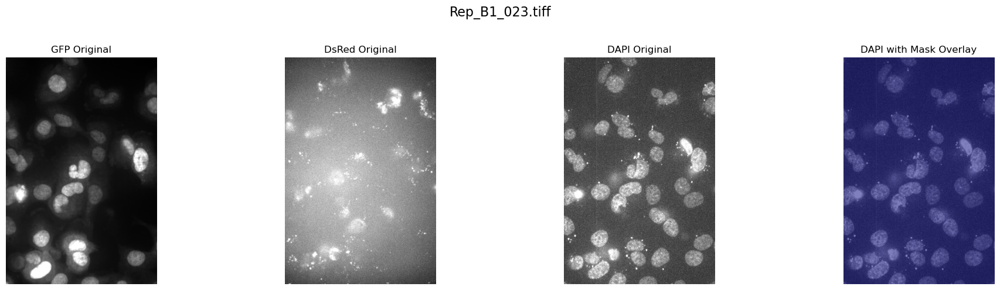

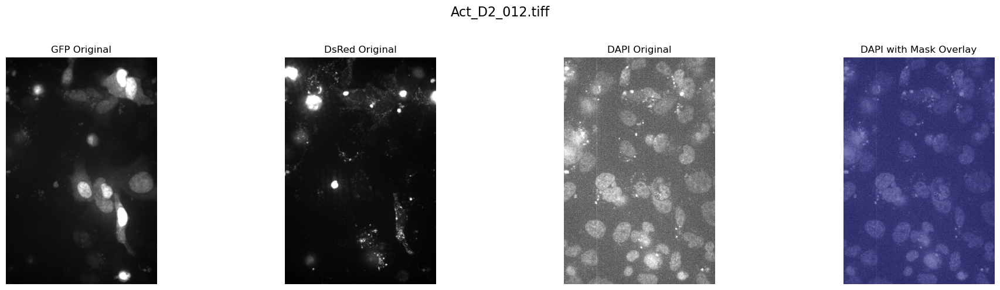

In [74]:
import random
import os
import tifffile
import matplotlib.pyplot as plt
import numpy as np

def visualize_random_samples_all_channels(gfp_dir, dsred_dir, dapi_dir, mask_dir, num_samples=5, seed=None):
    """
    Randomly selects and visualizes TIFF images for three channels along with a mask overlay.
    
    The layout is as follows (left to right):
      - GFP original
      - DsRed original
      - DAPI original
      - DAPI with mask overlay
    
    Parameters:
      gfp_dir (str): Directory containing the GFP channel TIFF images.
      dsred_dir (str): Directory containing the DsRed channel TIFF images.
      dapi_dir (str): Directory containing the DAPI channel TIFF images.
      mask_dir (str): Directory containing the DAPI mask TIFFs.
      num_samples (int): Number of random samples to visualize.
      seed (int, optional): Seed for reproducibility.
    """
    # Use the DAPI channel as reference for file names
    image_files = [f for f in os.listdir(dapi_dir) 
                   if f.lower().endswith(('.tiff', '.tif')) and '_mask' not in f]
    
    if not image_files:
        print(f"No TIFF files found in {dapi_dir}.")
        return
    
    if seed is not None:
        random.seed(seed)
    num_samples = min(num_samples, len(image_files))
    samples = random.sample(image_files, num_samples)
    
    for img_file in samples:
        base_name = os.path.splitext(img_file)[0]
        mask_filename = base_name + "_mask.tiff"
        mask_path = os.path.join(mask_dir, mask_filename)
        
        if not os.path.exists(mask_path):
            print(f"Mask file {mask_filename} does not exist. Skipping {img_file}.")
            continue
        
        try:
            # Build file paths for each channel
            gfp_path = os.path.join(gfp_dir, img_file)
            dsred_path = os.path.join(dsred_dir, img_file)
            dapi_path = os.path.join(dapi_dir, img_file)
            
            # Check if all required files exist
            if not (os.path.exists(gfp_path) and os.path.exists(dsred_path) and os.path.exists(dapi_path)):
                print(f"One or more channel images missing for {img_file}. Skipping.")
                continue
            
            # Load images and mask
            gfp_img = tifffile.imread(gfp_path)
            dsred_img = tifffile.imread(dsred_path)
            dapi_img = tifffile.imread(dapi_path)
            mask = tifffile.imread(mask_path)
            
            # Function to normalize image for display
            def normalize_image(img):
                if img.ndim == 3:
                    img_disp = img.mean(axis=0)
                else:
                    img_disp = img
                img_disp = img_disp.astype(np.float32)
                img_disp -= img_disp.min()
                if img_disp.max() != 0:
                    img_disp /= img_disp.max()
                return img_disp
            
            gfp_disp = normalize_image(gfp_img)
            dsred_disp = normalize_image(dsred_img)
            dapi_disp = normalize_image(dapi_img)
            
            # Create a figure with 4 subplots
            plt.figure(figsize=(20, 5))
            plt.suptitle(img_file, fontsize=16)
            
            # Panel 1: GFP original
            ax1 = plt.subplot(1, 4, 1)
            ax1.imshow(gfp_disp, cmap='gray')
            ax1.set_title('GFP Original')
            ax1.axis('off')
            
            # Panel 2: DsRed original
            ax2 = plt.subplot(1, 4, 2)
            ax2.imshow(dsred_disp, cmap='gray')
            ax2.set_title('DsRed Original')
            ax2.axis('off')
            
            # Panel 3: DAPI original
            ax3 = plt.subplot(1, 4, 3)
            ax3.imshow(dapi_disp, cmap='gray')
            ax3.set_title('DAPI Original')
            ax3.axis('off')
            
            # Panel 4: DAPI with mask overlay
            ax4 = plt.subplot(1, 4, 4)
            ax4.imshow(dapi_disp, cmap='gray')
            ax4.imshow(mask, cmap='jet', alpha=0.5)  # Overlay the mask
            ax4.set_title('DAPI with Mask Overlay')
            ax4.axis('off')
            
            plt.tight_layout(rect=[0, 0, 1, 0.95])
            plt.show()
            
        except Exception as e:
            print(f"Error visualizing {img_file}: {e}")

# =============================================================================
# Example Usage
# =============================================================================
# Define directories for each channel (update these paths as needed)

gfp_tiff_dir = r"A:\_Ongoing\20250329_Rep\Output\forimage\GFP"
dsred_tiff_dir = r"A:\_Ongoing\20250329_Rep\Output\forimage\DsRed"
dapi_tiff_dir = r"A:\_Ongoing\20250329_Rep\Output\forimage\DAPI"
mask_output_dir = r"A:\_Ongoing\20250329_Rep\Output\mask_final_filtered"

# Visualize random samples (e.g., 2 samples, with a seed for reproducibility)
visualize_random_samples_all_channels(gfp_tiff_dir, dsred_tiff_dir, dapi_tiff_dir, mask_output_dir, num_samples=2, seed=333)

# Summary the data from mask, GFP and DeRed

In [76]:
import os
import numpy as np
import pandas as pd
import tifffile
from tqdm import tqdm

# =============================================================================
# New Extraction Function for the Updated Naming Strategy
# =============================================================================
def extract_info_from_filename_new(filename):
    """
    Extracts group, sample code, and repeat information from a filename following the pattern:
      "Group_Sample_Repeat.ext"
    For example, "Act_A2_008.tiff" yields:
      Group: "Act"
      Sample: "A2"
      Repeat: "008"
    
    Returns:
      A tuple: (Group, Sample, Repeat)
    """
    base = os.path.splitext(filename)[0]
    parts = base.split('_')
    if len(parts) < 3:
        return "Unknown", "Unknown", "Unknown"
    group = parts[0]
    sample_code = parts[1]
    repeat = parts[2]
    return group, sample_code, repeat

# =============================================================================
# Sample Mapping Dictionary (New Naming Strategy)
# =============================================================================
sample_mapping = {
    "A1": "Tile 1",
    "A2": "Tile 2",
    "A3": "Tile 3",
    "A4": "Tile 4",
    "A5": "Tile 5",
    "A6": "Tile 6",
    "B1": "Tile 7",
    "B2": "Tile 8",
    "B3": "Tile 9",
    "B4": "Tile 10",
    "B5": "Tile 11",
    "B6": "Tile 12",
    "C1": "Tile 13",
    "C2": "Tile 14",
    "C3": "LAP*IDR",
    "C4": "LAPIDR",
    "C5": "LIPIDR",
    "C6": "FL",
    "D1": "optLAP*IDR",
    "D2": "old VP16",
    "D3": "old RUNX2CTD",
    "D4": "new VP16",
    "D5": "Halo",
    "D6": "Control"
}

# =============================================================================
# Function: Create Excel Summary from TIFF and Mask Data
# =============================================================================
def create_excel_from_tiff_and_mask_new(dsred_tiff_dir, gfp_tiff_dir, mask_dir, output_excel):
    """
    Processes DsRed TIFF files (with corresponding GFP and mask files) to calculate cell-level intensities.
    For each cell (as determined by the mask), computes the average intensities in the GFP and DsRed channels.
    
    The filename is assumed to follow the pattern "Group_Sample_Repeat.ext" (e.g., "Act_A2_008.tiff").
    Group, Sample, and Repeat are extracted using the new naming strategy.
    A descriptive sample name is added via the sample_mapping dictionary.
    
    The summary is saved as an Excel file.
    """
    # List DsRed TIFF files (excluding any files with "_mask" in the name)
    dsred_files = [f for f in os.listdir(dsred_tiff_dir)
                   if f.lower().endswith(('.tif', '.tiff')) and "_mask" not in f]
    
    if not dsred_files:
        print("No DsRed TIFF files found in", dsred_tiff_dir)
        return
    
    data = []
    for tiff_file in tqdm(dsred_files, desc="Processing TIFF files"):
        dsred_path = os.path.join(dsred_tiff_dir, tiff_file)
        gfp_path = os.path.join(gfp_tiff_dir, tiff_file)
        mask_filename = os.path.splitext(tiff_file)[0] + "_mask.tiff"
        mask_path = os.path.join(mask_dir, mask_filename)
        
        # Verify that the corresponding GFP and mask files exist.
        if not os.path.exists(gfp_path):
            print(f"GFP file not found for {tiff_file}, skipping.")
            continue
        if not os.path.exists(mask_path):
            print(f"Mask file not found for {tiff_file}, skipping.")
            continue
        
        try:
            dsred_img = tifffile.imread(dsred_path)
            gfp_img = tifffile.imread(gfp_path)
            mask_img = tifffile.imread(mask_path)
        except Exception as e:
            print(f"Error reading files for {tiff_file}: {e}")
            continue
        
        # Identify unique cell labels (ignore background 0)
        cell_indices = np.unique(mask_img)
        cell_indices = cell_indices[cell_indices != 0]
        
        # Compute average intensities for each cell
        for cell in cell_indices:
            cell_mask = (mask_img == cell)
            avg_gfp = np.mean(gfp_img[cell_mask])
            avg_dsred = np.mean(dsred_img[cell_mask])
            record = {
                "File Name": tiff_file,
                "Mask Index": cell,
                "GFP_Mean": avg_gfp,
                "DsRed_Mean": avg_dsred
            }
            data.append(record)
    
    # Create DataFrame from the collected records.
    df = pd.DataFrame(data)
    
    # Extract metadata (Group, Sample, Repeat) from the file name using the new extraction function.
    df[['Group', 'Sample', 'Repeat']] = df['File Name'].apply(lambda x: pd.Series(extract_info_from_filename_new(x)))
    
    # Map sample codes to descriptive sample names.
    df["Sample_name"] = df["Sample"].map(sample_mapping)
    
    # Rearrange columns.
    df = df[['Group', 'Sample', 'Sample_name', 'Repeat', 'Mask Index', 'GFP_Mean', 'DsRed_Mean']]
    
    # Save the summary to an Excel file.
    df.to_excel(output_excel, index=False)
    print("Excel summary saved to:", output_excel)

# =============================================================================
# Example Usage
# =============================================================================
# Adjust these paths as needed for your data.
dsred_tiff_dir = r"A:\_Ongoing\20250329_Rep\Output\DsRed_TIFF"
gfp_tiff_dir   = r"A:\_Ongoing\20250329_Rep\Output\GFP_TIFF"
mask_dir       = r"A:\_Ongoing\20250329_Rep\Output\mask_final_filtered"
output_excel   = r"A:\_Ongoing\20250329_Rep\Output\summary_compare_renamed.xlsx"

create_excel_from_tiff_and_mask_new(dsred_tiff_dir, gfp_tiff_dir, mask_dir, output_excel)


Processing TIFF files: 100%|██████████| 3600/3600 [00:38<00:00, 92.70it/s]


Excel summary saved to: A:\_Ongoing\20250329_Rep\Output\summary_compare_renamed.xlsx


# Plot Histgram

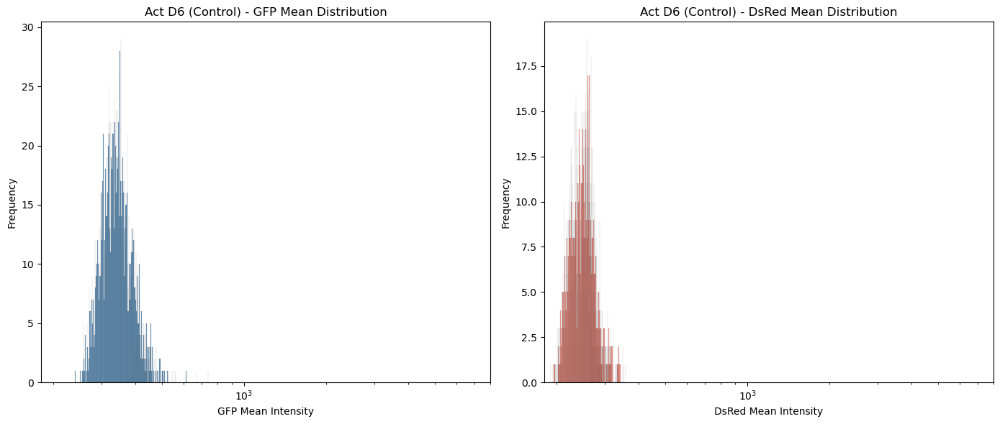

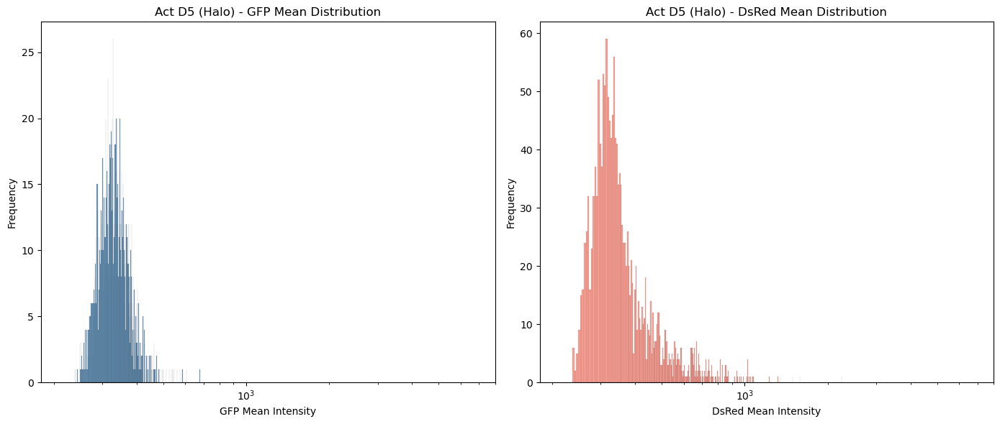

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_histograms_for_sample(df, group, sample_code):
    """
    Plots histograms of GFP_Mean and DsRed_Mean for a given group and sample code.
    The plot includes two subplots (one for each channel) with a log-scaled x-axis,
    using 500 bins and no KDE overlay.
    
    Parameters:
      df (DataFrame): The DataFrame containing the summary data.
      group (str): The group identifier (e.g., "Act" or "Rep").
      sample_code (str): The sample code (e.g., "A1", "A2") to filter by.
    """
    # Filter for the selected group and sample code.
    df_sample = df[(df["Group"] == group) & (df["Sample"] == sample_code)]
    if df_sample.empty:
        print(f"No data found for {group} {sample_code}.")
        return
    
    # Retrieve the descriptive sample name (if available)
    sample_name = df_sample["Sample_name"].iloc[0] if "Sample_name" in df_sample.columns else sample_code
    
    # Create a figure with two subplots: one for GFP and one for DsRed.
    plt.figure(figsize=(14, 6))
    
    # GFP histogram
    ax1 = plt.subplot(1, 2, 1)
    sns.histplot(df_sample["GFP_Mean"], bins=500, kde=False, color="steelblue", ax=ax1)
    ax1.set_title(f"{group} {sample_code} ({sample_name}) - GFP Mean Distribution")
    ax1.set_xlabel("GFP Mean Intensity")
    ax1.set_ylabel("Frequency")
    ax1.set_xscale("log")
    ax1.set_xlim(180, 8000)
    
    # DsRed histogram
    ax2 = plt.subplot(1, 2, 2)
    sns.histplot(df_sample["DsRed_Mean"], bins=500, kde=False, color="salmon", ax=ax2)
    ax2.set_title(f"{group} {sample_code} ({sample_name}) - DsRed Mean Distribution")
    ax2.set_xlabel("DsRed Mean Intensity")
    ax2.set_ylabel("Frequency")
    ax2.set_xscale("log")
    ax2.set_xlim(180, 8000)
    
    plt.tight_layout()
    plt.show()

# -----------------------------
# Example Usage
# -----------------------------
input_excel = r"A:\_Ongoing\20250329_Rep\Output\summary_renamed.xlsx"
df = pd.read_excel(input_excel)

# To plot Act group A1:
plot_histograms_for_sample(df, "Act", "D6")

# To plot Rep group A2 (separately from Act A2):
plot_histograms_for_sample(df, "Act", "D5")



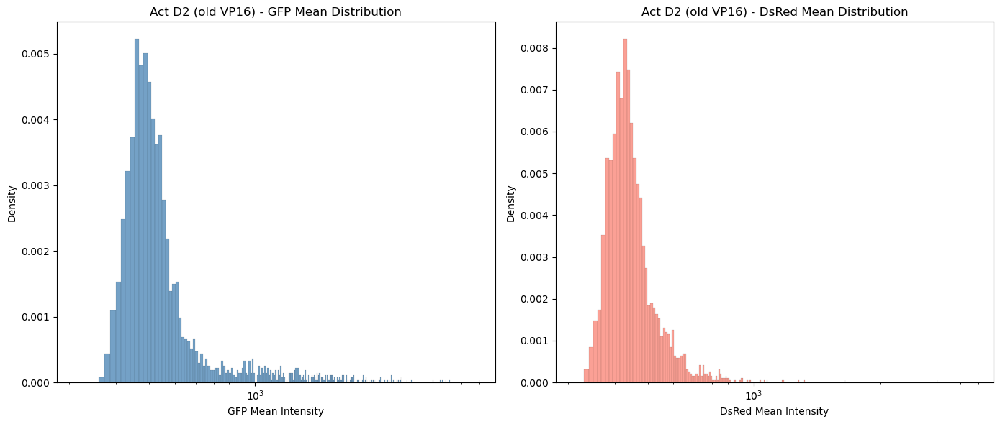

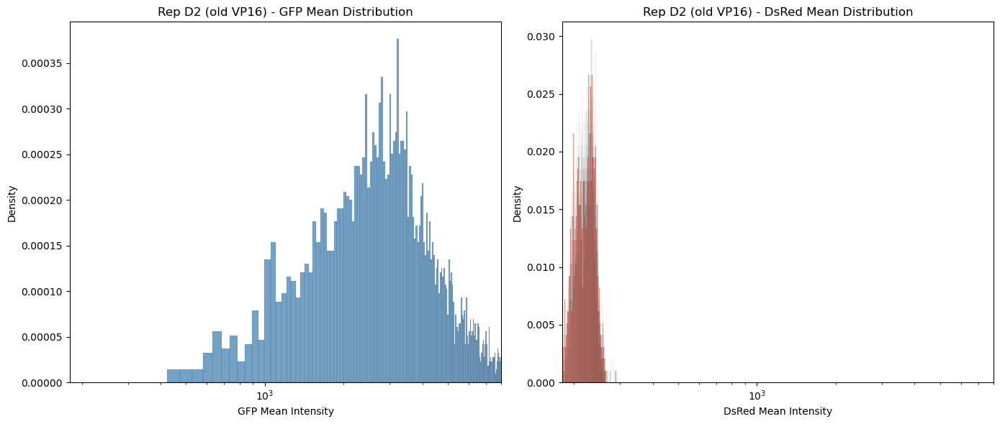

In [95]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_histograms_for_sample(df, group, sample_code):
    """
    Plots histograms of GFP_Mean and DsRed_Mean for a given group and sample code.
    The plot includes two subplots (one for each channel) with a log-scaled x-axis,
    using 500 bins and no KDE overlay.
    
    Parameters:
      df (DataFrame): The DataFrame containing the summary data.
      group (str): The group identifier (e.g., "Act" or "Rep").
      sample_code (str): The sample code (e.g., "A1", "A2") to filter by.
    """
    # Filter for the selected group and sample code.
    df_sample = df[(df["Group"] == group) & (df["Sample"] == sample_code)]
    if df_sample.empty:
        print(f"No data found for {group} {sample_code}.")
        return
    
    # Retrieve the descriptive sample name (if available)
    sample_name = df_sample["Sample_name"].iloc[0] if "Sample_name" in df_sample.columns else sample_code
    
    # Create a figure with two subplots: one for GFP and one for DsRed.
    plt.figure(figsize=(14, 6))
    
    # GFP histogram
    ax1 = plt.subplot(1, 2, 1)
    sns.histplot(df_sample["GFP_Mean"], bins=500, kde=False, color="steelblue", ax=ax1, stat='density')
    ax1.set_title(f"{group} {sample_code} ({sample_name}) - GFP Mean Distribution")
    ax1.set_xlabel("GFP Mean Intensity")
    ax1.set_ylabel("Density")
    ax1.set_xscale("log")
    ax1.set_xlim(180, 8000)
    
    # DsRed histogram
    ax2 = plt.subplot(1, 2, 2)
    sns.histplot(df_sample["DsRed_Mean"], bins=500, kde=False, color="salmon", ax=ax2,stat='density')
    ax2.set_title(f"{group} {sample_code} ({sample_name}) - DsRed Mean Distribution")
    ax2.set_xlabel("DsRed Mean Intensity")
    ax2.set_ylabel("Density")
    ax2.set_xscale("log")
    ax2.set_xlim(180, 8000)
    
    plt.tight_layout()
    plt.show()

# -----------------------------
# Example Usage
# -----------------------------
input_excel = r"A:\_Ongoing\20250329_Rep\Output\summary_renamed.xlsx"
df = pd.read_excel(input_excel)

# To plot Act group A1:
plot_histograms_for_sample(df, "Act", "D2")

# To plot Rep group A2 (separately from Act A2):
plot_histograms_for_sample(df, "Rep", "D2")


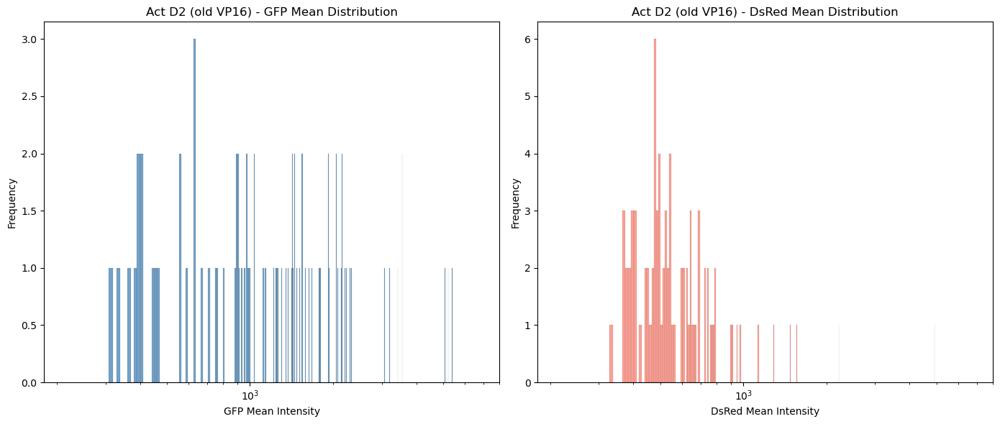

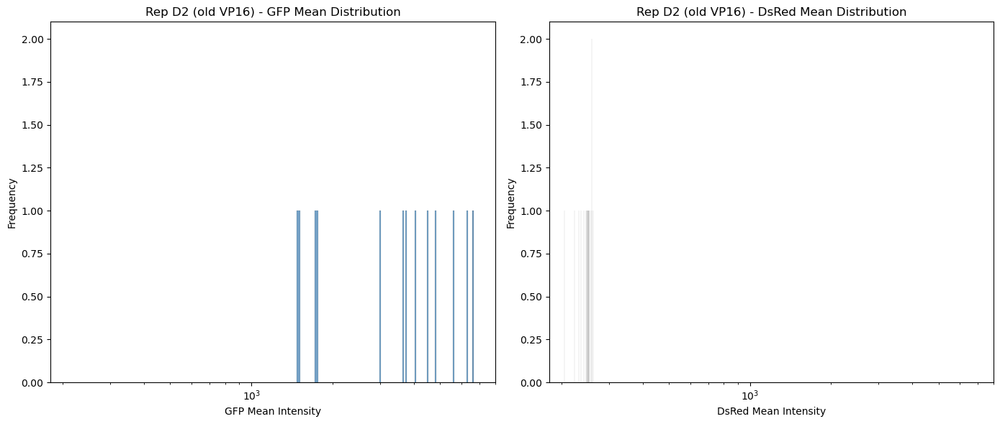

In [91]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_histograms_for_sample(df, group, sample_code):
    """
    Plots histograms of GFP_Mean and DsRed_Mean for a given group and sample code.
    The plot includes two subplots (one for each channel) with a log-scaled x-axis,
    using 500 bins and no KDE overlay.
    
    Parameters:
      df (DataFrame): The DataFrame containing the summary data.
      group (str): The group identifier (e.g., "Act" or "Rep").
      sample_code (str): The sample code (e.g., "A1", "A2") to filter by.
    """
    # Filter for the selected group and sample code.
    df_sample = df[(df["Group"] == group) & (df["Sample"] == sample_code)]
    if df_sample.empty:
        print(f"No data found for {group} {sample_code}.")
        return
    
    # Retrieve the descriptive sample name (if available)
    sample_name = df_sample["Sample_name"].iloc[0] if "Sample_name" in df_sample.columns else sample_code
    
    # Create a figure with two subplots: one for GFP and one for DsRed.
    plt.figure(figsize=(14, 6))
    
    # GFP histogram
    ax1 = plt.subplot(1, 2, 1)
    sns.histplot(df_sample["GFP_Mean"], bins=500, kde=False, color="steelblue", ax=ax1)
    ax1.set_title(f"{group} {sample_code} ({sample_name}) - GFP Mean Distribution")
    ax1.set_xlabel("GFP Mean Intensity")
    ax1.set_ylabel("Frequency")
    ax1.set_xscale("log")
    ax1.set_xlim(180, 8000)
    
    # DsRed histogram
    ax2 = plt.subplot(1, 2, 2)
    sns.histplot(df_sample["DsRed_Mean"], bins=500, kde=False, color="salmon", ax=ax2)
    ax2.set_title(f"{group} {sample_code} ({sample_name}) - DsRed Mean Distribution")
    ax2.set_xlabel("DsRed Mean Intensity")
    ax2.set_ylabel("Frequency")
    ax2.set_xscale("log")
    ax2.set_xlim(180, 8000)
    
    plt.tight_layout()
    plt.show()

# -----------------------------
# Example Usage
# -----------------------------
input_excel = r"A:\_Ongoing\20250329_Rep\Output\summary_compare_renamed.xlsx"
df = pd.read_excel(input_excel)

# To plot Act group A1:
plot_histograms_for_sample(df, "Act", "D2")

# To plot Rep group A2 (separately from Act A2):
plot_histograms_for_sample(df, "Rep", "D2")

# compare two group at he same his plot

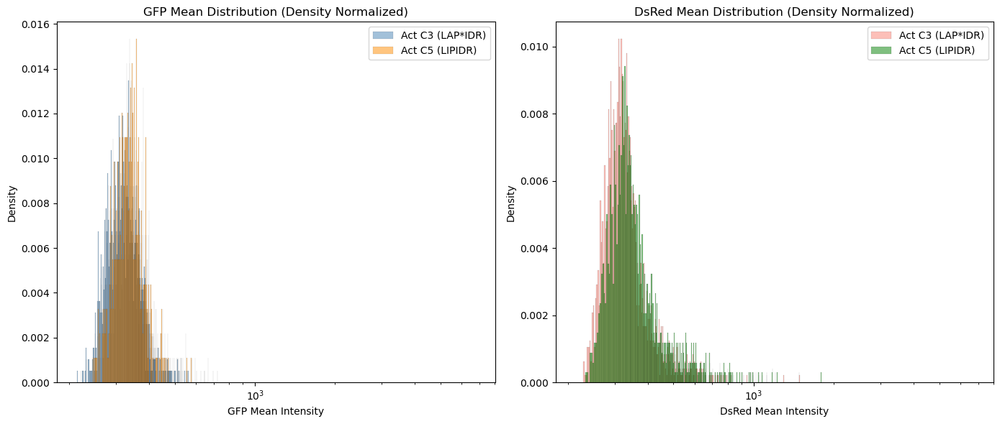

In [101]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_histograms_for_two_samples_comparable(df, group1, sample_code1, group2, sample_code2, x_min, x_max):
    """
    Overlays histograms for GFP_Mean and DsRed_Mean for two given samples specified by group and sample code.
    The histograms are normalized to density so that the highest peaks are comparable,
    allowing you to focus on the differences in distribution shapes.
    
    The x-axis is set to a log scale, with limits provided by x_min and x_max.
    
    Parameters:
      df (DataFrame): The DataFrame containing the summary data.
      group1 (str): The group for the first sample (e.g., "Act" or "Rep").
      sample_code1 (str): The sample code for the first sample (e.g., "A1", "A2").
      group2 (str): The group for the second sample.
      sample_code2 (str): The sample code for the second sample.
      x_min (int/float): Minimum x-axis limit.
      x_max (int/float): Maximum x-axis limit.
    """
    # Filter the data for each sample using both the "Group" and "Sample" columns.
    df1 = df[(df["Group"] == group1) & (df["Sample"] == sample_code1)]
    df2 = df[(df["Group"] == group2) & (df["Sample"] == sample_code2)]
    
    if df1.empty:
        print(f"No data found for {group1} {sample_code1}.")
        return
    if df2.empty:
        print(f"No data found for {group2} {sample_code2}.")
        return
    
    # Retrieve descriptive sample names if available.
    sample_name1 = df1["Sample_name"].iloc[0] if "Sample_name" in df1.columns else sample_code1
    sample_name2 = df2["Sample_name"].iloc[0] if "Sample_name" in df2.columns else sample_code2
    
    # Create a figure with two subplots: one for GFP_Mean and one for DsRed_Mean.
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    # Plot for GFP_Mean using density normalization.
    sns.histplot(
        df1["GFP_Mean"], bins=500, kde=False, color="steelblue", alpha=0.5, 
        ax=axes[0], label=f"{group1} {sample_code1} ({sample_name1})", stat="density"
    )
    sns.histplot(
        df2["GFP_Mean"], bins=500, kde=False, color="darkorange", alpha=0.5, 
        ax=axes[0], label=f"{group2} {sample_code2} ({sample_name2})", stat="density"
    )
    axes[0].set_title("GFP Mean Distribution (Density Normalized)")
    axes[0].set_xlabel("GFP Mean Intensity")
    axes[0].set_ylabel("Density")
    axes[0].set_xscale("log")
    axes[0].set_xlim(x_min, x_max)
    axes[0].legend()
    
    # Plot for DsRed_Mean using density normalization.
    sns.histplot(
        df1["DsRed_Mean"], bins=500, kde=False, color="salmon", alpha=0.5, 
        ax=axes[1], label=f"{group1} {sample_code1} ({sample_name1})", stat="density"
    )
    sns.histplot(
        df2["DsRed_Mean"], bins=500, kde=False, color="green", alpha=0.5, 
        ax=axes[1], label=f"{group2} {sample_code2} ({sample_name2})", stat="density"
    )
    axes[1].set_title("DsRed Mean Distribution (Density Normalized)")
    axes[1].set_xlabel("DsRed Mean Intensity")
    axes[1].set_ylabel("Density")
    axes[1].set_xscale("log")
    axes[1].set_xlim(x_min, x_max)
    axes[1].legend()
    
    plt.tight_layout()
    plt.show()

# -----------------------------
# Example Usage:
# -----------------------------
input_excel = r"A:\_Ongoing\20250329_Rep\Output\summary_renamed.xlsx"
df = pd.read_excel(input_excel)

# For example, to compare Act A1 vs. Rep A2 with x-axis limits from 180 to 8000:
plot_histograms_for_two_samples_comparable(df, "Act", "C3", "Act", "C5", x_min=180, x_max=8000)


# base on Blank sample, filter out untransfected cell and delet the background

In [ ]:
import os
import numpy as np
import pandas as pd

# -----------------------------
# PARAMETERS & FILE PATHS
# -----------------------------
input_excel = r"A:\_Ongoing\20250329_Rep\Output\summary_renamed.xlsx"  # Original summary file with all cells
output_excel = r"A:\_Ongoing\20250329_Rep\Output\summary_filtered_blank_D5_D6.xlsx"  # New output file

# Define control sample codes:
# For DsRed filtering, use D5 (blank: only DsRed transfection)
# For GFP background control, use D6 (should remain unchanged)
blank_code = "D6"  # for DsRed threshold
control_code = "D6"  # for GFP background subtraction

# -----------------------------
# READ DATA
# -----------------------------
df = pd.read_excel(input_excel)

# -----------------------------
# Separate Data by Group
# -----------------------------
df_act = df[df["Group"] == "Act"]
df_rep = df[df["Group"] == "Rep"]

# -----------------------------
# Compute DsRed Threshold from Blank (D5) for Each Group
# -----------------------------
# Act group
df_act_blank = df_act[df_act["Sample"] == blank_code]
if df_act_blank.empty:
    print(f"No Act blank data found (sample code {blank_code}).")
    threshold_act = np.nan
else:
    threshold_act = np.percentile(df_act_blank["DsRed_Mean"].dropna(), 99.99)
    print(f"Act group: 99.99th percentile of DsRed_Mean in Act blank (sample {blank_code}) = {threshold_act}")

# Rep group
df_rep_blank = df_rep[df_rep["Sample"] == blank_code]
if df_rep_blank.empty:
    print(f"No Rep blank data found (sample code {blank_code}).")
    threshold_rep = np.nan
else:
    threshold_rep = np.percentile(df_rep_blank["DsRed_Mean"].dropna(), 99.99)
    print(f"Rep group: 99.99th percentile of DsRed_Mean in Rep blank (sample {blank_code}) = {threshold_rep}")

# -----------------------------
# Filter Experimental Cells (Samples other than Blank and control) Based on DsRed Threshold
# -----------------------------
# Exclude control samples D5 and D6 from the experimental data.
df_act_exp = df_act[~df_act["Sample"].isin([blank_code, control_code])]
df_rep_exp = df_rep[~df_rep["Sample"].isin([blank_code, control_code])]

# Apply threshold filter on DsRed intensity.
if not np.isnan(threshold_act):
    df_act_exp_filtered = df_act_exp[df_act_exp["DsRed_Mean"] >= threshold_act]
else:
    df_act_exp_filtered = df_act_exp.copy()

if not np.isnan(threshold_rep):
    df_rep_exp_filtered = df_rep_exp[df_rep_exp["DsRed_Mean"] >= threshold_rep]
else:
    df_rep_exp_filtered = df_rep_exp.copy()

# -----------------------------
# Compute GFP Background from D6 for Each Group and Subtract it from Experimental Cells
# -----------------------------
# For Act group normalization using D6:
df_act_control = df_act[df_act["Sample"] == control_code]
if df_act_control.empty:
    print(f"No Act control data found (sample code {control_code}).")
    gfp_control_act = np.nan
else:
    gfp_control_act = np.mean(df_act_control["GFP_Mean"].dropna())
    print(f"Act group: Mean GFP intensity in D6 (control) = {gfp_control_act}")

# For Rep group normalization using D6:
df_rep_control = df_rep[df_rep["Sample"] == control_code]
if df_rep_control.empty:
    print(f"No Rep control data found (sample code {control_code}).")
    gfp_control_rep = np.nan
else:
    gfp_control_rep = np.mean(df_rep_control["GFP_Mean"].dropna())
    print(f"Rep group: Mean GFP intensity in D6 (control) = {gfp_control_rep}")

# Subtract the GFP control intensity from each experimental cell's GFP intensity.
if not np.isnan(gfp_control_act):
    df_act_exp_filtered.loc[:, "GFP_Mean"] = df_act_exp_filtered["GFP_Mean"] - gfp_control_act
if not np.isnan(gfp_control_rep):
    df_rep_exp_filtered.loc[:, "GFP_Mean"] = df_rep_exp_filtered["GFP_Mean"] - gfp_control_rep

# -----------------------------
# Combine Filtered Experimental Data from Both Groups
# -----------------------------
df_filtered = pd.concat([df_act_exp_filtered, df_rep_exp_filtered], ignore_index=True)

# -----------------------------
# Print Summary Statistics
# -----------------------------
print("\nAct group: Total experimental cells =", df_act_exp.shape[0],
      ", Passed =", df_act_exp_filtered.shape[0],
      ", Filtered out =", df_act_exp.shape[0] - df_act_exp_filtered.shape[0])
print("Rep group: Total experimental cells =", df_rep_exp.shape[0],
      ", Passed =", df_rep_exp_filtered.shape[0],
      ", Filtered out =", df_rep_exp.shape[0] - df_rep_exp_filtered.shape[0])

# -----------------------------
# SAVE THE NEW SUMMARY TO EXCEL
# -----------------------------
df_filtered.to_excel(output_excel, index=False)
print("\nNew summary filtered by DsRed blank (D5) and GFP background subtraction (D6) saved to:", output_excel)


Act group: 99.99th percentile of DsRed_Mean in Act blank (sample D6) = 355.92134236815895
Rep group: 99.99th percentile of DsRed_Mean in Rep blank (sample D6) = 288.92913077615196
Act group: Mean GFP intensity in D6 (control) = 348.3438831210229
Rep group: Mean GFP intensity in D6 (control) = 2547.7467095429333

Act group: Total experimental cells = 34902 , Passed = 15578 , Filtered out = 19324
Rep group: Total experimental cells = 78717 , Passed = 339 , Filtered out = 78378

New summary filtered by DsRed blank (D5) and GFP background subtraction (D6) saved to: A:\_Ongoing\20250329_Rep\Output\summary_filtered_blank_D5_D6.xlsx


# plot Histogram plot to check the intensity for each cells after filter out cells and background

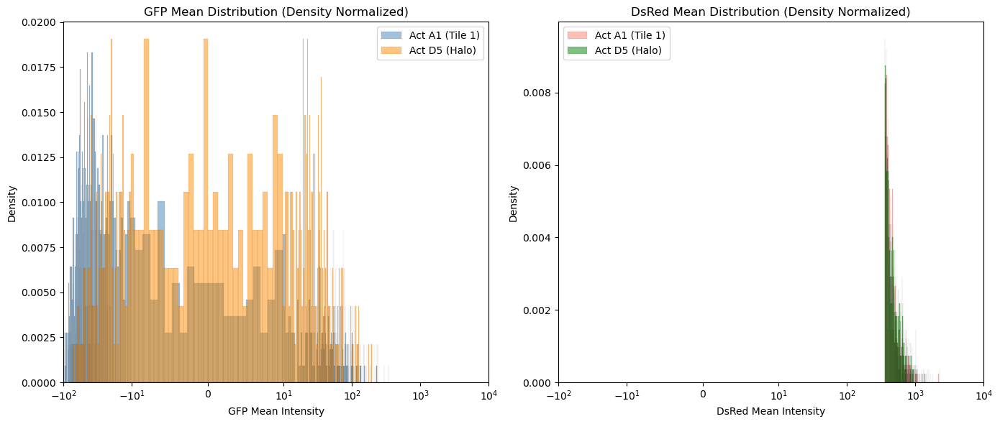

In [153]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_histograms_for_two_samples_comparable_symlog(df, group1, sample_code1, group2, sample_code2, x_min, x_max, linthresh=10):
    """
    Overlays histograms for GFP_Mean and DsRed_Mean for two given samples specified by group and sample code.
    Histograms are normalized to density so that peaks are comparable, and the x-axis is set to a symlog scale,
    allowing for negative values. The symlog scale uses 'linthresh' to define the linear range around zero.
    
    Parameters:
      df (DataFrame): The DataFrame containing the summary data.
      group1 (str): The group for the first sample (e.g., "Act" or "Rep").
      sample_code1 (str): The sample code for the first sample (e.g., "A1", "A2").
      group2 (str): The group for the second sample.
      sample_code2 (str): The sample code for the second sample.
      x_min (int/float): Minimum x-axis limit.
      x_max (int/float): Maximum x-axis limit.
      linthresh (int/float): The linear threshold for the symlog scale.
    """
    # Filter the data for each sample by both "Group" and "Sample" columns.
    df1 = df[(df["Group"] == group1) & (df["Sample"] == sample_code1)]
    df2 = df[(df["Group"] == group2) & (df["Sample"] == sample_code2)]
    
    if df1.empty:
        print(f"No data found for {group1} {sample_code1}.")
        return
    if df2.empty:
        print(f"No data found for {group2} {sample_code2}.")
        return
    
    # Retrieve descriptive sample names if available.
    sample_name1 = df1["Sample_name"].iloc[0] if "Sample_name" in df1.columns else sample_code1
    sample_name2 = df2["Sample_name"].iloc[0] if "Sample_name" in df2.columns else sample_code2
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    # Plot for GFP_Mean using density normalization.
    sns.histplot(
        df1["GFP_Mean"], bins=500, kde=False, color="steelblue", alpha=0.5, 
        ax=axes[0], label=f"{group1} {sample_code1} ({sample_name1})", stat="density"
    )
    sns.histplot(
        df2["GFP_Mean"], bins=500, kde=False, color="darkorange", alpha=0.5, 
        ax=axes[0], label=f"{group2} {sample_code2} ({sample_name2})", stat="density"
    )
    axes[0].set_title("GFP Mean Distribution (Density Normalized)")
    axes[0].set_xlabel("GFP Mean Intensity")
    axes[0].set_ylabel("Density")
    axes[0].set_xscale("symlog", linthresh=linthresh)
    axes[0].set_xlim(x_min, x_max)
    axes[0].legend()
    
    # Plot for DsRed_Mean using density normalization.
    sns.histplot(
        df1["DsRed_Mean"], bins=500, kde=False, color="salmon", alpha=0.5, 
        ax=axes[1], label=f"{group1} {sample_code1} ({sample_name1})", stat="density"
    )
    sns.histplot(
        df2["DsRed_Mean"], bins=500, kde=False, color="green", alpha=0.5, 
        ax=axes[1], label=f"{group2} {sample_code2} ({sample_name2})", stat="density"
    )
    axes[1].set_title("DsRed Mean Distribution (Density Normalized)")
    axes[1].set_xlabel("DsRed Mean Intensity")
    axes[1].set_ylabel("Density")
    axes[1].set_xscale("symlog", linthresh=linthresh)
    axes[1].set_xlim(x_min, x_max)
    axes[1].legend()
    
    plt.tight_layout()
    plt.show()

# -----------------------------
# Example Usage:
# -----------------------------
input_excel = r"A:\_Ongoing\20250329_Rep\Output\summary_filtered_blank_D5_D6.xlsx"
df = pd.read_excel(input_excel)

# For example, to compare Act A1 vs. Rep A2 with x-axis limits from -100 to 8000, using a linear threshold of 10:
plot_histograms_for_two_samples_comparable_symlog(df, "Act", "A1", "Act", "D5", x_min=-100, x_max=10000, linthresh=10)


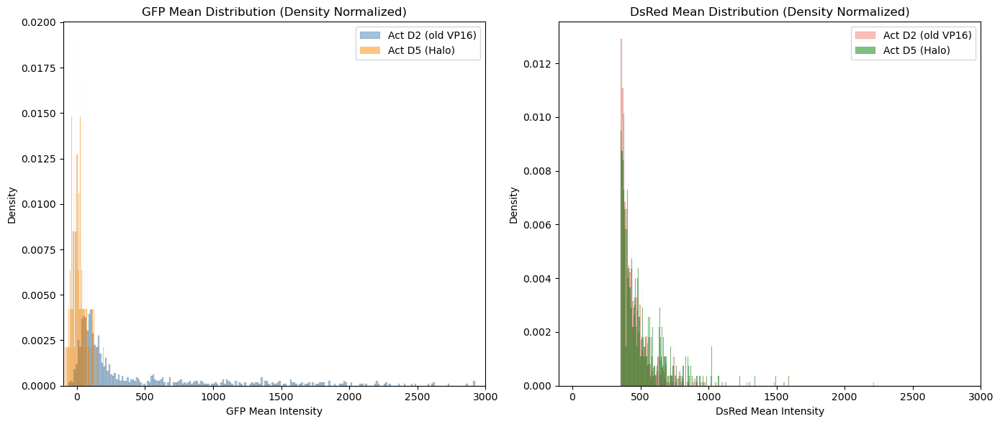

In [118]:
# Linear scale
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_histograms_for_two_samples_comparable_linear(df, group1, sample_code1, group2, sample_code2, x_min, x_max):
    """
    Overlays histograms for GFP_Mean and DsRed_Mean for two given samples specified by group and sample code.
    The histograms are normalized to density so that peaks are comparable.
    
    The x-axis is set to a linear scale (which can show negative values) with limits provided by x_min and x_max.
    
    Parameters:
      df (DataFrame): The DataFrame containing the summary data.
      group1 (str): The group for the first sample (e.g., "Act" or "Rep").
      sample_code1 (str): The sample code for the first sample (e.g., "A1", "A2").
      group2 (str): The group for the second sample.
      sample_code2 (str): The sample code for the second sample.
      x_min (int/float): Minimum x-axis limit.
      x_max (int/float): Maximum x-axis limit.
    """
    # Filter the data for each sample using both "Group" and "Sample" columns.
    df1 = df[(df["Group"] == group1) & (df["Sample"] == sample_code1)]
    df2 = df[(df["Group"] == group2) & (df["Sample"] == sample_code2)]
    
    if df1.empty:
        print(f"No data found for {group1} {sample_code1}.")
        return
    if df2.empty:
        print(f"No data found for {group2} {sample_code2}.")
        return
    
    # Retrieve descriptive sample names if available.
    sample_name1 = df1["Sample_name"].iloc[0] if "Sample_name" in df1.columns else sample_code1
    sample_name2 = df2["Sample_name"].iloc[0] if "Sample_name" in df2.columns else sample_code2
    
    # Create a figure with two subplots: one for GFP_Mean and one for DsRed_Mean.
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    # Plot for GFP_Mean using density normalization.
    sns.histplot(
        df1["GFP_Mean"], bins=500, kde=False, color="steelblue", alpha=0.5, 
        ax=axes[0], label=f"{group1} {sample_code1} ({sample_name1})", stat="density"
    )
    sns.histplot(
        df2["GFP_Mean"], bins=500, kde=False, color="darkorange", alpha=0.5, 
        ax=axes[0], label=f"{group2} {sample_code2} ({sample_name2})", stat="density"
    )
    axes[0].set_title("GFP Mean Distribution (Density Normalized)")
    axes[0].set_xlabel("GFP Mean Intensity")
    axes[0].set_ylabel("Density")
    # Linear scale is default; explicitly setting for clarity.
    axes[0].set_xscale("linear")
    axes[0].set_xlim(x_min, x_max)
    axes[0].legend()
    
    # Plot for DsRed_Mean using density normalization.
    sns.histplot(
        df1["DsRed_Mean"], bins=500, kde=False, color="salmon", alpha=0.5, 
        ax=axes[1], label=f"{group1} {sample_code1} ({sample_name1})", stat="density"
    )
    sns.histplot(
        df2["DsRed_Mean"], bins=500, kde=False, color="green", alpha=0.5, 
        ax=axes[1], label=f"{group2} {sample_code2} ({sample_name2})", stat="density"
    )
    axes[1].set_title("DsRed Mean Distribution (Density Normalized)")
    axes[1].set_xlabel("DsRed Mean Intensity")
    axes[1].set_ylabel("Density")
    axes[1].set_xscale("linear")
    axes[1].set_xlim(x_min, x_max)
    axes[1].legend()
    
    plt.tight_layout()
    plt.show()

# -----------------------------
# Example Usage:
# -----------------------------
input_excel = r"A:\_Ongoing\20250329_Rep\Output\summary_filtered_blank_D5_D6.xlsx"
df = pd.read_excel(input_excel)

# For example, to compare Act A1 vs. Rep A2 with x-axis limits from -100 to 8000:
plot_histograms_for_two_samples_comparable_linear(df, "Act", "D2", "Act", "D5", x_min=-100, x_max=3000)

# all together

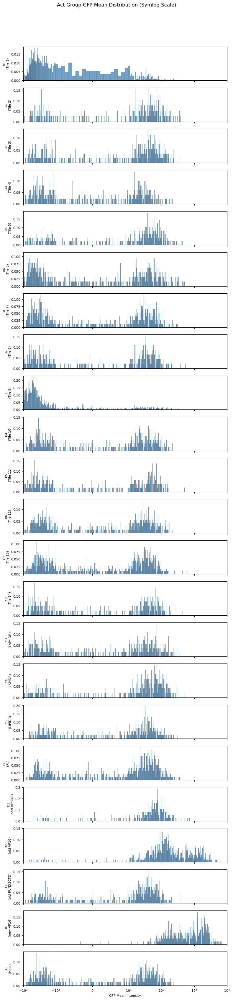

In [155]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

def natural_sort_key(s):
    """
    Returns a tuple for natural sorting of strings like 'A1', 'A2', 'D5'.
    """
    m = re.match(r"([A-Za-z]+)(\d+)", s)
    if m:
        return (m.group(1), int(m.group(2)))
    else:
        return (s, 0)

def plot_all_samples_in_group_symlog_gfp(df, group, x_min, x_max, bins=500, linthresh=10):
    """
    Plots a tall figure with one row per sample in the specified group, showing only the GFP channel.
    The x-axis is set to a symlog scale (to handle negative values) with a linear threshold (linthresh),
    and all subplots share the same x-axis limits.
    
    Parameters:
      df (DataFrame): The summary DataFrame containing columns "Group", "Sample", "Sample_name", and "GFP_Mean".
      group (str): The group to plot (e.g. "Act" or "Rep").
      x_min (float): Minimum x-axis limit.
      x_max (float): Maximum x-axis limit.
      bins (int): Number of bins for the histogram.
      linthresh (float): Linear threshold for the symlog scale.
    """
    # Filter data for the specified group.
    df_group = df[df["Group"] == group]
    if df_group.empty:
        print(f"No data found for group {group}.")
        return
    
    # Get unique sample codes and sort them naturally.
    sample_codes = sorted(df_group["Sample"].unique(), key=natural_sort_key)
    n_samples = len(sample_codes)
    
    # Create subplots: one row per sample.
    fig, axes = plt.subplots(n_samples, 1, figsize=(8, 1.5 * n_samples), sharex=True)
    
    # Ensure axes is a list if there's only one sample.
    if n_samples == 1:
        axes = [axes]
    
    # Loop over each sample.
    for i, sample_code in enumerate(sample_codes):
        df_sample = df_group[df_group["Sample"] == sample_code]
        # Retrieve a descriptive name if available.
        sample_name = df_sample["Sample_name"].iloc[0] if "Sample_name" in df_sample.columns else sample_code
        ax = axes[i]
        sns.histplot(df_sample["GFP_Mean"], bins=bins, kde=False, stat="density",
                     color="steelblue", ax=ax)
        ax.set_xlim(x_min, x_max)
        ax.set_xscale("symlog", linthresh=linthresh)
        # Label left-most axis with the sample code and name.
        ax.set_ylabel(f"{sample_code}\n({sample_name})", fontsize=8)
        ax.tick_params(axis="both", labelsize=8)
        # Remove x-label for all but the bottom subplot.
        ax.set_xlabel("")
    
    axes[-1].set_xlabel("GFP Mean Intensity", fontsize=8)
    plt.suptitle(f"{group} Group GFP Mean Distribution (Symlog Scale)", fontsize=12)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# -----------------------------
# Example Usage:
# -----------------------------
input_excel = r"A:\_Ongoing\20250329_Rep\Output\summary_filtered_blank_D5_D6.xlsx"
df = pd.read_excel(input_excel)

# Plot all samples in the "Act" group with x-axis limits from -100 to 8000,
# using 500 bins and a symlog linear threshold of 10.
plot_all_samples_in_group_symlog_gfp(df, group="Act", x_min=-100, x_max=10000, bins=500, linthresh=10)


# for DsRed mask filter

In [ ]:
import os
import pandas as pd

# -----------------------------
# PARAMETERS & FILE PATHS
# -----------------------------
input_excel = r"A:\_Ongoing\20250329_Rep\Output\summary_compare_renamed.xlsx"  # Test summary file
output_excel = r"A:\_Ongoing\20250329_Rep\Output\summary_compare_GFPsubtracted.xlsx"  # New output file

# -----------------------------
# Control GFP Values (from D6)
# -----------------------------
act_control = 348.3438831210229      # Act group: Mean GFP intensity in D6
rep_control = 2547.7467095429333     # Rep group: Mean GFP intensity in D6

# -----------------------------
# READ DATA
# -----------------------------
df = pd.read_excel(input_excel)

# -----------------------------
# Subtract GFP Control for Each Group
# -----------------------------
def subtract_gfp_control(row):
    if row["Group"] == "Act":
        return row["GFP_Mean"] - act_control
    elif row["Group"] == "Rep":
        return row["GFP_Mean"] - rep_control
    else:
        return row["GFP_Mean"]

# Create a new column for adjusted GFP intensity.
df["GFP_Adjusted"] = df.apply(subtract_gfp_control, axis=1)

# -----------------------------
# SAVE THE NEW SUMMARY TO EXCEL
# -----------------------------
df.to_excel(output_excel, index=False)
print("New summary with GFP background subtraction saved to:", output_excel)


New summary with GFP background subtraction saved to: A:\_Ongoing\20250329_Rep\Output\summary_compare_GFPsubtracted.xlsx


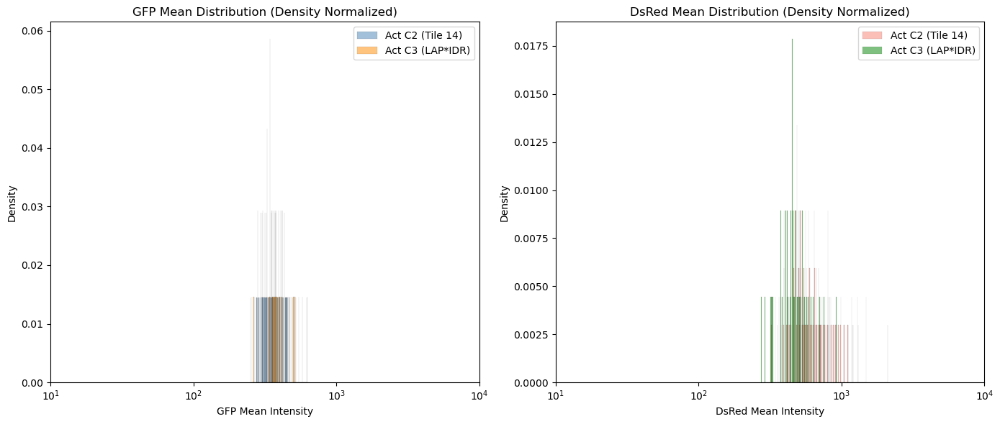

In [146]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_histograms_for_two_samples_comparable_symlog(df, group1, sample_code1, group2, sample_code2, x_min, x_max, linthresh=10):
    """
    Overlays histograms for GFP_Mean and DsRed_Mean for two given samples specified by group and sample code.
    Histograms are normalized to density so that peaks are comparable, and the x-axis is set to a symlog scale,
    allowing for negative values. The symlog scale uses 'linthresh' to define the linear range around zero.
    
    Parameters:
      df (DataFrame): The DataFrame containing the summary data.
      group1 (str): The group for the first sample (e.g., "Act" or "Rep").
      sample_code1 (str): The sample code for the first sample (e.g., "A1", "A2").
      group2 (str): The group for the second sample.
      sample_code2 (str): The sample code for the second sample.
      x_min (int/float): Minimum x-axis limit.
      x_max (int/float): Maximum x-axis limit.
      linthresh (int/float): The linear threshold for the symlog scale.
    """
    # Filter the data for each sample by both "Group" and "Sample" columns.
    df1 = df[(df["Group"] == group1) & (df["Sample"] == sample_code1)]
    df2 = df[(df["Group"] == group2) & (df["Sample"] == sample_code2)]
    
    if df1.empty:
        print(f"No data found for {group1} {sample_code1}.")
        return
    if df2.empty:
        print(f"No data found for {group2} {sample_code2}.")
        return
    
    # Retrieve descriptive sample names if available.
    sample_name1 = df1["Sample_name"].iloc[0] if "Sample_name" in df1.columns else sample_code1
    sample_name2 = df2["Sample_name"].iloc[0] if "Sample_name" in df2.columns else sample_code2
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    # Plot for GFP_Mean using density normalization.
    sns.histplot(
        df1["GFP_Mean"], bins=500, kde=False, color="steelblue", alpha=0.5, 
        ax=axes[0], label=f"{group1} {sample_code1} ({sample_name1})", stat="density"
    )
    sns.histplot(
        df2["GFP_Mean"], bins=500, kde=False, color="darkorange", alpha=0.5, 
        ax=axes[0], label=f"{group2} {sample_code2} ({sample_name2})", stat="density"
    )
    axes[0].set_title("GFP Mean Distribution (Density Normalized)")
    axes[0].set_xlabel("GFP Mean Intensity")
    axes[0].set_ylabel("Density")
    axes[0].set_xscale("symlog", linthresh=linthresh)
    axes[0].set_xlim(x_min, x_max)
    axes[0].legend()
    
    # Plot for DsRed_Mean using density normalization.
    sns.histplot(
        df1["DsRed_Mean"], bins=500, kde=False, color="salmon", alpha=0.5, 
        ax=axes[1], label=f"{group1} {sample_code1} ({sample_name1})", stat="density"
    )
    sns.histplot(
        df2["DsRed_Mean"], bins=500, kde=False, color="green", alpha=0.5, 
        ax=axes[1], label=f"{group2} {sample_code2} ({sample_name2})", stat="density"
    )
    axes[1].set_title("DsRed Mean Distribution (Density Normalized)")
    axes[1].set_xlabel("DsRed Mean Intensity")
    axes[1].set_ylabel("Density")
    axes[1].set_xscale("symlog", linthresh=linthresh)
    axes[1].set_xlim(x_min, x_max)
    axes[1].legend()
    
    plt.tight_layout()
    plt.show()

# -----------------------------
# Example Usage:
# -----------------------------
input_excel = r"A:\_Ongoing\20250329_Rep\Output\summary_compare_GFPsubtracted.xlsx"
df = pd.read_excel(input_excel)

# For example, to compare Act A1 vs. Rep A2 with x-axis limits from -100 to 8000, using a linear threshold of 10:
plot_histograms_for_two_samples_comparable_symlog(df, "Act", "C2", "Act", "C3", x_min=10, x_max=10000, linthresh=10)

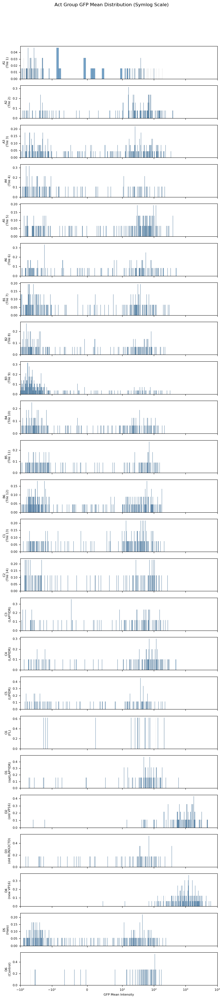

In [157]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

def natural_sort_key(s):
    """
    Returns a tuple for natural sorting of strings like 'A1', 'A2', 'D5'.
    """
    m = re.match(r"([A-Za-z]+)(\d+)", s)
    if m:
        return (m.group(1), int(m.group(2)))
    else:
        return (s, 0)

def plot_all_samples_in_group_symlog_gfp(df, group, x_min, x_max, bins=500, linthresh=10):
    """
    Plots a tall figure with one row per sample in the specified group, showing only the GFP channel.
    The x-axis is set to a symlog scale (to handle negative values) with a linear threshold (linthresh),
    and all subplots share the same x-axis limits.
    
    Parameters:
      df (DataFrame): The summary DataFrame containing columns "Group", "Sample", "Sample_name", and "GFP_Mean".
      group (str): The group to plot (e.g. "Act" or "Rep").
      x_min (float): Minimum x-axis limit.
      x_max (float): Maximum x-axis limit.
      bins (int): Number of bins for the histogram.
      linthresh (float): Linear threshold for the symlog scale.
    """
    # Filter data for the specified group.
    df_group = df[df["Group"] == group]
    if df_group.empty:
        print(f"No data found for group {group}.")
        return
    
    # Get unique sample codes and sort them naturally.
    sample_codes = sorted(df_group["Sample"].unique(), key=natural_sort_key)
    n_samples = len(sample_codes)
    
    # Create subplots: one row per sample.
    fig, axes = plt.subplots(n_samples, 1, figsize=(8, 1.5 * n_samples), sharex=True)
    
    # Ensure axes is a list if there's only one sample.
    if n_samples == 1:
        axes = [axes]
    
    # Loop over each sample.
    for i, sample_code in enumerate(sample_codes):
        df_sample = df_group[df_group["Sample"] == sample_code]
        # Retrieve a descriptive name if available.
        sample_name = df_sample["Sample_name"].iloc[0] if "Sample_name" in df_sample.columns else sample_code
        ax = axes[i]
        sns.histplot(df_sample["GFP_Adjusted"], bins=bins, kde=False, stat="density",
                     color="steelblue", ax=ax)
        ax.set_xlim(x_min, x_max)
        ax.set_xscale("symlog", linthresh=linthresh)
        # Label left-most axis with the sample code and name.
        ax.set_ylabel(f"{sample_code}\n({sample_name})", fontsize=8)
        ax.tick_params(axis="both", labelsize=8)
        # Remove x-label for all but the bottom subplot.
        ax.set_xlabel("")
    
    axes[-1].set_xlabel("GFP Mean Intensity", fontsize=8)
    plt.suptitle(f"{group} Group GFP Mean Distribution (Symlog Scale)", fontsize=12)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# -----------------------------
# Example Usage:
# -----------------------------
input_excel = r"A:\_Ongoing\20250329_Rep\Output\summary_compare_GFPsubtracted.xlsx"
df = pd.read_excel(input_excel)

# Plot all samples in the "Act" group with x-axis limits from -100 to 8000,
# using 500 bins and a symlog linear threshold of 10.
plot_all_samples_in_group_symlog_gfp(df, group="Act", x_min=-100, x_max=10000, bins=500, linthresh=10)